# Linear Regression in Apache Spark 

In [2]:
import findspark
findspark.init()
import pyspark

from pyspark.ml.regression import LinearRegression
from pyspark.ml.linalg import Vectors
from pyspark.sql import SparkSession
from pyspark.mllib.regression import LabeledPoint, LinearRegressionWithSGD

import numpy as np

import matplotlib.pyplot as plt 
%matplotlib inline

#from __future__ import print_function

In [3]:
# Create a SparkSession. No need to create SparkContext
# You automatically get it as part of the SparkSession
spark = SparkSession.builder \
     .master("local") \
     .appName("LinearRegTest") \
     .config("spark.some.config.option", "some-value") \
     .getOrCreate()

# Get the underlying sparkContext object
sc = spark.sparkContext

print('Apache spark version:' + spark.version)


Apache spark version:2.3.2


In [4]:

# Contrived dataset
dataset = [(1, 1), (2, 3), (4, 3), (3, 2), (5, 5)]
#dataset = [(1, 1), (2, 3), (3, 2), (4, 3), (5, 5)]
#dataset = [(1,1),(2,2),(3,3),(4,4),(5,5),(6,6)]

dataset2 = []
xs = []
ys = []

for d in dataset:
    d2 = (d[0], Vectors.dense([d[1]]))
    dataset2.append(d2)
    x = d[0]
    y = d[1]
    xs = xs + [x]
    ys = ys + [y]
    
print(dataset2)    
       

[[1 1]
 [2 3]
 [4 3]
 [3 2]
 [5 5]]


### 1. Modelling using Linear Regression 

In [4]:
# Summarize the model over the training set and print out some metrics
# Print the coefficients and intercept for linear regression
def modelsummary(model):
    import numpy as np
    print ("Note: the last rows are the information for Intercept")
    print ("##","-------------------------------------------------")
    print ("##","  Estimate   |   Std.Error | t Values  |  P-value")
    coef = np.append(list(model.coefficients),model.intercept)
    Summary=model.summary

    try:
        for i in range(len(Summary.pValues)):
            print ("##",'{:10.6f}'.format(coef[i]),\
            '{:10.6f}'.format(Summary.coefficientStandardErrors[i]),\
            '{:8.3f}'.format(Summary.tValues[i]),\
            '{:10.6f}'.format(Summary.pValues[i]))
    except:
           print("No p-Values available for this model")
            
    print ("##",'---')
    print ("##","Mean squared error: % .6f" \
           % Summary.meanSquaredError, ", RMSE: % .6f" \
           % Summary.rootMeanSquaredError )
    print ("##","Multiple R-squared: %f" % Summary.r2, ", \
            Total iterations: %i"% Summary.totalIterations)

In [5]:

def plotPredsAndLabels(predictions, labels, the_title):
    y_preds = list( (predictions.collect()) )
    x_labels = list( (labels.collect()) )

    plt.figure(figsize=(8,5))    
    plt.axis([min(xs)-1, max(xs)+1, min(ys)-1, max(ys)+1])  
    plt.title(the_title)

    # Plot outputs
    plt.scatter(xs, ys, color='blue')
    plt.plot(x_labels, y_preds, 'rx')
    plt.plot(x_labels, y_preds, color='black', linewidth=3)


    print('xs = ', xs)
    print('ys = ', ys)
    print('x_labels = ', x_labels)
    print('y_preds = ' , y_preds)

    plt.xlabel('x values', fontsize=14)
    plt.ylabel('y values', fontsize=14)

    plt.show()

--------------------------------------------------

CHART 1

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


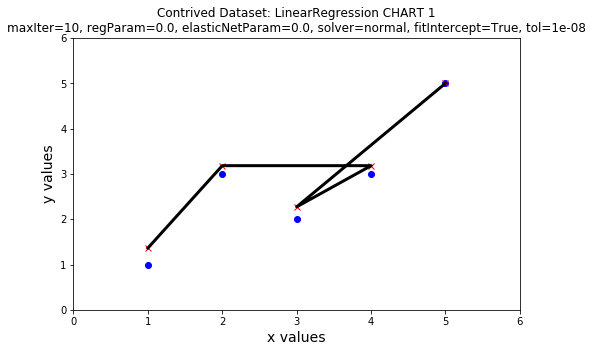

--------------------------------------------------

CHART 2

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


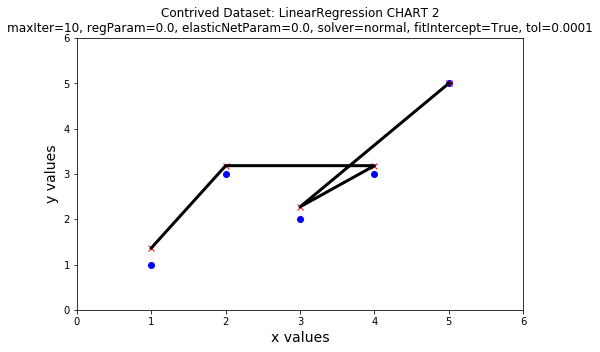

--------------------------------------------------

CHART 3

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


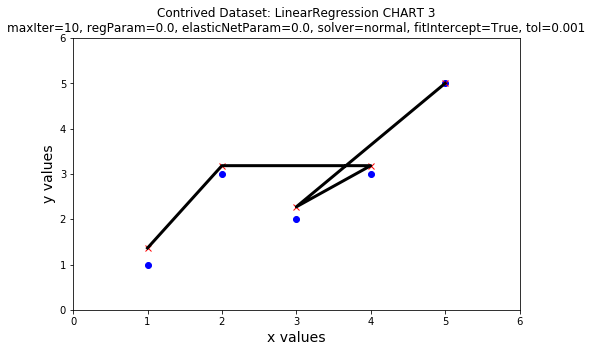

--------------------------------------------------

CHART 4

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


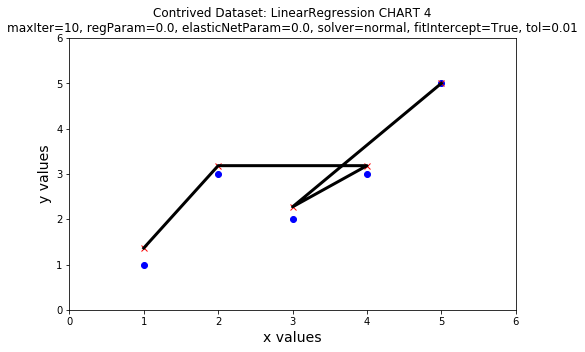

--------------------------------------------------

CHART 5

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


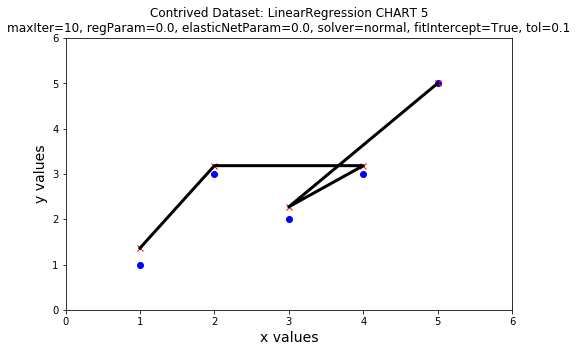

--------------------------------------------------

CHART 6

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


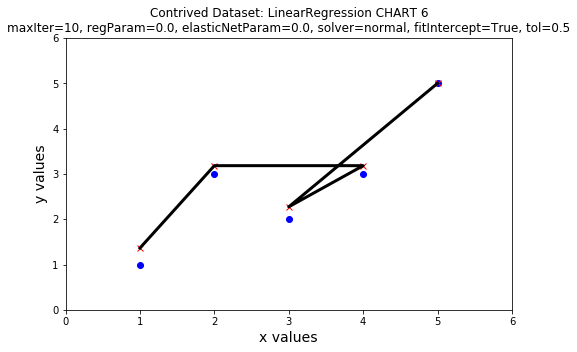

--------------------------------------------------

CHART 7

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


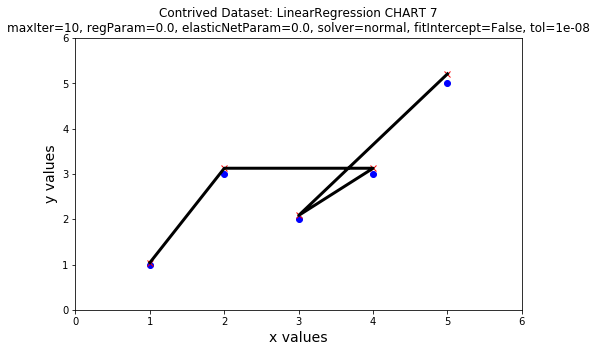

--------------------------------------------------

CHART 8

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


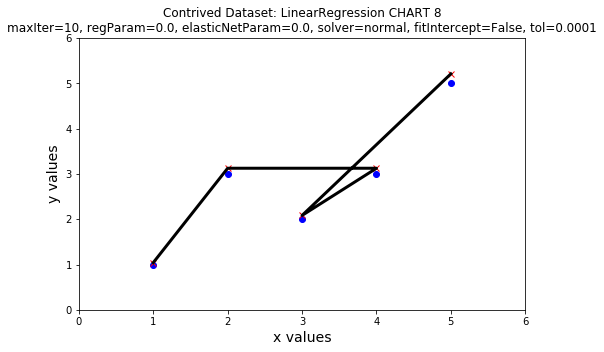

--------------------------------------------------

CHART 9

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


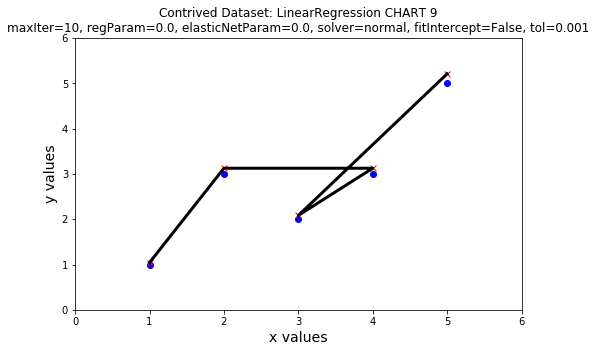

--------------------------------------------------

CHART 10

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


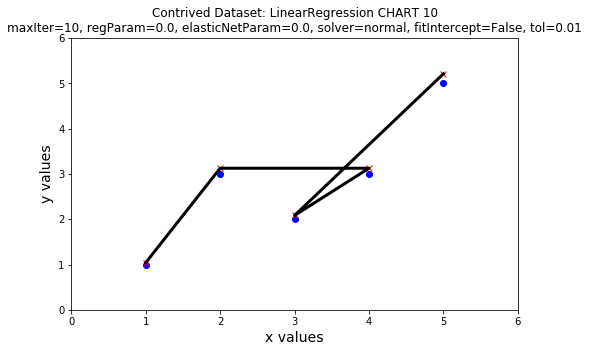

--------------------------------------------------

CHART 11

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


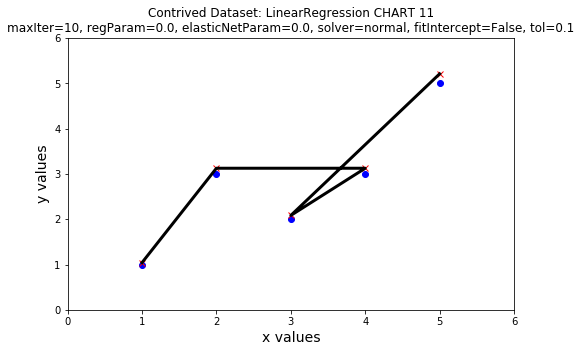

--------------------------------------------------

CHART 12

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


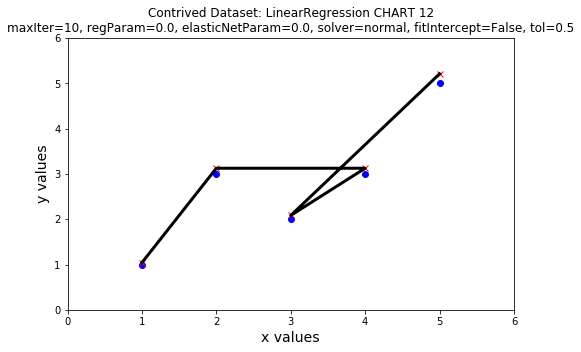

--------------------------------------------------

CHART 13

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


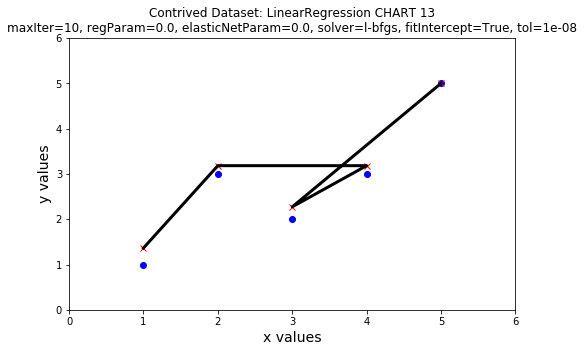

--------------------------------------------------

CHART 14

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


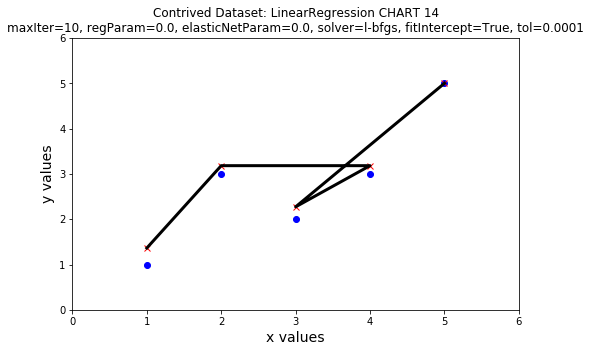

--------------------------------------------------

CHART 15

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


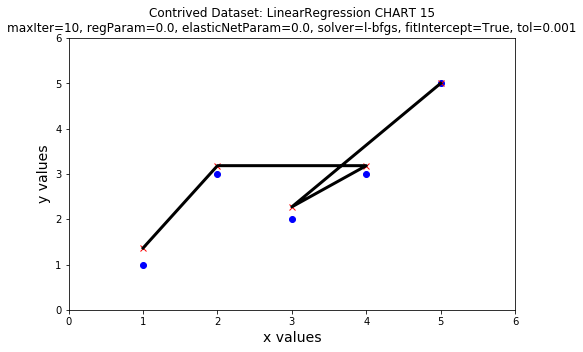

--------------------------------------------------

CHART 16

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


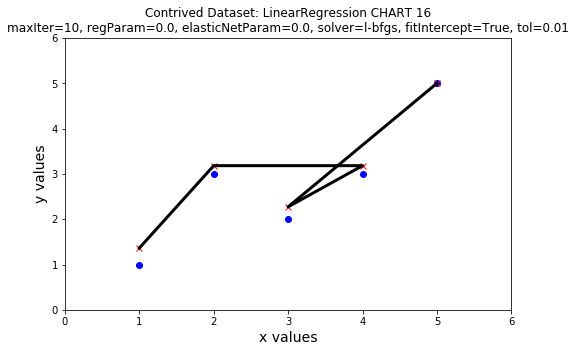

--------------------------------------------------

CHART 17

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


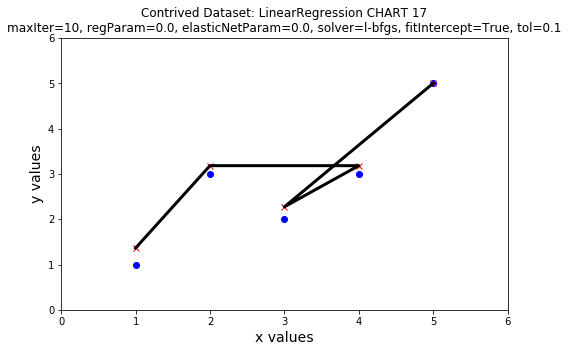

--------------------------------------------------

CHART 18

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


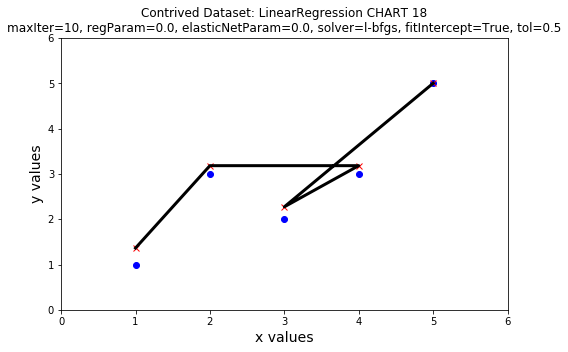

--------------------------------------------------

CHART 19

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


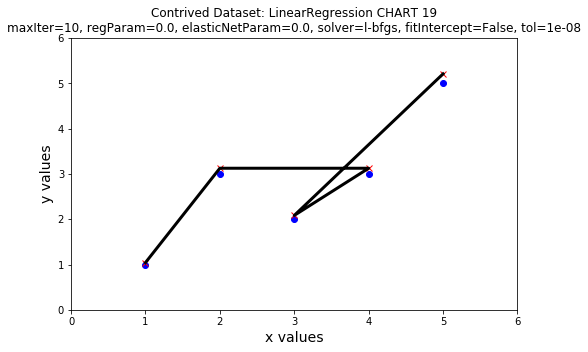

--------------------------------------------------

CHART 20

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


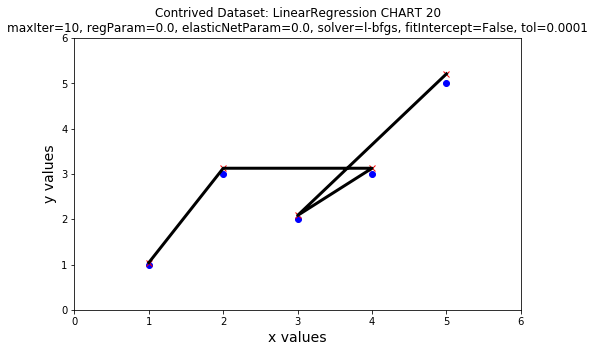

--------------------------------------------------

CHART 21

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


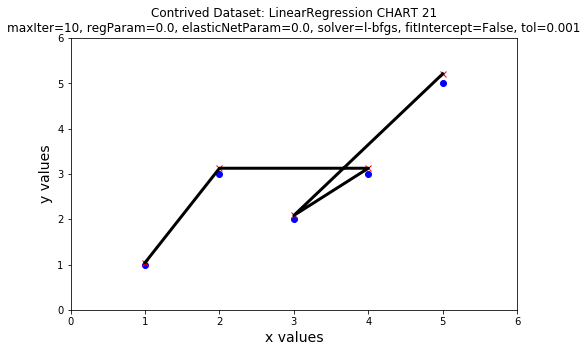

--------------------------------------------------

CHART 22

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


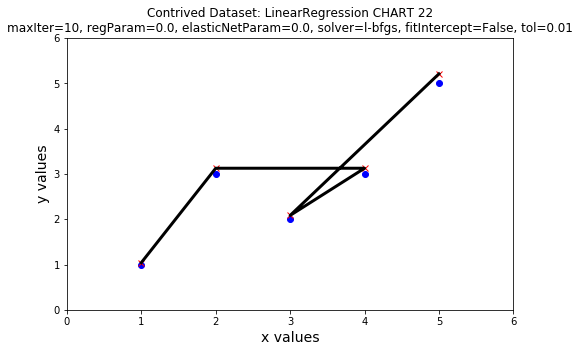

--------------------------------------------------

CHART 23

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


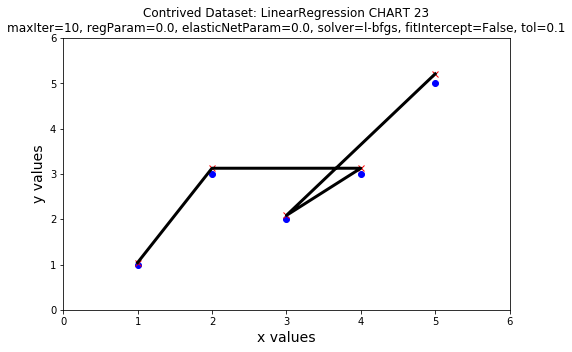

--------------------------------------------------

CHART 24

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


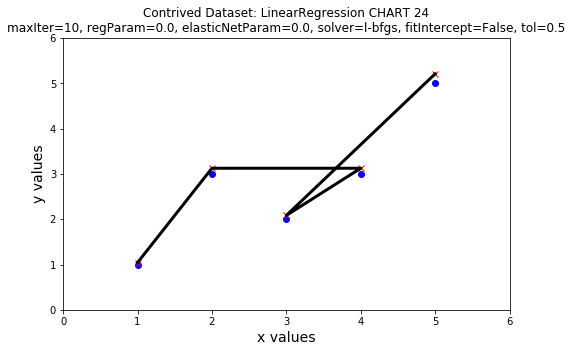

--------------------------------------------------

CHART 25

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


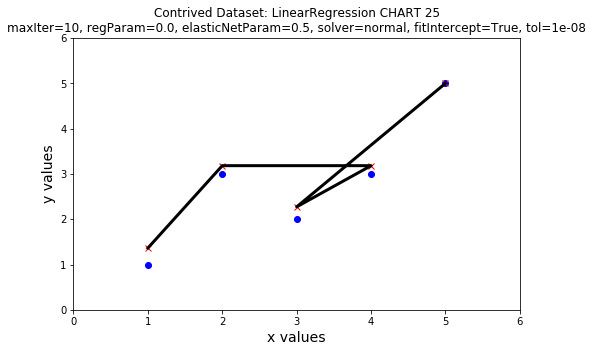

--------------------------------------------------

CHART 26

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


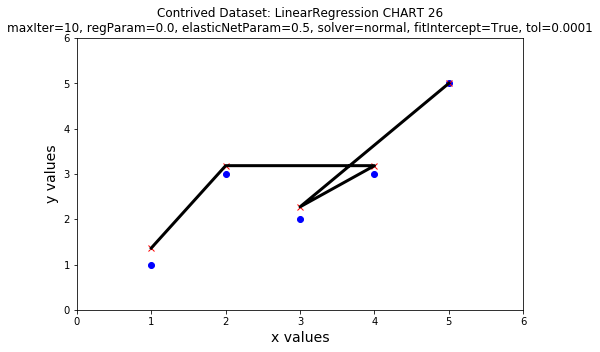

--------------------------------------------------

CHART 27

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


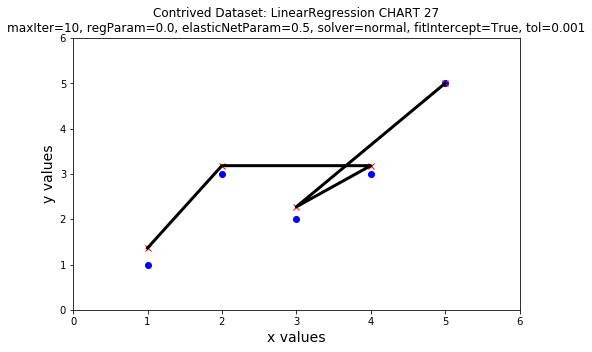

--------------------------------------------------

CHART 28

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


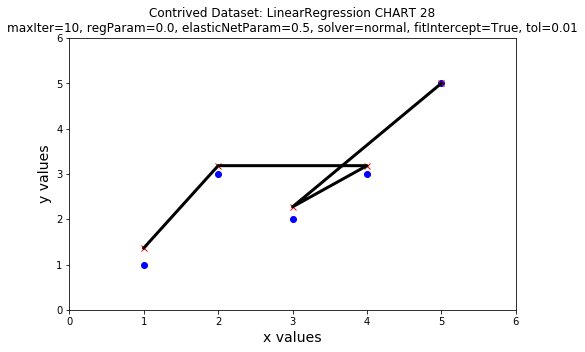

--------------------------------------------------

CHART 29

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


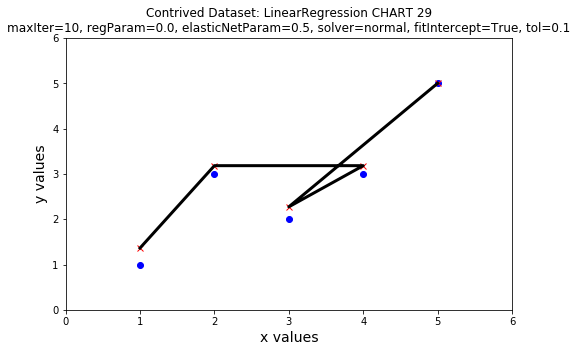

--------------------------------------------------

CHART 30

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


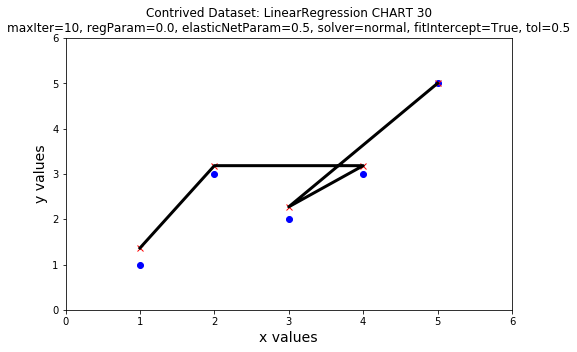

--------------------------------------------------

CHART 31

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


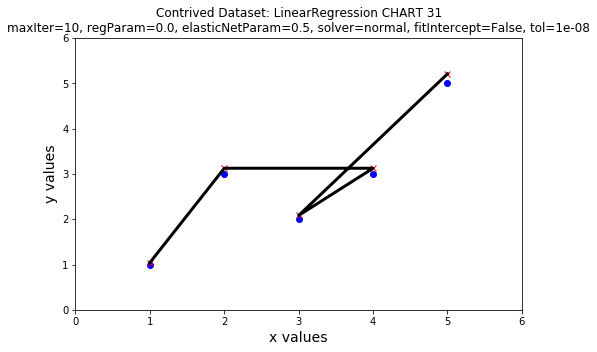

--------------------------------------------------

CHART 32

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


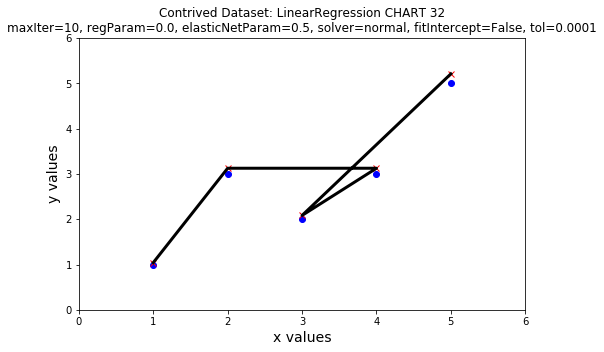

--------------------------------------------------

CHART 33

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


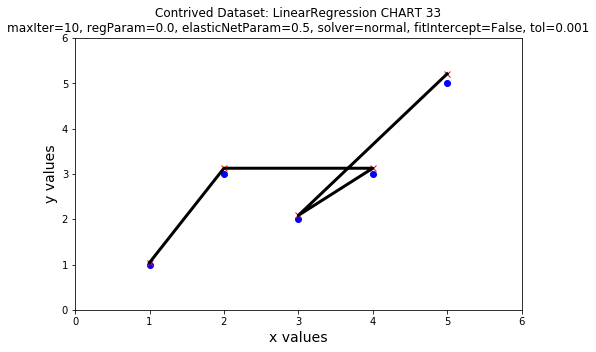

--------------------------------------------------

CHART 34

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


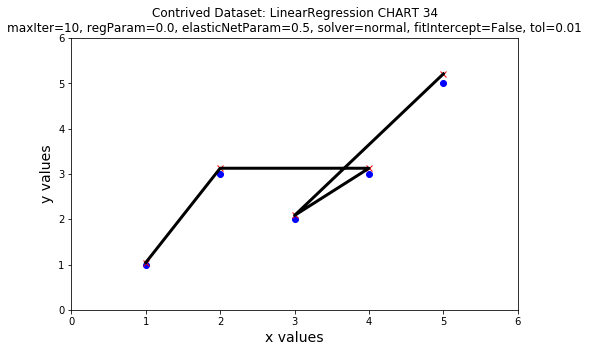

--------------------------------------------------

CHART 35

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


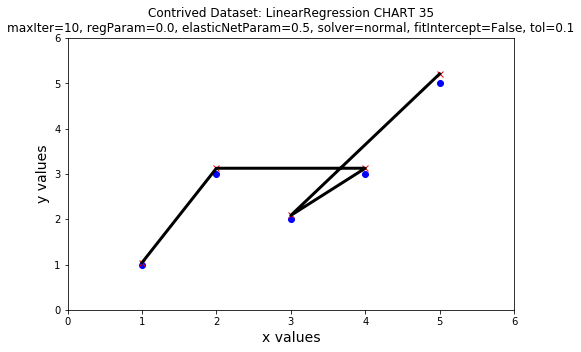

--------------------------------------------------

CHART 36

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


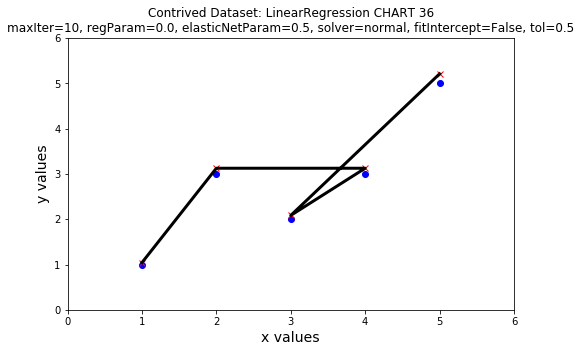

--------------------------------------------------

CHART 37

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


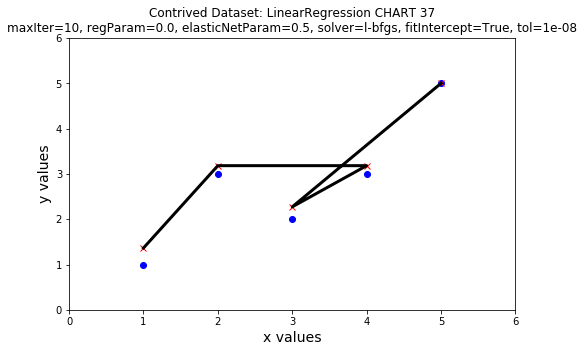

--------------------------------------------------

CHART 38

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


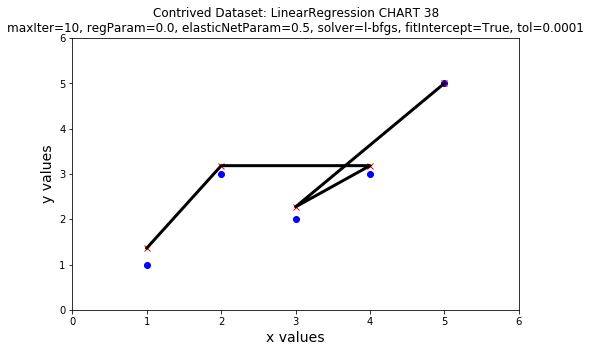

--------------------------------------------------

CHART 39

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


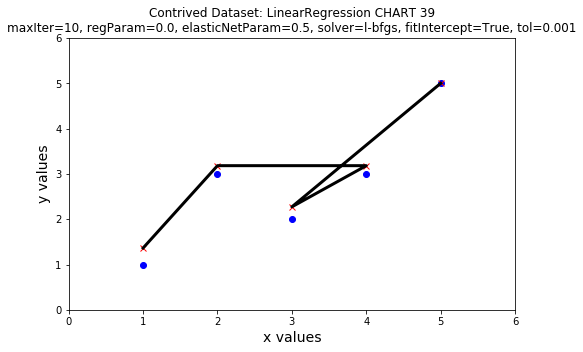

--------------------------------------------------

CHART 40

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


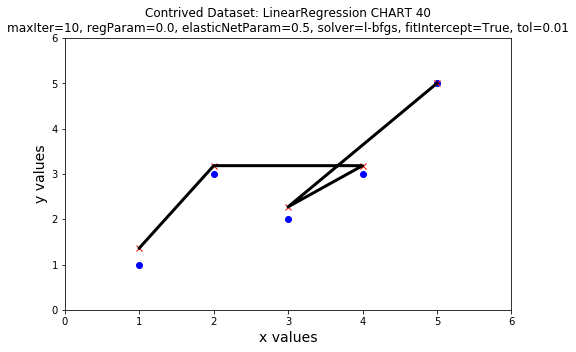

--------------------------------------------------

CHART 41

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


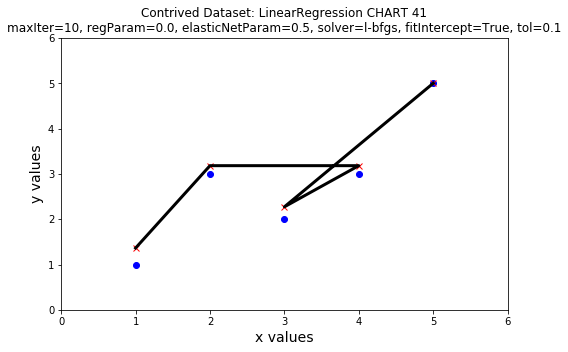

--------------------------------------------------

CHART 42

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


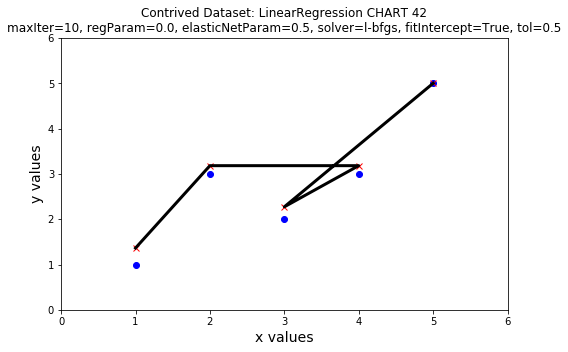

--------------------------------------------------

CHART 43

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


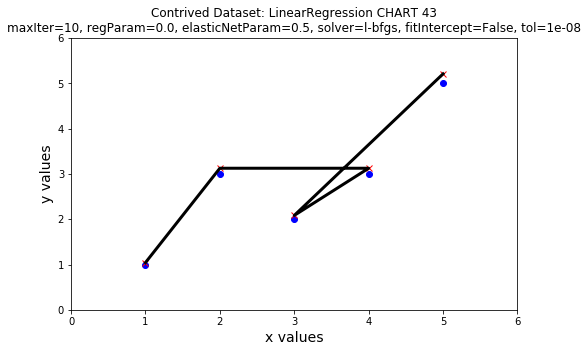

--------------------------------------------------

CHART 44

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


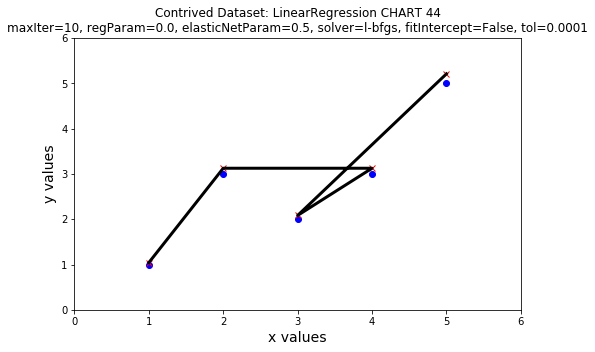

--------------------------------------------------

CHART 45

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


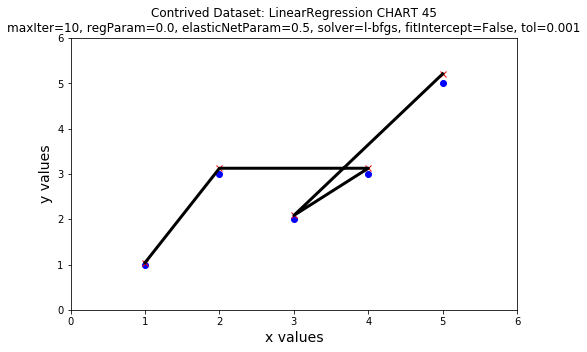

--------------------------------------------------

CHART 46

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


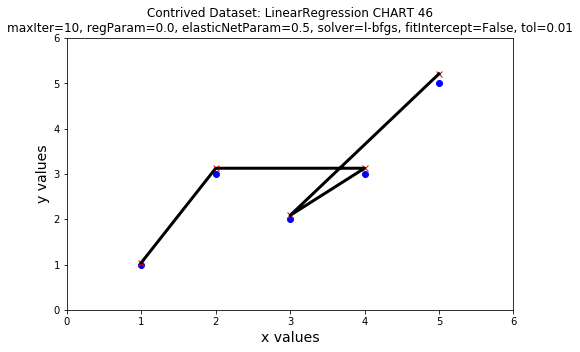

--------------------------------------------------

CHART 47

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


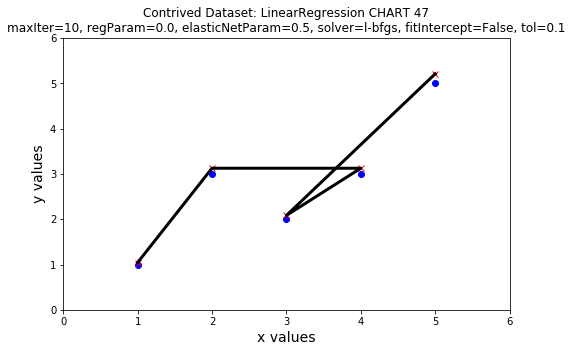

--------------------------------------------------

CHART 48

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


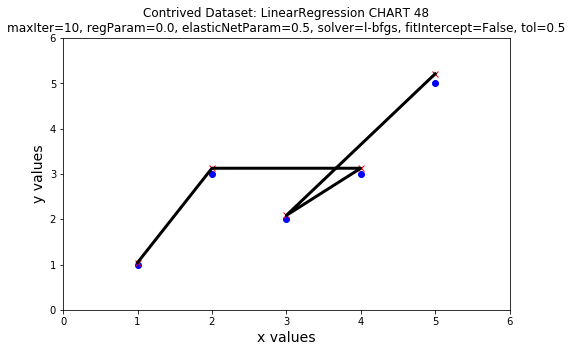

--------------------------------------------------

CHART 49

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


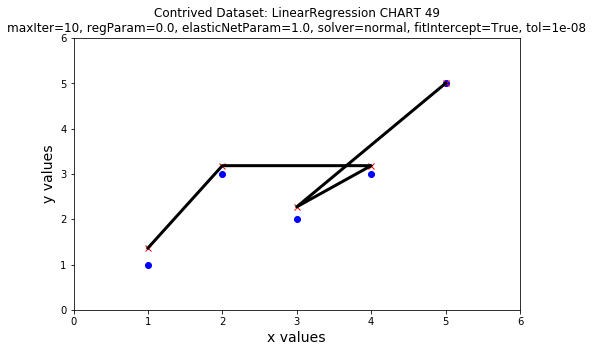

--------------------------------------------------

CHART 50

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


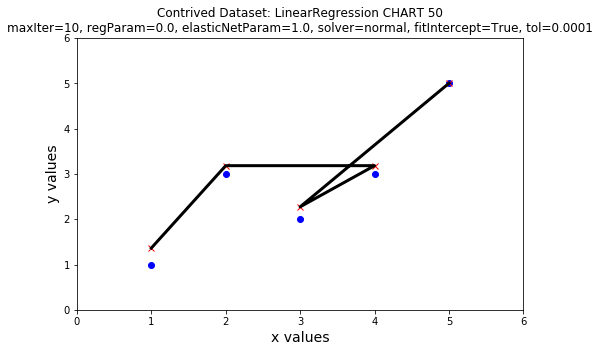

--------------------------------------------------

CHART 51

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


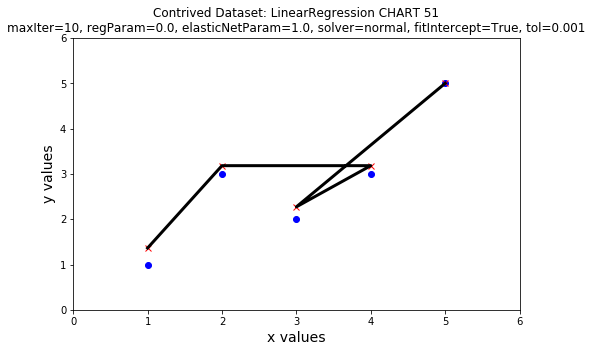

--------------------------------------------------

CHART 52

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


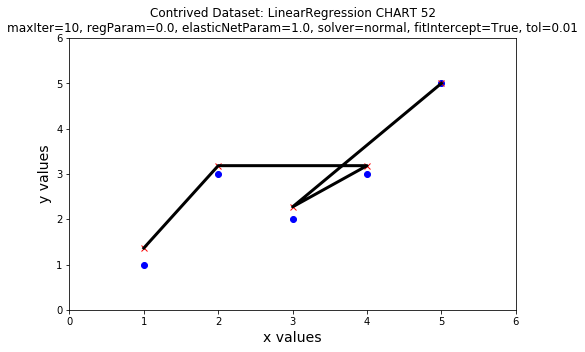

--------------------------------------------------

CHART 53

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


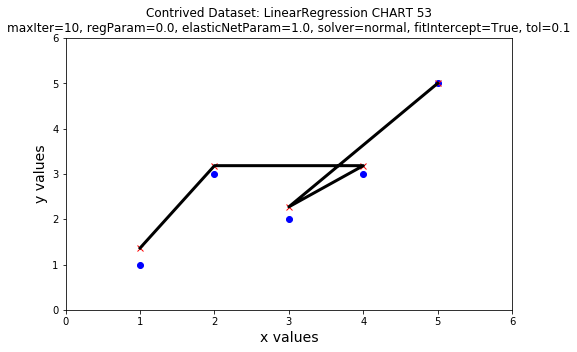

--------------------------------------------------

CHART 54

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


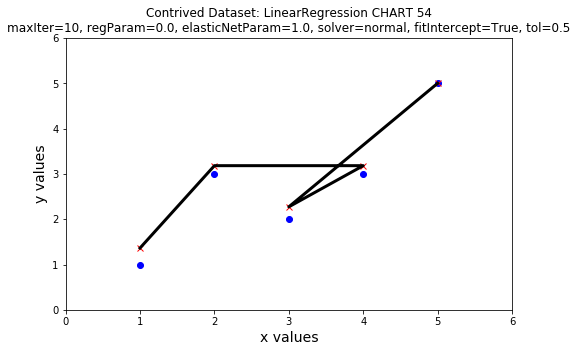

--------------------------------------------------

CHART 55

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


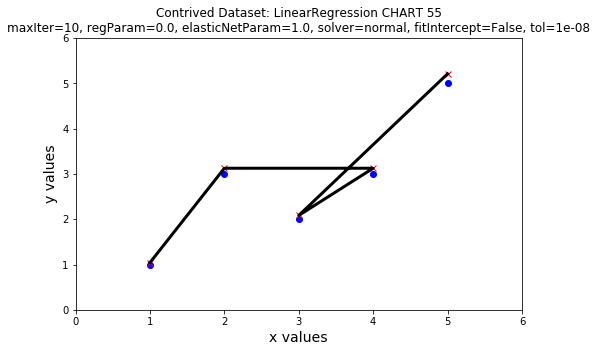

--------------------------------------------------

CHART 56

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


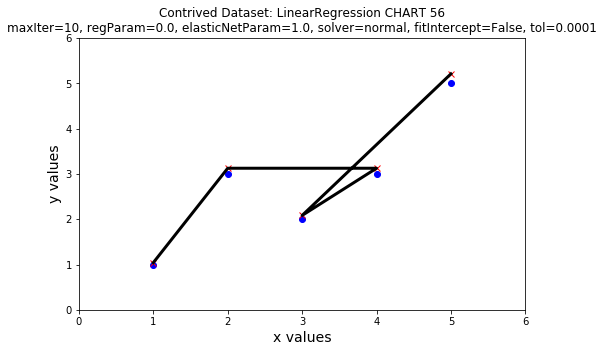

--------------------------------------------------

CHART 57

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


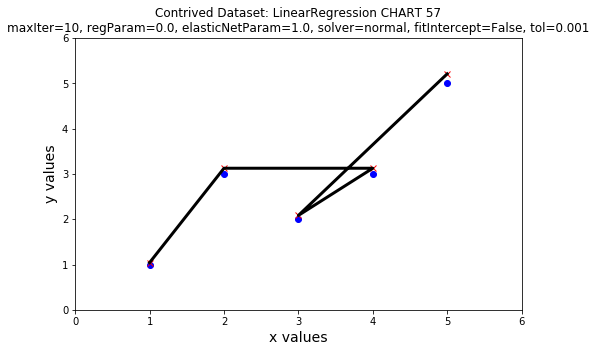

--------------------------------------------------

CHART 58

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


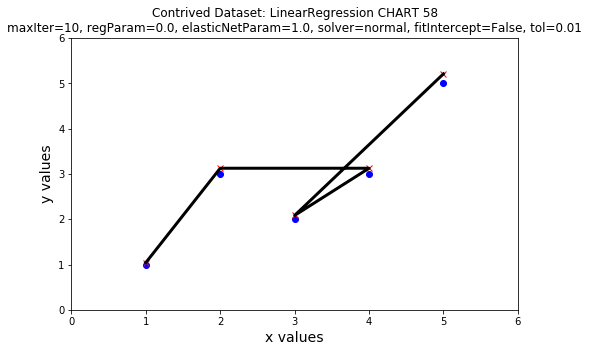

--------------------------------------------------

CHART 59

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


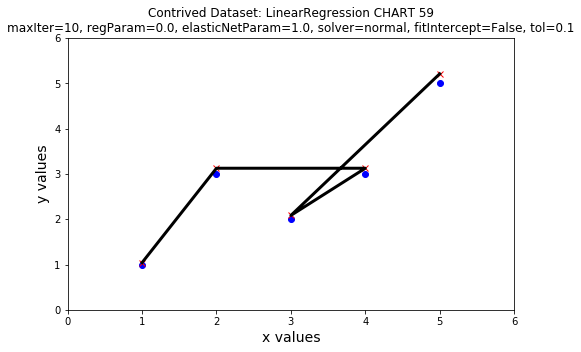

--------------------------------------------------

CHART 60

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


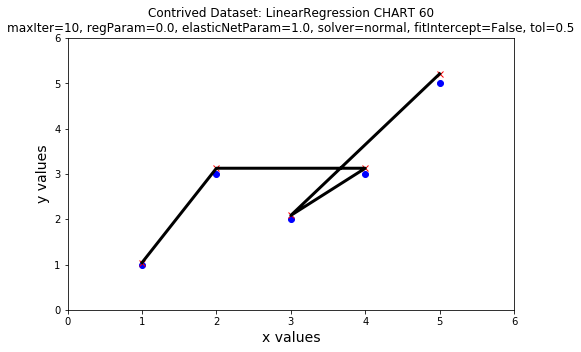

--------------------------------------------------

CHART 61

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


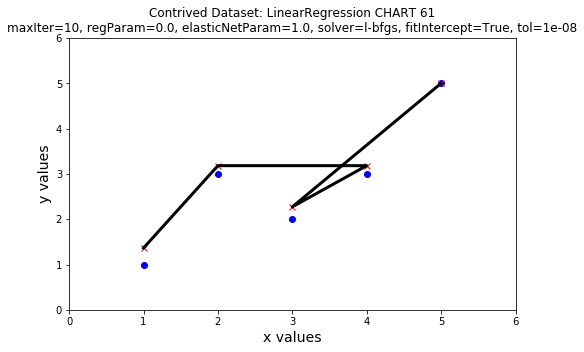

--------------------------------------------------

CHART 62

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


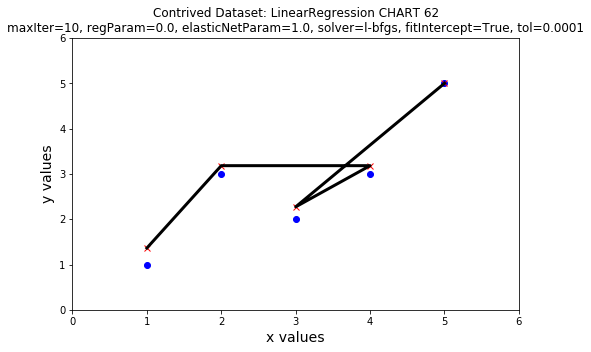

--------------------------------------------------

CHART 63

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


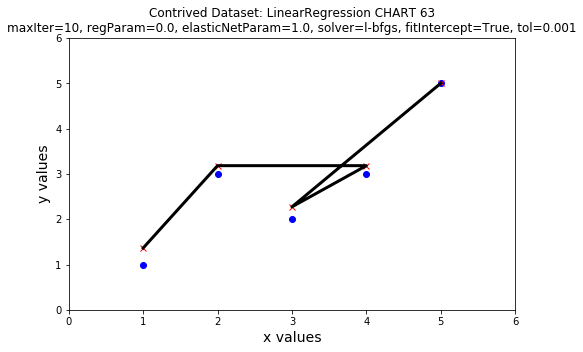

--------------------------------------------------

CHART 64

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


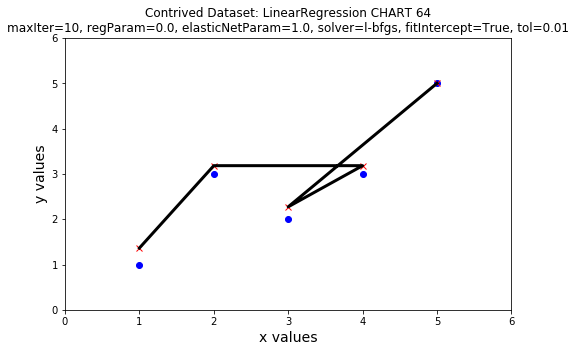

--------------------------------------------------

CHART 65

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


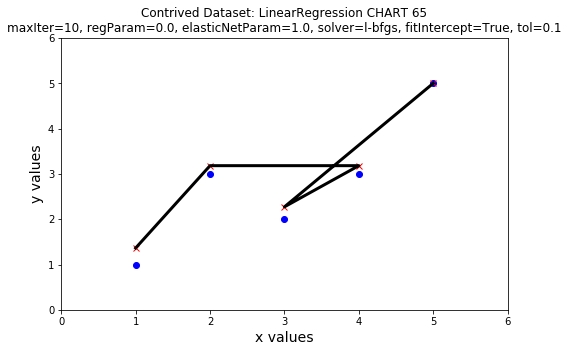

--------------------------------------------------

CHART 66

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


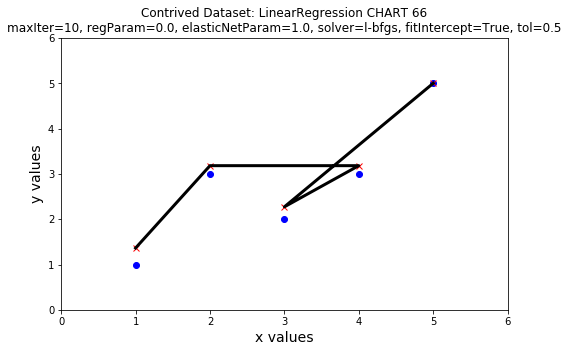

--------------------------------------------------

CHART 67

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


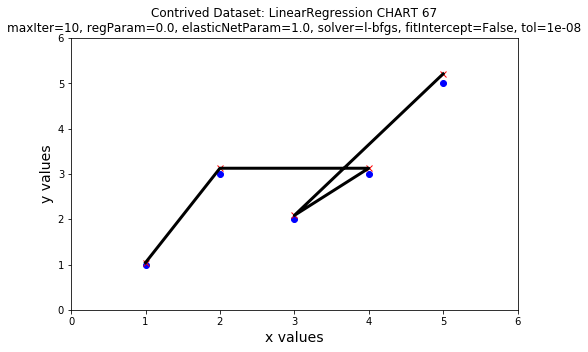

--------------------------------------------------

CHART 68

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


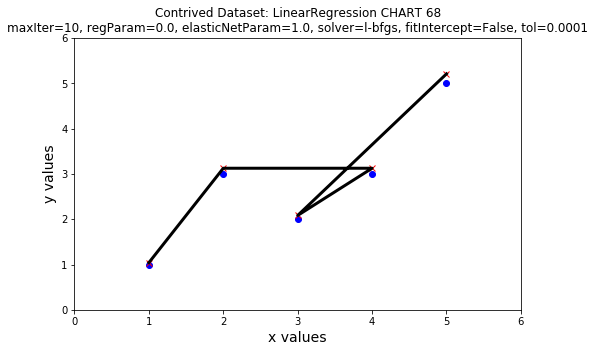

--------------------------------------------------

CHART 69

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


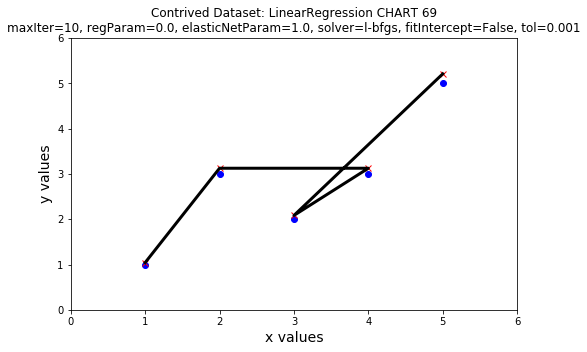

--------------------------------------------------

CHART 70

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


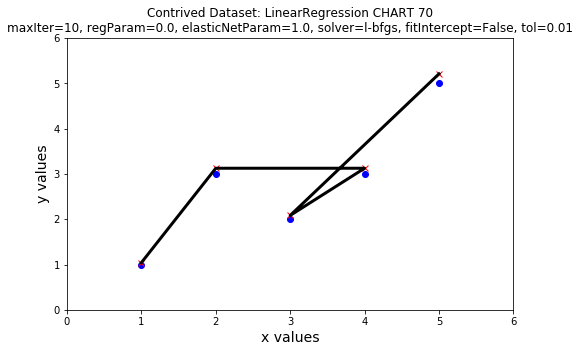

--------------------------------------------------

CHART 71

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


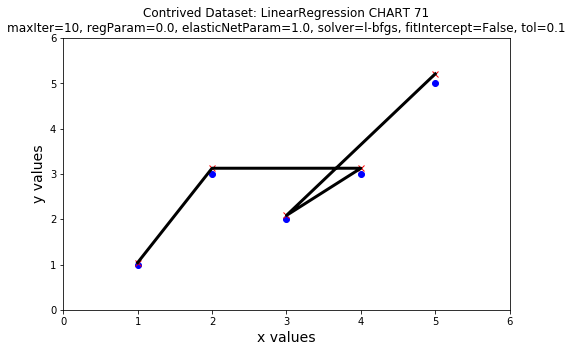

--------------------------------------------------

CHART 72

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


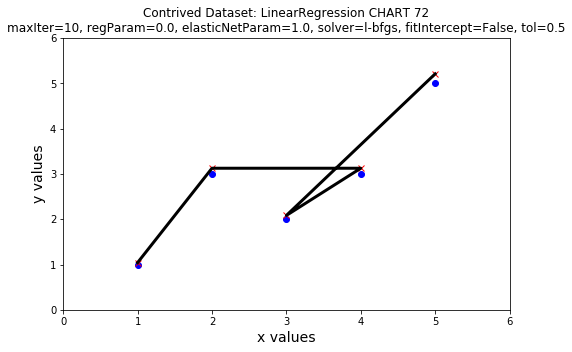

--------------------------------------------------

CHART 73

(1.650012053156342, 1)
(3.149998660760406, 2)
(3.149998660760406, 4)
(2.400005356958374, 3)
(4.649985268364471, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.749993   0.303624    2.470   0.090053
##   0.900019   0.958862    0.939   0.417164
## ---
## Mean squared error:  0.590004 , RMSE:  0.768117
## Multiple R-squared: 0.704998 ,             Total iterations: 1
Coefficients: [0.7499933038020321]
Intercept: 0.9000187493543099
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.650012053156342, 3.149998660760406, 3.149998660760406, 2.400005356958374, 4.649985268364471]


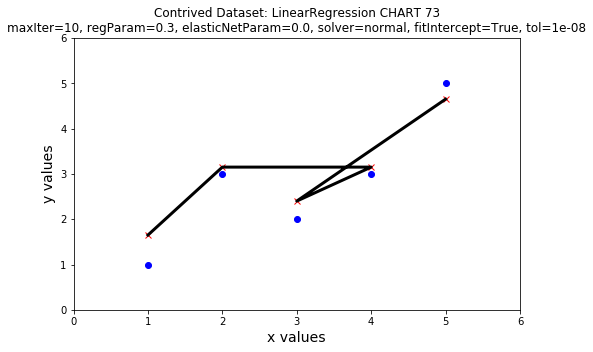

--------------------------------------------------

CHART 74

(1.650012053156342, 1)
(3.149998660760406, 2)
(3.149998660760406, 4)
(2.400005356958374, 3)
(4.649985268364471, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.749993   0.303624    2.470   0.090053
##   0.900019   0.958862    0.939   0.417164
## ---
## Mean squared error:  0.590004 , RMSE:  0.768117
## Multiple R-squared: 0.704998 ,             Total iterations: 1
Coefficients: [0.7499933038020321]
Intercept: 0.9000187493543099
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.650012053156342, 3.149998660760406, 3.149998660760406, 2.400005356958374, 4.649985268364471]


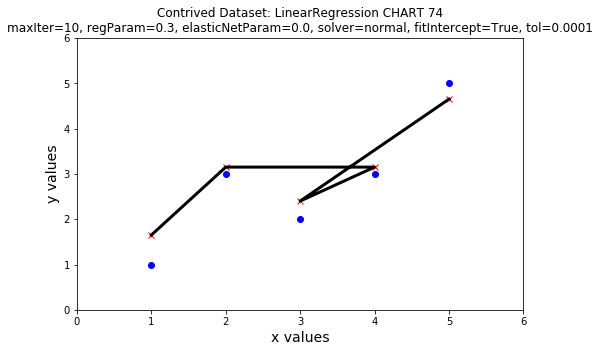

--------------------------------------------------

CHART 75

(1.650012053156342, 1)
(3.149998660760406, 2)
(3.149998660760406, 4)
(2.400005356958374, 3)
(4.649985268364471, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.749993   0.303624    2.470   0.090053
##   0.900019   0.958862    0.939   0.417164
## ---
## Mean squared error:  0.590004 , RMSE:  0.768117
## Multiple R-squared: 0.704998 ,             Total iterations: 1
Coefficients: [0.7499933038020321]
Intercept: 0.9000187493543099
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.650012053156342, 3.149998660760406, 3.149998660760406, 2.400005356958374, 4.649985268364471]


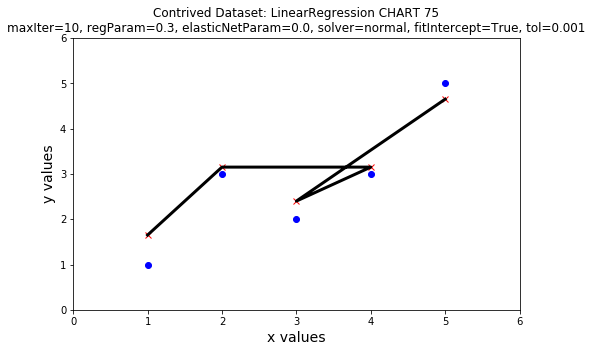

--------------------------------------------------

CHART 76

(1.650012053156342, 1)
(3.149998660760406, 2)
(3.149998660760406, 4)
(2.400005356958374, 3)
(4.649985268364471, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.749993   0.303624    2.470   0.090053
##   0.900019   0.958862    0.939   0.417164
## ---
## Mean squared error:  0.590004 , RMSE:  0.768117
## Multiple R-squared: 0.704998 ,             Total iterations: 1
Coefficients: [0.7499933038020321]
Intercept: 0.9000187493543099
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.650012053156342, 3.149998660760406, 3.149998660760406, 2.400005356958374, 4.649985268364471]


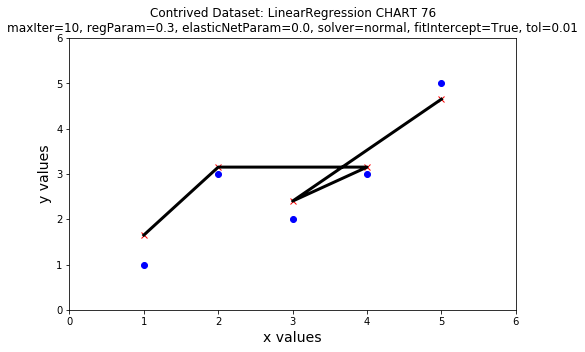

--------------------------------------------------

CHART 77

(1.650012053156342, 1)
(3.149998660760406, 2)
(3.149998660760406, 4)
(2.400005356958374, 3)
(4.649985268364471, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.749993   0.303624    2.470   0.090053
##   0.900019   0.958862    0.939   0.417164
## ---
## Mean squared error:  0.590004 , RMSE:  0.768117
## Multiple R-squared: 0.704998 ,             Total iterations: 1
Coefficients: [0.7499933038020321]
Intercept: 0.9000187493543099
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.650012053156342, 3.149998660760406, 3.149998660760406, 2.400005356958374, 4.649985268364471]


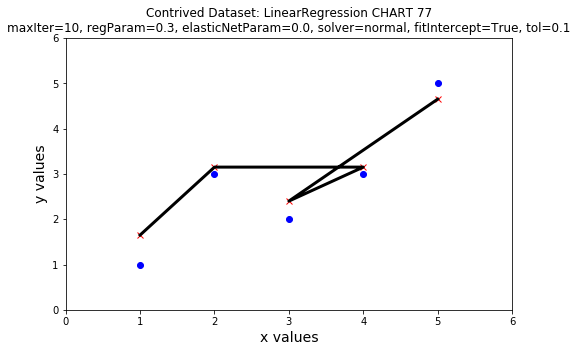

--------------------------------------------------

CHART 78

(1.650012053156342, 1)
(3.149998660760406, 2)
(3.149998660760406, 4)
(2.400005356958374, 3)
(4.649985268364471, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.749993   0.303624    2.470   0.090053
##   0.900019   0.958862    0.939   0.417164
## ---
## Mean squared error:  0.590004 , RMSE:  0.768117
## Multiple R-squared: 0.704998 ,             Total iterations: 1
Coefficients: [0.7499933038020321]
Intercept: 0.9000187493543099
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.650012053156342, 3.149998660760406, 3.149998660760406, 2.400005356958374, 4.649985268364471]


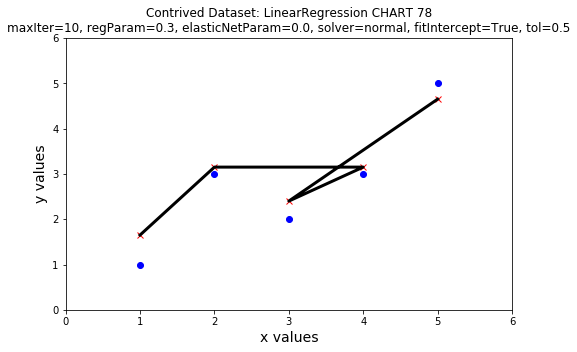

--------------------------------------------------

CHART 79

(1.0026718818825346, 1)
(3.008015645647604, 2)
(3.008015645647604, 4)
(2.0053437637650693, 3)
(5.013359409412673, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.002672   0.122426    8.190   0.001211
## ---
## Mean squared error:  0.597931 , RMSE:  0.773260
## Multiple R-squared: 0.945643 ,             Total iterations: 1
Coefficients: [1.0026718818825346]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0026718818825346, 3.008015645647604, 3.008015645647604, 2.0053437637650693, 5.013359409412673]


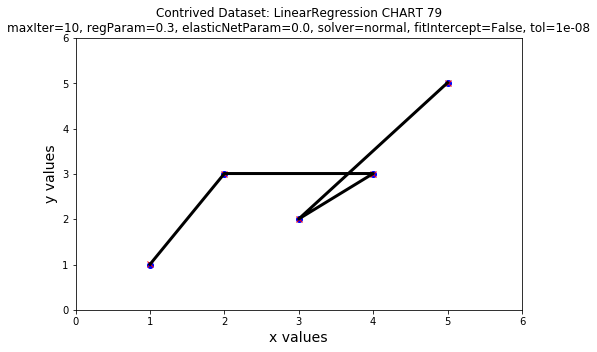

--------------------------------------------------

CHART 80

(1.0026718818825346, 1)
(3.008015645647604, 2)
(3.008015645647604, 4)
(2.0053437637650693, 3)
(5.013359409412673, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.002672   0.122426    8.190   0.001211
## ---
## Mean squared error:  0.597931 , RMSE:  0.773260
## Multiple R-squared: 0.945643 ,             Total iterations: 1
Coefficients: [1.0026718818825346]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0026718818825346, 3.008015645647604, 3.008015645647604, 2.0053437637650693, 5.013359409412673]


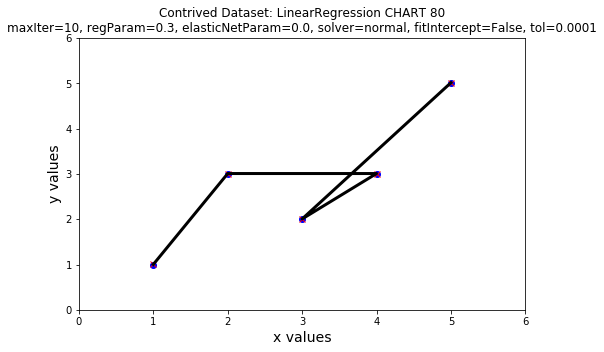

--------------------------------------------------

CHART 81

(1.0026718818825346, 1)
(3.008015645647604, 2)
(3.008015645647604, 4)
(2.0053437637650693, 3)
(5.013359409412673, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.002672   0.122426    8.190   0.001211
## ---
## Mean squared error:  0.597931 , RMSE:  0.773260
## Multiple R-squared: 0.945643 ,             Total iterations: 1
Coefficients: [1.0026718818825346]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0026718818825346, 3.008015645647604, 3.008015645647604, 2.0053437637650693, 5.013359409412673]


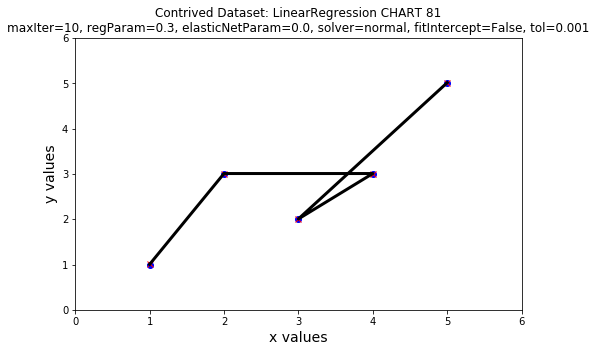

--------------------------------------------------

CHART 82

(1.0026718818825346, 1)
(3.008015645647604, 2)
(3.008015645647604, 4)
(2.0053437637650693, 3)
(5.013359409412673, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.002672   0.122426    8.190   0.001211
## ---
## Mean squared error:  0.597931 , RMSE:  0.773260
## Multiple R-squared: 0.945643 ,             Total iterations: 1
Coefficients: [1.0026718818825346]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0026718818825346, 3.008015645647604, 3.008015645647604, 2.0053437637650693, 5.013359409412673]


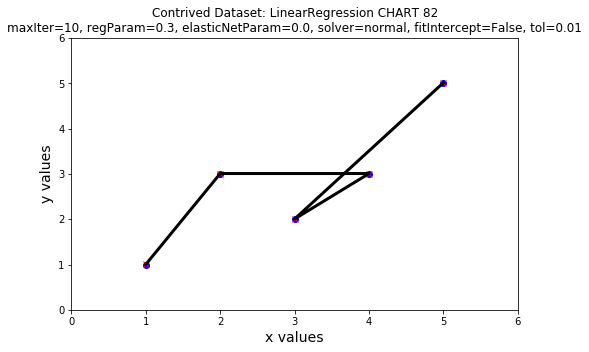

--------------------------------------------------

CHART 83

(1.0026718818825346, 1)
(3.008015645647604, 2)
(3.008015645647604, 4)
(2.0053437637650693, 3)
(5.013359409412673, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.002672   0.122426    8.190   0.001211
## ---
## Mean squared error:  0.597931 , RMSE:  0.773260
## Multiple R-squared: 0.945643 ,             Total iterations: 1
Coefficients: [1.0026718818825346]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0026718818825346, 3.008015645647604, 3.008015645647604, 2.0053437637650693, 5.013359409412673]


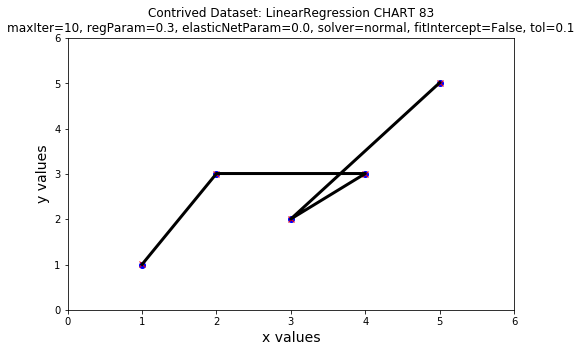

--------------------------------------------------

CHART 84

(1.0026718818825346, 1)
(3.008015645647604, 2)
(3.008015645647604, 4)
(2.0053437637650693, 3)
(5.013359409412673, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.002672   0.122426    8.190   0.001211
## ---
## Mean squared error:  0.597931 , RMSE:  0.773260
## Multiple R-squared: 0.945643 ,             Total iterations: 1
Coefficients: [1.0026718818825346]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0026718818825346, 3.008015645647604, 3.008015645647604, 2.0053437637650693, 5.013359409412673]


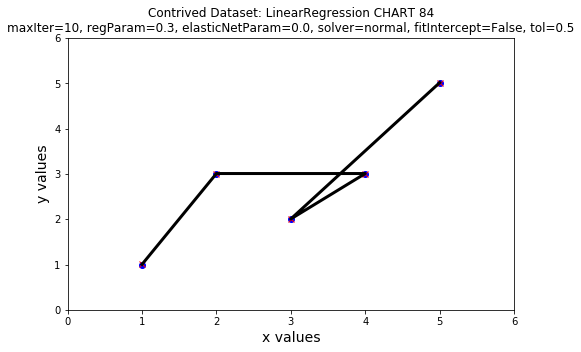

--------------------------------------------------

CHART 85

(1.6773341207684345, 1)
(3.146962875470174, 2)
(3.146962875470174, 4)
(2.412148498119304, 3)
(4.616591630171913, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598910 , RMSE:  0.773893
## Multiple R-squared: 0.700545 ,             Total iterations: 3
Coefficients: [0.7348143773508697]
Intercept: 0.9425197434175647
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.6773341207684345, 3.146962875470174, 3.146962875470174, 2.412148498119304, 4.616591630171913]


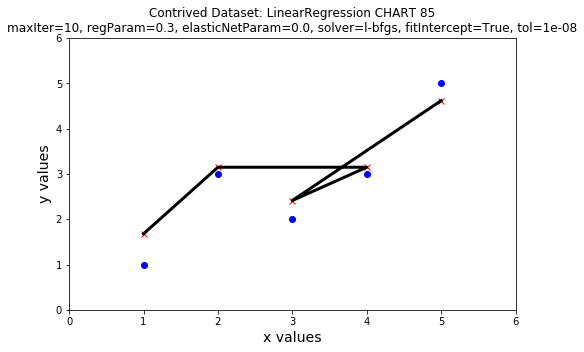

--------------------------------------------------

CHART 86

(1.6773341207684345, 1)
(3.146962875470174, 2)
(3.146962875470174, 4)
(2.412148498119304, 3)
(4.616591630171913, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598910 , RMSE:  0.773893
## Multiple R-squared: 0.700545 ,             Total iterations: 3
Coefficients: [0.7348143773508697]
Intercept: 0.9425197434175647
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.6773341207684345, 3.146962875470174, 3.146962875470174, 2.412148498119304, 4.616591630171913]


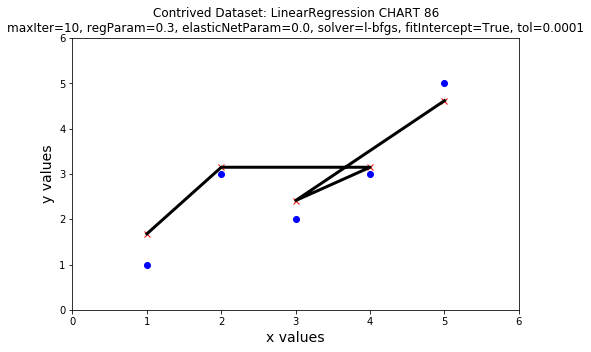

--------------------------------------------------

CHART 87

(1.6773341207684345, 1)
(3.146962875470174, 2)
(3.146962875470174, 4)
(2.412148498119304, 3)
(4.616591630171913, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598910 , RMSE:  0.773893
## Multiple R-squared: 0.700545 ,             Total iterations: 3
Coefficients: [0.7348143773508697]
Intercept: 0.9425197434175647
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.6773341207684345, 3.146962875470174, 3.146962875470174, 2.412148498119304, 4.616591630171913]


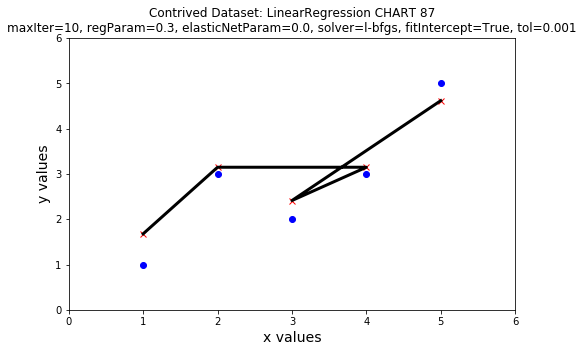

--------------------------------------------------

CHART 88

(1.6773341207684345, 1)
(3.146962875470174, 2)
(3.146962875470174, 4)
(2.412148498119304, 3)
(4.616591630171913, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598910 , RMSE:  0.773893
## Multiple R-squared: 0.700545 ,             Total iterations: 3
Coefficients: [0.7348143773508697]
Intercept: 0.9425197434175647
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.6773341207684345, 3.146962875470174, 3.146962875470174, 2.412148498119304, 4.616591630171913]


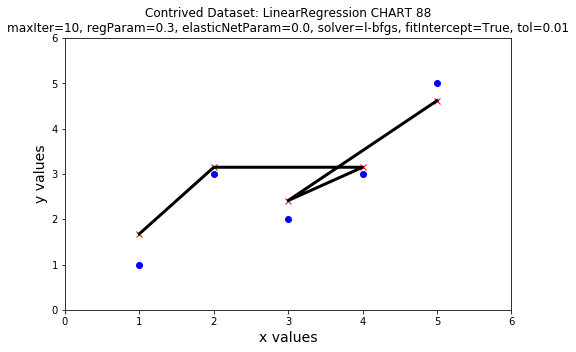

--------------------------------------------------

CHART 89

(1.6773341207684345, 1)
(3.146962875470174, 2)
(3.146962875470174, 4)
(2.412148498119304, 3)
(4.616591630171913, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598910 , RMSE:  0.773893
## Multiple R-squared: 0.700545 ,             Total iterations: 3
Coefficients: [0.7348143773508697]
Intercept: 0.9425197434175647
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.6773341207684345, 3.146962875470174, 3.146962875470174, 2.412148498119304, 4.616591630171913]


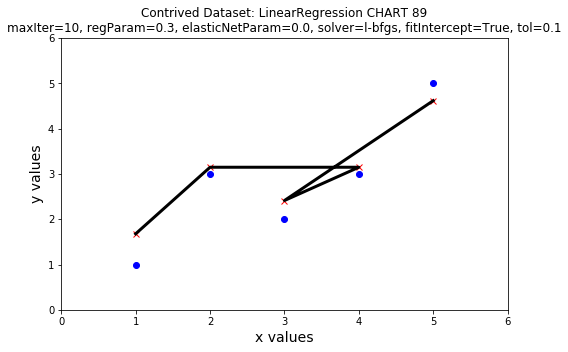

--------------------------------------------------

CHART 90

(1.6773341207684345, 1)
(3.146962875470174, 2)
(3.146962875470174, 4)
(2.412148498119304, 3)
(4.616591630171913, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598910 , RMSE:  0.773893
## Multiple R-squared: 0.700545 ,             Total iterations: 3
Coefficients: [0.7348143773508697]
Intercept: 0.9425197434175647
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.6773341207684345, 3.146962875470174, 3.146962875470174, 2.412148498119304, 4.616591630171913]


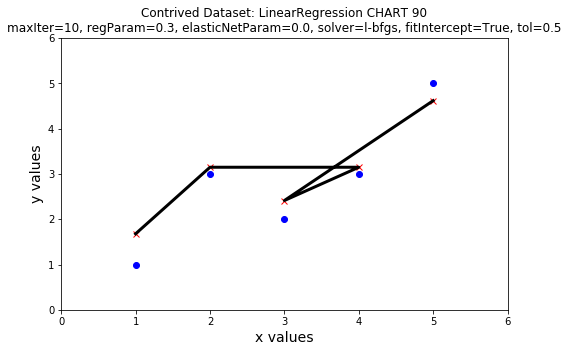

--------------------------------------------------

CHART 91

(0.9982609643990303, 1)
(2.9947828931970912, 2)
(2.9947828931970912, 4)
(1.9965219287980607, 3)
(4.9913048219951515, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.601420 , RMSE:  0.775513
## Multiple R-squared: 0.945325 ,             Total iterations: 3
Coefficients: [0.9982609643990303]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9982609643990303, 2.9947828931970912, 2.9947828931970912, 1.9965219287980607, 4.9913048219951515]


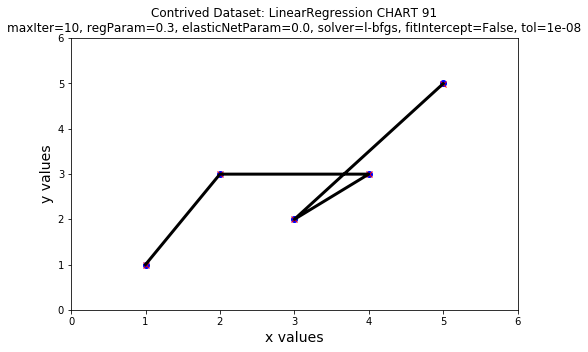

--------------------------------------------------

CHART 92

(0.9982609643990303, 1)
(2.9947828931970912, 2)
(2.9947828931970912, 4)
(1.9965219287980607, 3)
(4.9913048219951515, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.601420 , RMSE:  0.775513
## Multiple R-squared: 0.945325 ,             Total iterations: 3
Coefficients: [0.9982609643990303]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9982609643990303, 2.9947828931970912, 2.9947828931970912, 1.9965219287980607, 4.9913048219951515]


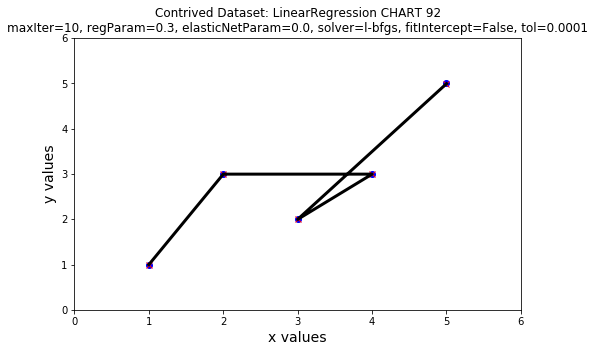

--------------------------------------------------

CHART 93

(0.9982609643990303, 1)
(2.9947828931970912, 2)
(2.9947828931970912, 4)
(1.9965219287980607, 3)
(4.9913048219951515, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.601420 , RMSE:  0.775513
## Multiple R-squared: 0.945325 ,             Total iterations: 3
Coefficients: [0.9982609643990303]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9982609643990303, 2.9947828931970912, 2.9947828931970912, 1.9965219287980607, 4.9913048219951515]


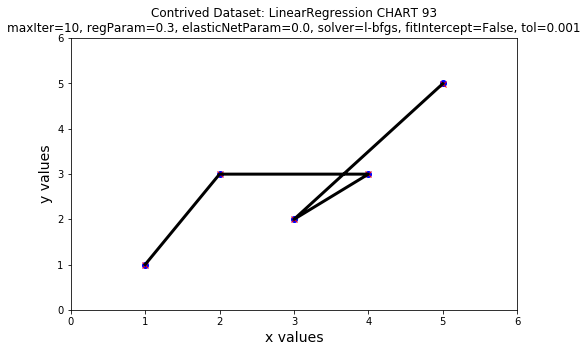

--------------------------------------------------

CHART 94

(0.9982609643990303, 1)
(2.9947828931970912, 2)
(2.9947828931970912, 4)
(1.9965219287980607, 3)
(4.9913048219951515, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.601420 , RMSE:  0.775513
## Multiple R-squared: 0.945325 ,             Total iterations: 3
Coefficients: [0.9982609643990303]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9982609643990303, 2.9947828931970912, 2.9947828931970912, 1.9965219287980607, 4.9913048219951515]


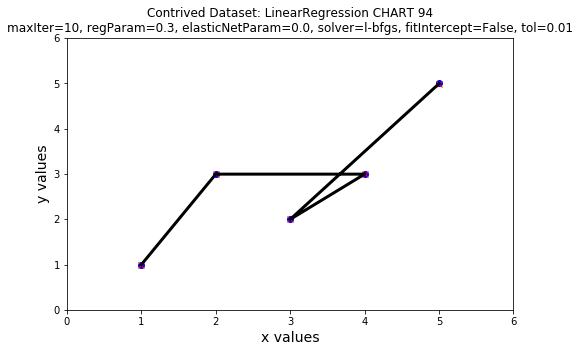

--------------------------------------------------

CHART 95

(0.9982609643990303, 1)
(2.9947828931970912, 2)
(2.9947828931970912, 4)
(1.9965219287980607, 3)
(4.9913048219951515, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.601420 , RMSE:  0.775513
## Multiple R-squared: 0.945325 ,             Total iterations: 3
Coefficients: [0.9982609643990303]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9982609643990303, 2.9947828931970912, 2.9947828931970912, 1.9965219287980607, 4.9913048219951515]


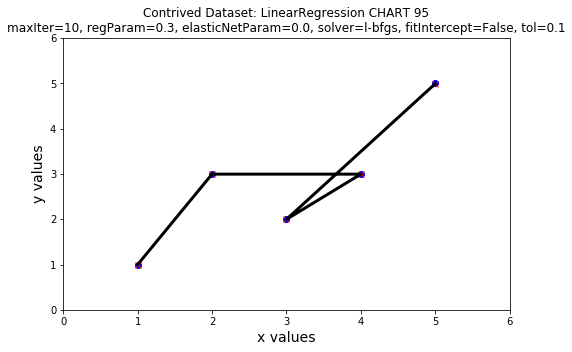

--------------------------------------------------

CHART 96

(0.9982609643990303, 1)
(2.9947828931970912, 2)
(2.9947828931970912, 4)
(1.9965219287980607, 3)
(4.9913048219951515, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.601420 , RMSE:  0.775513
## Multiple R-squared: 0.945325 ,             Total iterations: 3
Coefficients: [0.9982609643990303]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9982609643990303, 2.9947828931970912, 2.9947828931970912, 1.9965219287980607, 4.9913048219951515]


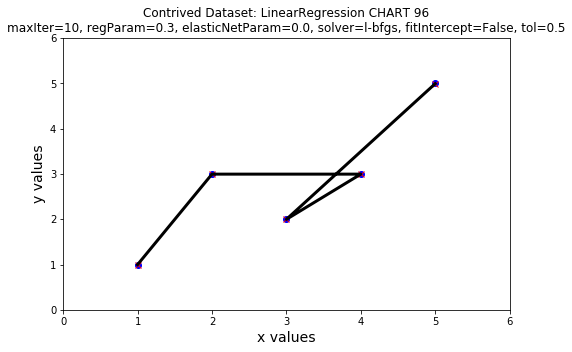

--------------------------------------------------

CHART 97

(1.7045588088589803, 1)
(3.14393791012678, 2)
(3.14393791012678, 4)
(2.4242483594928803, 3)
(4.58331701139458, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.608591 , RMSE:  0.780122
## Multiple R-squared: 0.695705 ,             Total iterations: 3
Coefficients: [0.7196895506338998]
Intercept: 0.9848692582250805
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7045588088589803, 3.14393791012678, 3.14393791012678, 2.4242483594928803, 4.58331701139458]


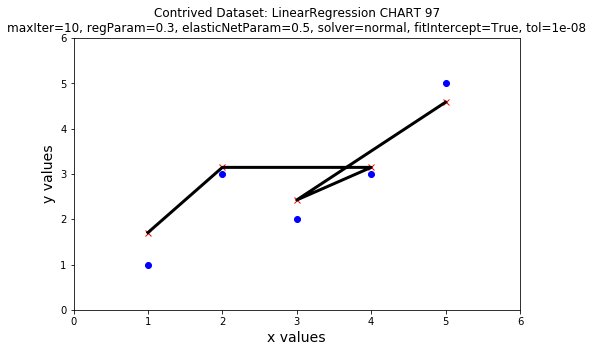

--------------------------------------------------

CHART 98

(1.7045588088589803, 1)
(3.14393791012678, 2)
(3.14393791012678, 4)
(2.4242483594928803, 3)
(4.58331701139458, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.608591 , RMSE:  0.780122
## Multiple R-squared: 0.695705 ,             Total iterations: 3
Coefficients: [0.7196895506338998]
Intercept: 0.9848692582250805
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7045588088589803, 3.14393791012678, 3.14393791012678, 2.4242483594928803, 4.58331701139458]


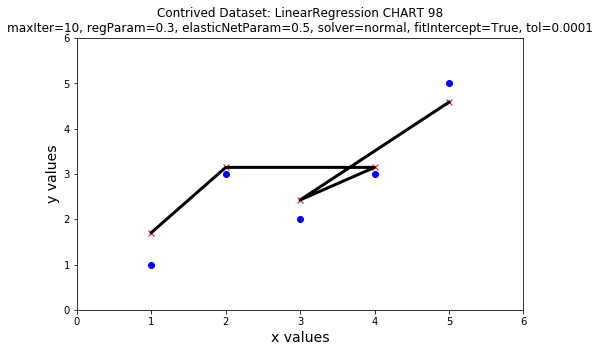

--------------------------------------------------

CHART 99

(1.7045588088589803, 1)
(3.14393791012678, 2)
(3.14393791012678, 4)
(2.4242483594928803, 3)
(4.58331701139458, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.608591 , RMSE:  0.780122
## Multiple R-squared: 0.695705 ,             Total iterations: 3
Coefficients: [0.7196895506338998]
Intercept: 0.9848692582250805
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7045588088589803, 3.14393791012678, 3.14393791012678, 2.4242483594928803, 4.58331701139458]


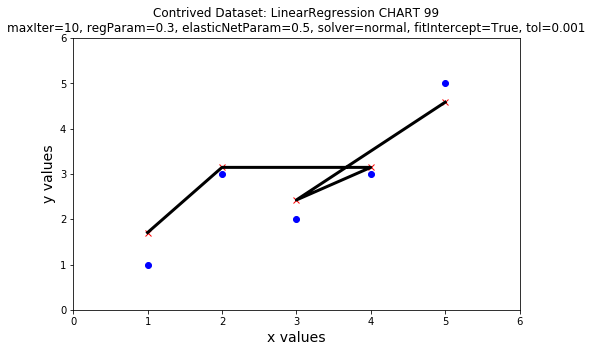

--------------------------------------------------

CHART 100

(1.7045588088589803, 1)
(3.14393791012678, 2)
(3.14393791012678, 4)
(2.4242483594928803, 3)
(4.58331701139458, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.608591 , RMSE:  0.780122
## Multiple R-squared: 0.695705 ,             Total iterations: 3
Coefficients: [0.7196895506338998]
Intercept: 0.9848692582250805
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7045588088589803, 3.14393791012678, 3.14393791012678, 2.4242483594928803, 4.58331701139458]


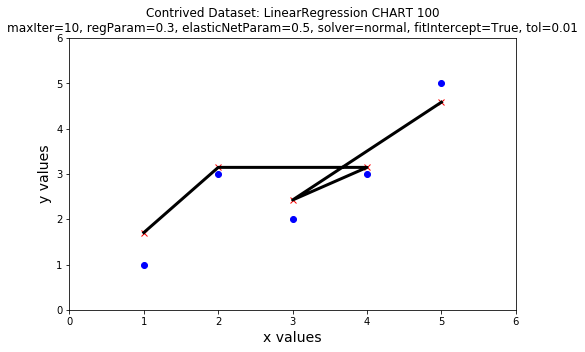

--------------------------------------------------

CHART 101

(1.7045588088589803, 1)
(3.14393791012678, 2)
(3.14393791012678, 4)
(2.4242483594928803, 3)
(4.58331701139458, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.608591 , RMSE:  0.780122
## Multiple R-squared: 0.695705 ,             Total iterations: 3
Coefficients: [0.7196895506338998]
Intercept: 0.9848692582250805
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7045588088589803, 3.14393791012678, 3.14393791012678, 2.4242483594928803, 4.58331701139458]


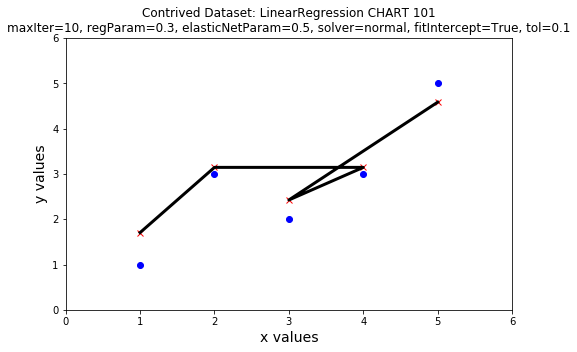

--------------------------------------------------

CHART 102

(1.7045588088589803, 1)
(3.14393791012678, 2)
(3.14393791012678, 4)
(2.4242483594928803, 3)
(4.58331701139458, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.608591 , RMSE:  0.780122
## Multiple R-squared: 0.695705 ,             Total iterations: 3
Coefficients: [0.7196895506338998]
Intercept: 0.9848692582250805
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7045588088589803, 3.14393791012678, 3.14393791012678, 2.4242483594928803, 4.58331701139458]


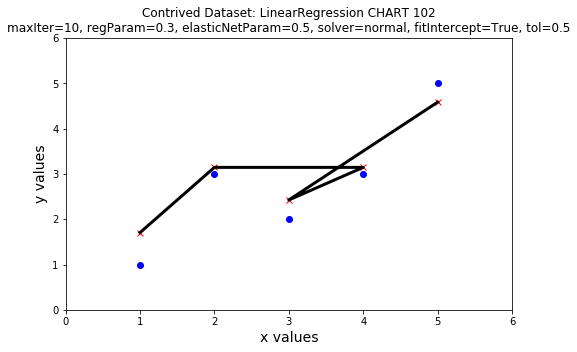

--------------------------------------------------

CHART 103

(1.0014638598505712, 1)
(3.0043915795517133, 2)
(3.0043915795517133, 4)
(2.0029277197011424, 3)
(5.007319299252856, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598849 , RMSE:  0.773854
## Multiple R-squared: 0.945559 ,             Total iterations: 3
Coefficients: [1.0014638598505712]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0014638598505712, 3.0043915795517133, 3.0043915795517133, 2.0029277197011424, 5.007319299252856]


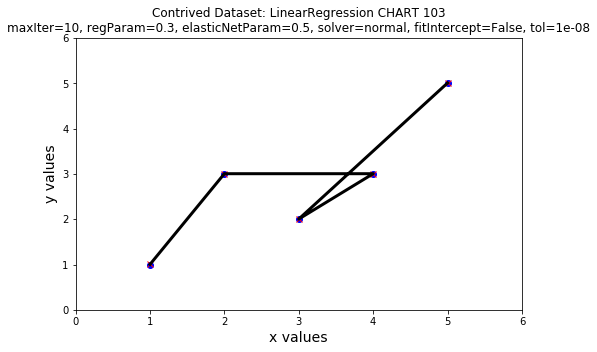

--------------------------------------------------

CHART 104

(1.0014638598505712, 1)
(3.0043915795517133, 2)
(3.0043915795517133, 4)
(2.0029277197011424, 3)
(5.007319299252856, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598849 , RMSE:  0.773854
## Multiple R-squared: 0.945559 ,             Total iterations: 3
Coefficients: [1.0014638598505712]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0014638598505712, 3.0043915795517133, 3.0043915795517133, 2.0029277197011424, 5.007319299252856]


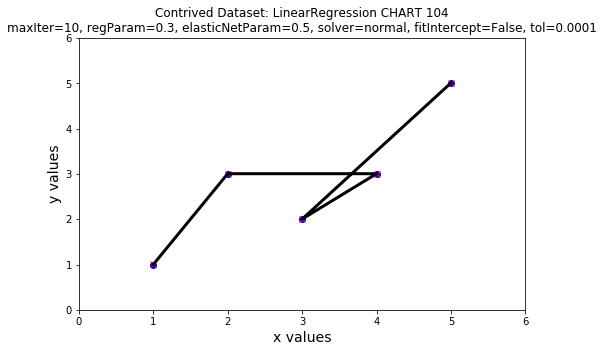

--------------------------------------------------

CHART 105

(1.0014638598505712, 1)
(3.0043915795517133, 2)
(3.0043915795517133, 4)
(2.0029277197011424, 3)
(5.007319299252856, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598849 , RMSE:  0.773854
## Multiple R-squared: 0.945559 ,             Total iterations: 3
Coefficients: [1.0014638598505712]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0014638598505712, 3.0043915795517133, 3.0043915795517133, 2.0029277197011424, 5.007319299252856]


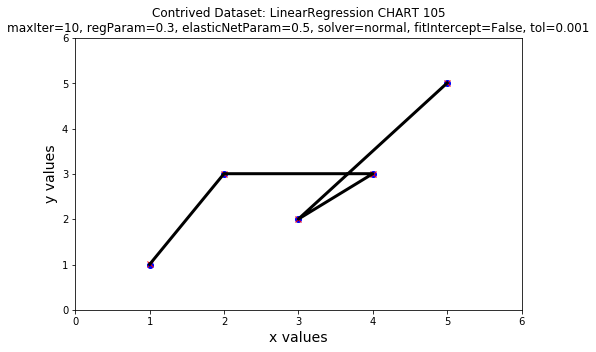

--------------------------------------------------

CHART 106

(1.0014638598505712, 1)
(3.0043915795517133, 2)
(3.0043915795517133, 4)
(2.0029277197011424, 3)
(5.007319299252856, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598849 , RMSE:  0.773854
## Multiple R-squared: 0.945559 ,             Total iterations: 3
Coefficients: [1.0014638598505712]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0014638598505712, 3.0043915795517133, 3.0043915795517133, 2.0029277197011424, 5.007319299252856]


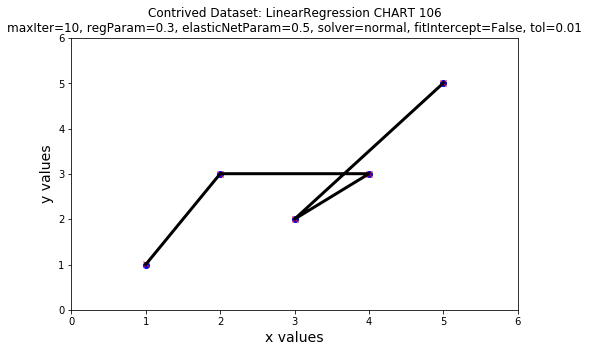

--------------------------------------------------

CHART 107

(1.0014638598505712, 1)
(3.0043915795517133, 2)
(3.0043915795517133, 4)
(2.0029277197011424, 3)
(5.007319299252856, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598849 , RMSE:  0.773854
## Multiple R-squared: 0.945559 ,             Total iterations: 3
Coefficients: [1.0014638598505712]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0014638598505712, 3.0043915795517133, 3.0043915795517133, 2.0029277197011424, 5.007319299252856]


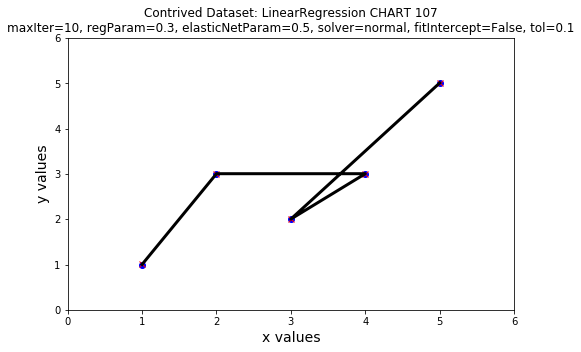

--------------------------------------------------

CHART 108

(1.0014638598505712, 1)
(3.0043915795517133, 2)
(3.0043915795517133, 4)
(2.0029277197011424, 3)
(5.007319299252856, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598849 , RMSE:  0.773854
## Multiple R-squared: 0.945559 ,             Total iterations: 3
Coefficients: [1.0014638598505712]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0014638598505712, 3.0043915795517133, 3.0043915795517133, 2.0029277197011424, 5.007319299252856]


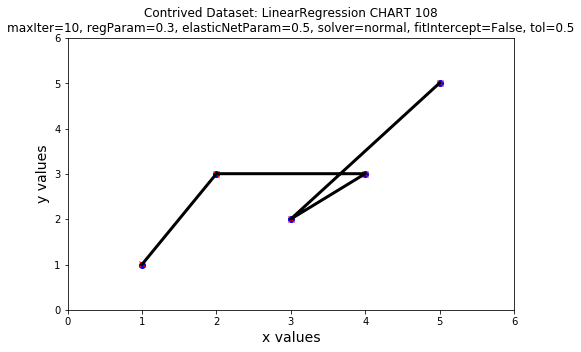

--------------------------------------------------

CHART 109

(1.740533206185354, 1)
(3.1399407548682943, 2)
(3.1399407548682943, 4)
(2.440236980526824, 3)
(4.539348303551234, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.622618 , RMSE:  0.789062
## Multiple R-squared: 0.688691 ,             Total iterations: 3
Coefficients: [0.69970377434147]
Intercept: 1.040829431843884
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.740533206185354, 3.1399407548682943, 3.1399407548682943, 2.440236980526824, 4.539348303551234]


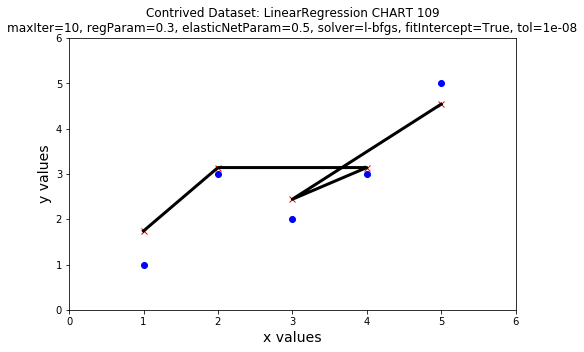

--------------------------------------------------

CHART 110

(1.740533206185354, 1)
(3.1399407548682943, 2)
(3.1399407548682943, 4)
(2.440236980526824, 3)
(4.539348303551234, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.622618 , RMSE:  0.789062
## Multiple R-squared: 0.688691 ,             Total iterations: 3
Coefficients: [0.69970377434147]
Intercept: 1.040829431843884
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.740533206185354, 3.1399407548682943, 3.1399407548682943, 2.440236980526824, 4.539348303551234]


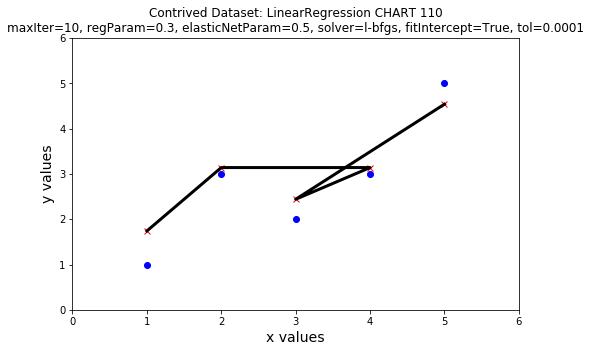

--------------------------------------------------

CHART 111

(1.740533206185354, 1)
(3.1399407548682943, 2)
(3.1399407548682943, 4)
(2.440236980526824, 3)
(4.539348303551234, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.622618 , RMSE:  0.789062
## Multiple R-squared: 0.688691 ,             Total iterations: 3
Coefficients: [0.69970377434147]
Intercept: 1.040829431843884
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.740533206185354, 3.1399407548682943, 3.1399407548682943, 2.440236980526824, 4.539348303551234]


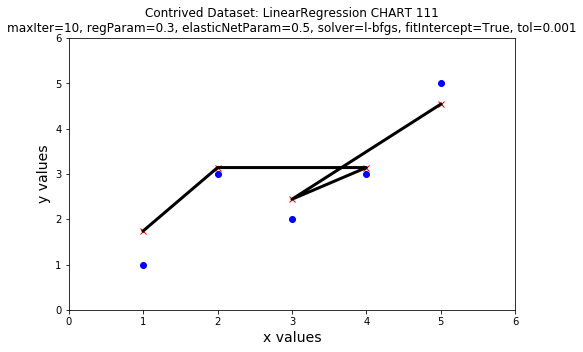

--------------------------------------------------

CHART 112

(1.740533206185354, 1)
(3.1399407548682943, 2)
(3.1399407548682943, 4)
(2.440236980526824, 3)
(4.539348303551234, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.622618 , RMSE:  0.789062
## Multiple R-squared: 0.688691 ,             Total iterations: 3
Coefficients: [0.69970377434147]
Intercept: 1.040829431843884
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.740533206185354, 3.1399407548682943, 3.1399407548682943, 2.440236980526824, 4.539348303551234]


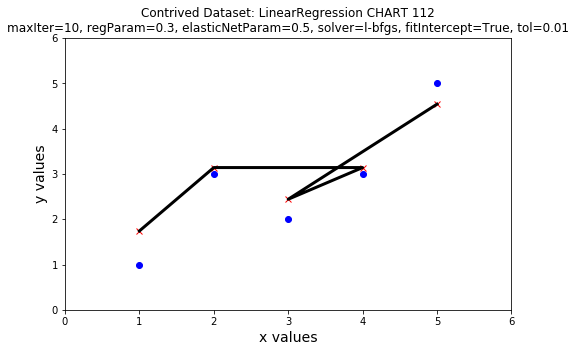

--------------------------------------------------

CHART 113

(1.740533206185354, 1)
(3.1399407548682943, 2)
(3.1399407548682943, 4)
(2.440236980526824, 3)
(4.539348303551234, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.622618 , RMSE:  0.789062
## Multiple R-squared: 0.688691 ,             Total iterations: 3
Coefficients: [0.69970377434147]
Intercept: 1.040829431843884
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.740533206185354, 3.1399407548682943, 3.1399407548682943, 2.440236980526824, 4.539348303551234]


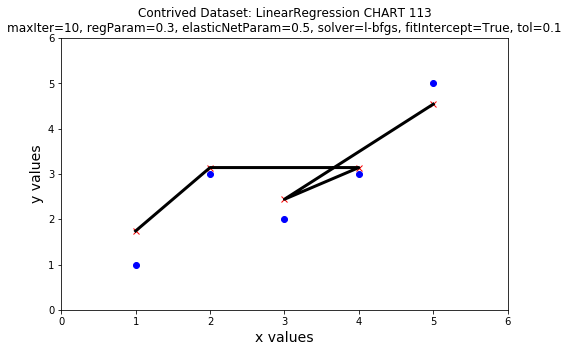

--------------------------------------------------

CHART 114

(1.740533206185354, 1)
(3.1399407548682943, 2)
(3.1399407548682943, 4)
(2.440236980526824, 3)
(4.539348303551234, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.622618 , RMSE:  0.789062
## Multiple R-squared: 0.688691 ,             Total iterations: 3
Coefficients: [0.69970377434147]
Intercept: 1.040829431843884
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.740533206185354, 3.1399407548682943, 3.1399407548682943, 2.440236980526824, 4.539348303551234]


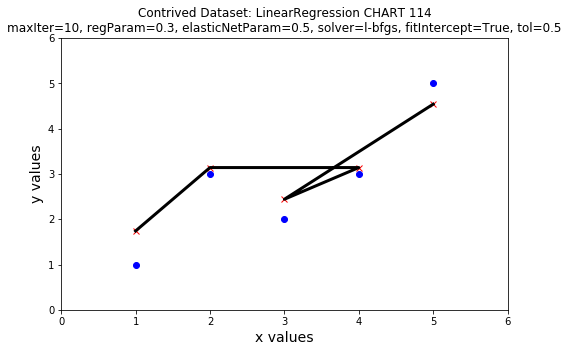

--------------------------------------------------

CHART 115

(0.9968195329305766, 1)
(2.99045859879173, 2)
(2.99045859879173, 4)
(1.9936390658611531, 3)
(4.984097664652883, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.602641 , RMSE:  0.776300
## Multiple R-squared: 0.945214 ,             Total iterations: 3
Coefficients: [0.9968195329305766]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9968195329305766, 2.99045859879173, 2.99045859879173, 1.9936390658611531, 4.984097664652883]


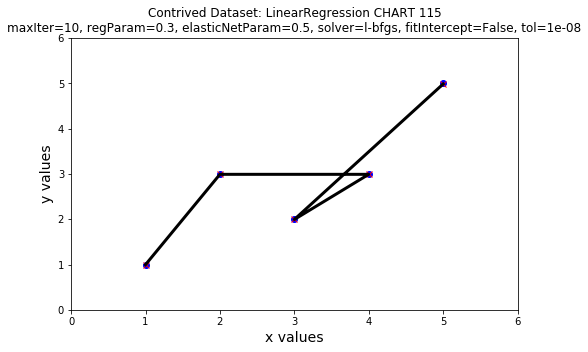

--------------------------------------------------

CHART 116

(0.9968195329305766, 1)
(2.99045859879173, 2)
(2.99045859879173, 4)
(1.9936390658611531, 3)
(4.984097664652883, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.602641 , RMSE:  0.776300
## Multiple R-squared: 0.945214 ,             Total iterations: 3
Coefficients: [0.9968195329305766]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9968195329305766, 2.99045859879173, 2.99045859879173, 1.9936390658611531, 4.984097664652883]


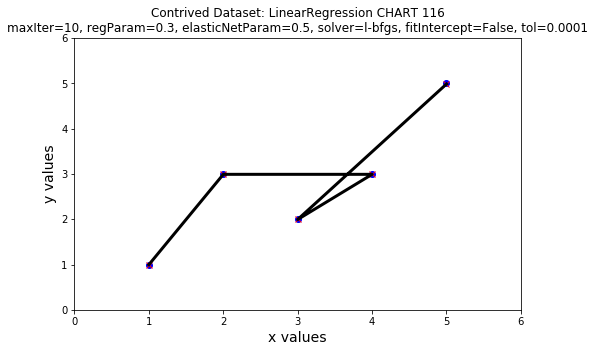

--------------------------------------------------

CHART 117

(0.9968195329305766, 1)
(2.99045859879173, 2)
(2.99045859879173, 4)
(1.9936390658611531, 3)
(4.984097664652883, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.602641 , RMSE:  0.776300
## Multiple R-squared: 0.945214 ,             Total iterations: 3
Coefficients: [0.9968195329305766]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9968195329305766, 2.99045859879173, 2.99045859879173, 1.9936390658611531, 4.984097664652883]


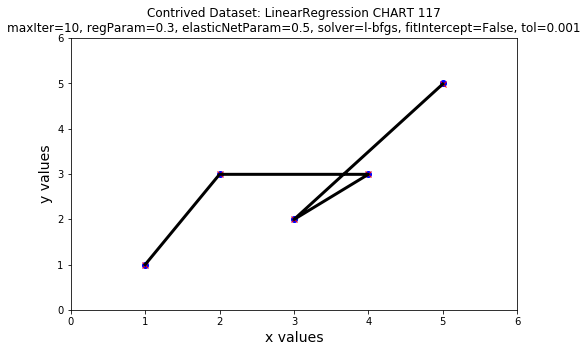

--------------------------------------------------

CHART 118

(0.9968195329305766, 1)
(2.99045859879173, 2)
(2.99045859879173, 4)
(1.9936390658611531, 3)
(4.984097664652883, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.602641 , RMSE:  0.776300
## Multiple R-squared: 0.945214 ,             Total iterations: 3
Coefficients: [0.9968195329305766]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9968195329305766, 2.99045859879173, 2.99045859879173, 1.9936390658611531, 4.984097664652883]


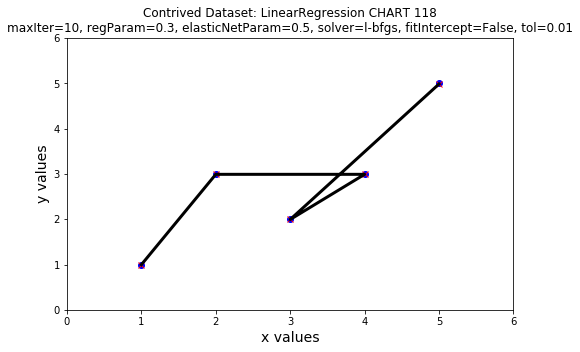

--------------------------------------------------

CHART 119

(0.9968195329305766, 1)
(2.99045859879173, 2)
(2.99045859879173, 4)
(1.9936390658611531, 3)
(4.984097664652883, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.602641 , RMSE:  0.776300
## Multiple R-squared: 0.945214 ,             Total iterations: 3
Coefficients: [0.9968195329305766]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9968195329305766, 2.99045859879173, 2.99045859879173, 1.9936390658611531, 4.984097664652883]


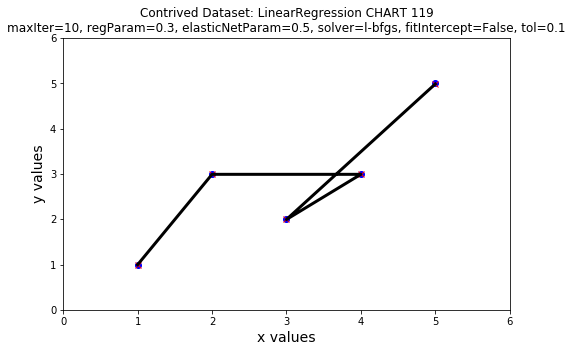

--------------------------------------------------

CHART 120

(0.9968195329305766, 1)
(2.99045859879173, 2)
(2.99045859879173, 4)
(1.9936390658611531, 3)
(4.984097664652883, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.602641 , RMSE:  0.776300
## Multiple R-squared: 0.945214 ,             Total iterations: 3
Coefficients: [0.9968195329305766]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9968195329305766, 2.99045859879173, 2.99045859879173, 1.9936390658611531, 4.984097664652883]


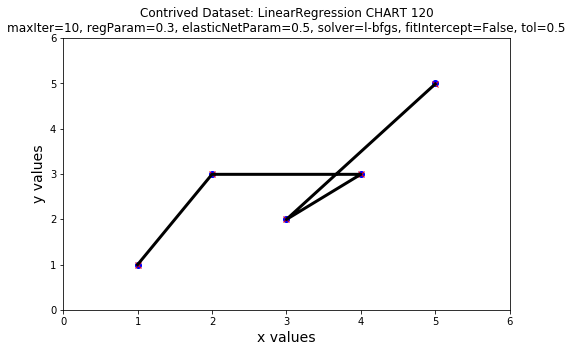

--------------------------------------------------

CHART 121

(1.7706766788163533, 1)
(3.1365914801315165, 2)
(3.1365914801315165, 4)
(2.453634079473935, 3)
(4.50250628144668, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.635455 , RMSE:  0.797154
## Multiple R-squared: 0.682273 ,             Total iterations: 3
Coefficients: [0.6829574006575815]
Intercept: 1.087719278158772
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7706766788163533, 3.1365914801315165, 3.1365914801315165, 2.453634079473935, 4.50250628144668]


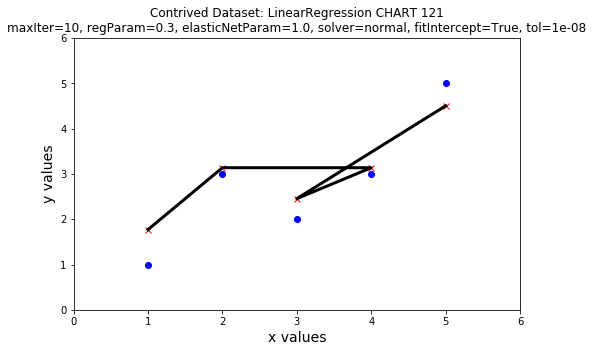

--------------------------------------------------

CHART 122

(1.7706766788163533, 1)
(3.1365914801315165, 2)
(3.1365914801315165, 4)
(2.453634079473935, 3)
(4.50250628144668, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.635455 , RMSE:  0.797154
## Multiple R-squared: 0.682273 ,             Total iterations: 3
Coefficients: [0.6829574006575815]
Intercept: 1.087719278158772
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7706766788163533, 3.1365914801315165, 3.1365914801315165, 2.453634079473935, 4.50250628144668]


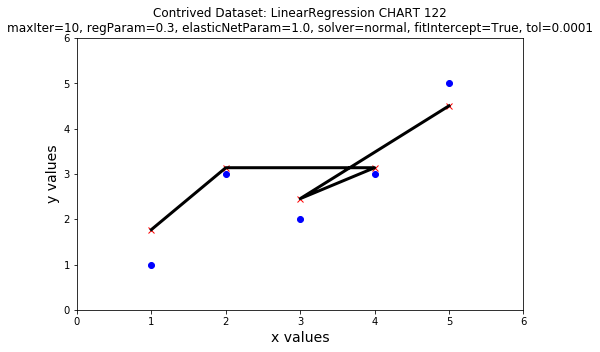

--------------------------------------------------

CHART 123

(1.7706766788163533, 1)
(3.1365914801315165, 2)
(3.1365914801315165, 4)
(2.453634079473935, 3)
(4.50250628144668, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.635455 , RMSE:  0.797154
## Multiple R-squared: 0.682273 ,             Total iterations: 3
Coefficients: [0.6829574006575815]
Intercept: 1.087719278158772
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7706766788163533, 3.1365914801315165, 3.1365914801315165, 2.453634079473935, 4.50250628144668]


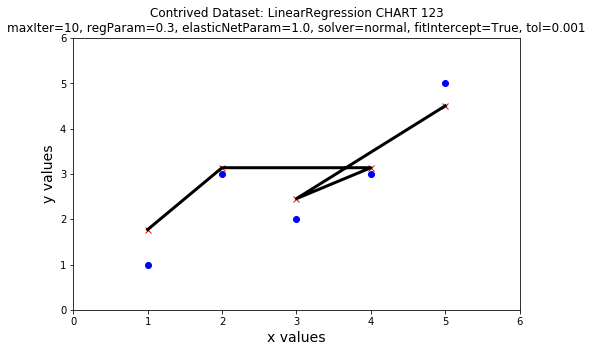

--------------------------------------------------

CHART 124

(1.7706766788163533, 1)
(3.1365914801315165, 2)
(3.1365914801315165, 4)
(2.453634079473935, 3)
(4.50250628144668, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.635455 , RMSE:  0.797154
## Multiple R-squared: 0.682273 ,             Total iterations: 3
Coefficients: [0.6829574006575815]
Intercept: 1.087719278158772
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7706766788163533, 3.1365914801315165, 3.1365914801315165, 2.453634079473935, 4.50250628144668]


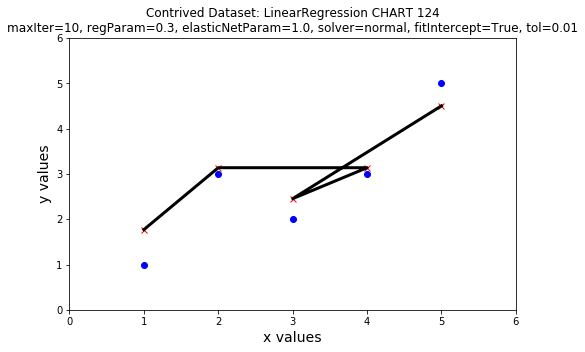

--------------------------------------------------

CHART 125

(1.7706766788163533, 1)
(3.1365914801315165, 2)
(3.1365914801315165, 4)
(2.453634079473935, 3)
(4.50250628144668, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.635455 , RMSE:  0.797154
## Multiple R-squared: 0.682273 ,             Total iterations: 3
Coefficients: [0.6829574006575815]
Intercept: 1.087719278158772
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7706766788163533, 3.1365914801315165, 3.1365914801315165, 2.453634079473935, 4.50250628144668]


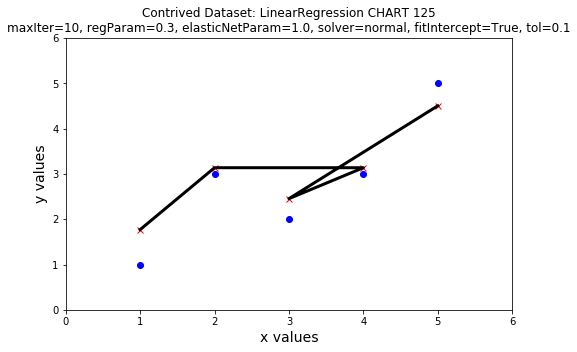

--------------------------------------------------

CHART 126

(1.7706766788163533, 1)
(3.1365914801315165, 2)
(3.1365914801315165, 4)
(2.453634079473935, 3)
(4.50250628144668, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.635455 , RMSE:  0.797154
## Multiple R-squared: 0.682273 ,             Total iterations: 3
Coefficients: [0.6829574006575815]
Intercept: 1.087719278158772
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7706766788163533, 3.1365914801315165, 3.1365914801315165, 2.453634079473935, 4.50250628144668]


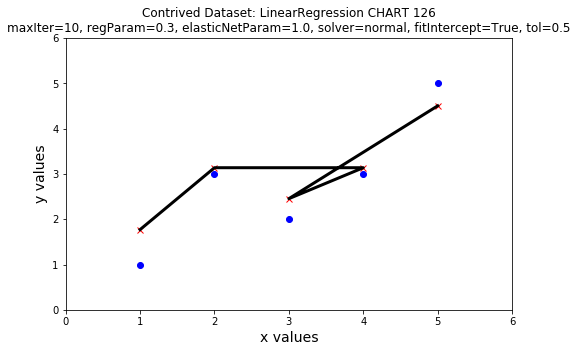

--------------------------------------------------

CHART 127

(1.0002088567872238, 1)
(3.0006265703616712, 2)
(3.0006265703616712, 4)
(2.0004177135744476, 3)
(5.001044283936119, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.599833 , RMSE:  0.774489
## Multiple R-squared: 0.945470 ,             Total iterations: 3
Coefficients: [1.0002088567872238]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0002088567872238, 3.0006265703616712, 3.0006265703616712, 2.0004177135744476, 5.001044283936119]


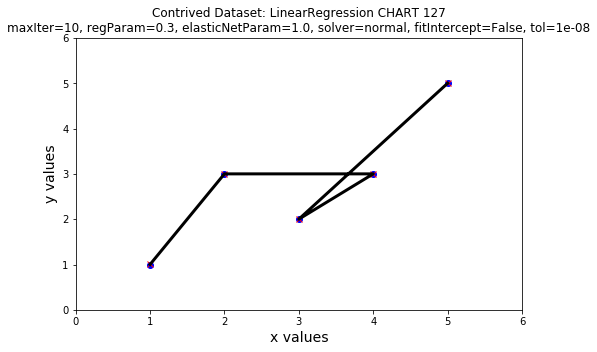

--------------------------------------------------

CHART 128

(1.0002088567872238, 1)
(3.0006265703616712, 2)
(3.0006265703616712, 4)
(2.0004177135744476, 3)
(5.001044283936119, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.599833 , RMSE:  0.774489
## Multiple R-squared: 0.945470 ,             Total iterations: 3
Coefficients: [1.0002088567872238]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0002088567872238, 3.0006265703616712, 3.0006265703616712, 2.0004177135744476, 5.001044283936119]


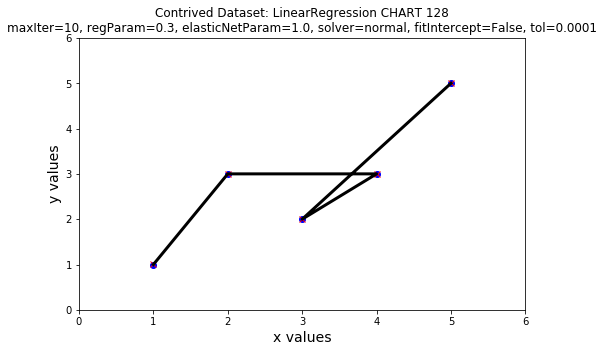

--------------------------------------------------

CHART 129

(1.0002088567872238, 1)
(3.0006265703616712, 2)
(3.0006265703616712, 4)
(2.0004177135744476, 3)
(5.001044283936119, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.599833 , RMSE:  0.774489
## Multiple R-squared: 0.945470 ,             Total iterations: 3
Coefficients: [1.0002088567872238]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0002088567872238, 3.0006265703616712, 3.0006265703616712, 2.0004177135744476, 5.001044283936119]


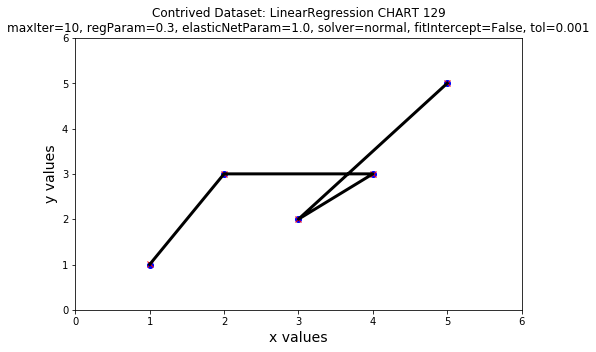

--------------------------------------------------

CHART 130

(1.0002088567872238, 1)
(3.0006265703616712, 2)
(3.0006265703616712, 4)
(2.0004177135744476, 3)
(5.001044283936119, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.599833 , RMSE:  0.774489
## Multiple R-squared: 0.945470 ,             Total iterations: 3
Coefficients: [1.0002088567872238]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0002088567872238, 3.0006265703616712, 3.0006265703616712, 2.0004177135744476, 5.001044283936119]


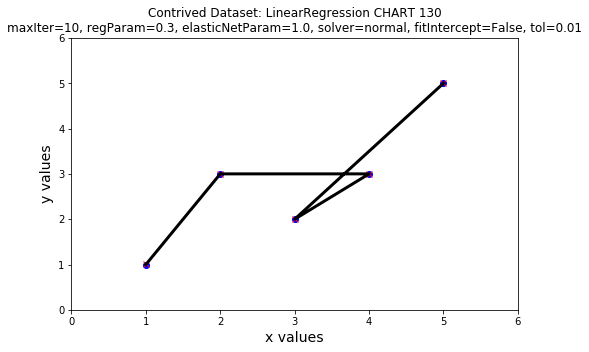

--------------------------------------------------

CHART 131

(1.0002088567872238, 1)
(3.0006265703616712, 2)
(3.0006265703616712, 4)
(2.0004177135744476, 3)
(5.001044283936119, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.599833 , RMSE:  0.774489
## Multiple R-squared: 0.945470 ,             Total iterations: 3
Coefficients: [1.0002088567872238]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0002088567872238, 3.0006265703616712, 3.0006265703616712, 2.0004177135744476, 5.001044283936119]


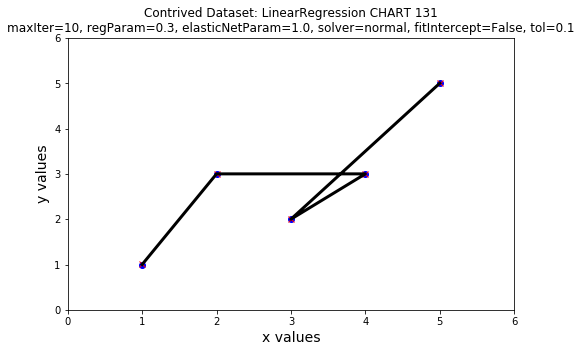

--------------------------------------------------

CHART 132

(1.0002088567872238, 1)
(3.0006265703616712, 2)
(3.0006265703616712, 4)
(2.0004177135744476, 3)
(5.001044283936119, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.599833 , RMSE:  0.774489
## Multiple R-squared: 0.945470 ,             Total iterations: 3
Coefficients: [1.0002088567872238]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0002088567872238, 3.0006265703616712, 3.0006265703616712, 2.0004177135744476, 5.001044283936119]


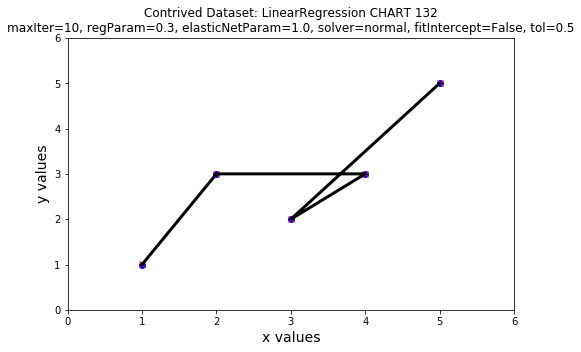

--------------------------------------------------

CHART 133

(1.8187212707990552, 1)
(3.1312531921334386, 2)
(3.1312531921334386, 4)
(2.4749872314662467, 3)
(4.443785113467822, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.657955 , RMSE:  0.811144
## Multiple R-squared: 0.671023 ,             Total iterations: 3
Coefficients: [0.6562659606671916]
Intercept: 1.1624553101318638
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.8187212707990552, 3.1312531921334386, 3.1312531921334386, 2.4749872314662467, 4.443785113467822]


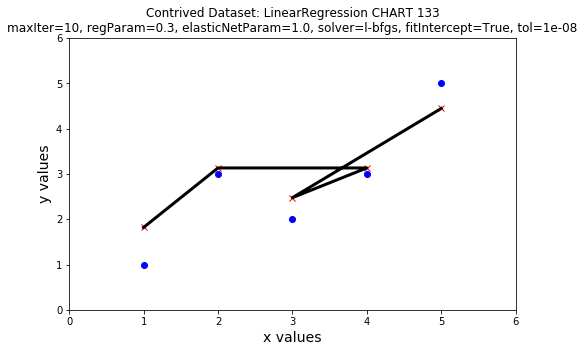

--------------------------------------------------

CHART 134

(1.8187212707990552, 1)
(3.1312531921334386, 2)
(3.1312531921334386, 4)
(2.4749872314662467, 3)
(4.443785113467822, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.657955 , RMSE:  0.811144
## Multiple R-squared: 0.671023 ,             Total iterations: 3
Coefficients: [0.6562659606671916]
Intercept: 1.1624553101318638
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.8187212707990552, 3.1312531921334386, 3.1312531921334386, 2.4749872314662467, 4.443785113467822]


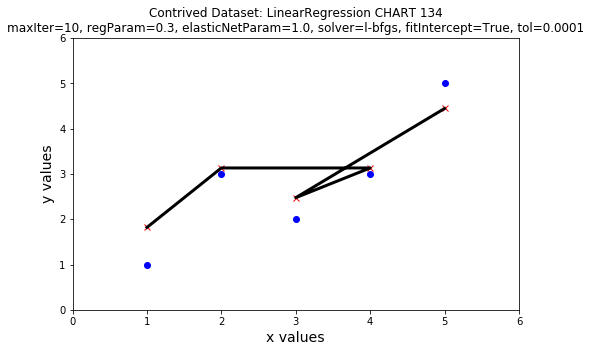

--------------------------------------------------

CHART 135

(1.8187212707990552, 1)
(3.1312531921334386, 2)
(3.1312531921334386, 4)
(2.4749872314662467, 3)
(4.443785113467822, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.657955 , RMSE:  0.811144
## Multiple R-squared: 0.671023 ,             Total iterations: 3
Coefficients: [0.6562659606671916]
Intercept: 1.1624553101318638
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.8187212707990552, 3.1312531921334386, 3.1312531921334386, 2.4749872314662467, 4.443785113467822]


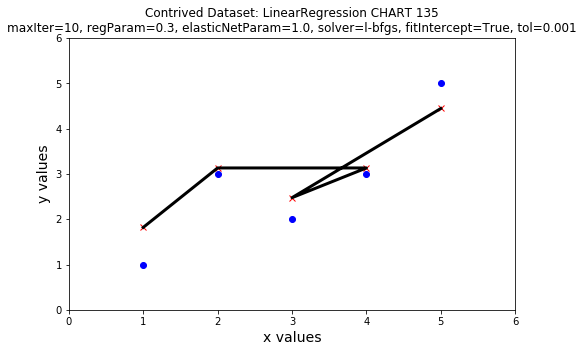

--------------------------------------------------

CHART 136

(1.8187212707990552, 1)
(3.1312531921334386, 2)
(3.1312531921334386, 4)
(2.4749872314662467, 3)
(4.443785113467822, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.657955 , RMSE:  0.811144
## Multiple R-squared: 0.671023 ,             Total iterations: 3
Coefficients: [0.6562659606671916]
Intercept: 1.1624553101318638
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.8187212707990552, 3.1312531921334386, 3.1312531921334386, 2.4749872314662467, 4.443785113467822]


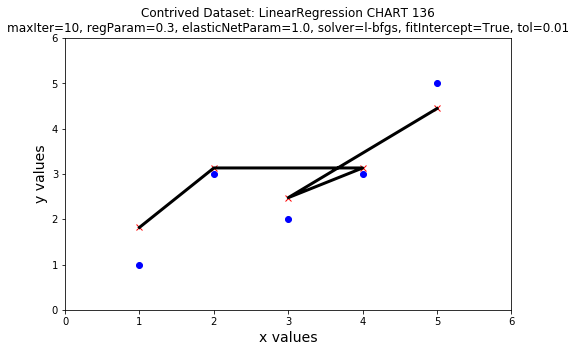

--------------------------------------------------

CHART 137

(1.8187212707990552, 1)
(3.1312531921334386, 2)
(3.1312531921334386, 4)
(2.4749872314662467, 3)
(4.443785113467822, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.657955 , RMSE:  0.811144
## Multiple R-squared: 0.671023 ,             Total iterations: 3
Coefficients: [0.6562659606671916]
Intercept: 1.1624553101318638
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.8187212707990552, 3.1312531921334386, 3.1312531921334386, 2.4749872314662467, 4.443785113467822]


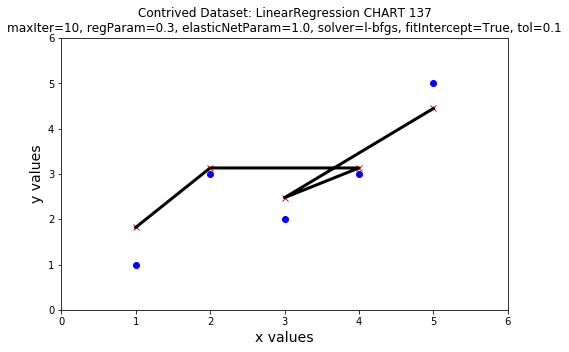

--------------------------------------------------

CHART 138

(1.8187212707990552, 1)
(3.1312531921334386, 2)
(3.1312531921334386, 4)
(2.4749872314662467, 3)
(4.443785113467822, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.657955 , RMSE:  0.811144
## Multiple R-squared: 0.671023 ,             Total iterations: 3
Coefficients: [0.6562659606671916]
Intercept: 1.1624553101318638
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.8187212707990552, 3.1312531921334386, 3.1312531921334386, 2.4749872314662467, 4.443785113467822]


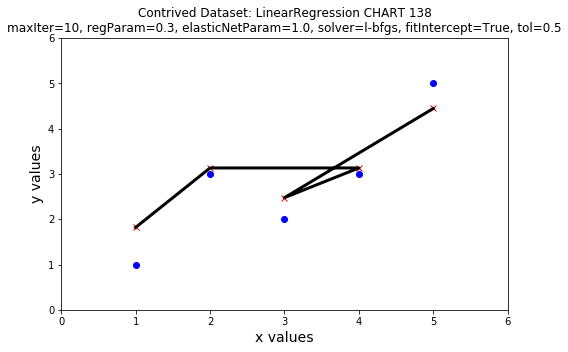

--------------------------------------------------

CHART 139

(0.9953154261223206, 1)
(2.9859462783669617, 2)
(2.9859462783669617, 4)
(1.9906308522446412, 3)
(4.976577130611603, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.603958 , RMSE:  0.777148
## Multiple R-squared: 0.945095 ,             Total iterations: 3
Coefficients: [0.9953154261223206]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9953154261223206, 2.9859462783669617, 2.9859462783669617, 1.9906308522446412, 4.976577130611603]


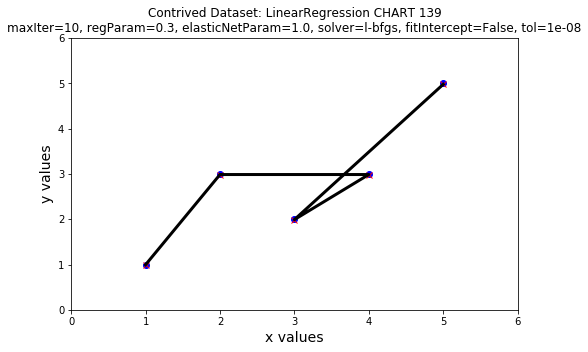

--------------------------------------------------

CHART 140

(0.9953154261223206, 1)
(2.9859462783669617, 2)
(2.9859462783669617, 4)
(1.9906308522446412, 3)
(4.976577130611603, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.603958 , RMSE:  0.777148
## Multiple R-squared: 0.945095 ,             Total iterations: 3
Coefficients: [0.9953154261223206]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9953154261223206, 2.9859462783669617, 2.9859462783669617, 1.9906308522446412, 4.976577130611603]


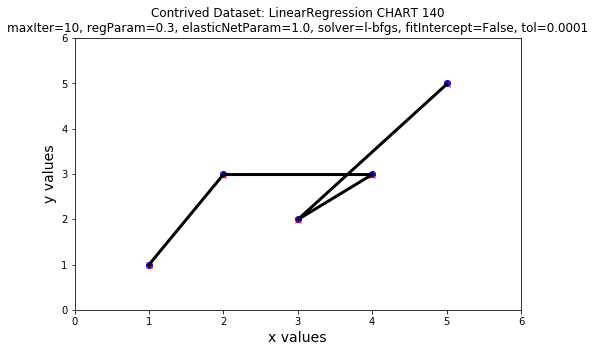

--------------------------------------------------

CHART 141

(0.9953154261223206, 1)
(2.9859462783669617, 2)
(2.9859462783669617, 4)
(1.9906308522446412, 3)
(4.976577130611603, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.603958 , RMSE:  0.777148
## Multiple R-squared: 0.945095 ,             Total iterations: 3
Coefficients: [0.9953154261223206]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9953154261223206, 2.9859462783669617, 2.9859462783669617, 1.9906308522446412, 4.976577130611603]


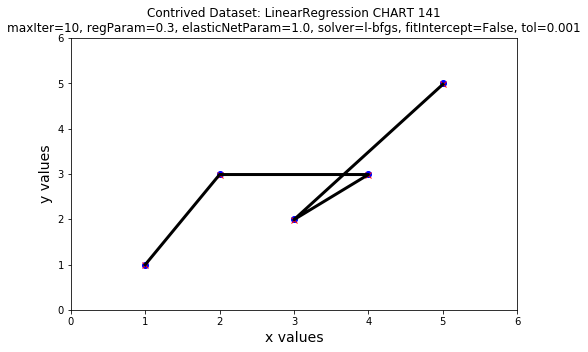

--------------------------------------------------

CHART 142

(0.9953154261223206, 1)
(2.9859462783669617, 2)
(2.9859462783669617, 4)
(1.9906308522446412, 3)
(4.976577130611603, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.603958 , RMSE:  0.777148
## Multiple R-squared: 0.945095 ,             Total iterations: 3
Coefficients: [0.9953154261223206]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9953154261223206, 2.9859462783669617, 2.9859462783669617, 1.9906308522446412, 4.976577130611603]


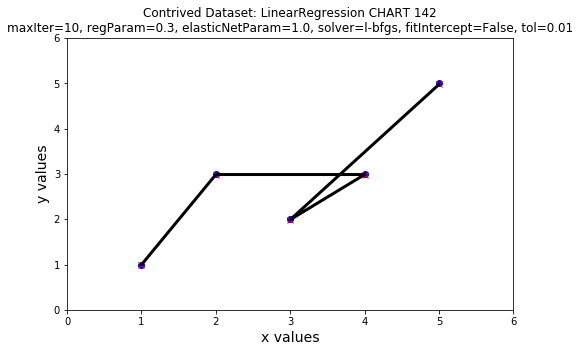

--------------------------------------------------

CHART 143

(0.9953154261223206, 1)
(2.9859462783669617, 2)
(2.9859462783669617, 4)
(1.9906308522446412, 3)
(4.976577130611603, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.603958 , RMSE:  0.777148
## Multiple R-squared: 0.945095 ,             Total iterations: 3
Coefficients: [0.9953154261223206]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9953154261223206, 2.9859462783669617, 2.9859462783669617, 1.9906308522446412, 4.976577130611603]


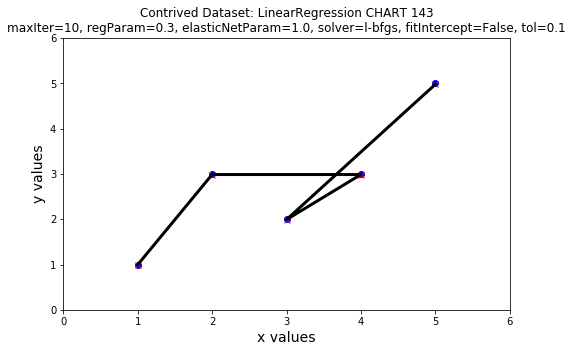

--------------------------------------------------

CHART 144

(0.9953154261223206, 1)
(2.9859462783669617, 2)
(2.9859462783669617, 4)
(1.9906308522446412, 3)
(4.976577130611603, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.603958 , RMSE:  0.777148
## Multiple R-squared: 0.945095 ,             Total iterations: 3
Coefficients: [0.9953154261223206]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9953154261223206, 2.9859462783669617, 2.9859462783669617, 1.9906308522446412, 4.976577130611603]


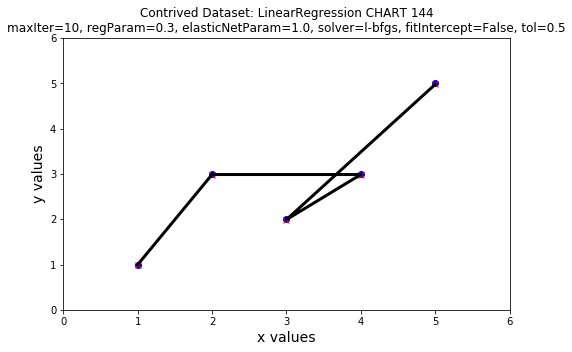

--------------------------------------------------

CHART 145

(2.041440374792338, 1)
(3.1065066250230737, 2)
(3.1065066250230737, 4)
(2.573973499907706, 3)
(4.171572875253809, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.532533   0.296989    1.793   0.170856
##   1.508907   0.978015    1.543   0.220552
## ---
## Mean squared error:  0.795015 , RMSE:  0.891636
## Multiple R-squared: 0.602492 ,             Total iterations: 1
Coefficients: [0.5325331251153678]
Intercept: 1.5089072496769704
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.041440374792338, 3.1065066250230737, 3.1065066250230737, 2.573973499907706, 4.171572875253809]


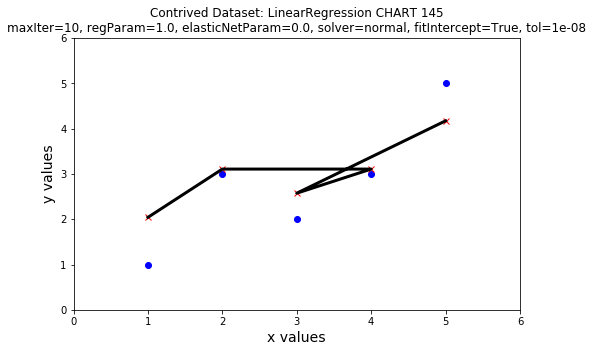

--------------------------------------------------

CHART 146

(2.041440374792338, 1)
(3.1065066250230737, 2)
(3.1065066250230737, 4)
(2.573973499907706, 3)
(4.171572875253809, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.532533   0.296989    1.793   0.170856
##   1.508907   0.978015    1.543   0.220552
## ---
## Mean squared error:  0.795015 , RMSE:  0.891636
## Multiple R-squared: 0.602492 ,             Total iterations: 1
Coefficients: [0.5325331251153678]
Intercept: 1.5089072496769704
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.041440374792338, 3.1065066250230737, 3.1065066250230737, 2.573973499907706, 4.171572875253809]


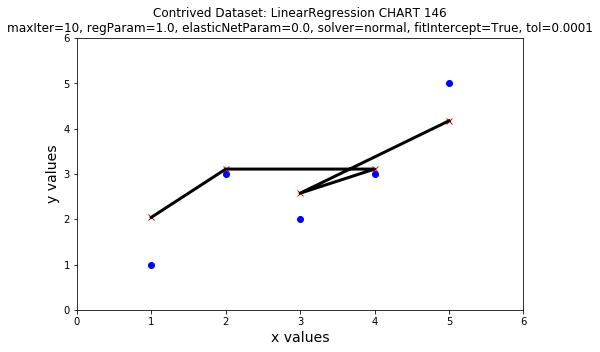

--------------------------------------------------

CHART 147

(2.041440374792338, 1)
(3.1065066250230737, 2)
(3.1065066250230737, 4)
(2.573973499907706, 3)
(4.171572875253809, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.532533   0.296989    1.793   0.170856
##   1.508907   0.978015    1.543   0.220552
## ---
## Mean squared error:  0.795015 , RMSE:  0.891636
## Multiple R-squared: 0.602492 ,             Total iterations: 1
Coefficients: [0.5325331251153678]
Intercept: 1.5089072496769704
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.041440374792338, 3.1065066250230737, 3.1065066250230737, 2.573973499907706, 4.171572875253809]


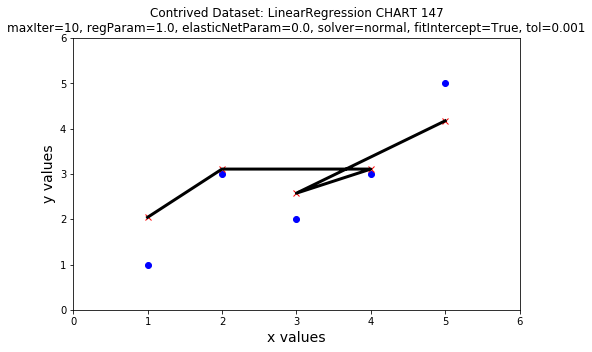

--------------------------------------------------

CHART 148

(2.041440374792338, 1)
(3.1065066250230737, 2)
(3.1065066250230737, 4)
(2.573973499907706, 3)
(4.171572875253809, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.532533   0.296989    1.793   0.170856
##   1.508907   0.978015    1.543   0.220552
## ---
## Mean squared error:  0.795015 , RMSE:  0.891636
## Multiple R-squared: 0.602492 ,             Total iterations: 1
Coefficients: [0.5325331251153678]
Intercept: 1.5089072496769704
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.041440374792338, 3.1065066250230737, 3.1065066250230737, 2.573973499907706, 4.171572875253809]


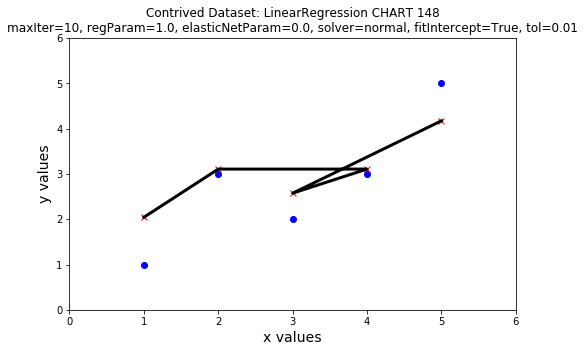

--------------------------------------------------

CHART 149

(2.041440374792338, 1)
(3.1065066250230737, 2)
(3.1065066250230737, 4)
(2.573973499907706, 3)
(4.171572875253809, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.532533   0.296989    1.793   0.170856
##   1.508907   0.978015    1.543   0.220552
## ---
## Mean squared error:  0.795015 , RMSE:  0.891636
## Multiple R-squared: 0.602492 ,             Total iterations: 1
Coefficients: [0.5325331251153678]
Intercept: 1.5089072496769704
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.041440374792338, 3.1065066250230737, 3.1065066250230737, 2.573973499907706, 4.171572875253809]


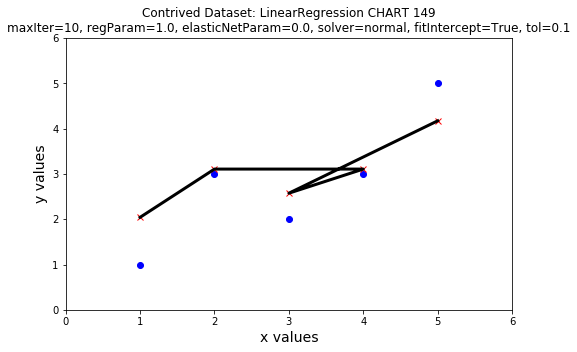

--------------------------------------------------

CHART 150

(2.041440374792338, 1)
(3.1065066250230737, 2)
(3.1065066250230737, 4)
(2.573973499907706, 3)
(4.171572875253809, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.532533   0.296989    1.793   0.170856
##   1.508907   0.978015    1.543   0.220552
## ---
## Mean squared error:  0.795015 , RMSE:  0.891636
## Multiple R-squared: 0.602492 ,             Total iterations: 1
Coefficients: [0.5325331251153678]
Intercept: 1.5089072496769704
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.041440374792338, 3.1065066250230737, 3.1065066250230737, 2.573973499907706, 4.171572875253809]


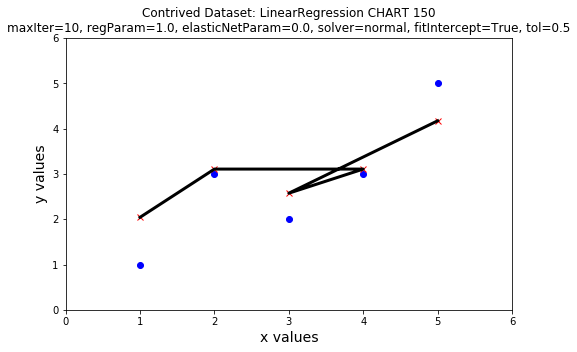

--------------------------------------------------

CHART 151

(0.9221257488160046, 1)
(2.766377246448014, 2)
(2.766377246448014, 4)
(1.8442514976320092, 3)
(4.610628744080023, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.922126   0.128881    7.155   0.002019
## ---
## Mean squared error:  0.720518 , RMSE:  0.848833
## Multiple R-squared: 0.934498 ,             Total iterations: 1
Coefficients: [0.9221257488160046]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9221257488160046, 2.766377246448014, 2.766377246448014, 1.8442514976320092, 4.610628744080023]


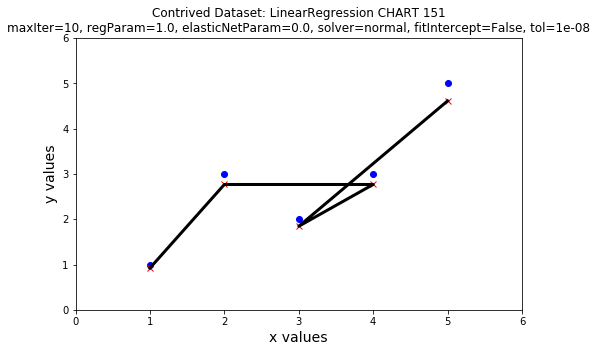

--------------------------------------------------

CHART 152

(0.9221257488160046, 1)
(2.766377246448014, 2)
(2.766377246448014, 4)
(1.8442514976320092, 3)
(4.610628744080023, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.922126   0.128881    7.155   0.002019
## ---
## Mean squared error:  0.720518 , RMSE:  0.848833
## Multiple R-squared: 0.934498 ,             Total iterations: 1
Coefficients: [0.9221257488160046]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9221257488160046, 2.766377246448014, 2.766377246448014, 1.8442514976320092, 4.610628744080023]


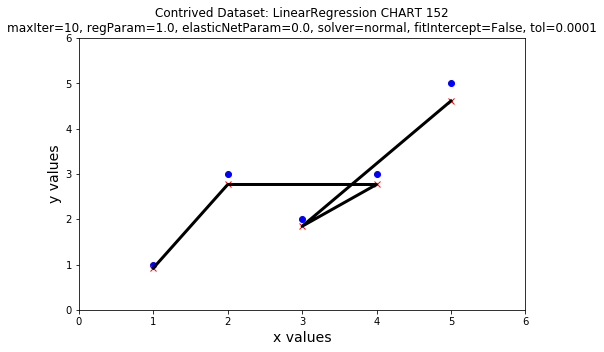

--------------------------------------------------

CHART 153

(0.9221257488160046, 1)
(2.766377246448014, 2)
(2.766377246448014, 4)
(1.8442514976320092, 3)
(4.610628744080023, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.922126   0.128881    7.155   0.002019
## ---
## Mean squared error:  0.720518 , RMSE:  0.848833
## Multiple R-squared: 0.934498 ,             Total iterations: 1
Coefficients: [0.9221257488160046]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9221257488160046, 2.766377246448014, 2.766377246448014, 1.8442514976320092, 4.610628744080023]


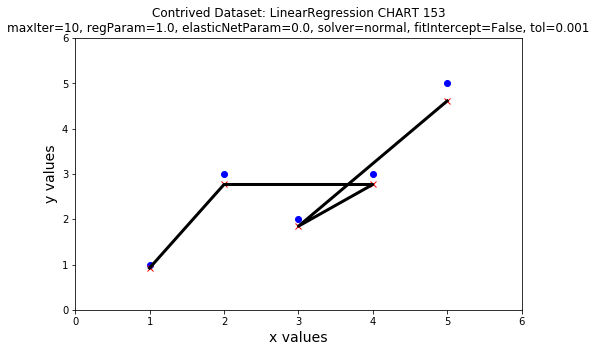

--------------------------------------------------

CHART 154

(0.9221257488160046, 1)
(2.766377246448014, 2)
(2.766377246448014, 4)
(1.8442514976320092, 3)
(4.610628744080023, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.922126   0.128881    7.155   0.002019
## ---
## Mean squared error:  0.720518 , RMSE:  0.848833
## Multiple R-squared: 0.934498 ,             Total iterations: 1
Coefficients: [0.9221257488160046]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9221257488160046, 2.766377246448014, 2.766377246448014, 1.8442514976320092, 4.610628744080023]


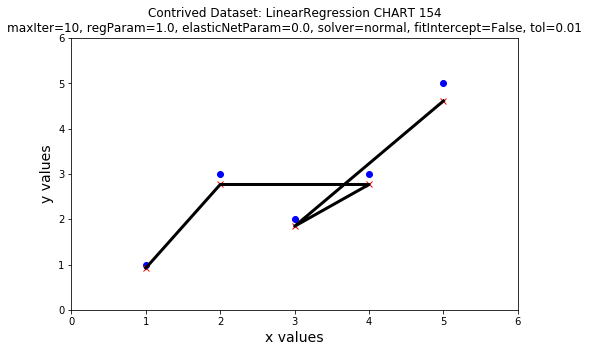

--------------------------------------------------

CHART 155

(0.9221257488160046, 1)
(2.766377246448014, 2)
(2.766377246448014, 4)
(1.8442514976320092, 3)
(4.610628744080023, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.922126   0.128881    7.155   0.002019
## ---
## Mean squared error:  0.720518 , RMSE:  0.848833
## Multiple R-squared: 0.934498 ,             Total iterations: 1
Coefficients: [0.9221257488160046]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9221257488160046, 2.766377246448014, 2.766377246448014, 1.8442514976320092, 4.610628744080023]


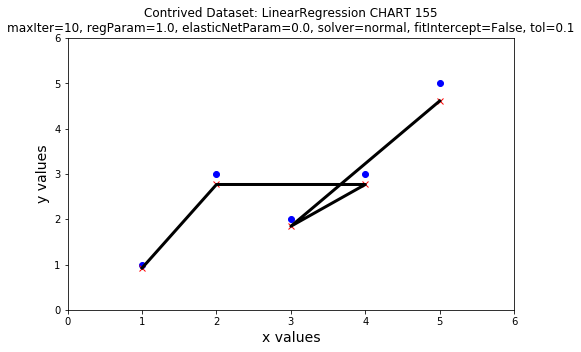

--------------------------------------------------

CHART 156

(0.9221257488160046, 1)
(2.766377246448014, 2)
(2.766377246448014, 4)
(1.8442514976320092, 3)
(4.610628744080023, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.922126   0.128881    7.155   0.002019
## ---
## Mean squared error:  0.720518 , RMSE:  0.848833
## Multiple R-squared: 0.934498 ,             Total iterations: 1
Coefficients: [0.9221257488160046]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9221257488160046, 2.766377246448014, 2.766377246448014, 1.8442514976320092, 4.610628744080023]


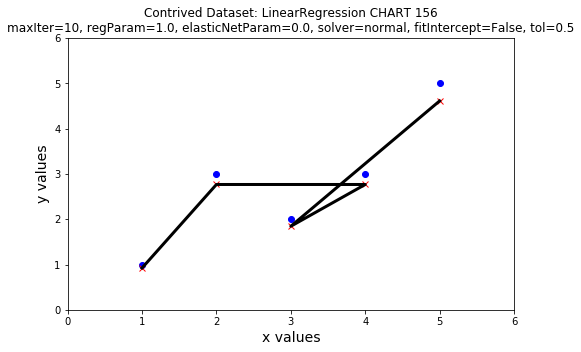

--------------------------------------------------

CHART 157

(2.086121083820051, 1)
(3.1015421017977722, 2)
(3.1015421017977722, 4)
(2.5938315928089115, 3)
(4.116963119775494, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.829002 , RMSE:  0.910495
## Multiple R-squared: 0.585499 ,             Total iterations: 2
Coefficients: [0.5077105089888608]
Intercept: 1.5784105748311898
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.086121083820051, 3.1015421017977722, 3.1015421017977722, 2.5938315928089115, 4.116963119775494]


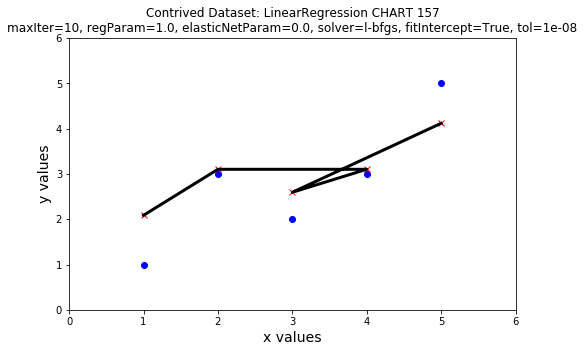

--------------------------------------------------

CHART 158

(2.086121083820051, 1)
(3.1015421017977722, 2)
(3.1015421017977722, 4)
(2.5938315928089115, 3)
(4.116963119775494, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.829002 , RMSE:  0.910495
## Multiple R-squared: 0.585499 ,             Total iterations: 2
Coefficients: [0.5077105089888608]
Intercept: 1.5784105748311898
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.086121083820051, 3.1015421017977722, 3.1015421017977722, 2.5938315928089115, 4.116963119775494]


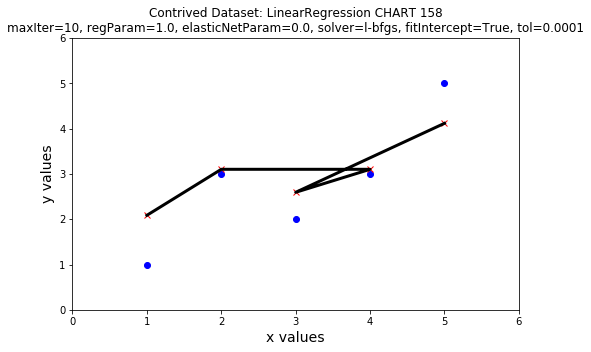

--------------------------------------------------

CHART 159

(2.086121083820051, 1)
(3.1015421017977722, 2)
(3.1015421017977722, 4)
(2.5938315928089115, 3)
(4.116963119775494, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.829002 , RMSE:  0.910495
## Multiple R-squared: 0.585499 ,             Total iterations: 2
Coefficients: [0.5077105089888608]
Intercept: 1.5784105748311898
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.086121083820051, 3.1015421017977722, 3.1015421017977722, 2.5938315928089115, 4.116963119775494]


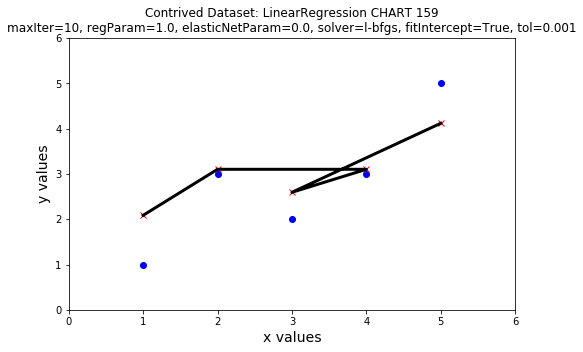

--------------------------------------------------

CHART 160

(2.086121083820051, 1)
(3.1015421017977722, 2)
(3.1015421017977722, 4)
(2.5938315928089115, 3)
(4.116963119775494, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.829002 , RMSE:  0.910495
## Multiple R-squared: 0.585499 ,             Total iterations: 2
Coefficients: [0.5077105089888608]
Intercept: 1.5784105748311898
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.086121083820051, 3.1015421017977722, 3.1015421017977722, 2.5938315928089115, 4.116963119775494]


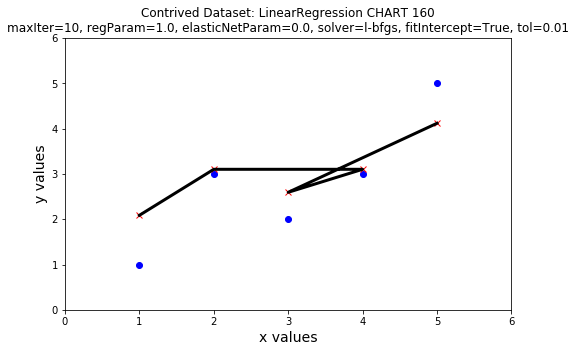

--------------------------------------------------

CHART 161

(2.086121083820051, 1)
(3.1015421017977722, 2)
(3.1015421017977722, 4)
(2.5938315928089115, 3)
(4.116963119775494, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.829002 , RMSE:  0.910495
## Multiple R-squared: 0.585499 ,             Total iterations: 2
Coefficients: [0.5077105089888608]
Intercept: 1.5784105748311898
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.086121083820051, 3.1015421017977722, 3.1015421017977722, 2.5938315928089115, 4.116963119775494]


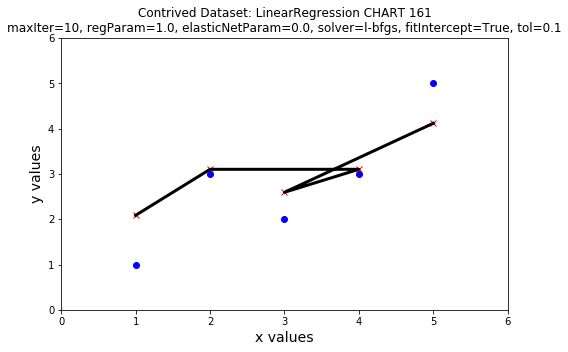

--------------------------------------------------

CHART 162

(2.086121083820051, 1)
(3.1015421017977722, 2)
(3.1015421017977722, 4)
(2.5938315928089115, 3)
(4.116963119775494, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.829002 , RMSE:  0.910495
## Multiple R-squared: 0.585499 ,             Total iterations: 2
Coefficients: [0.5077105089888608]
Intercept: 1.5784105748311898
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.086121083820051, 3.1015421017977722, 3.1015421017977722, 2.5938315928089115, 4.116963119775494]


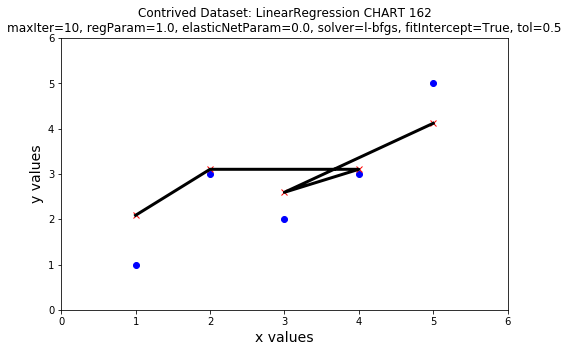

--------------------------------------------------

CHART 163

(0.909802029340964, 1)
(2.729406088022892, 2)
(2.729406088022892, 4)
(1.819604058681928, 3)
(4.54901014670482, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.750261 , RMSE:  0.866176
## Multiple R-squared: 0.931794 ,             Total iterations: 3
Coefficients: [0.909802029340964]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.909802029340964, 2.729406088022892, 2.729406088022892, 1.819604058681928, 4.54901014670482]


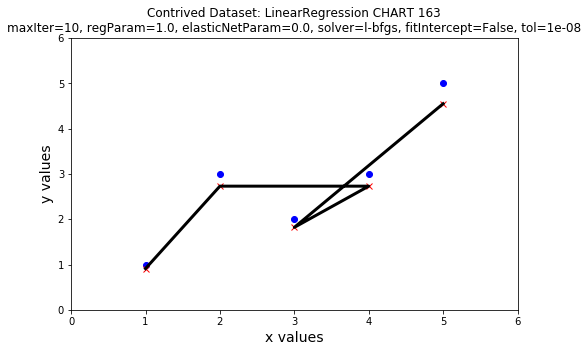

--------------------------------------------------

CHART 164

(0.909802029340964, 1)
(2.729406088022892, 2)
(2.729406088022892, 4)
(1.819604058681928, 3)
(4.54901014670482, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.750261 , RMSE:  0.866176
## Multiple R-squared: 0.931794 ,             Total iterations: 3
Coefficients: [0.909802029340964]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.909802029340964, 2.729406088022892, 2.729406088022892, 1.819604058681928, 4.54901014670482]


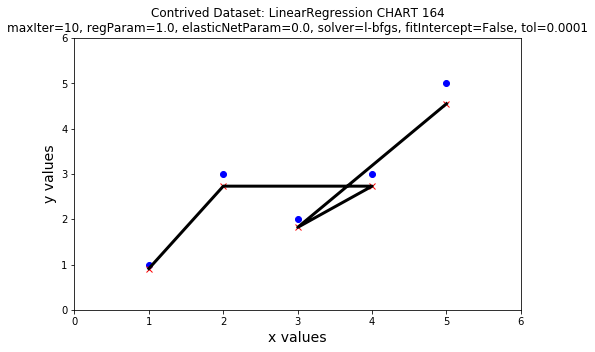

--------------------------------------------------

CHART 165

(0.909802029340964, 1)
(2.729406088022892, 2)
(2.729406088022892, 4)
(1.819604058681928, 3)
(4.54901014670482, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.750261 , RMSE:  0.866176
## Multiple R-squared: 0.931794 ,             Total iterations: 3
Coefficients: [0.909802029340964]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.909802029340964, 2.729406088022892, 2.729406088022892, 1.819604058681928, 4.54901014670482]


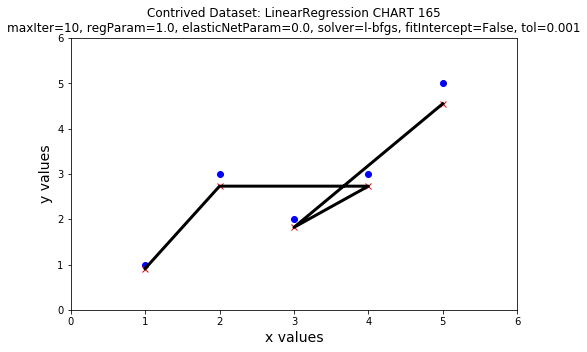

--------------------------------------------------

CHART 166

(0.909802029340964, 1)
(2.729406088022892, 2)
(2.729406088022892, 4)
(1.819604058681928, 3)
(4.54901014670482, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.750261 , RMSE:  0.866176
## Multiple R-squared: 0.931794 ,             Total iterations: 3
Coefficients: [0.909802029340964]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.909802029340964, 2.729406088022892, 2.729406088022892, 1.819604058681928, 4.54901014670482]


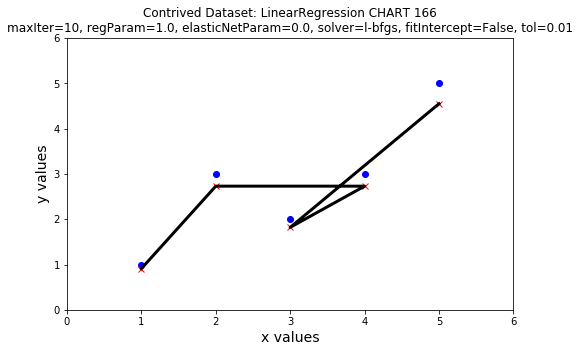

--------------------------------------------------

CHART 167

(0.909802029340964, 1)
(2.729406088022892, 2)
(2.729406088022892, 4)
(1.819604058681928, 3)
(4.54901014670482, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.750261 , RMSE:  0.866176
## Multiple R-squared: 0.931794 ,             Total iterations: 3
Coefficients: [0.909802029340964]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.909802029340964, 2.729406088022892, 2.729406088022892, 1.819604058681928, 4.54901014670482]


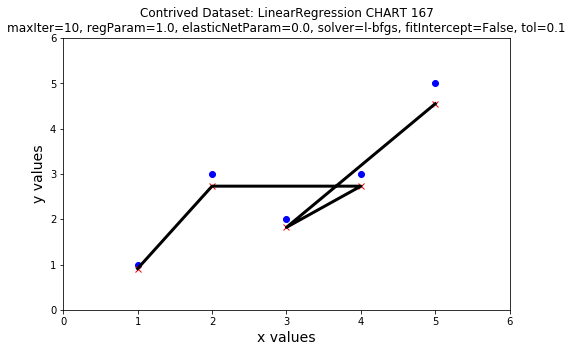

--------------------------------------------------

CHART 168

(0.909802029340964, 1)
(2.729406088022892, 2)
(2.729406088022892, 4)
(1.819604058681928, 3)
(4.54901014670482, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.750261 , RMSE:  0.866176
## Multiple R-squared: 0.931794 ,             Total iterations: 3
Coefficients: [0.909802029340964]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.909802029340964, 2.729406088022892, 2.729406088022892, 1.819604058681928, 4.54901014670482]


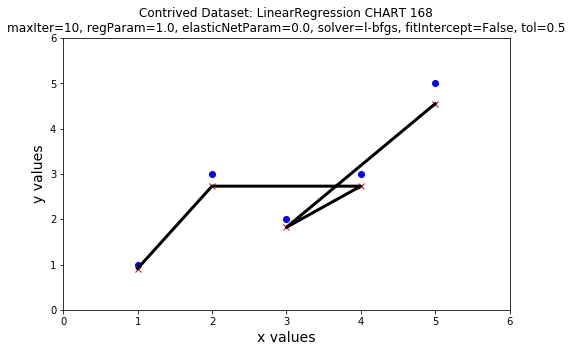

--------------------------------------------------

CHART 169

(2.2922605656184807, 1)
(3.07863771493128, 2)
(3.07863771493128, 4)
(2.6854491402748804, 3)
(3.8650148642440794, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.013888 , RMSE:  1.006920
## Multiple R-squared: 0.493056 ,             Total iterations: 3
Coefficients: [0.3931885746563997]
Intercept: 1.8990719909620808
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.2922605656184807, 3.07863771493128, 3.07863771493128, 2.6854491402748804, 3.8650148642440794]


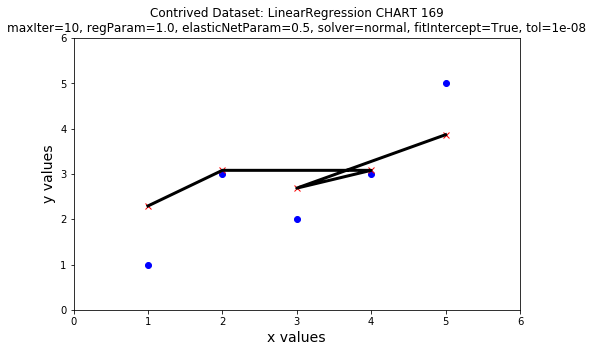

--------------------------------------------------

CHART 170

(2.2922605656184807, 1)
(3.07863771493128, 2)
(3.07863771493128, 4)
(2.6854491402748804, 3)
(3.8650148642440794, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.013888 , RMSE:  1.006920
## Multiple R-squared: 0.493056 ,             Total iterations: 3
Coefficients: [0.3931885746563997]
Intercept: 1.8990719909620808
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.2922605656184807, 3.07863771493128, 3.07863771493128, 2.6854491402748804, 3.8650148642440794]


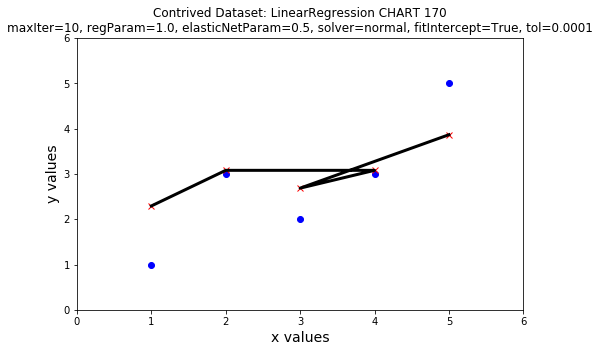

--------------------------------------------------

CHART 171

(2.2922605656184807, 1)
(3.07863771493128, 2)
(3.07863771493128, 4)
(2.6854491402748804, 3)
(3.8650148642440794, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.013888 , RMSE:  1.006920
## Multiple R-squared: 0.493056 ,             Total iterations: 3
Coefficients: [0.3931885746563997]
Intercept: 1.8990719909620808
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.2922605656184807, 3.07863771493128, 3.07863771493128, 2.6854491402748804, 3.8650148642440794]


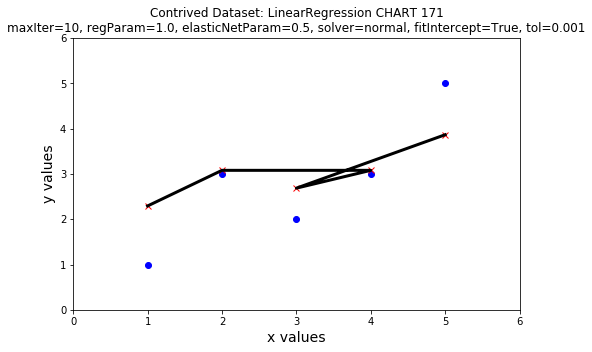

--------------------------------------------------

CHART 172

(2.2922605656184807, 1)
(3.07863771493128, 2)
(3.07863771493128, 4)
(2.6854491402748804, 3)
(3.8650148642440794, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.013888 , RMSE:  1.006920
## Multiple R-squared: 0.493056 ,             Total iterations: 3
Coefficients: [0.3931885746563997]
Intercept: 1.8990719909620808
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.2922605656184807, 3.07863771493128, 3.07863771493128, 2.6854491402748804, 3.8650148642440794]


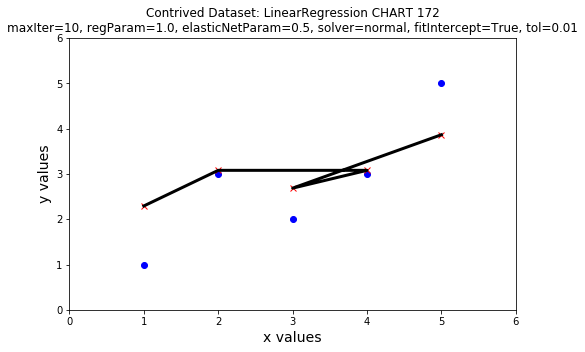

--------------------------------------------------

CHART 173

(2.2922605656184807, 1)
(3.07863771493128, 2)
(3.07863771493128, 4)
(2.6854491402748804, 3)
(3.8650148642440794, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.013888 , RMSE:  1.006920
## Multiple R-squared: 0.493056 ,             Total iterations: 3
Coefficients: [0.3931885746563997]
Intercept: 1.8990719909620808
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.2922605656184807, 3.07863771493128, 3.07863771493128, 2.6854491402748804, 3.8650148642440794]


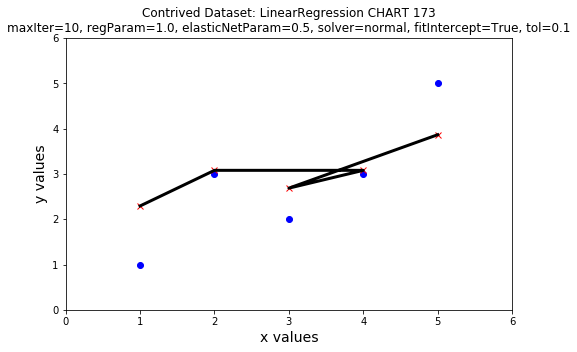

--------------------------------------------------

CHART 174

(2.2922605656184807, 1)
(3.07863771493128, 2)
(3.07863771493128, 4)
(2.6854491402748804, 3)
(3.8650148642440794, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.013888 , RMSE:  1.006920
## Multiple R-squared: 0.493056 ,             Total iterations: 3
Coefficients: [0.3931885746563997]
Intercept: 1.8990719909620808
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.2922605656184807, 3.07863771493128, 3.07863771493128, 2.6854491402748804, 3.8650148642440794]


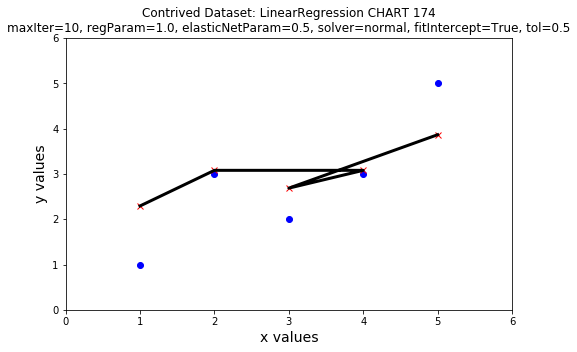

--------------------------------------------------

CHART 175

(0.9133675480637019, 1)
(2.7401026441911056, 2)
(2.7401026441911056, 4)
(1.8267350961274038, 3)
(4.566837740318509, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.741356 , RMSE:  0.861020
## Multiple R-squared: 0.932604 ,             Total iterations: 3
Coefficients: [0.9133675480637019]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9133675480637019, 2.7401026441911056, 2.7401026441911056, 1.8267350961274038, 4.566837740318509]


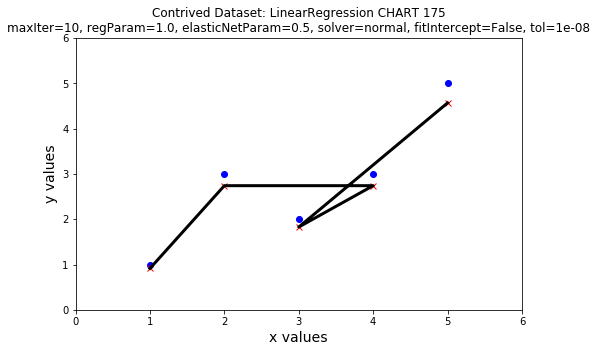

--------------------------------------------------

CHART 176

(0.9133675480637019, 1)
(2.7401026441911056, 2)
(2.7401026441911056, 4)
(1.8267350961274038, 3)
(4.566837740318509, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.741356 , RMSE:  0.861020
## Multiple R-squared: 0.932604 ,             Total iterations: 3
Coefficients: [0.9133675480637019]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9133675480637019, 2.7401026441911056, 2.7401026441911056, 1.8267350961274038, 4.566837740318509]


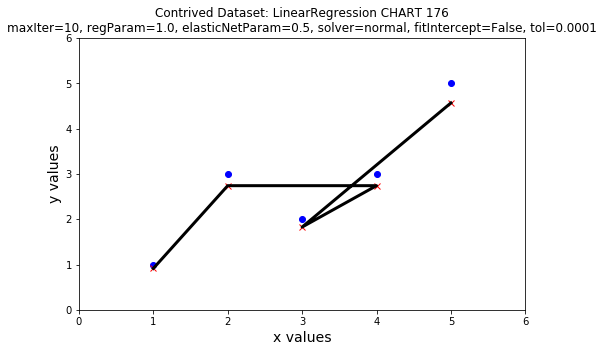

--------------------------------------------------

CHART 177

(0.9133675480637019, 1)
(2.7401026441911056, 2)
(2.7401026441911056, 4)
(1.8267350961274038, 3)
(4.566837740318509, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.741356 , RMSE:  0.861020
## Multiple R-squared: 0.932604 ,             Total iterations: 3
Coefficients: [0.9133675480637019]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9133675480637019, 2.7401026441911056, 2.7401026441911056, 1.8267350961274038, 4.566837740318509]


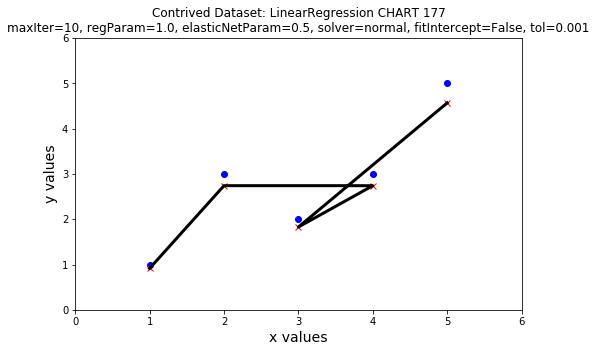

--------------------------------------------------

CHART 178

(0.9133675480637019, 1)
(2.7401026441911056, 2)
(2.7401026441911056, 4)
(1.8267350961274038, 3)
(4.566837740318509, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.741356 , RMSE:  0.861020
## Multiple R-squared: 0.932604 ,             Total iterations: 3
Coefficients: [0.9133675480637019]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9133675480637019, 2.7401026441911056, 2.7401026441911056, 1.8267350961274038, 4.566837740318509]


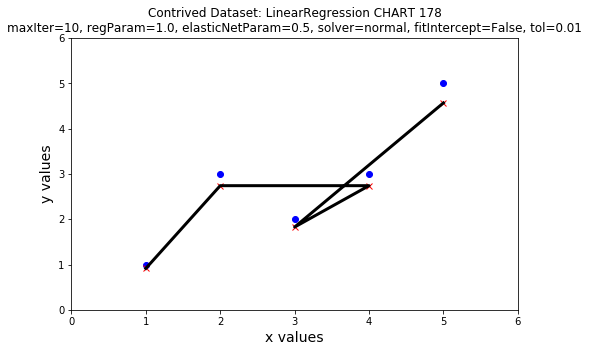

--------------------------------------------------

CHART 179

(0.9133675480637019, 1)
(2.7401026441911056, 2)
(2.7401026441911056, 4)
(1.8267350961274038, 3)
(4.566837740318509, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.741356 , RMSE:  0.861020
## Multiple R-squared: 0.932604 ,             Total iterations: 3
Coefficients: [0.9133675480637019]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9133675480637019, 2.7401026441911056, 2.7401026441911056, 1.8267350961274038, 4.566837740318509]


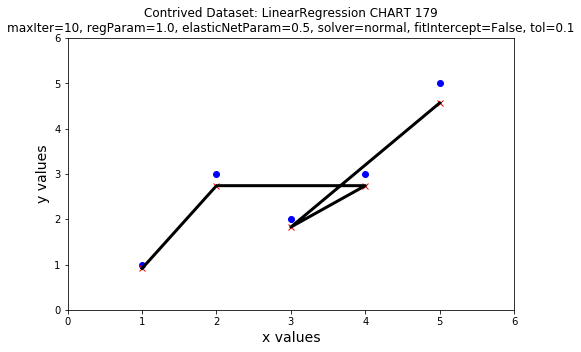

--------------------------------------------------

CHART 180

(0.9133675480637019, 1)
(2.7401026441911056, 2)
(2.7401026441911056, 4)
(1.8267350961274038, 3)
(4.566837740318509, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.741356 , RMSE:  0.861020
## Multiple R-squared: 0.932604 ,             Total iterations: 3
Coefficients: [0.9133675480637019]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9133675480637019, 2.7401026441911056, 2.7401026441911056, 1.8267350961274038, 4.566837740318509]


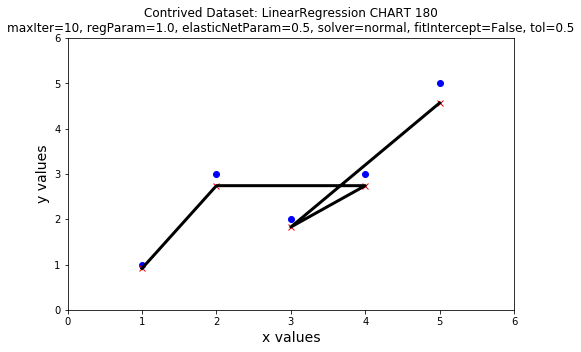

--------------------------------------------------

CHART 181

(2.3708174493991225, 1)
(3.0699091722889866, 2)
(3.0699091722889866, 4)
(2.7203633108440544, 3)
(3.7690008951788507, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.096494 , RMSE:  1.047136
## Multiple R-squared: 0.451753 ,             Total iterations: 3
Coefficients: [0.3495458614449321]
Intercept: 2.0212715879541903
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.3708174493991225, 3.0699091722889866, 3.0699091722889866, 2.7203633108440544, 3.7690008951788507]


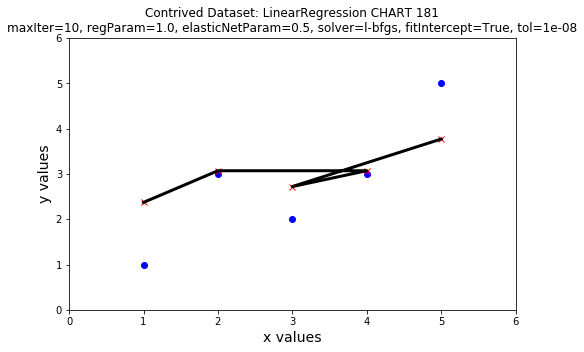

--------------------------------------------------

CHART 182

(2.3708174493991225, 1)
(3.0699091722889866, 2)
(3.0699091722889866, 4)
(2.7203633108440544, 3)
(3.7690008951788507, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.096494 , RMSE:  1.047136
## Multiple R-squared: 0.451753 ,             Total iterations: 3
Coefficients: [0.3495458614449321]
Intercept: 2.0212715879541903
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.3708174493991225, 3.0699091722889866, 3.0699091722889866, 2.7203633108440544, 3.7690008951788507]


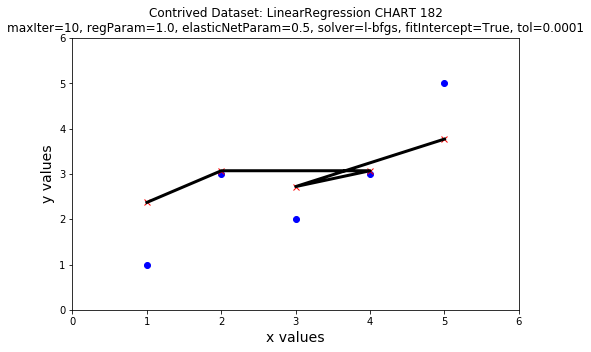

--------------------------------------------------

CHART 183

(2.3708174493991225, 1)
(3.0699091722889866, 2)
(3.0699091722889866, 4)
(2.7203633108440544, 3)
(3.7690008951788507, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.096494 , RMSE:  1.047136
## Multiple R-squared: 0.451753 ,             Total iterations: 3
Coefficients: [0.3495458614449321]
Intercept: 2.0212715879541903
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.3708174493991225, 3.0699091722889866, 3.0699091722889866, 2.7203633108440544, 3.7690008951788507]


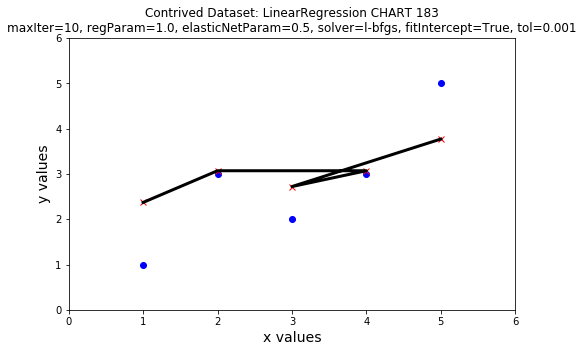

--------------------------------------------------

CHART 184

(2.3708174493991225, 1)
(3.0699091722889866, 2)
(3.0699091722889866, 4)
(2.7203633108440544, 3)
(3.7690008951788507, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.096494 , RMSE:  1.047136
## Multiple R-squared: 0.451753 ,             Total iterations: 3
Coefficients: [0.3495458614449321]
Intercept: 2.0212715879541903
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.3708174493991225, 3.0699091722889866, 3.0699091722889866, 2.7203633108440544, 3.7690008951788507]


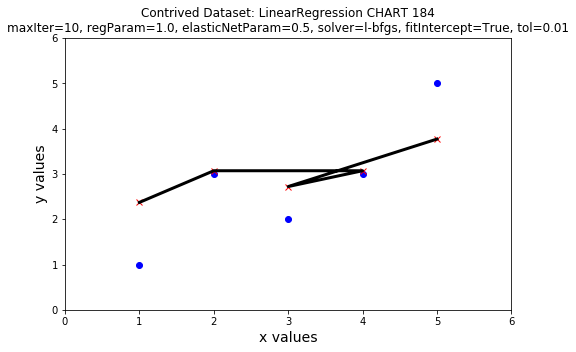

--------------------------------------------------

CHART 185

(2.3708174493991225, 1)
(3.0699091722889866, 2)
(3.0699091722889866, 4)
(2.7203633108440544, 3)
(3.7690008951788507, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.096494 , RMSE:  1.047136
## Multiple R-squared: 0.451753 ,             Total iterations: 3
Coefficients: [0.3495458614449321]
Intercept: 2.0212715879541903
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.3708174493991225, 3.0699091722889866, 3.0699091722889866, 2.7203633108440544, 3.7690008951788507]


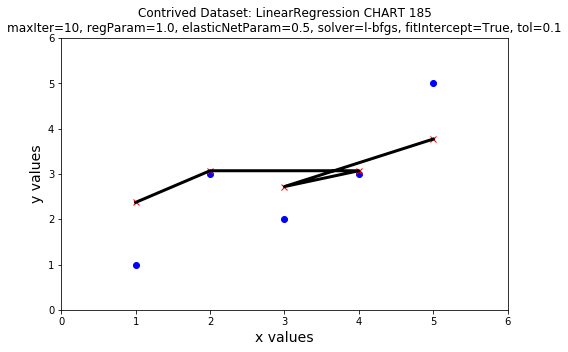

--------------------------------------------------

CHART 186

(2.3708174493991225, 1)
(3.0699091722889866, 2)
(3.0699091722889866, 4)
(2.7203633108440544, 3)
(3.7690008951788507, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.096494 , RMSE:  1.047136
## Multiple R-squared: 0.451753 ,             Total iterations: 3
Coefficients: [0.3495458614449321]
Intercept: 2.0212715879541903
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.3708174493991225, 3.0699091722889866, 3.0699091722889866, 2.7203633108440544, 3.7690008951788507]


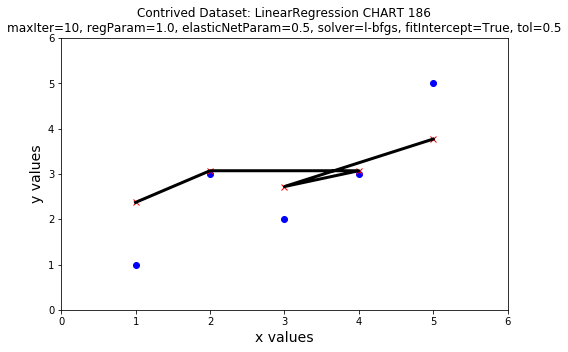

--------------------------------------------------

CHART 187

(0.8992471784719908, 1)
(2.697741535415972, 2)
(2.697741535415972, 4)
(1.7984943569439815, 3)
(4.4962358923599535, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.778053 , RMSE:  0.882073
## Multiple R-squared: 0.929268 ,             Total iterations: 3
Coefficients: [0.8992471784719908]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.8992471784719908, 2.697741535415972, 2.697741535415972, 1.7984943569439815, 4.4962358923599535]


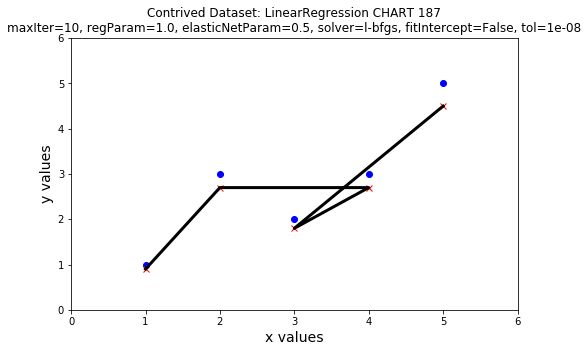

--------------------------------------------------

CHART 188

(0.8992471784719908, 1)
(2.697741535415972, 2)
(2.697741535415972, 4)
(1.7984943569439815, 3)
(4.4962358923599535, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.778053 , RMSE:  0.882073
## Multiple R-squared: 0.929268 ,             Total iterations: 3
Coefficients: [0.8992471784719908]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.8992471784719908, 2.697741535415972, 2.697741535415972, 1.7984943569439815, 4.4962358923599535]


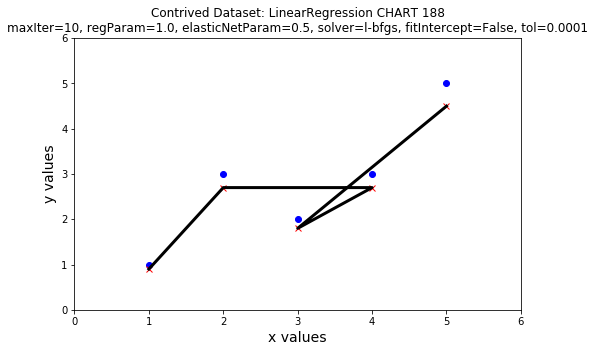

--------------------------------------------------

CHART 189

(0.8992471784719908, 1)
(2.697741535415972, 2)
(2.697741535415972, 4)
(1.7984943569439815, 3)
(4.4962358923599535, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.778053 , RMSE:  0.882073
## Multiple R-squared: 0.929268 ,             Total iterations: 3
Coefficients: [0.8992471784719908]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.8992471784719908, 2.697741535415972, 2.697741535415972, 1.7984943569439815, 4.4962358923599535]


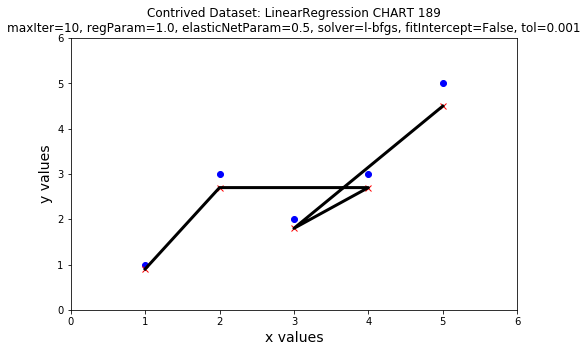

--------------------------------------------------

CHART 190

(0.8992471784719908, 1)
(2.697741535415972, 2)
(2.697741535415972, 4)
(1.7984943569439815, 3)
(4.4962358923599535, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.778053 , RMSE:  0.882073
## Multiple R-squared: 0.929268 ,             Total iterations: 3
Coefficients: [0.8992471784719908]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.8992471784719908, 2.697741535415972, 2.697741535415972, 1.7984943569439815, 4.4962358923599535]


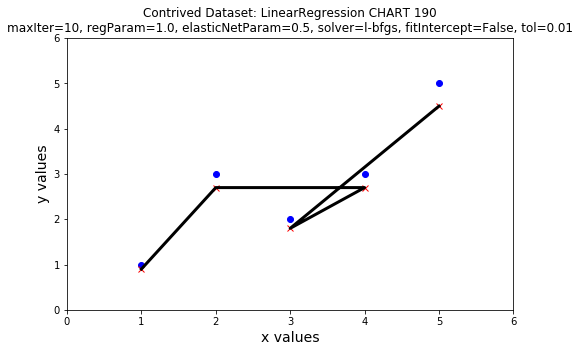

--------------------------------------------------

CHART 191

(0.8992471784719908, 1)
(2.697741535415972, 2)
(2.697741535415972, 4)
(1.7984943569439815, 3)
(4.4962358923599535, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.778053 , RMSE:  0.882073
## Multiple R-squared: 0.929268 ,             Total iterations: 3
Coefficients: [0.8992471784719908]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.8992471784719908, 2.697741535415972, 2.697741535415972, 1.7984943569439815, 4.4962358923599535]


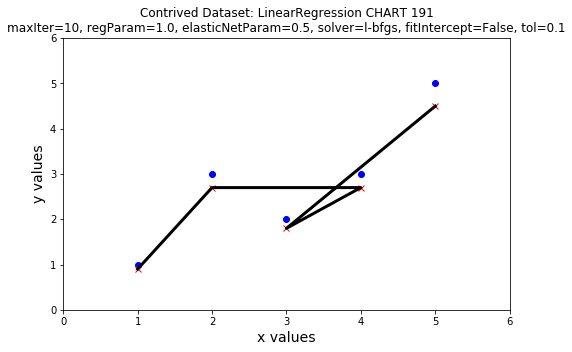

--------------------------------------------------

CHART 192

(0.8992471784719908, 1)
(2.697741535415972, 2)
(2.697741535415972, 4)
(1.7984943569439815, 3)
(4.4962358923599535, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.778053 , RMSE:  0.882073
## Multiple R-squared: 0.929268 ,             Total iterations: 3
Coefficients: [0.8992471784719908]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.8992471784719908, 2.697741535415972, 2.697741535415972, 1.7984943569439815, 4.4962358923599535]


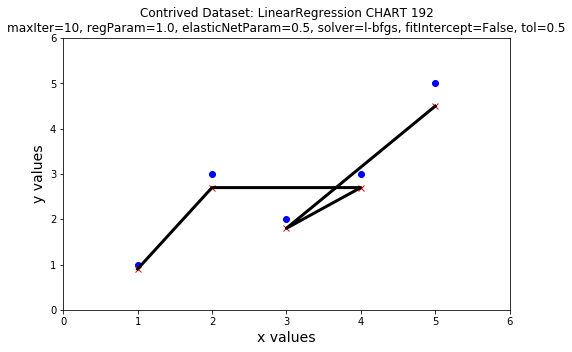

--------------------------------------------------

CHART 193

(2.7204374142363013, 1)
(3.0310625095293, 2)
(3.0310625095293, 4)
(2.8757499618828004, 3)
(3.3416876048222988, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.545455 , RMSE:  1.243163
## Multiple R-squared: 0.227273 ,             Total iterations: 3
Coefficients: [0.1553125476464994]
Intercept: 2.5651248665898017
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.7204374142363013, 3.0310625095293, 3.0310625095293, 2.8757499618828004, 3.3416876048222988]


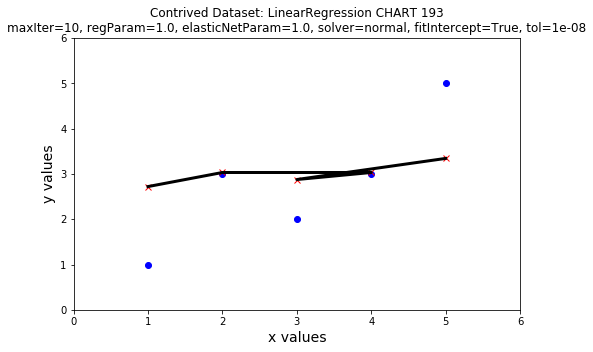

--------------------------------------------------

CHART 194

(2.7204374142363013, 1)
(3.0310625095293, 2)
(3.0310625095293, 4)
(2.8757499618828004, 3)
(3.3416876048222988, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.545455 , RMSE:  1.243163
## Multiple R-squared: 0.227273 ,             Total iterations: 3
Coefficients: [0.1553125476464994]
Intercept: 2.5651248665898017
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.7204374142363013, 3.0310625095293, 3.0310625095293, 2.8757499618828004, 3.3416876048222988]


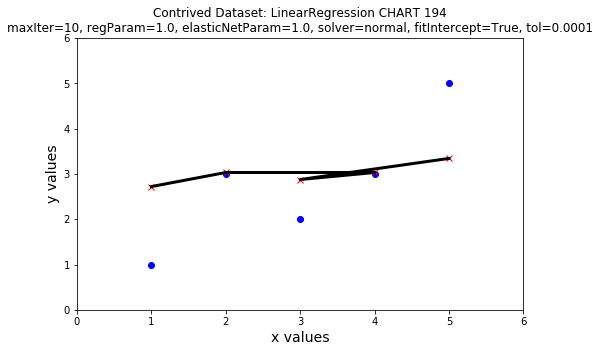

--------------------------------------------------

CHART 195

(2.7204374142363013, 1)
(3.0310625095293, 2)
(3.0310625095293, 4)
(2.8757499618828004, 3)
(3.3416876048222988, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.545455 , RMSE:  1.243163
## Multiple R-squared: 0.227273 ,             Total iterations: 3
Coefficients: [0.1553125476464994]
Intercept: 2.5651248665898017
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.7204374142363013, 3.0310625095293, 3.0310625095293, 2.8757499618828004, 3.3416876048222988]


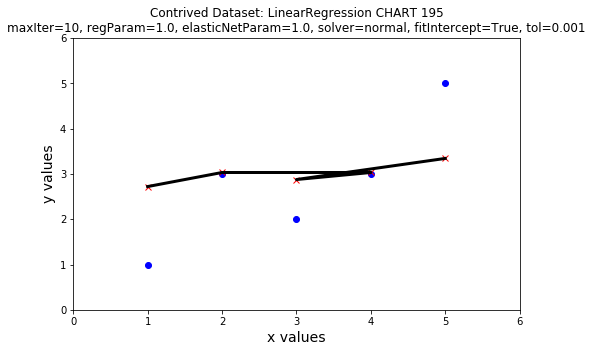

--------------------------------------------------

CHART 196

(2.7204374142363013, 1)
(3.0310625095293, 2)
(3.0310625095293, 4)
(2.8757499618828004, 3)
(3.3416876048222988, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.545455 , RMSE:  1.243163
## Multiple R-squared: 0.227273 ,             Total iterations: 3
Coefficients: [0.1553125476464994]
Intercept: 2.5651248665898017
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.7204374142363013, 3.0310625095293, 3.0310625095293, 2.8757499618828004, 3.3416876048222988]


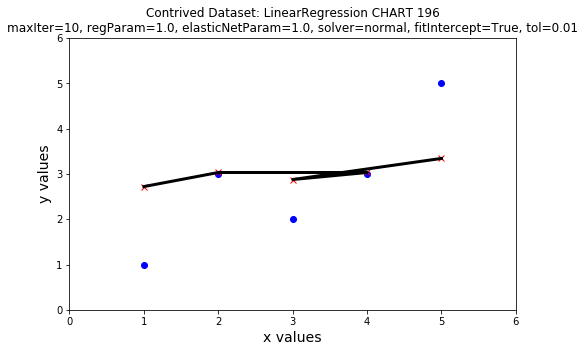

--------------------------------------------------

CHART 197

(2.7204374142363013, 1)
(3.0310625095293, 2)
(3.0310625095293, 4)
(2.8757499618828004, 3)
(3.3416876048222988, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.545455 , RMSE:  1.243163
## Multiple R-squared: 0.227273 ,             Total iterations: 3
Coefficients: [0.1553125476464994]
Intercept: 2.5651248665898017
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.7204374142363013, 3.0310625095293, 3.0310625095293, 2.8757499618828004, 3.3416876048222988]


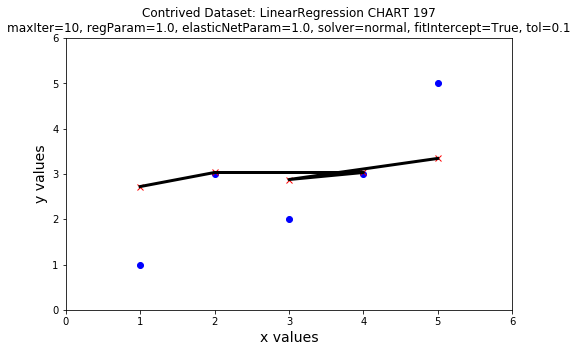

--------------------------------------------------

CHART 198

(3.0, 1)
(3.0, 2)
(3.0, 4)
(3.0, 3)
(3.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  2.000000 , RMSE:  1.414214
## Multiple R-squared: -0.000000 ,             Total iterations: 1
Coefficients: [0.0]
Intercept: 3.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [3.0, 3.0, 3.0, 3.0, 3.0]


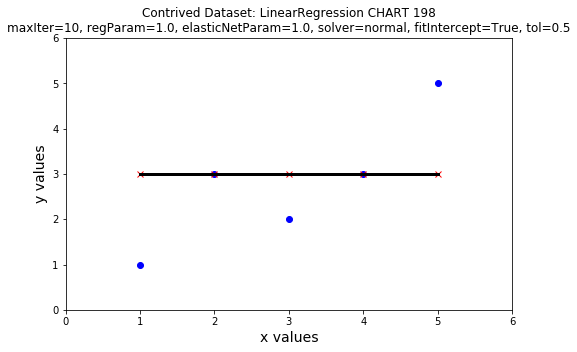

--------------------------------------------------

CHART 199

(0.9034739670685246, 1)
(2.7104219012055735, 2)
(2.7104219012055735, 4)
(1.8069479341370491, 3)
(4.517369835342623, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.766667 , RMSE:  0.875595
## Multiple R-squared: 0.930303 ,             Total iterations: 3
Coefficients: [0.9034739670685246]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9034739670685246, 2.7104219012055735, 2.7104219012055735, 1.8069479341370491, 4.517369835342623]


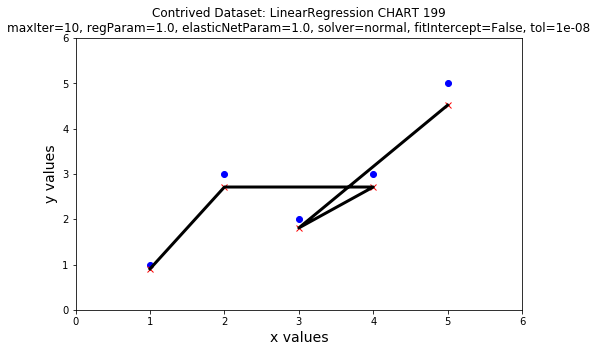

--------------------------------------------------

CHART 200

(0.9034739670685246, 1)
(2.7104219012055735, 2)
(2.7104219012055735, 4)
(1.8069479341370491, 3)
(4.517369835342623, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.766667 , RMSE:  0.875595
## Multiple R-squared: 0.930303 ,             Total iterations: 3
Coefficients: [0.9034739670685246]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9034739670685246, 2.7104219012055735, 2.7104219012055735, 1.8069479341370491, 4.517369835342623]


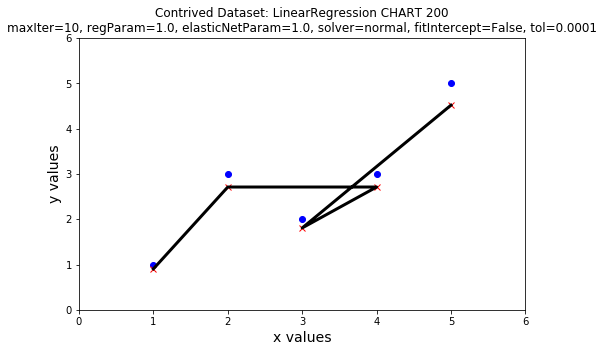

--------------------------------------------------

CHART 201

(0.9034739670685246, 1)
(2.7104219012055735, 2)
(2.7104219012055735, 4)
(1.8069479341370491, 3)
(4.517369835342623, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.766667 , RMSE:  0.875595
## Multiple R-squared: 0.930303 ,             Total iterations: 3
Coefficients: [0.9034739670685246]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9034739670685246, 2.7104219012055735, 2.7104219012055735, 1.8069479341370491, 4.517369835342623]


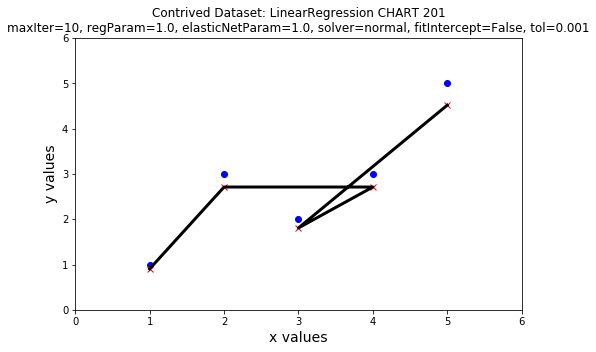

--------------------------------------------------

CHART 202

(0.9034739670685246, 1)
(2.7104219012055735, 2)
(2.7104219012055735, 4)
(1.8069479341370491, 3)
(4.517369835342623, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.766667 , RMSE:  0.875595
## Multiple R-squared: 0.930303 ,             Total iterations: 3
Coefficients: [0.9034739670685246]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9034739670685246, 2.7104219012055735, 2.7104219012055735, 1.8069479341370491, 4.517369835342623]


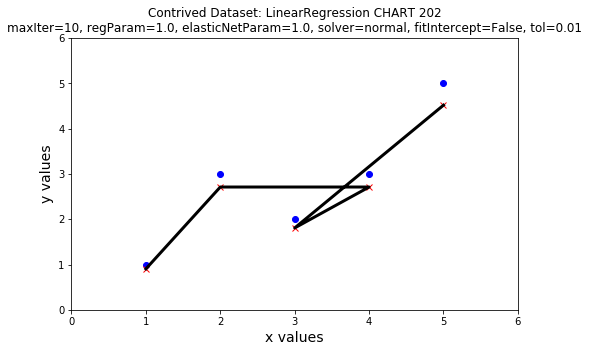

--------------------------------------------------

CHART 203

(0.9034739670685246, 1)
(2.7104219012055735, 2)
(2.7104219012055735, 4)
(1.8069479341370491, 3)
(4.517369835342623, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.766667 , RMSE:  0.875595
## Multiple R-squared: 0.930303 ,             Total iterations: 3
Coefficients: [0.9034739670685246]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9034739670685246, 2.7104219012055735, 2.7104219012055735, 1.8069479341370491, 4.517369835342623]


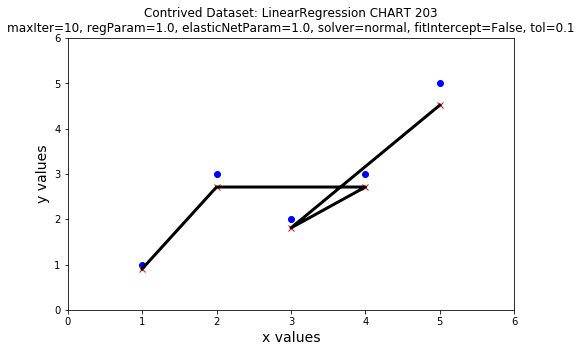

--------------------------------------------------

CHART 204

(0.9034739670685246, 1)
(2.7104219012055735, 2)
(2.7104219012055735, 4)
(1.8069479341370491, 3)
(4.517369835342623, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.766667 , RMSE:  0.875595
## Multiple R-squared: 0.930303 ,             Total iterations: 3
Coefficients: [0.9034739670685246]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9034739670685246, 2.7104219012055735, 2.7104219012055735, 1.8069479341370491, 4.517369835342623]


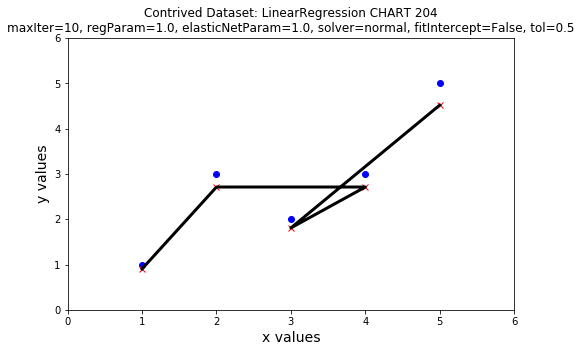

--------------------------------------------------

CHART 205

(2.880586054178664, 1)
(3.0132682162023707, 2)
(3.0132682162023707, 4)
(2.9469271351905175, 3)
(3.1459503782260776, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.795455 , RMSE:  1.339946
## Multiple R-squared: 0.102273 ,             Total iterations: 3
Coefficients: [0.06634108101185338]
Intercept: 2.8142449731668107
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.880586054178664, 3.0132682162023707, 3.0132682162023707, 2.9469271351905175, 3.1459503782260776]


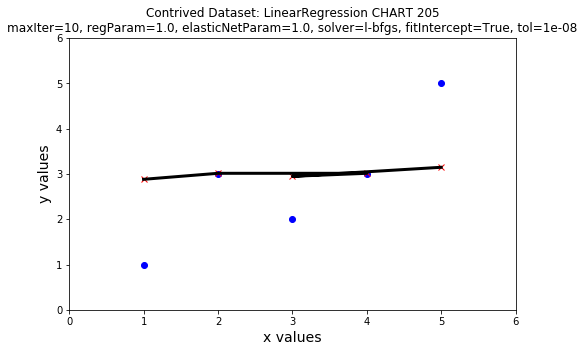

--------------------------------------------------

CHART 206

(2.880586054178664, 1)
(3.0132682162023707, 2)
(3.0132682162023707, 4)
(2.9469271351905175, 3)
(3.1459503782260776, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.795455 , RMSE:  1.339946
## Multiple R-squared: 0.102273 ,             Total iterations: 3
Coefficients: [0.06634108101185338]
Intercept: 2.8142449731668107
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.880586054178664, 3.0132682162023707, 3.0132682162023707, 2.9469271351905175, 3.1459503782260776]


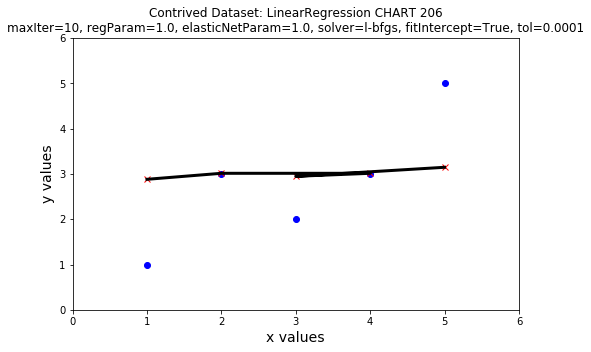

--------------------------------------------------

CHART 207

(2.880586054178664, 1)
(3.0132682162023707, 2)
(3.0132682162023707, 4)
(2.9469271351905175, 3)
(3.1459503782260776, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.795455 , RMSE:  1.339946
## Multiple R-squared: 0.102273 ,             Total iterations: 3
Coefficients: [0.06634108101185338]
Intercept: 2.8142449731668107
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.880586054178664, 3.0132682162023707, 3.0132682162023707, 2.9469271351905175, 3.1459503782260776]


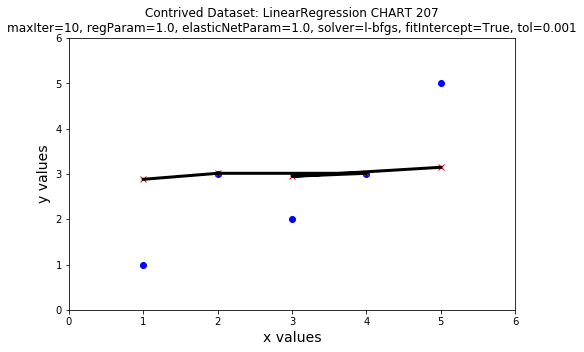

--------------------------------------------------

CHART 208

(2.880586054178664, 1)
(3.0132682162023707, 2)
(3.0132682162023707, 4)
(2.9469271351905175, 3)
(3.1459503782260776, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.795455 , RMSE:  1.339946
## Multiple R-squared: 0.102273 ,             Total iterations: 3
Coefficients: [0.06634108101185338]
Intercept: 2.8142449731668107
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.880586054178664, 3.0132682162023707, 3.0132682162023707, 2.9469271351905175, 3.1459503782260776]


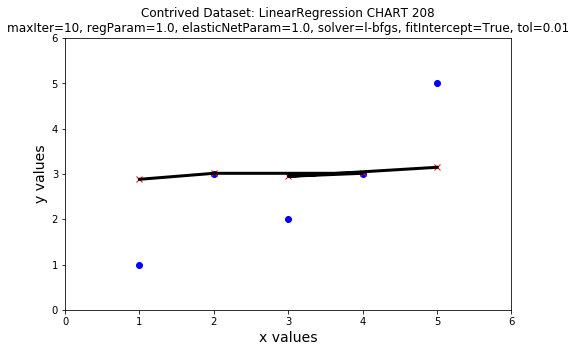

--------------------------------------------------

CHART 209

(2.880586054178664, 1)
(3.0132682162023707, 2)
(3.0132682162023707, 4)
(2.9469271351905175, 3)
(3.1459503782260776, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.795455 , RMSE:  1.339946
## Multiple R-squared: 0.102273 ,             Total iterations: 3
Coefficients: [0.06634108101185338]
Intercept: 2.8142449731668107
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.880586054178664, 3.0132682162023707, 3.0132682162023707, 2.9469271351905175, 3.1459503782260776]


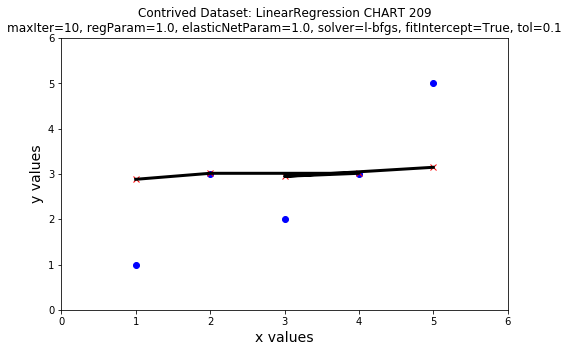

--------------------------------------------------

CHART 210

(3.0, 1)
(3.0, 2)
(3.0, 4)
(3.0, 3)
(3.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  2.000000 , RMSE:  1.414214
## Multiple R-squared: -0.000000 ,             Total iterations: 1
Coefficients: [0.0]
Intercept: 3.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [3.0, 3.0, 3.0, 3.0, 3.0]


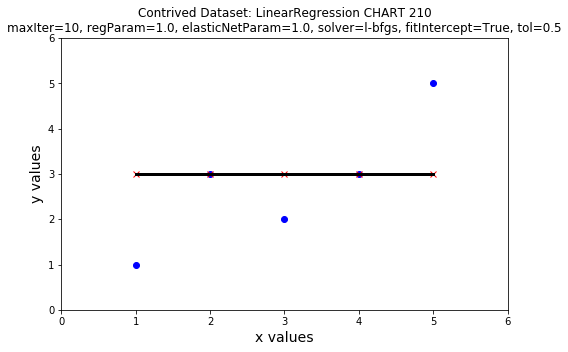

--------------------------------------------------

CHART 211

(0.887162531518839, 1)
(2.661487594556517, 2)
(2.661487594556517, 4)
(1.774325063037678, 3)
(4.4358126575941945, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.812500 , RMSE:  0.901388
## Multiple R-squared: 0.926136 ,             Total iterations: 3
Coefficients: [0.887162531518839]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.887162531518839, 2.661487594556517, 2.661487594556517, 1.774325063037678, 4.4358126575941945]


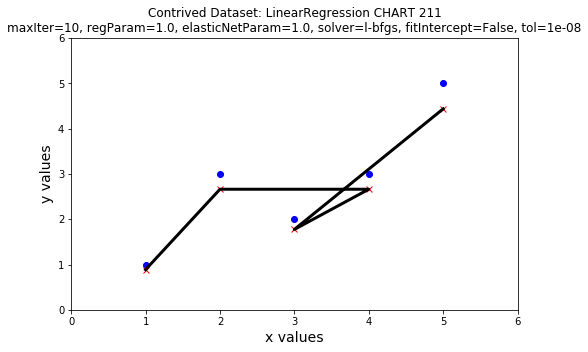

--------------------------------------------------

CHART 212

(0.887162531518839, 1)
(2.661487594556517, 2)
(2.661487594556517, 4)
(1.774325063037678, 3)
(4.4358126575941945, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.812500 , RMSE:  0.901388
## Multiple R-squared: 0.926136 ,             Total iterations: 3
Coefficients: [0.887162531518839]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.887162531518839, 2.661487594556517, 2.661487594556517, 1.774325063037678, 4.4358126575941945]


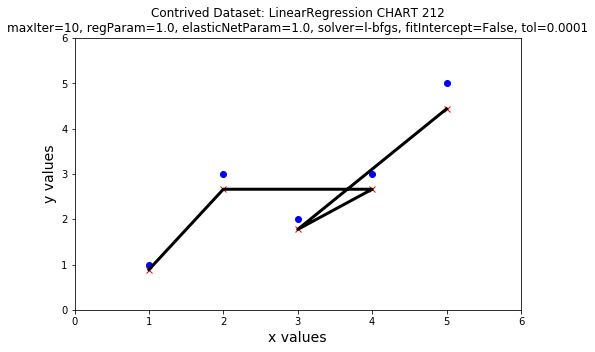

--------------------------------------------------

CHART 213

(0.887162531518839, 1)
(2.661487594556517, 2)
(2.661487594556517, 4)
(1.774325063037678, 3)
(4.4358126575941945, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.812500 , RMSE:  0.901388
## Multiple R-squared: 0.926136 ,             Total iterations: 3
Coefficients: [0.887162531518839]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.887162531518839, 2.661487594556517, 2.661487594556517, 1.774325063037678, 4.4358126575941945]


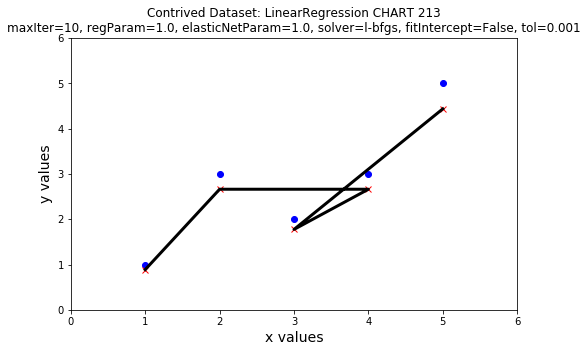

--------------------------------------------------

CHART 214

(0.887162531518839, 1)
(2.661487594556517, 2)
(2.661487594556517, 4)
(1.774325063037678, 3)
(4.4358126575941945, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.812500 , RMSE:  0.901388
## Multiple R-squared: 0.926136 ,             Total iterations: 3
Coefficients: [0.887162531518839]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.887162531518839, 2.661487594556517, 2.661487594556517, 1.774325063037678, 4.4358126575941945]


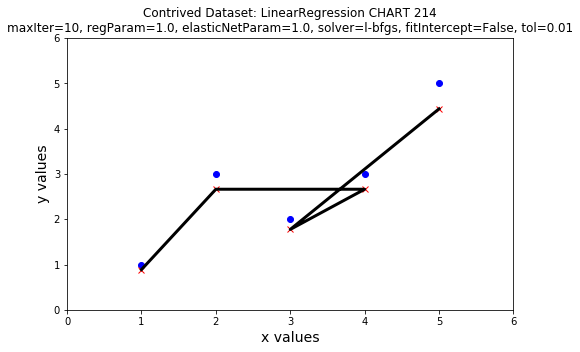

--------------------------------------------------

CHART 215

(0.887162531518839, 1)
(2.661487594556517, 2)
(2.661487594556517, 4)
(1.774325063037678, 3)
(4.4358126575941945, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.812500 , RMSE:  0.901388
## Multiple R-squared: 0.926136 ,             Total iterations: 3
Coefficients: [0.887162531518839]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.887162531518839, 2.661487594556517, 2.661487594556517, 1.774325063037678, 4.4358126575941945]


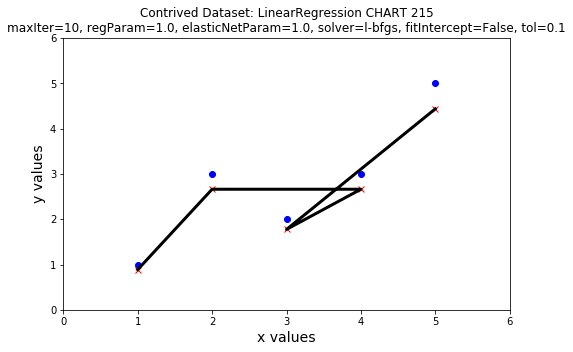

--------------------------------------------------

CHART 216

(0.887162531518839, 1)
(2.661487594556517, 2)
(2.661487594556517, 4)
(1.774325063037678, 3)
(4.4358126575941945, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.812500 , RMSE:  0.901388
## Multiple R-squared: 0.926136 ,             Total iterations: 3
Coefficients: [0.887162531518839]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.887162531518839, 2.661487594556517, 2.661487594556517, 1.774325063037678, 4.4358126575941945]


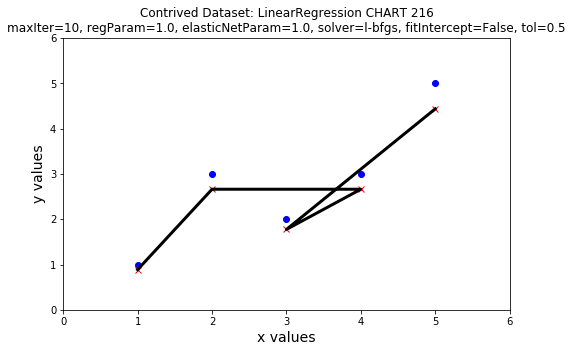

--------------------------------------------------

CHART 217

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


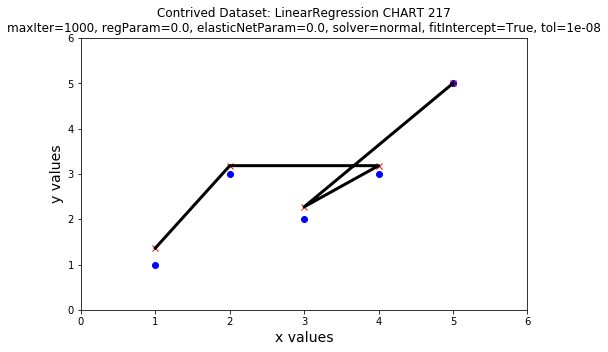

--------------------------------------------------

CHART 218

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


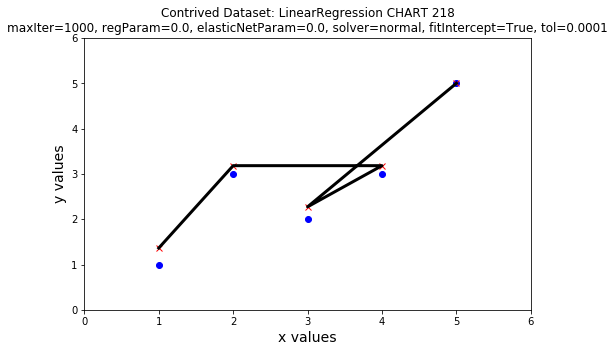

--------------------------------------------------

CHART 219

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


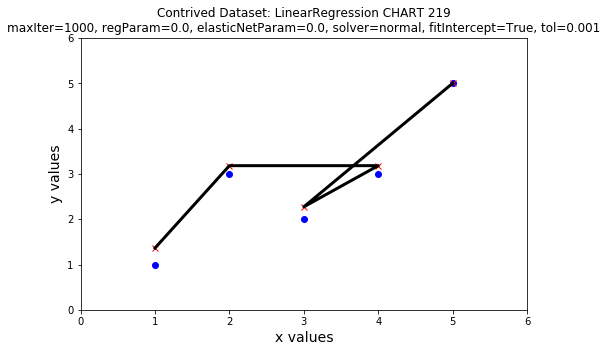

--------------------------------------------------

CHART 220

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


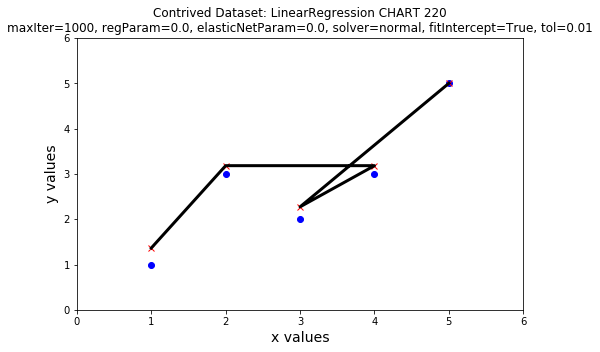

--------------------------------------------------

CHART 221

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


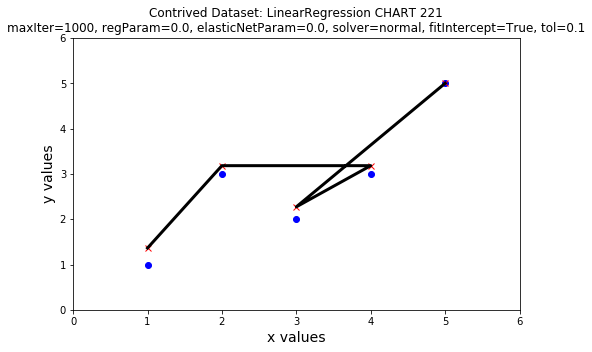

--------------------------------------------------

CHART 222

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


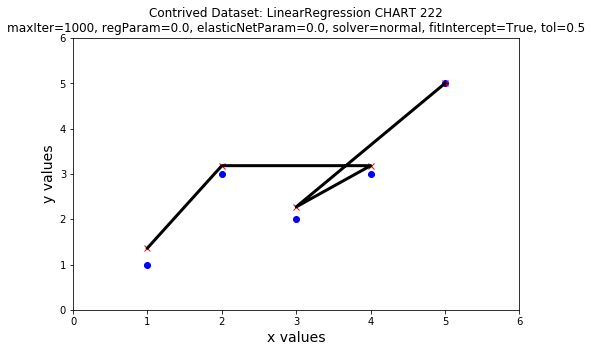

--------------------------------------------------

CHART 223

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


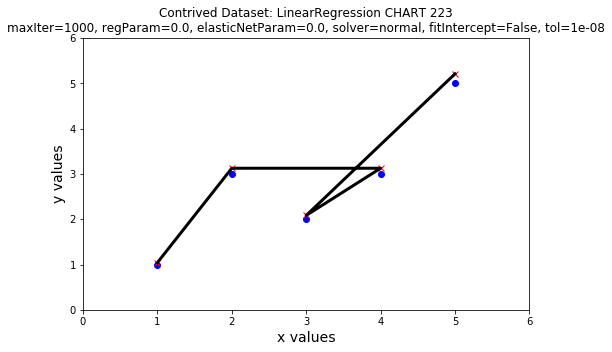

--------------------------------------------------

CHART 224

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


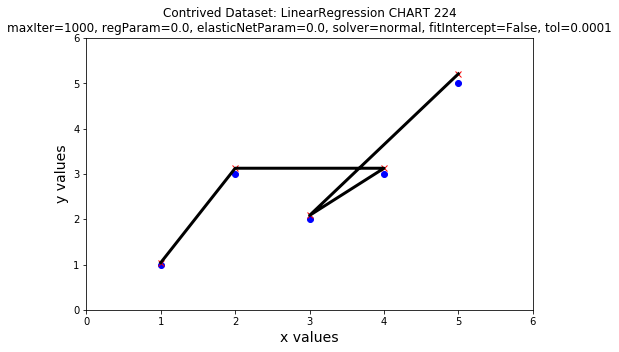

--------------------------------------------------

CHART 225

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


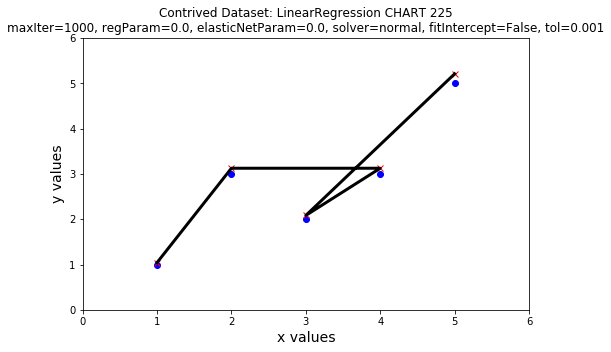

--------------------------------------------------

CHART 226

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


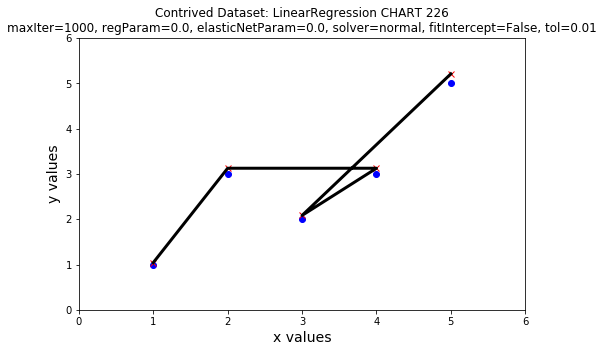

--------------------------------------------------

CHART 227

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


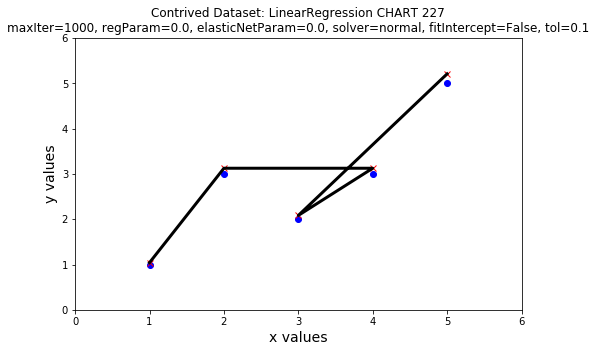

--------------------------------------------------

CHART 228

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


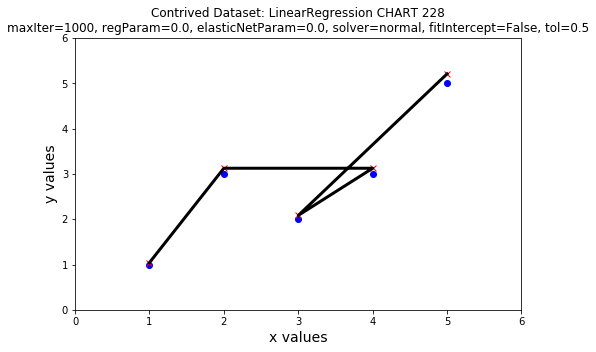

--------------------------------------------------

CHART 229

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


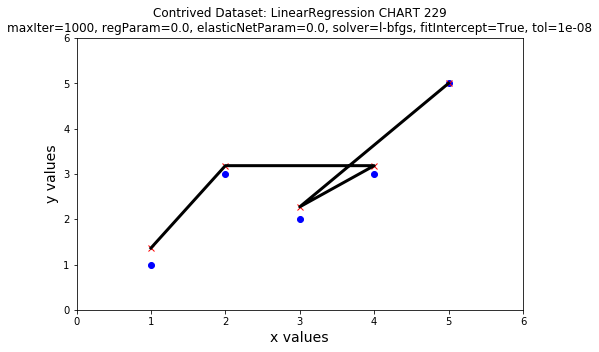

--------------------------------------------------

CHART 230

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


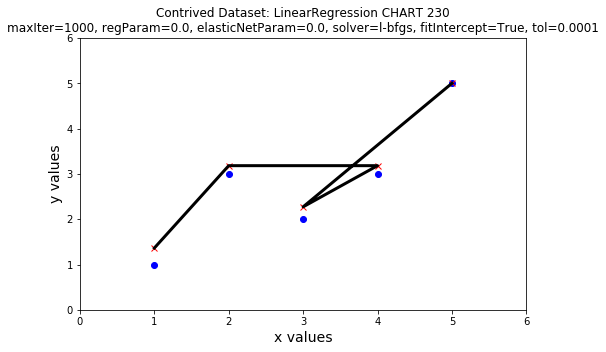

--------------------------------------------------

CHART 231

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


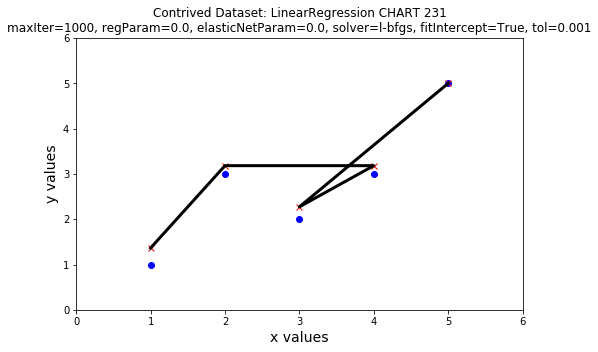

--------------------------------------------------

CHART 232

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


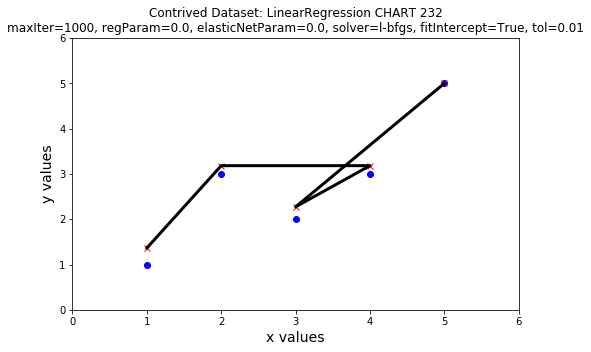

--------------------------------------------------

CHART 233

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


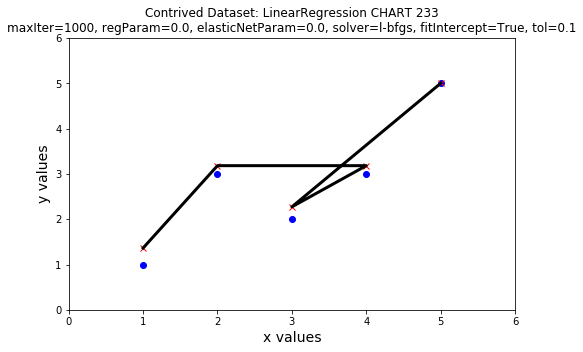

--------------------------------------------------

CHART 234

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


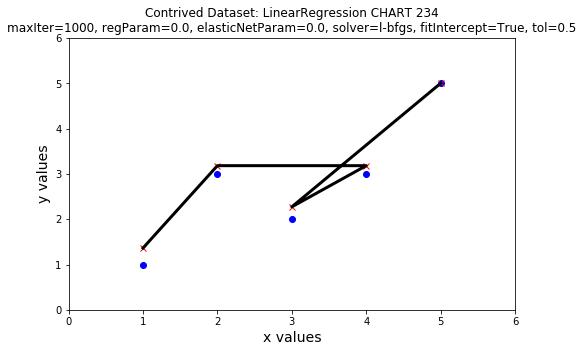

--------------------------------------------------

CHART 235

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


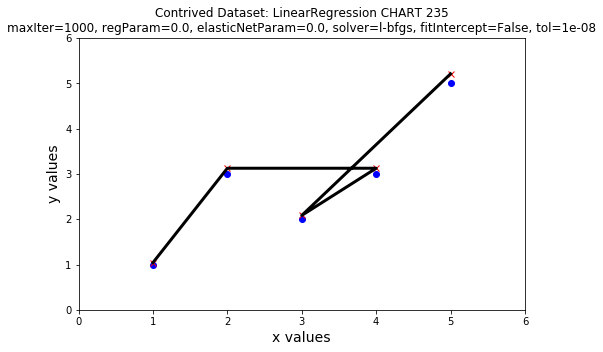

--------------------------------------------------

CHART 236

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


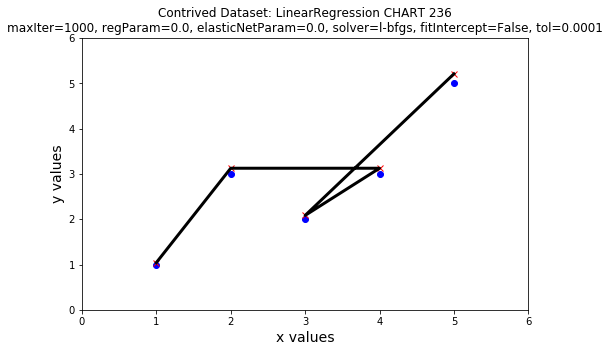

--------------------------------------------------

CHART 237

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


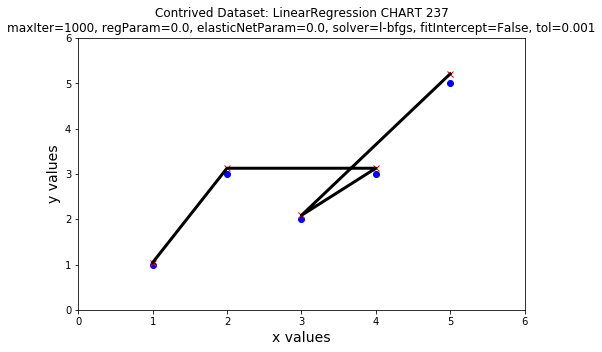

--------------------------------------------------

CHART 238

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


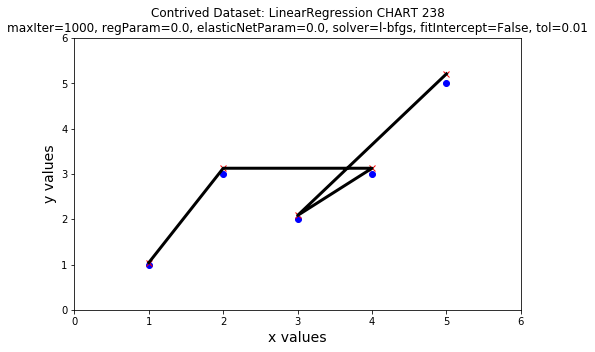

--------------------------------------------------

CHART 239

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


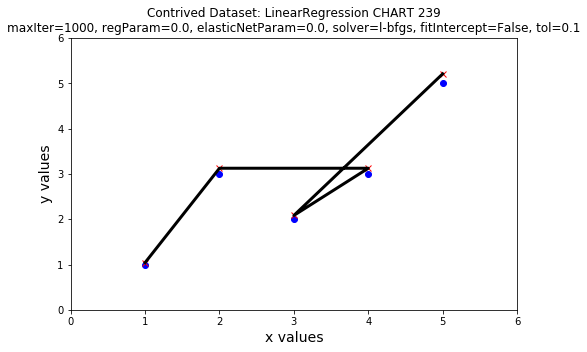

--------------------------------------------------

CHART 240

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


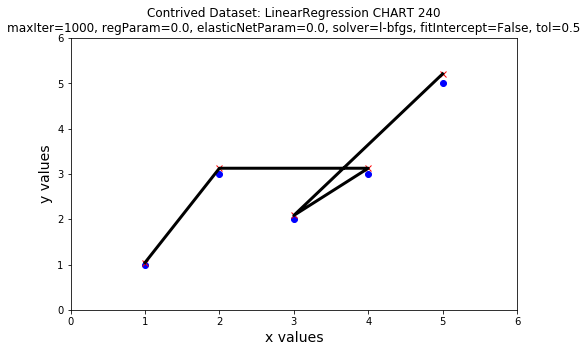

--------------------------------------------------

CHART 241

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


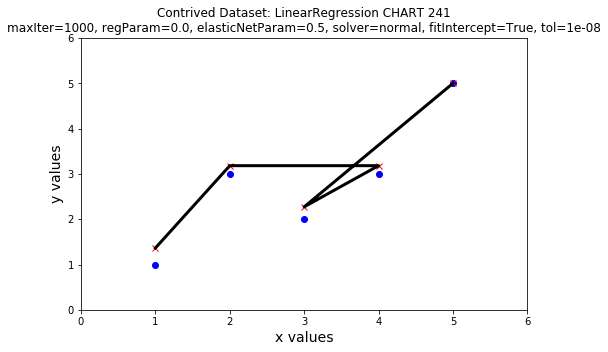

--------------------------------------------------

CHART 242

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


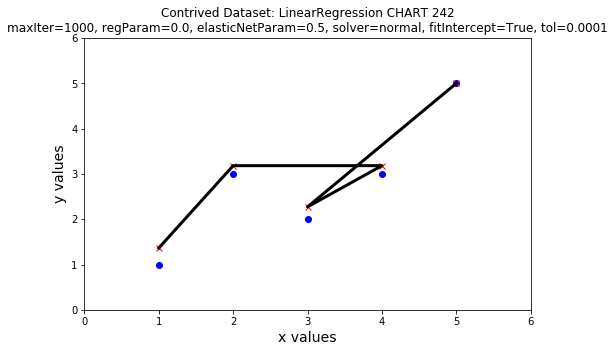

--------------------------------------------------

CHART 243

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


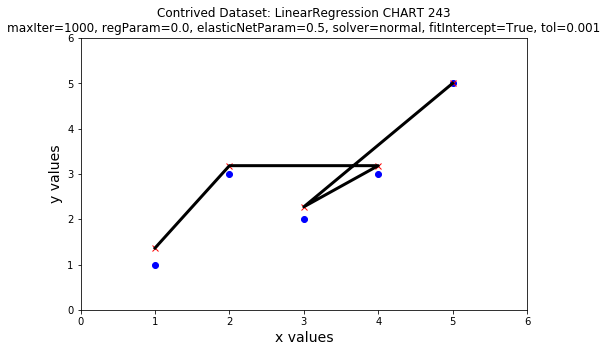

--------------------------------------------------

CHART 244

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


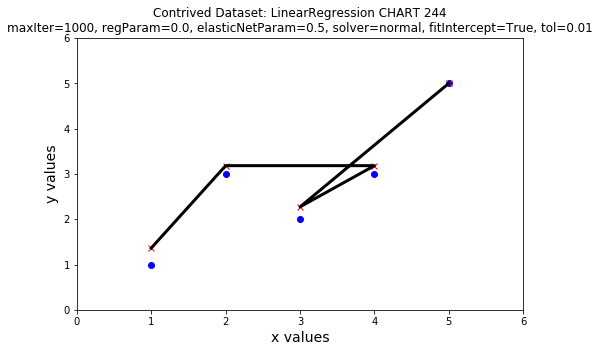

--------------------------------------------------

CHART 245

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


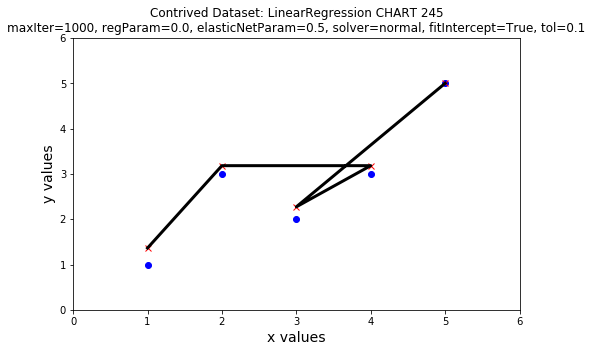

--------------------------------------------------

CHART 246

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


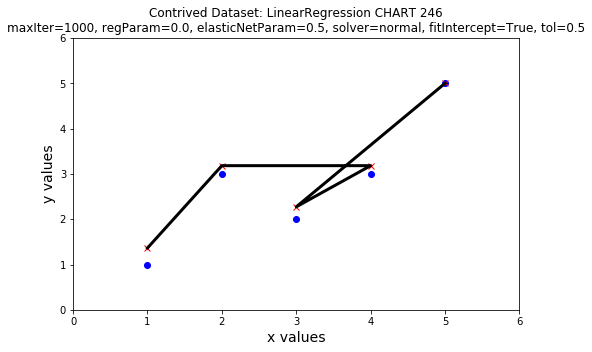

--------------------------------------------------

CHART 247

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


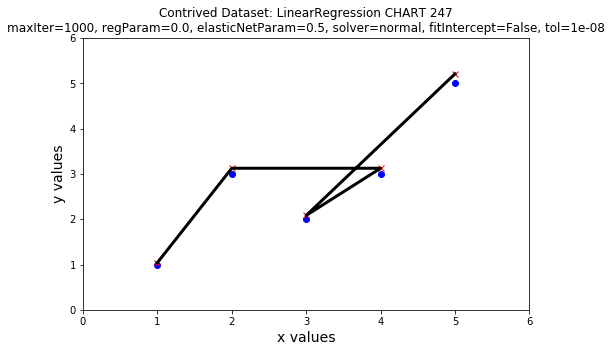

--------------------------------------------------

CHART 248

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


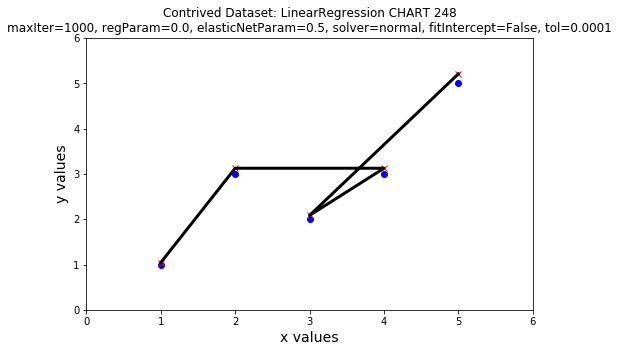

--------------------------------------------------

CHART 249

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


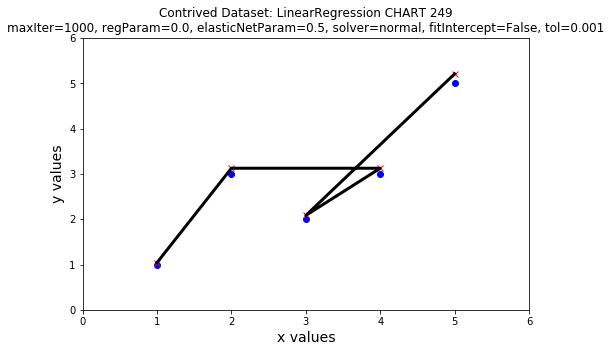

--------------------------------------------------

CHART 250

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


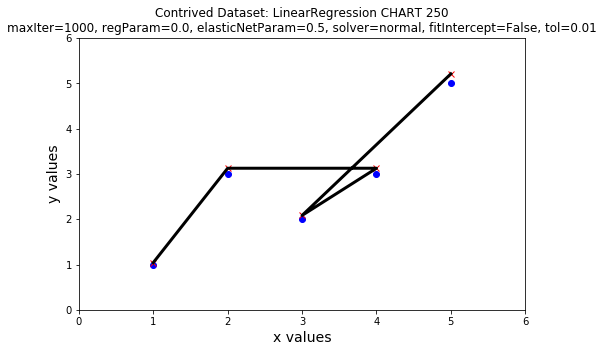

--------------------------------------------------

CHART 251

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


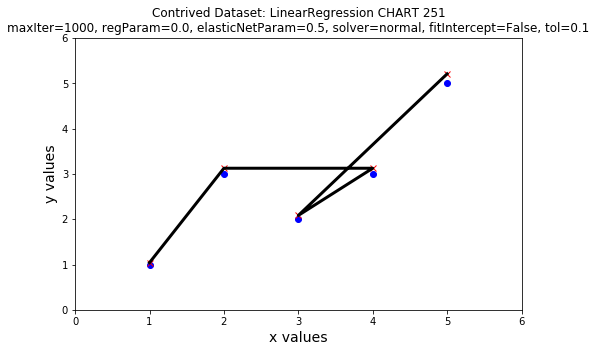

--------------------------------------------------

CHART 252

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


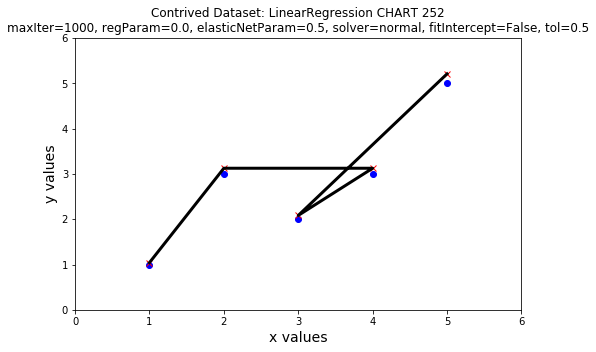

--------------------------------------------------

CHART 253

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


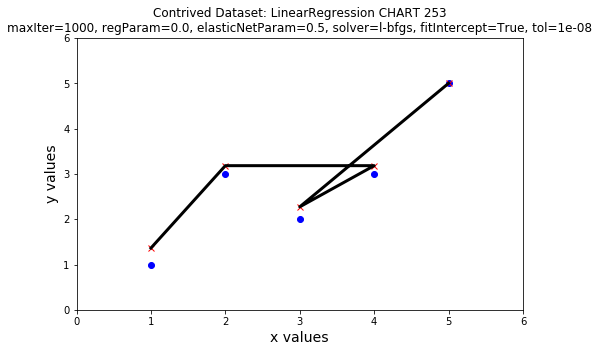

--------------------------------------------------

CHART 254

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


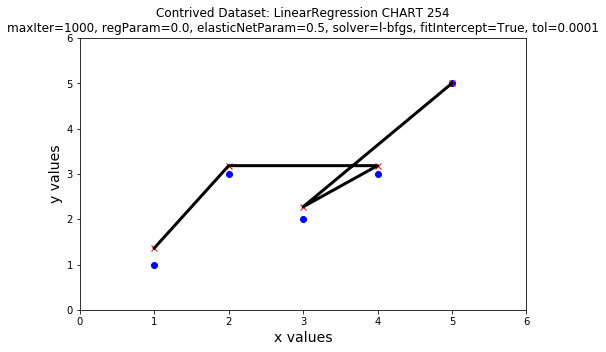

--------------------------------------------------

CHART 255

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


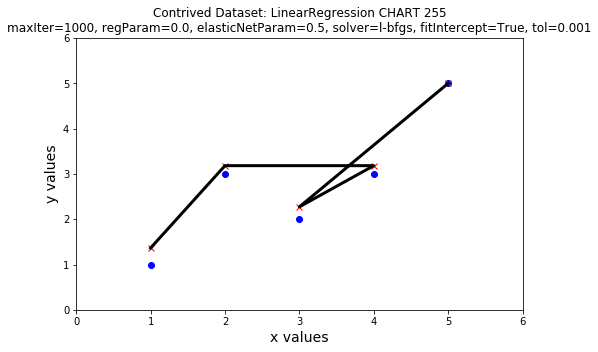

--------------------------------------------------

CHART 256

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


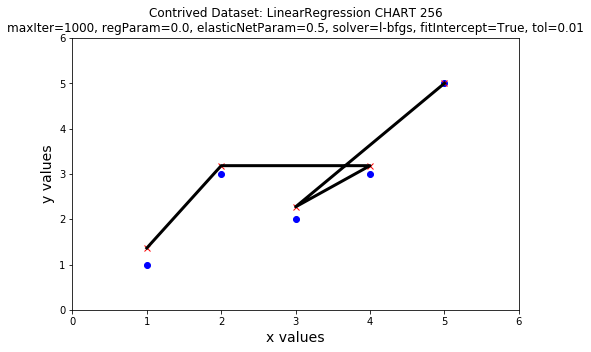

--------------------------------------------------

CHART 257

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


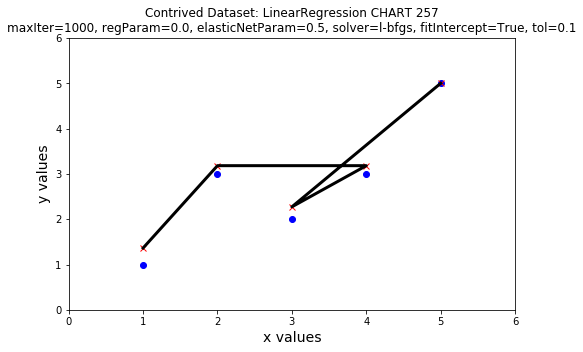

--------------------------------------------------

CHART 258

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


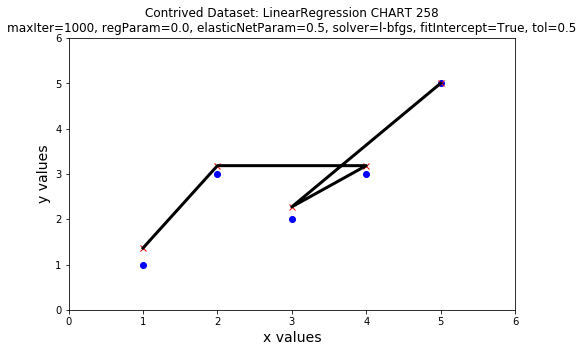

--------------------------------------------------

CHART 259

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


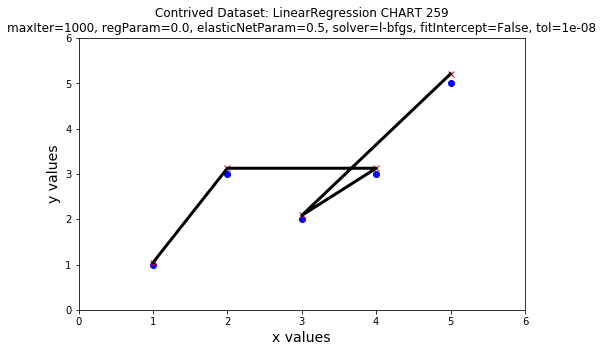

--------------------------------------------------

CHART 260

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


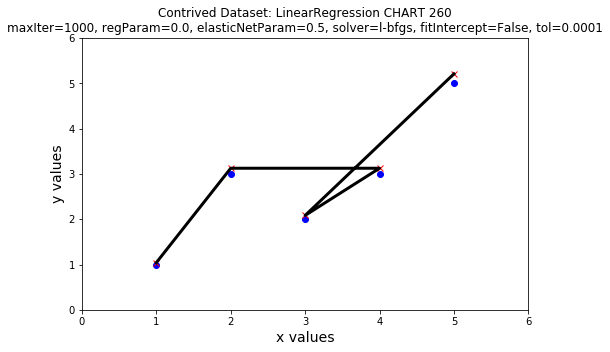

--------------------------------------------------

CHART 261

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


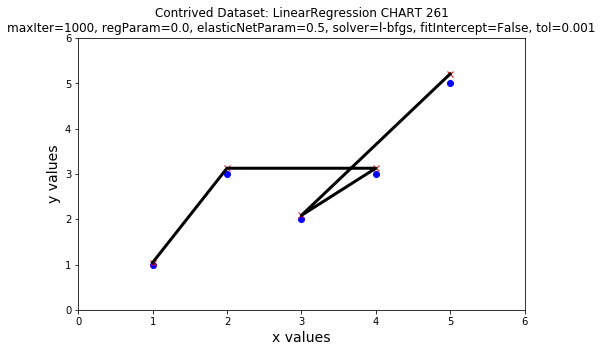

--------------------------------------------------

CHART 262

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


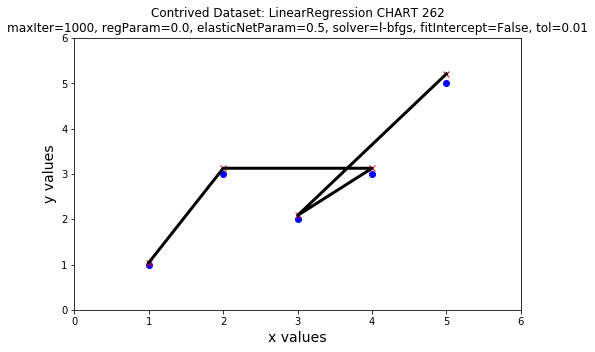

--------------------------------------------------

CHART 263

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


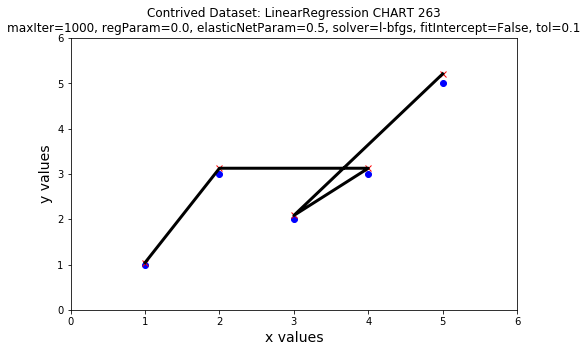

--------------------------------------------------

CHART 264

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


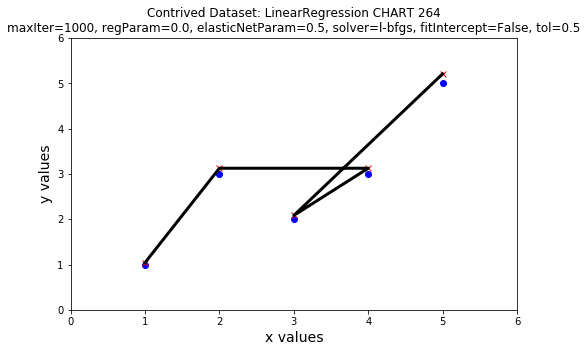

--------------------------------------------------

CHART 265

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


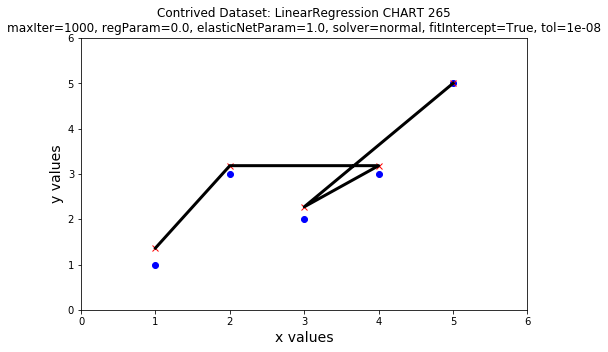

--------------------------------------------------

CHART 266

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


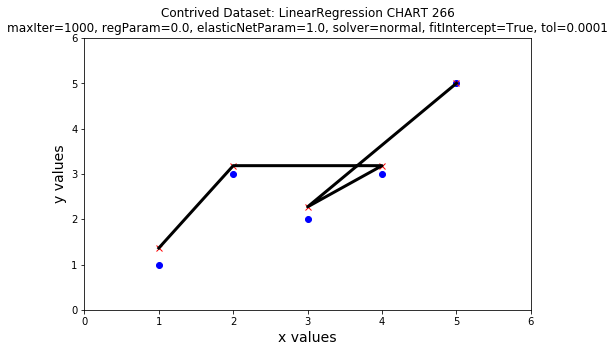

--------------------------------------------------

CHART 267

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


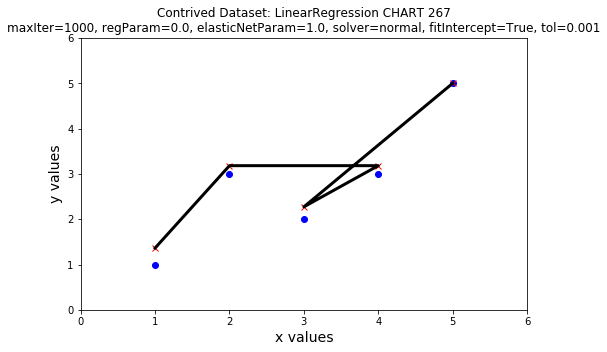

--------------------------------------------------

CHART 268

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


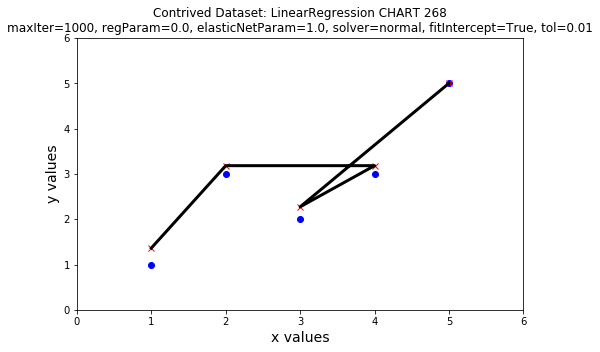

--------------------------------------------------

CHART 269

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


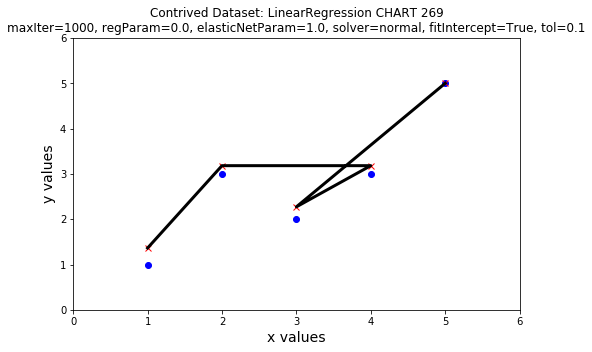

--------------------------------------------------

CHART 270

(1.3636363636363642, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.272727272727273, 3)
(4.999999999999999, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.909091   0.321412    2.828   0.066276
##   0.454545   0.995859    0.456   0.679095
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 1
Coefficients: [0.9090909090909086]
Intercept: 0.4545454545454557
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363642, 3.1818181818181817, 3.1818181818181817, 2.272727272727273, 4.999999999999999]


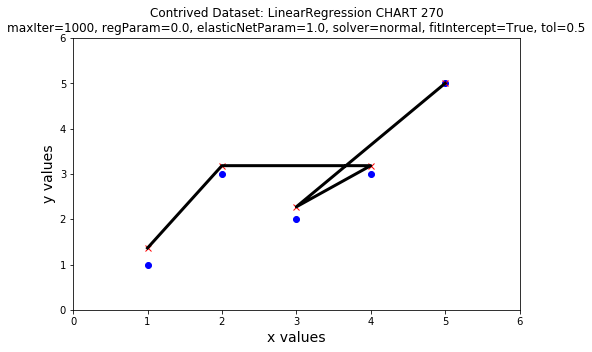

--------------------------------------------------

CHART 271

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


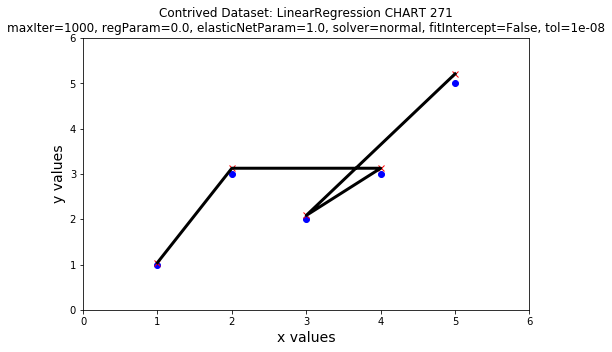

--------------------------------------------------

CHART 272

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


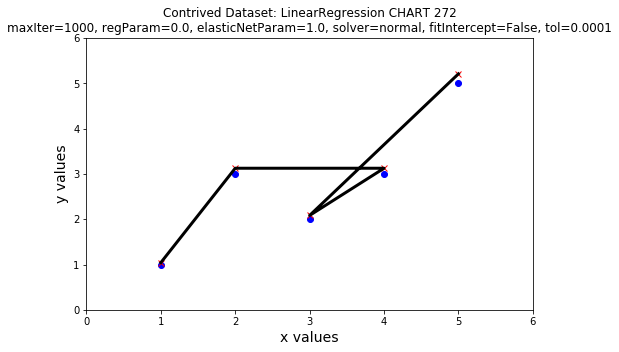

--------------------------------------------------

CHART 273

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


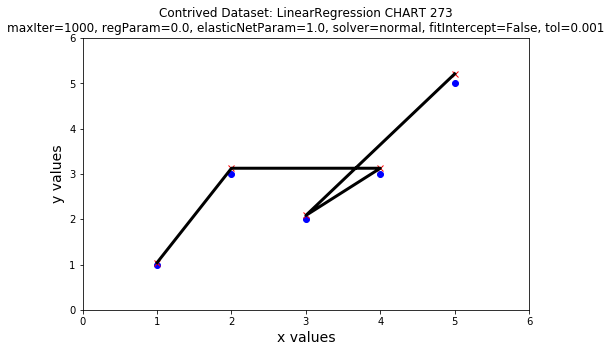

--------------------------------------------------

CHART 274

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


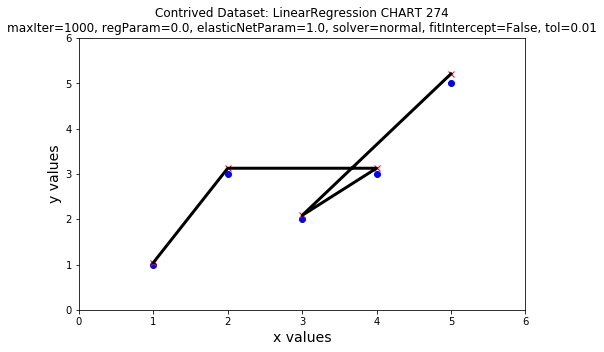

--------------------------------------------------

CHART 275

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


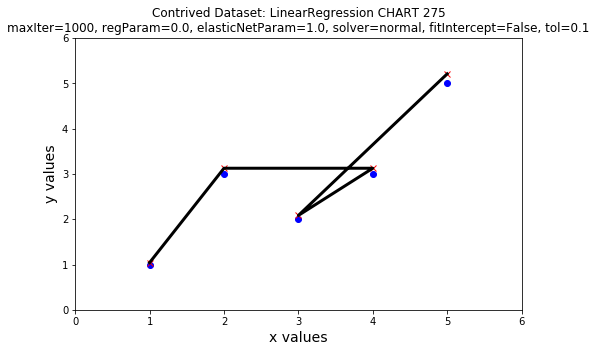

--------------------------------------------------

CHART 276

(1.0416666666666665, 1)
(3.1249999999999996, 2)
(3.1249999999999996, 4)
(2.083333333333333, 3)
(5.208333333333332, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.041667   0.123252    8.452   0.001074
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 1
Coefficients: [1.0416666666666665]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666665, 3.1249999999999996, 3.1249999999999996, 2.083333333333333, 5.208333333333332]


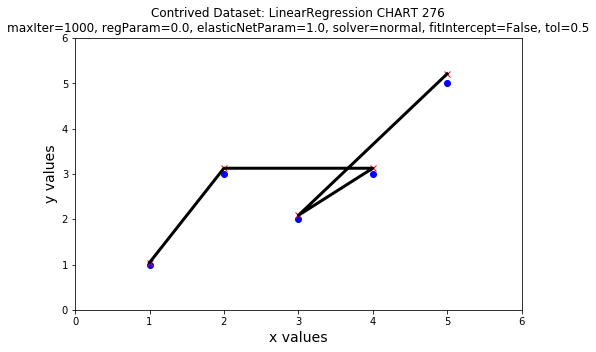

--------------------------------------------------

CHART 277

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


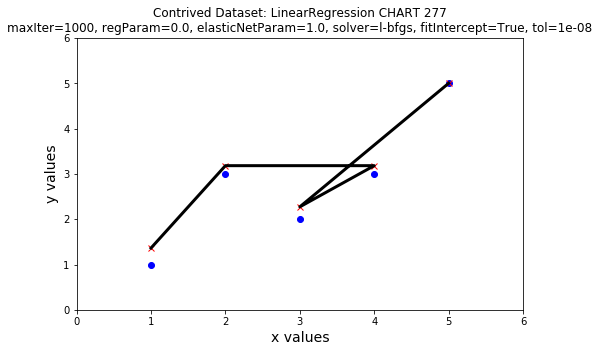

--------------------------------------------------

CHART 278

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


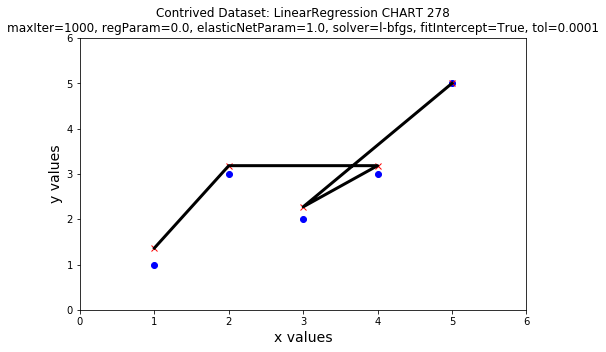

--------------------------------------------------

CHART 279

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


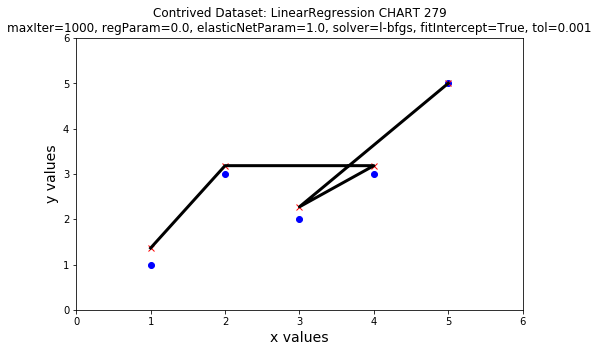

--------------------------------------------------

CHART 280

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


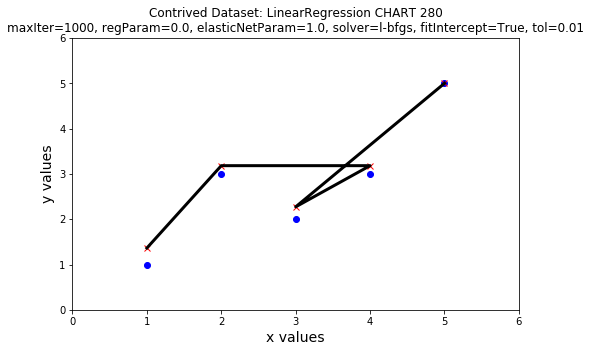

--------------------------------------------------

CHART 281

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


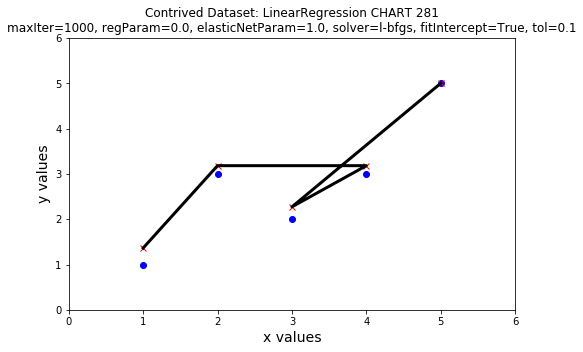

--------------------------------------------------

CHART 282

(1.3636363636363638, 1)
(3.1818181818181817, 2)
(3.1818181818181817, 4)
(2.2727272727272725, 3)
(5.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.545455 , RMSE:  0.738549
## Multiple R-squared: 0.727273 ,             Total iterations: 3
Coefficients: [0.9090909090909091]
Intercept: 0.4545454545454546
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.3636363636363638, 3.1818181818181817, 3.1818181818181817, 2.2727272727272725, 5.0]


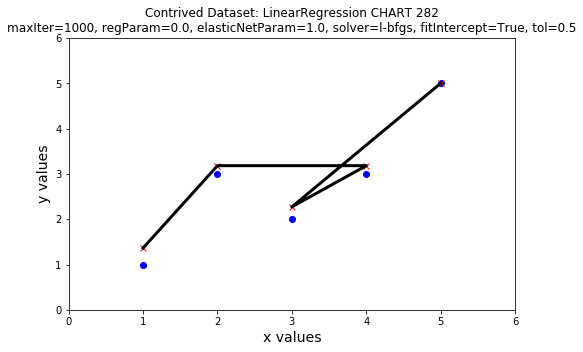

--------------------------------------------------

CHART 283

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


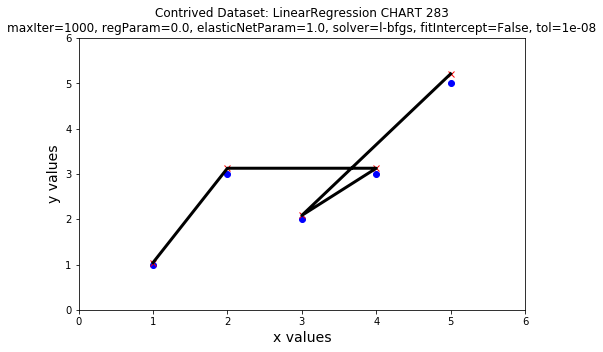

--------------------------------------------------

CHART 284

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


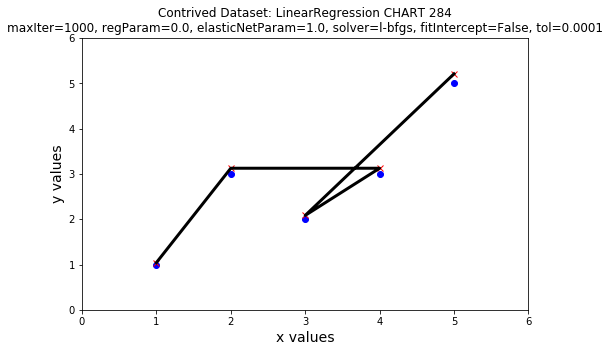

--------------------------------------------------

CHART 285

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


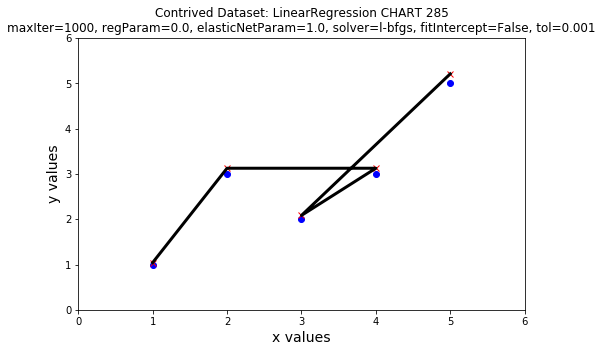

--------------------------------------------------

CHART 286

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


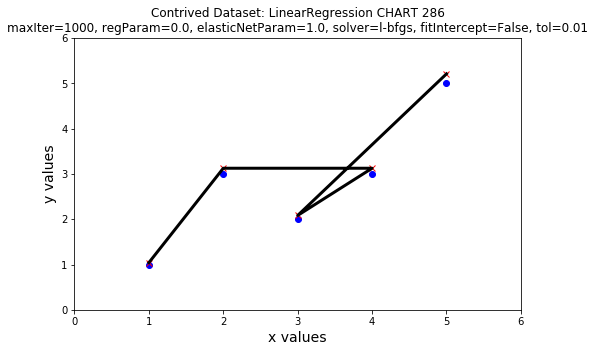

--------------------------------------------------

CHART 287

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


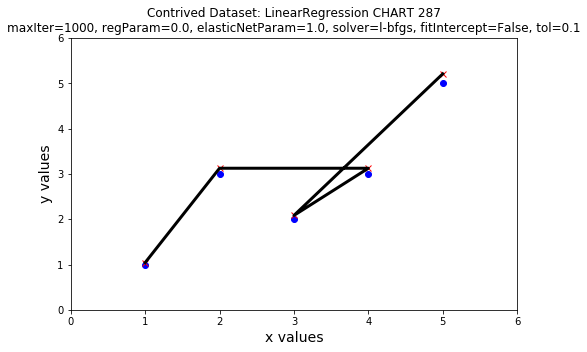

--------------------------------------------------

CHART 288

(1.0416666666666667, 1)
(3.125, 2)
(3.125, 4)
(2.0833333333333335, 3)
(5.208333333333334, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.583333 , RMSE:  0.763763
## Multiple R-squared: 0.946970 ,             Total iterations: 3
Coefficients: [1.0416666666666667]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0416666666666667, 3.125, 3.125, 2.0833333333333335, 5.208333333333334]


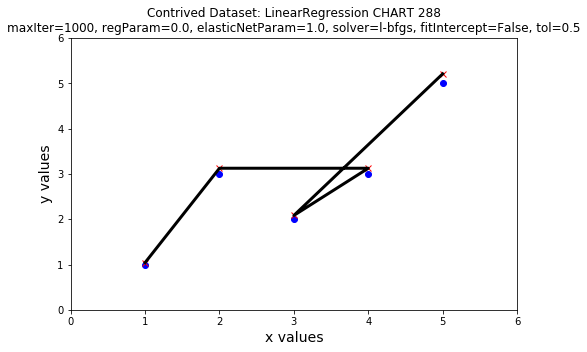

--------------------------------------------------

CHART 289

(1.650012053156342, 1)
(3.149998660760406, 2)
(3.149998660760406, 4)
(2.400005356958374, 3)
(4.649985268364471, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.749993   0.303624    2.470   0.090053
##   0.900019   0.958862    0.939   0.417164
## ---
## Mean squared error:  0.590004 , RMSE:  0.768117
## Multiple R-squared: 0.704998 ,             Total iterations: 1
Coefficients: [0.7499933038020321]
Intercept: 0.9000187493543099
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.650012053156342, 3.149998660760406, 3.149998660760406, 2.400005356958374, 4.649985268364471]


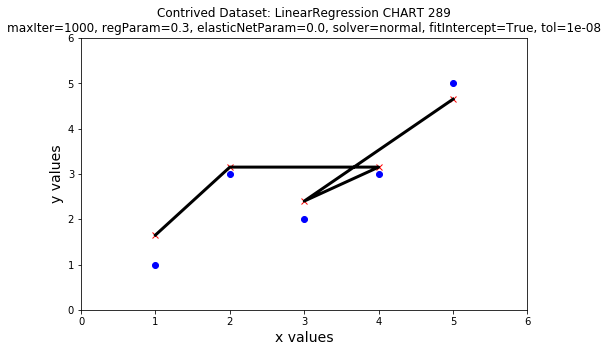

--------------------------------------------------

CHART 290

(1.650012053156342, 1)
(3.149998660760406, 2)
(3.149998660760406, 4)
(2.400005356958374, 3)
(4.649985268364471, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.749993   0.303624    2.470   0.090053
##   0.900019   0.958862    0.939   0.417164
## ---
## Mean squared error:  0.590004 , RMSE:  0.768117
## Multiple R-squared: 0.704998 ,             Total iterations: 1
Coefficients: [0.7499933038020321]
Intercept: 0.9000187493543099
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.650012053156342, 3.149998660760406, 3.149998660760406, 2.400005356958374, 4.649985268364471]


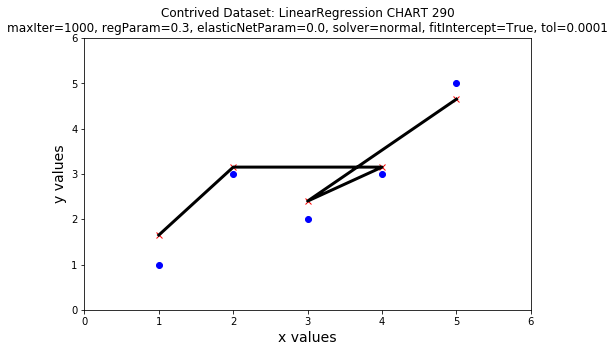

--------------------------------------------------

CHART 291

(1.650012053156342, 1)
(3.149998660760406, 2)
(3.149998660760406, 4)
(2.400005356958374, 3)
(4.649985268364471, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.749993   0.303624    2.470   0.090053
##   0.900019   0.958862    0.939   0.417164
## ---
## Mean squared error:  0.590004 , RMSE:  0.768117
## Multiple R-squared: 0.704998 ,             Total iterations: 1
Coefficients: [0.7499933038020321]
Intercept: 0.9000187493543099
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.650012053156342, 3.149998660760406, 3.149998660760406, 2.400005356958374, 4.649985268364471]


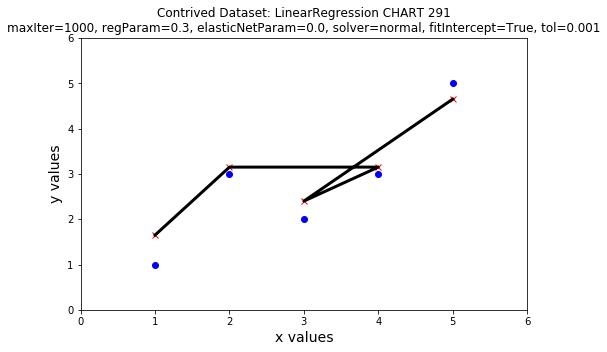

--------------------------------------------------

CHART 292

(1.650012053156342, 1)
(3.149998660760406, 2)
(3.149998660760406, 4)
(2.400005356958374, 3)
(4.649985268364471, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.749993   0.303624    2.470   0.090053
##   0.900019   0.958862    0.939   0.417164
## ---
## Mean squared error:  0.590004 , RMSE:  0.768117
## Multiple R-squared: 0.704998 ,             Total iterations: 1
Coefficients: [0.7499933038020321]
Intercept: 0.9000187493543099
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.650012053156342, 3.149998660760406, 3.149998660760406, 2.400005356958374, 4.649985268364471]


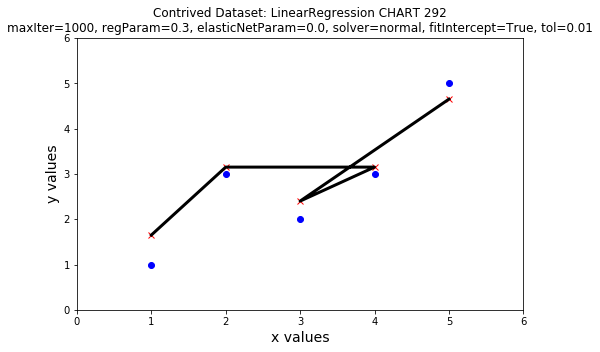

--------------------------------------------------

CHART 293

(1.650012053156342, 1)
(3.149998660760406, 2)
(3.149998660760406, 4)
(2.400005356958374, 3)
(4.649985268364471, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.749993   0.303624    2.470   0.090053
##   0.900019   0.958862    0.939   0.417164
## ---
## Mean squared error:  0.590004 , RMSE:  0.768117
## Multiple R-squared: 0.704998 ,             Total iterations: 1
Coefficients: [0.7499933038020321]
Intercept: 0.9000187493543099
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.650012053156342, 3.149998660760406, 3.149998660760406, 2.400005356958374, 4.649985268364471]


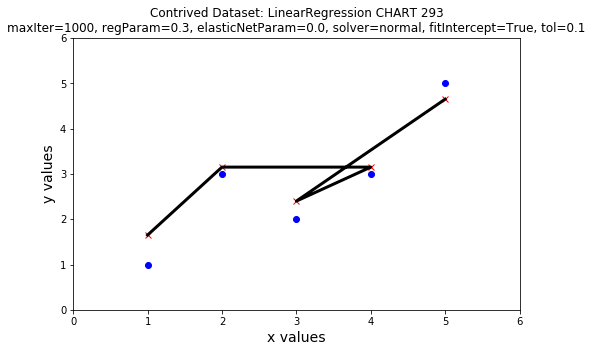

--------------------------------------------------

CHART 294

(1.650012053156342, 1)
(3.149998660760406, 2)
(3.149998660760406, 4)
(2.400005356958374, 3)
(4.649985268364471, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.749993   0.303624    2.470   0.090053
##   0.900019   0.958862    0.939   0.417164
## ---
## Mean squared error:  0.590004 , RMSE:  0.768117
## Multiple R-squared: 0.704998 ,             Total iterations: 1
Coefficients: [0.7499933038020321]
Intercept: 0.9000187493543099
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.650012053156342, 3.149998660760406, 3.149998660760406, 2.400005356958374, 4.649985268364471]


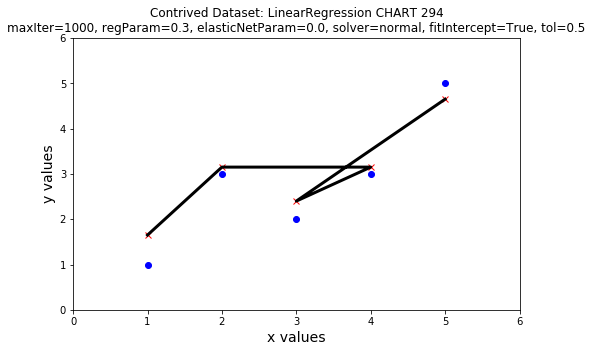

--------------------------------------------------

CHART 295

(1.0026718818825346, 1)
(3.008015645647604, 2)
(3.008015645647604, 4)
(2.0053437637650693, 3)
(5.013359409412673, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.002672   0.122426    8.190   0.001211
## ---
## Mean squared error:  0.597931 , RMSE:  0.773260
## Multiple R-squared: 0.945643 ,             Total iterations: 1
Coefficients: [1.0026718818825346]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0026718818825346, 3.008015645647604, 3.008015645647604, 2.0053437637650693, 5.013359409412673]


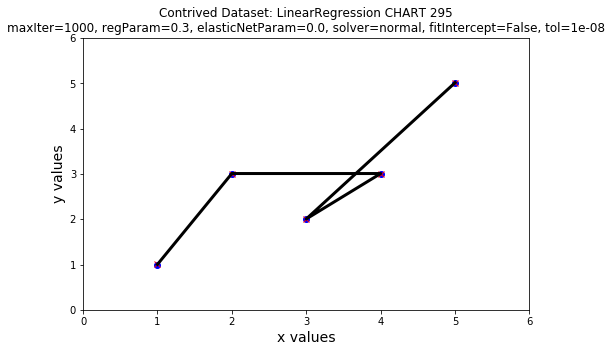

--------------------------------------------------

CHART 296

(1.0026718818825346, 1)
(3.008015645647604, 2)
(3.008015645647604, 4)
(2.0053437637650693, 3)
(5.013359409412673, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.002672   0.122426    8.190   0.001211
## ---
## Mean squared error:  0.597931 , RMSE:  0.773260
## Multiple R-squared: 0.945643 ,             Total iterations: 1
Coefficients: [1.0026718818825346]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0026718818825346, 3.008015645647604, 3.008015645647604, 2.0053437637650693, 5.013359409412673]


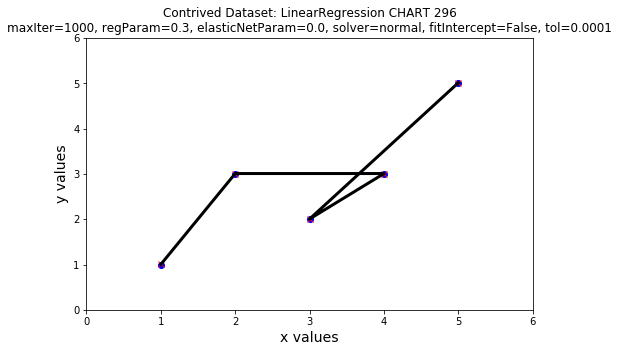

--------------------------------------------------

CHART 297

(1.0026718818825346, 1)
(3.008015645647604, 2)
(3.008015645647604, 4)
(2.0053437637650693, 3)
(5.013359409412673, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.002672   0.122426    8.190   0.001211
## ---
## Mean squared error:  0.597931 , RMSE:  0.773260
## Multiple R-squared: 0.945643 ,             Total iterations: 1
Coefficients: [1.0026718818825346]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0026718818825346, 3.008015645647604, 3.008015645647604, 2.0053437637650693, 5.013359409412673]


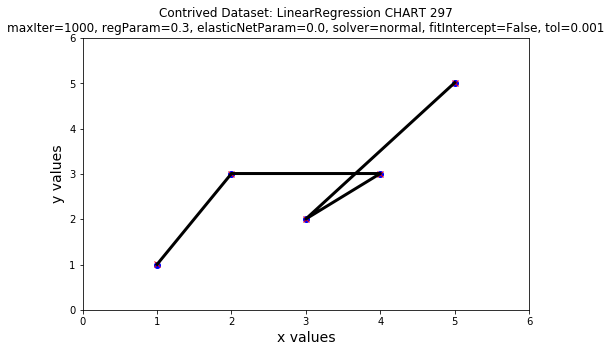

--------------------------------------------------

CHART 298

(1.0026718818825346, 1)
(3.008015645647604, 2)
(3.008015645647604, 4)
(2.0053437637650693, 3)
(5.013359409412673, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.002672   0.122426    8.190   0.001211
## ---
## Mean squared error:  0.597931 , RMSE:  0.773260
## Multiple R-squared: 0.945643 ,             Total iterations: 1
Coefficients: [1.0026718818825346]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0026718818825346, 3.008015645647604, 3.008015645647604, 2.0053437637650693, 5.013359409412673]


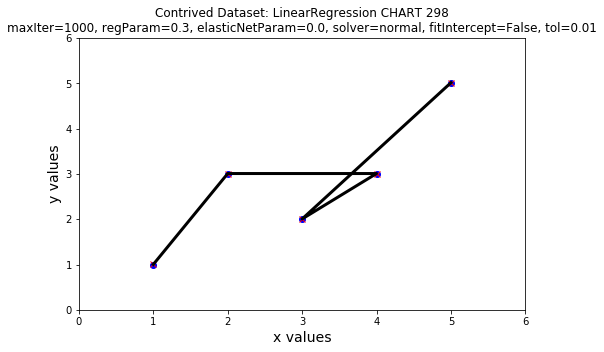

--------------------------------------------------

CHART 299

(1.0026718818825346, 1)
(3.008015645647604, 2)
(3.008015645647604, 4)
(2.0053437637650693, 3)
(5.013359409412673, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.002672   0.122426    8.190   0.001211
## ---
## Mean squared error:  0.597931 , RMSE:  0.773260
## Multiple R-squared: 0.945643 ,             Total iterations: 1
Coefficients: [1.0026718818825346]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0026718818825346, 3.008015645647604, 3.008015645647604, 2.0053437637650693, 5.013359409412673]


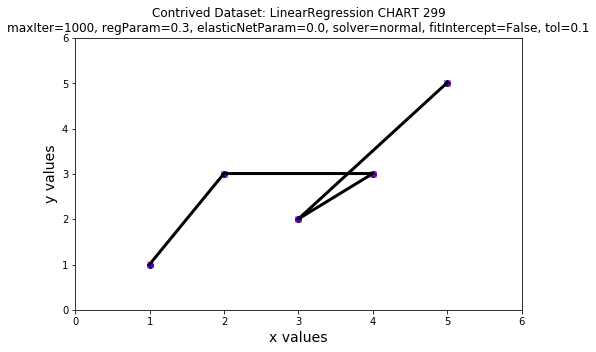

--------------------------------------------------

CHART 300

(1.0026718818825346, 1)
(3.008015645647604, 2)
(3.008015645647604, 4)
(2.0053437637650693, 3)
(5.013359409412673, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   1.002672   0.122426    8.190   0.001211
## ---
## Mean squared error:  0.597931 , RMSE:  0.773260
## Multiple R-squared: 0.945643 ,             Total iterations: 1
Coefficients: [1.0026718818825346]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0026718818825346, 3.008015645647604, 3.008015645647604, 2.0053437637650693, 5.013359409412673]


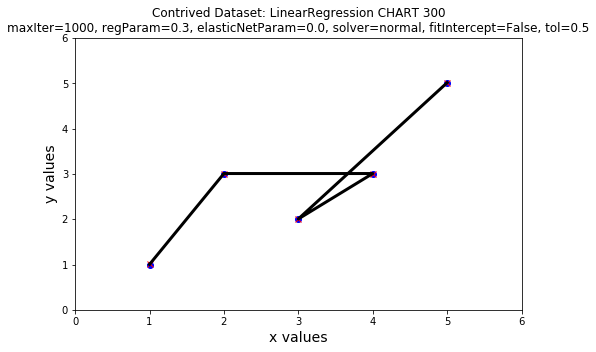

--------------------------------------------------

CHART 301

(1.6773341207684345, 1)
(3.146962875470174, 2)
(3.146962875470174, 4)
(2.412148498119304, 3)
(4.616591630171913, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598910 , RMSE:  0.773893
## Multiple R-squared: 0.700545 ,             Total iterations: 3
Coefficients: [0.7348143773508697]
Intercept: 0.9425197434175647
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.6773341207684345, 3.146962875470174, 3.146962875470174, 2.412148498119304, 4.616591630171913]


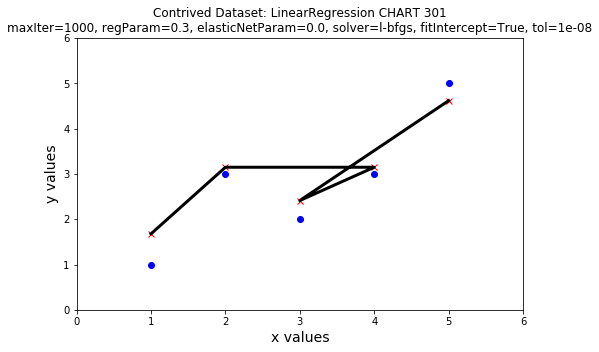

--------------------------------------------------

CHART 302

(1.6773341207684345, 1)
(3.146962875470174, 2)
(3.146962875470174, 4)
(2.412148498119304, 3)
(4.616591630171913, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598910 , RMSE:  0.773893
## Multiple R-squared: 0.700545 ,             Total iterations: 3
Coefficients: [0.7348143773508697]
Intercept: 0.9425197434175647
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.6773341207684345, 3.146962875470174, 3.146962875470174, 2.412148498119304, 4.616591630171913]


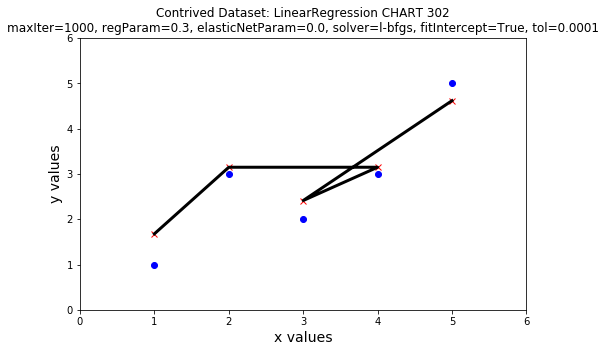

--------------------------------------------------

CHART 303

(1.6773341207684345, 1)
(3.146962875470174, 2)
(3.146962875470174, 4)
(2.412148498119304, 3)
(4.616591630171913, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598910 , RMSE:  0.773893
## Multiple R-squared: 0.700545 ,             Total iterations: 3
Coefficients: [0.7348143773508697]
Intercept: 0.9425197434175647
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.6773341207684345, 3.146962875470174, 3.146962875470174, 2.412148498119304, 4.616591630171913]


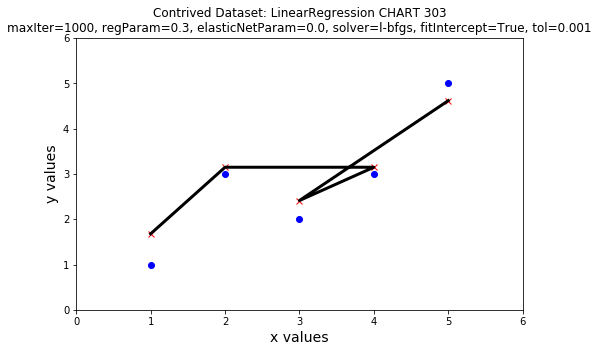

--------------------------------------------------

CHART 304

(1.6773341207684345, 1)
(3.146962875470174, 2)
(3.146962875470174, 4)
(2.412148498119304, 3)
(4.616591630171913, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598910 , RMSE:  0.773893
## Multiple R-squared: 0.700545 ,             Total iterations: 3
Coefficients: [0.7348143773508697]
Intercept: 0.9425197434175647
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.6773341207684345, 3.146962875470174, 3.146962875470174, 2.412148498119304, 4.616591630171913]


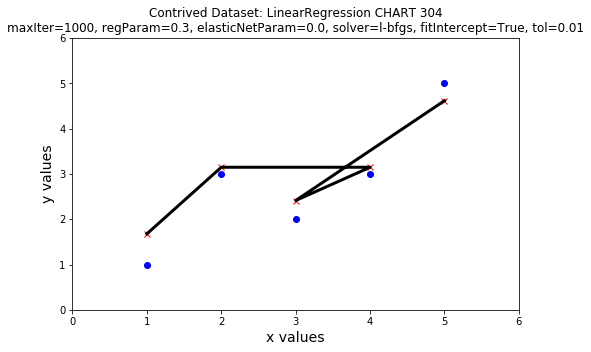

--------------------------------------------------

CHART 305

(1.6773341207684345, 1)
(3.146962875470174, 2)
(3.146962875470174, 4)
(2.412148498119304, 3)
(4.616591630171913, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598910 , RMSE:  0.773893
## Multiple R-squared: 0.700545 ,             Total iterations: 3
Coefficients: [0.7348143773508697]
Intercept: 0.9425197434175647
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.6773341207684345, 3.146962875470174, 3.146962875470174, 2.412148498119304, 4.616591630171913]


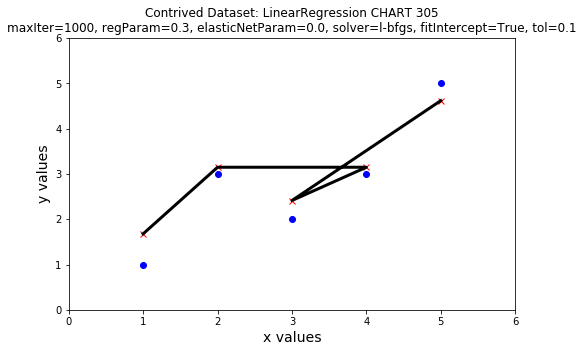

--------------------------------------------------

CHART 306

(1.6773341207684345, 1)
(3.146962875470174, 2)
(3.146962875470174, 4)
(2.412148498119304, 3)
(4.616591630171913, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598910 , RMSE:  0.773893
## Multiple R-squared: 0.700545 ,             Total iterations: 3
Coefficients: [0.7348143773508697]
Intercept: 0.9425197434175647
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.6773341207684345, 3.146962875470174, 3.146962875470174, 2.412148498119304, 4.616591630171913]


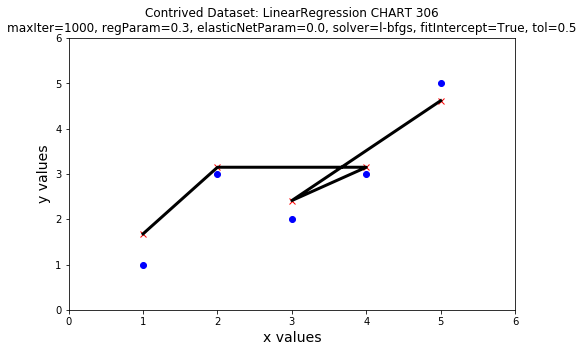

--------------------------------------------------

CHART 307

(0.9982609643990303, 1)
(2.9947828931970912, 2)
(2.9947828931970912, 4)
(1.9965219287980607, 3)
(4.9913048219951515, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.601420 , RMSE:  0.775513
## Multiple R-squared: 0.945325 ,             Total iterations: 3
Coefficients: [0.9982609643990303]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9982609643990303, 2.9947828931970912, 2.9947828931970912, 1.9965219287980607, 4.9913048219951515]


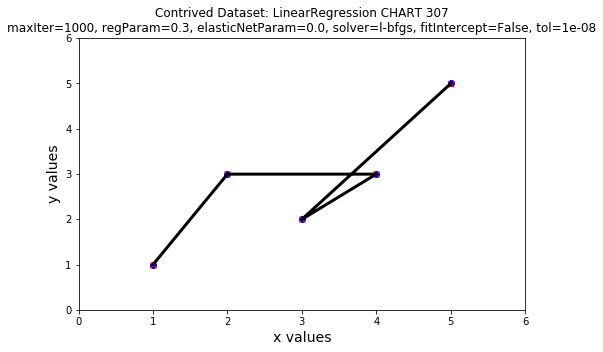

--------------------------------------------------

CHART 308

(0.9982609643990303, 1)
(2.9947828931970912, 2)
(2.9947828931970912, 4)
(1.9965219287980607, 3)
(4.9913048219951515, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.601420 , RMSE:  0.775513
## Multiple R-squared: 0.945325 ,             Total iterations: 3
Coefficients: [0.9982609643990303]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9982609643990303, 2.9947828931970912, 2.9947828931970912, 1.9965219287980607, 4.9913048219951515]


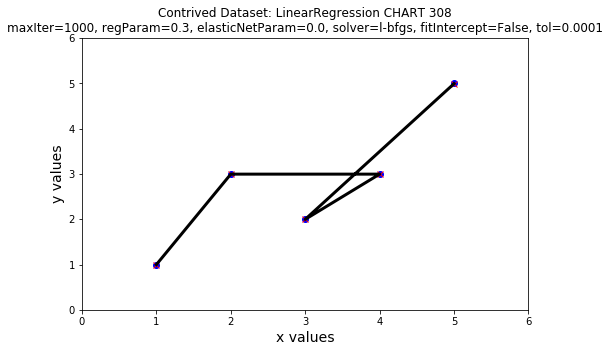

--------------------------------------------------

CHART 309

(0.9982609643990303, 1)
(2.9947828931970912, 2)
(2.9947828931970912, 4)
(1.9965219287980607, 3)
(4.9913048219951515, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.601420 , RMSE:  0.775513
## Multiple R-squared: 0.945325 ,             Total iterations: 3
Coefficients: [0.9982609643990303]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9982609643990303, 2.9947828931970912, 2.9947828931970912, 1.9965219287980607, 4.9913048219951515]


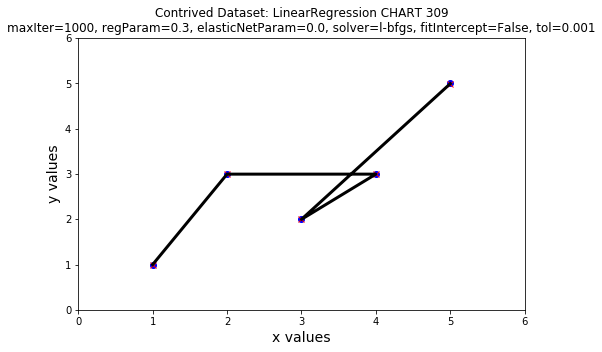

--------------------------------------------------

CHART 310

(0.9982609643990303, 1)
(2.9947828931970912, 2)
(2.9947828931970912, 4)
(1.9965219287980607, 3)
(4.9913048219951515, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.601420 , RMSE:  0.775513
## Multiple R-squared: 0.945325 ,             Total iterations: 3
Coefficients: [0.9982609643990303]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9982609643990303, 2.9947828931970912, 2.9947828931970912, 1.9965219287980607, 4.9913048219951515]


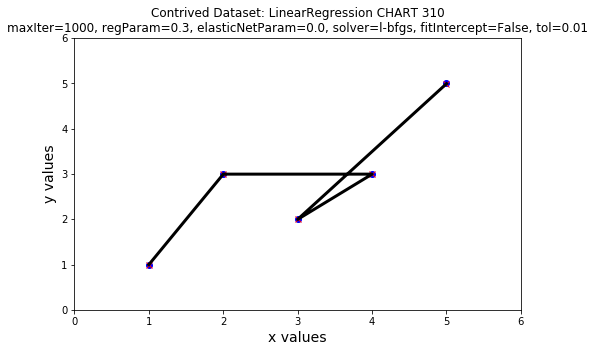

--------------------------------------------------

CHART 311

(0.9982609643990303, 1)
(2.9947828931970912, 2)
(2.9947828931970912, 4)
(1.9965219287980607, 3)
(4.9913048219951515, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.601420 , RMSE:  0.775513
## Multiple R-squared: 0.945325 ,             Total iterations: 3
Coefficients: [0.9982609643990303]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9982609643990303, 2.9947828931970912, 2.9947828931970912, 1.9965219287980607, 4.9913048219951515]


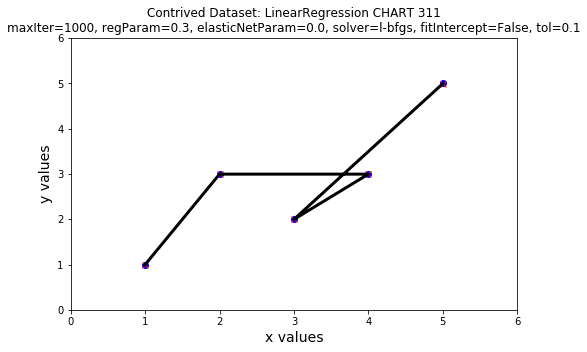

--------------------------------------------------

CHART 312

(0.9982609643990303, 1)
(2.9947828931970912, 2)
(2.9947828931970912, 4)
(1.9965219287980607, 3)
(4.9913048219951515, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.601420 , RMSE:  0.775513
## Multiple R-squared: 0.945325 ,             Total iterations: 3
Coefficients: [0.9982609643990303]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9982609643990303, 2.9947828931970912, 2.9947828931970912, 1.9965219287980607, 4.9913048219951515]


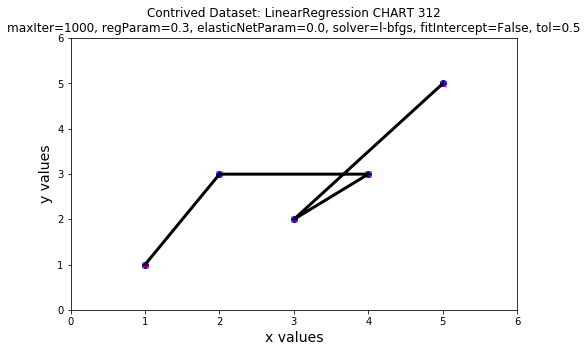

--------------------------------------------------

CHART 313

(1.7045588088589803, 1)
(3.14393791012678, 2)
(3.14393791012678, 4)
(2.4242483594928803, 3)
(4.58331701139458, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.608591 , RMSE:  0.780122
## Multiple R-squared: 0.695705 ,             Total iterations: 3
Coefficients: [0.7196895506338998]
Intercept: 0.9848692582250805
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7045588088589803, 3.14393791012678, 3.14393791012678, 2.4242483594928803, 4.58331701139458]


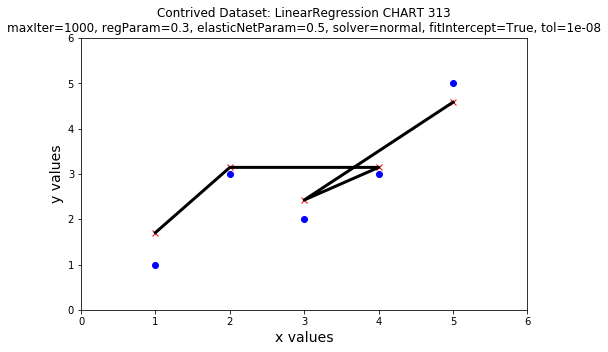

--------------------------------------------------

CHART 314

(1.7045588088589803, 1)
(3.14393791012678, 2)
(3.14393791012678, 4)
(2.4242483594928803, 3)
(4.58331701139458, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.608591 , RMSE:  0.780122
## Multiple R-squared: 0.695705 ,             Total iterations: 3
Coefficients: [0.7196895506338998]
Intercept: 0.9848692582250805
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7045588088589803, 3.14393791012678, 3.14393791012678, 2.4242483594928803, 4.58331701139458]


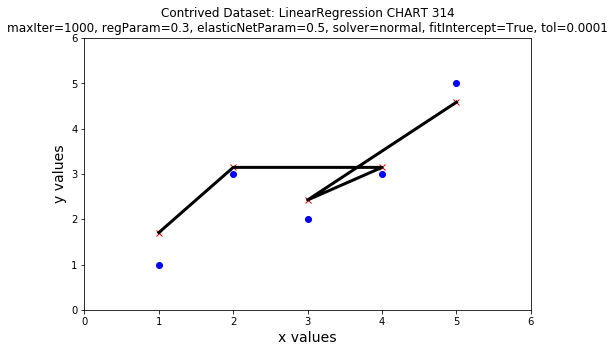

--------------------------------------------------

CHART 315

(1.7045588088589803, 1)
(3.14393791012678, 2)
(3.14393791012678, 4)
(2.4242483594928803, 3)
(4.58331701139458, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.608591 , RMSE:  0.780122
## Multiple R-squared: 0.695705 ,             Total iterations: 3
Coefficients: [0.7196895506338998]
Intercept: 0.9848692582250805
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7045588088589803, 3.14393791012678, 3.14393791012678, 2.4242483594928803, 4.58331701139458]


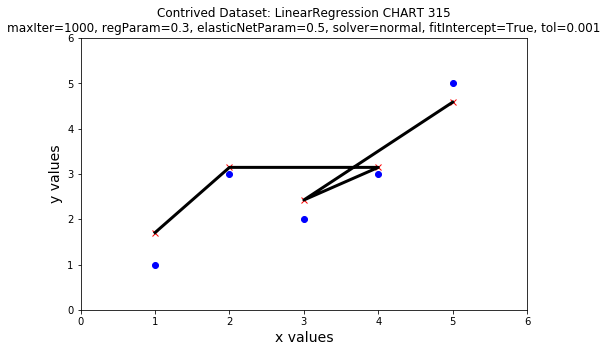

--------------------------------------------------

CHART 316

(1.7045588088589803, 1)
(3.14393791012678, 2)
(3.14393791012678, 4)
(2.4242483594928803, 3)
(4.58331701139458, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.608591 , RMSE:  0.780122
## Multiple R-squared: 0.695705 ,             Total iterations: 3
Coefficients: [0.7196895506338998]
Intercept: 0.9848692582250805
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7045588088589803, 3.14393791012678, 3.14393791012678, 2.4242483594928803, 4.58331701139458]


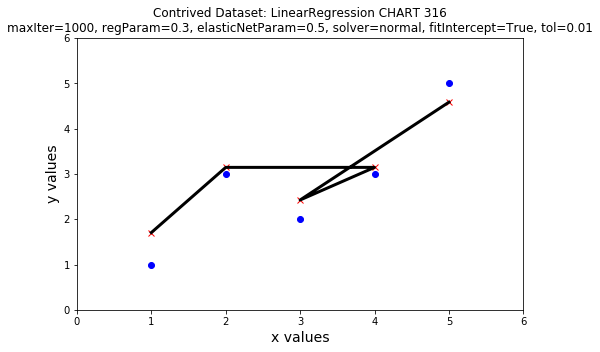

--------------------------------------------------

CHART 317

(1.7045588088589803, 1)
(3.14393791012678, 2)
(3.14393791012678, 4)
(2.4242483594928803, 3)
(4.58331701139458, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.608591 , RMSE:  0.780122
## Multiple R-squared: 0.695705 ,             Total iterations: 3
Coefficients: [0.7196895506338998]
Intercept: 0.9848692582250805
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7045588088589803, 3.14393791012678, 3.14393791012678, 2.4242483594928803, 4.58331701139458]


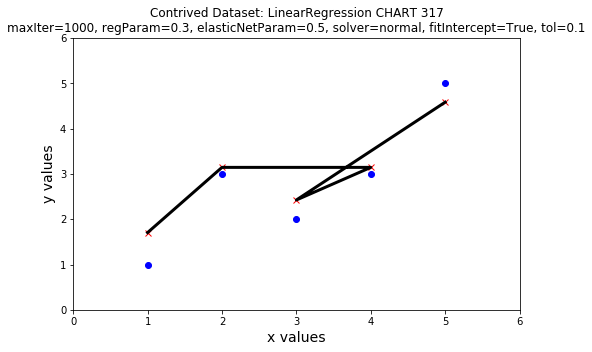

--------------------------------------------------

CHART 318

(1.7045588088589803, 1)
(3.14393791012678, 2)
(3.14393791012678, 4)
(2.4242483594928803, 3)
(4.58331701139458, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.608591 , RMSE:  0.780122
## Multiple R-squared: 0.695705 ,             Total iterations: 3
Coefficients: [0.7196895506338998]
Intercept: 0.9848692582250805
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7045588088589803, 3.14393791012678, 3.14393791012678, 2.4242483594928803, 4.58331701139458]


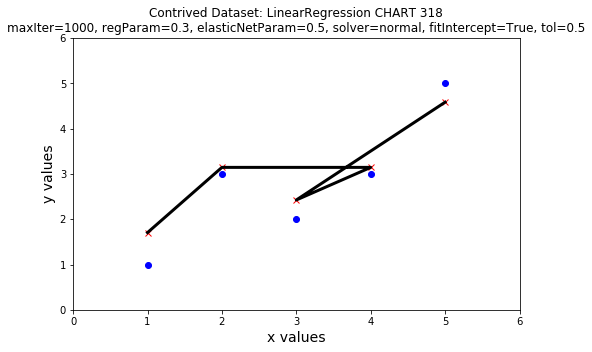

--------------------------------------------------

CHART 319

(1.0014638598505712, 1)
(3.0043915795517133, 2)
(3.0043915795517133, 4)
(2.0029277197011424, 3)
(5.007319299252856, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598849 , RMSE:  0.773854
## Multiple R-squared: 0.945559 ,             Total iterations: 3
Coefficients: [1.0014638598505712]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0014638598505712, 3.0043915795517133, 3.0043915795517133, 2.0029277197011424, 5.007319299252856]


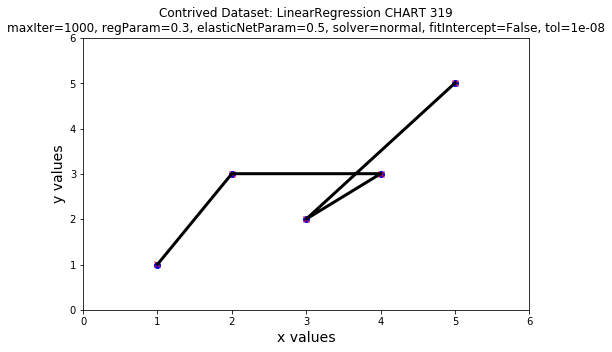

--------------------------------------------------

CHART 320

(1.0014638598505712, 1)
(3.0043915795517133, 2)
(3.0043915795517133, 4)
(2.0029277197011424, 3)
(5.007319299252856, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598849 , RMSE:  0.773854
## Multiple R-squared: 0.945559 ,             Total iterations: 3
Coefficients: [1.0014638598505712]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0014638598505712, 3.0043915795517133, 3.0043915795517133, 2.0029277197011424, 5.007319299252856]


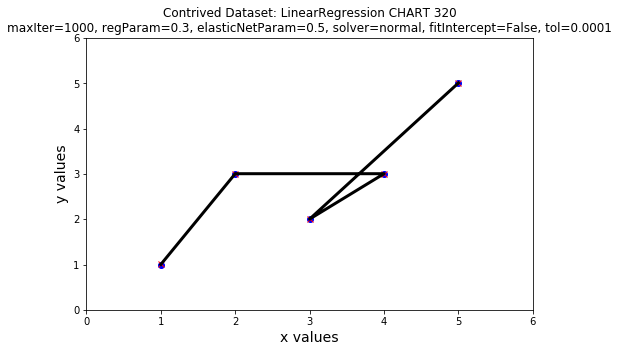

--------------------------------------------------

CHART 321

(1.0014638598505712, 1)
(3.0043915795517133, 2)
(3.0043915795517133, 4)
(2.0029277197011424, 3)
(5.007319299252856, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598849 , RMSE:  0.773854
## Multiple R-squared: 0.945559 ,             Total iterations: 3
Coefficients: [1.0014638598505712]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0014638598505712, 3.0043915795517133, 3.0043915795517133, 2.0029277197011424, 5.007319299252856]


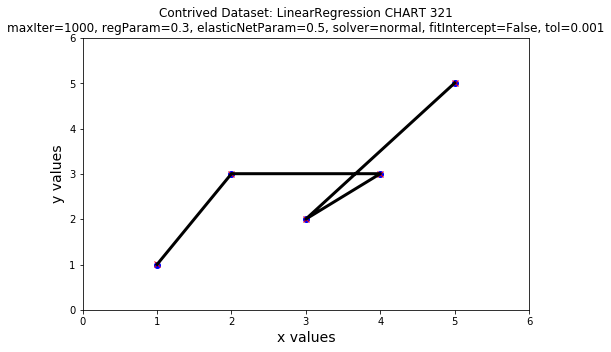

--------------------------------------------------

CHART 322

(1.0014638598505712, 1)
(3.0043915795517133, 2)
(3.0043915795517133, 4)
(2.0029277197011424, 3)
(5.007319299252856, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598849 , RMSE:  0.773854
## Multiple R-squared: 0.945559 ,             Total iterations: 3
Coefficients: [1.0014638598505712]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0014638598505712, 3.0043915795517133, 3.0043915795517133, 2.0029277197011424, 5.007319299252856]


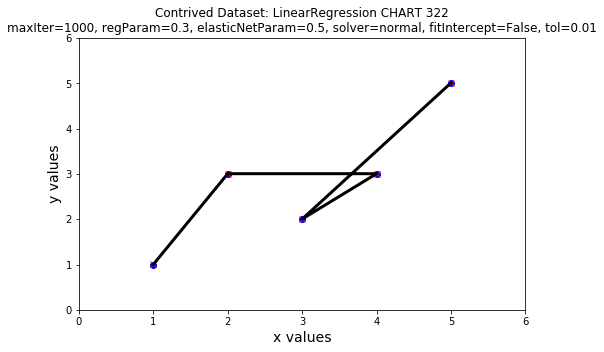

--------------------------------------------------

CHART 323

(1.0014638598505712, 1)
(3.0043915795517133, 2)
(3.0043915795517133, 4)
(2.0029277197011424, 3)
(5.007319299252856, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598849 , RMSE:  0.773854
## Multiple R-squared: 0.945559 ,             Total iterations: 3
Coefficients: [1.0014638598505712]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0014638598505712, 3.0043915795517133, 3.0043915795517133, 2.0029277197011424, 5.007319299252856]


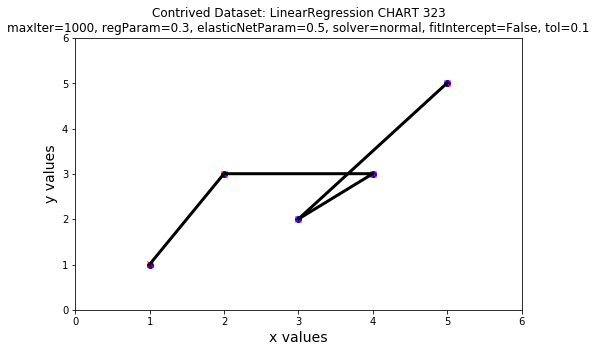

--------------------------------------------------

CHART 324

(1.0014638598505712, 1)
(3.0043915795517133, 2)
(3.0043915795517133, 4)
(2.0029277197011424, 3)
(5.007319299252856, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.598849 , RMSE:  0.773854
## Multiple R-squared: 0.945559 ,             Total iterations: 3
Coefficients: [1.0014638598505712]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0014638598505712, 3.0043915795517133, 3.0043915795517133, 2.0029277197011424, 5.007319299252856]


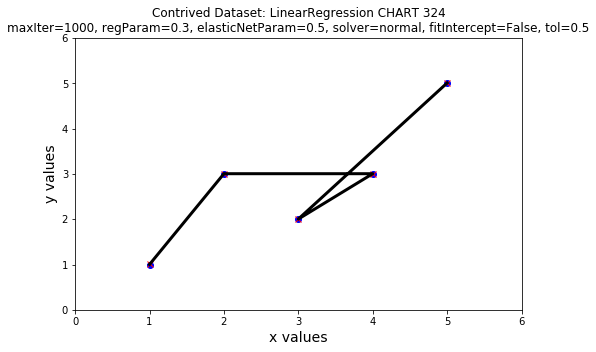

--------------------------------------------------

CHART 325

(1.740533206185354, 1)
(3.1399407548682943, 2)
(3.1399407548682943, 4)
(2.440236980526824, 3)
(4.539348303551234, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.622618 , RMSE:  0.789062
## Multiple R-squared: 0.688691 ,             Total iterations: 3
Coefficients: [0.69970377434147]
Intercept: 1.040829431843884
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.740533206185354, 3.1399407548682943, 3.1399407548682943, 2.440236980526824, 4.539348303551234]


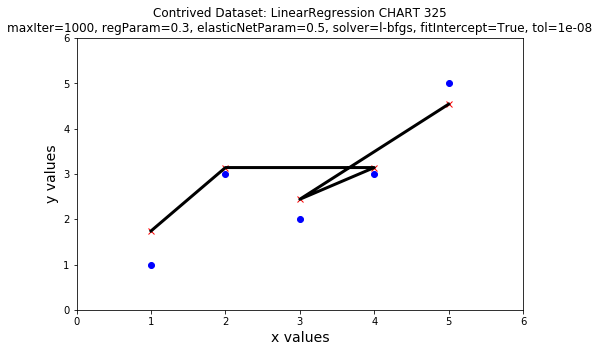

--------------------------------------------------

CHART 326

(1.740533206185354, 1)
(3.1399407548682943, 2)
(3.1399407548682943, 4)
(2.440236980526824, 3)
(4.539348303551234, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.622618 , RMSE:  0.789062
## Multiple R-squared: 0.688691 ,             Total iterations: 3
Coefficients: [0.69970377434147]
Intercept: 1.040829431843884
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.740533206185354, 3.1399407548682943, 3.1399407548682943, 2.440236980526824, 4.539348303551234]


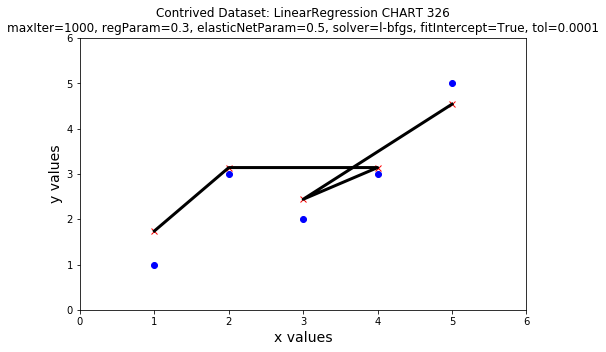

--------------------------------------------------

CHART 327

(1.740533206185354, 1)
(3.1399407548682943, 2)
(3.1399407548682943, 4)
(2.440236980526824, 3)
(4.539348303551234, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.622618 , RMSE:  0.789062
## Multiple R-squared: 0.688691 ,             Total iterations: 3
Coefficients: [0.69970377434147]
Intercept: 1.040829431843884
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.740533206185354, 3.1399407548682943, 3.1399407548682943, 2.440236980526824, 4.539348303551234]


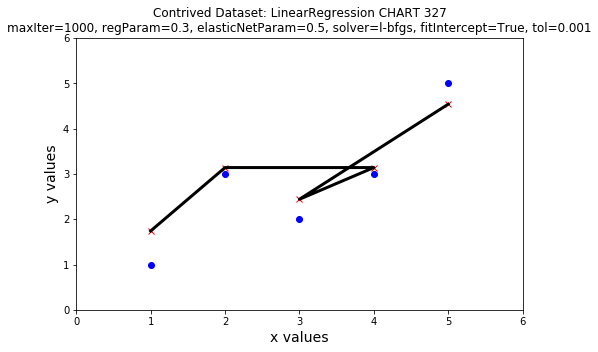

--------------------------------------------------

CHART 328

(1.740533206185354, 1)
(3.1399407548682943, 2)
(3.1399407548682943, 4)
(2.440236980526824, 3)
(4.539348303551234, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.622618 , RMSE:  0.789062
## Multiple R-squared: 0.688691 ,             Total iterations: 3
Coefficients: [0.69970377434147]
Intercept: 1.040829431843884
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.740533206185354, 3.1399407548682943, 3.1399407548682943, 2.440236980526824, 4.539348303551234]


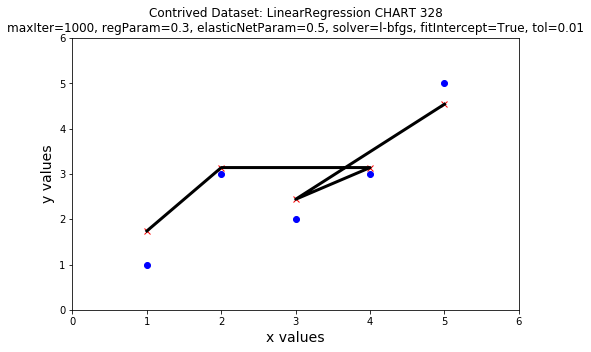

--------------------------------------------------

CHART 329

(1.740533206185354, 1)
(3.1399407548682943, 2)
(3.1399407548682943, 4)
(2.440236980526824, 3)
(4.539348303551234, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.622618 , RMSE:  0.789062
## Multiple R-squared: 0.688691 ,             Total iterations: 3
Coefficients: [0.69970377434147]
Intercept: 1.040829431843884
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.740533206185354, 3.1399407548682943, 3.1399407548682943, 2.440236980526824, 4.539348303551234]


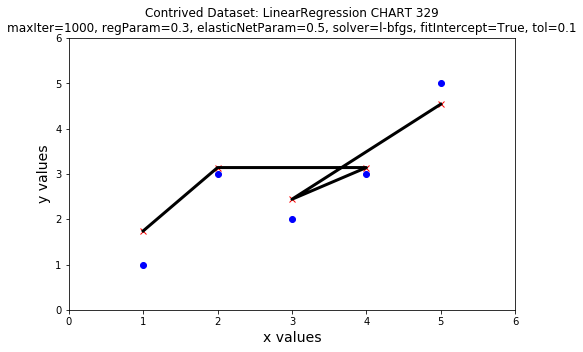

--------------------------------------------------

CHART 330

(1.740533206185354, 1)
(3.1399407548682943, 2)
(3.1399407548682943, 4)
(2.440236980526824, 3)
(4.539348303551234, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.622618 , RMSE:  0.789062
## Multiple R-squared: 0.688691 ,             Total iterations: 3
Coefficients: [0.69970377434147]
Intercept: 1.040829431843884
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.740533206185354, 3.1399407548682943, 3.1399407548682943, 2.440236980526824, 4.539348303551234]


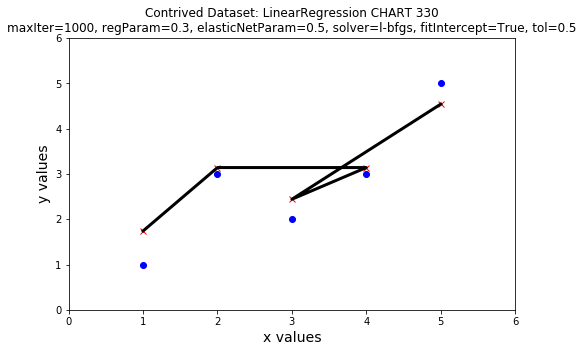

--------------------------------------------------

CHART 331

(0.9968195329305766, 1)
(2.99045859879173, 2)
(2.99045859879173, 4)
(1.9936390658611531, 3)
(4.984097664652883, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.602641 , RMSE:  0.776300
## Multiple R-squared: 0.945214 ,             Total iterations: 3
Coefficients: [0.9968195329305766]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9968195329305766, 2.99045859879173, 2.99045859879173, 1.9936390658611531, 4.984097664652883]


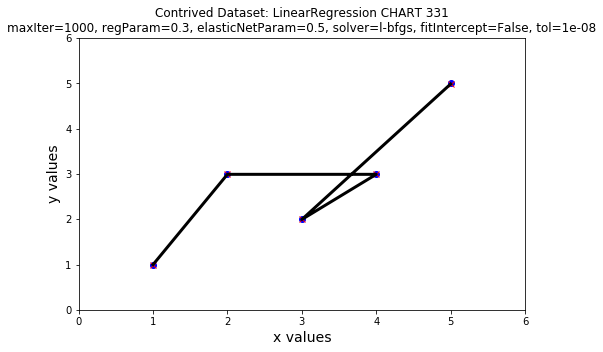

--------------------------------------------------

CHART 332

(0.9968195329305766, 1)
(2.99045859879173, 2)
(2.99045859879173, 4)
(1.9936390658611531, 3)
(4.984097664652883, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.602641 , RMSE:  0.776300
## Multiple R-squared: 0.945214 ,             Total iterations: 3
Coefficients: [0.9968195329305766]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9968195329305766, 2.99045859879173, 2.99045859879173, 1.9936390658611531, 4.984097664652883]


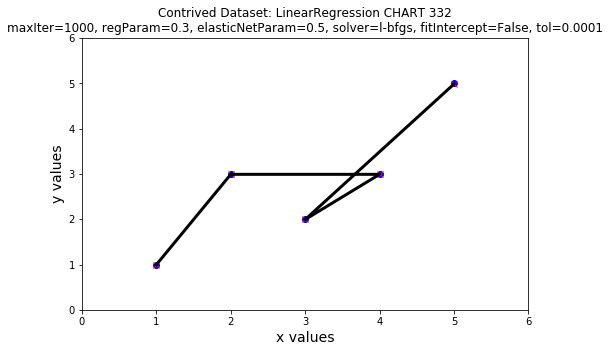

--------------------------------------------------

CHART 333

(0.9968195329305766, 1)
(2.99045859879173, 2)
(2.99045859879173, 4)
(1.9936390658611531, 3)
(4.984097664652883, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.602641 , RMSE:  0.776300
## Multiple R-squared: 0.945214 ,             Total iterations: 3
Coefficients: [0.9968195329305766]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9968195329305766, 2.99045859879173, 2.99045859879173, 1.9936390658611531, 4.984097664652883]


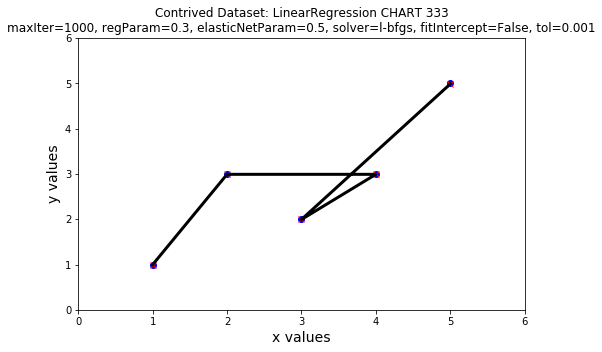

--------------------------------------------------

CHART 334

(0.9968195329305766, 1)
(2.99045859879173, 2)
(2.99045859879173, 4)
(1.9936390658611531, 3)
(4.984097664652883, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.602641 , RMSE:  0.776300
## Multiple R-squared: 0.945214 ,             Total iterations: 3
Coefficients: [0.9968195329305766]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9968195329305766, 2.99045859879173, 2.99045859879173, 1.9936390658611531, 4.984097664652883]


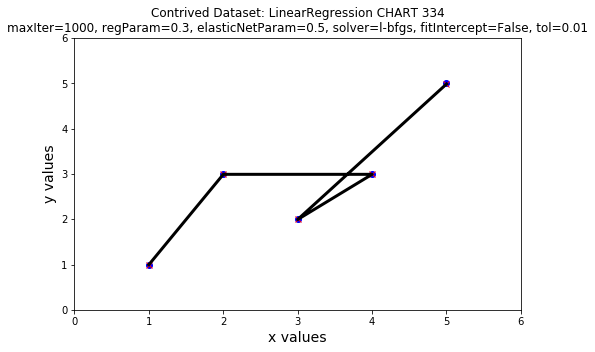

--------------------------------------------------

CHART 335

(0.9968195329305766, 1)
(2.99045859879173, 2)
(2.99045859879173, 4)
(1.9936390658611531, 3)
(4.984097664652883, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.602641 , RMSE:  0.776300
## Multiple R-squared: 0.945214 ,             Total iterations: 3
Coefficients: [0.9968195329305766]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9968195329305766, 2.99045859879173, 2.99045859879173, 1.9936390658611531, 4.984097664652883]


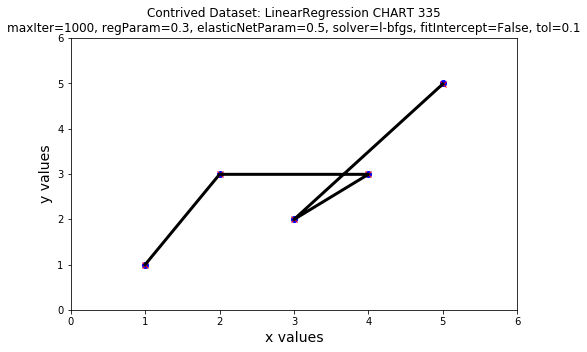

--------------------------------------------------

CHART 336

(0.9968195329305766, 1)
(2.99045859879173, 2)
(2.99045859879173, 4)
(1.9936390658611531, 3)
(4.984097664652883, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.602641 , RMSE:  0.776300
## Multiple R-squared: 0.945214 ,             Total iterations: 3
Coefficients: [0.9968195329305766]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9968195329305766, 2.99045859879173, 2.99045859879173, 1.9936390658611531, 4.984097664652883]


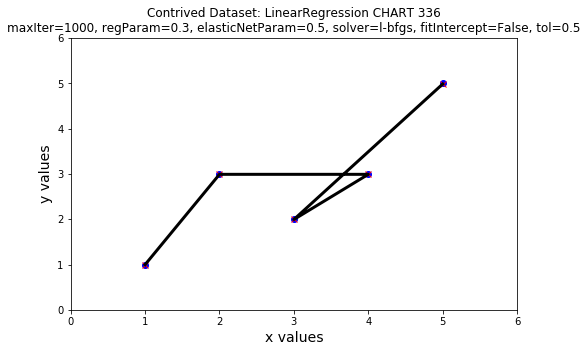

--------------------------------------------------

CHART 337

(1.7706766788163533, 1)
(3.1365914801315165, 2)
(3.1365914801315165, 4)
(2.453634079473935, 3)
(4.50250628144668, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.635455 , RMSE:  0.797154
## Multiple R-squared: 0.682273 ,             Total iterations: 3
Coefficients: [0.6829574006575815]
Intercept: 1.087719278158772
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7706766788163533, 3.1365914801315165, 3.1365914801315165, 2.453634079473935, 4.50250628144668]


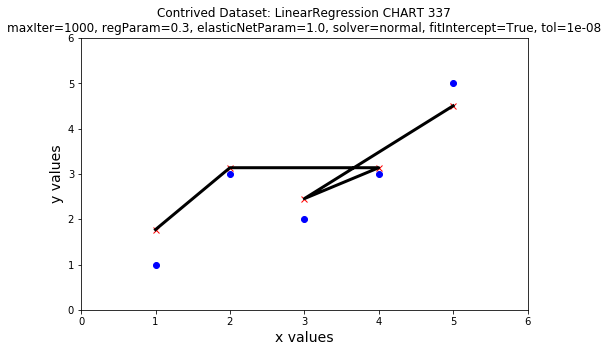

--------------------------------------------------

CHART 338

(1.7706766788163533, 1)
(3.1365914801315165, 2)
(3.1365914801315165, 4)
(2.453634079473935, 3)
(4.50250628144668, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.635455 , RMSE:  0.797154
## Multiple R-squared: 0.682273 ,             Total iterations: 3
Coefficients: [0.6829574006575815]
Intercept: 1.087719278158772
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7706766788163533, 3.1365914801315165, 3.1365914801315165, 2.453634079473935, 4.50250628144668]


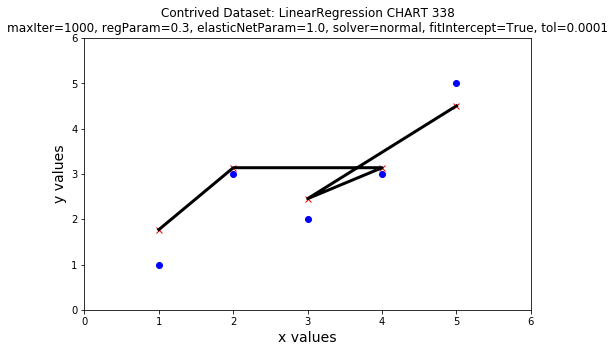

--------------------------------------------------

CHART 339

(1.7706766788163533, 1)
(3.1365914801315165, 2)
(3.1365914801315165, 4)
(2.453634079473935, 3)
(4.50250628144668, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.635455 , RMSE:  0.797154
## Multiple R-squared: 0.682273 ,             Total iterations: 3
Coefficients: [0.6829574006575815]
Intercept: 1.087719278158772
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7706766788163533, 3.1365914801315165, 3.1365914801315165, 2.453634079473935, 4.50250628144668]


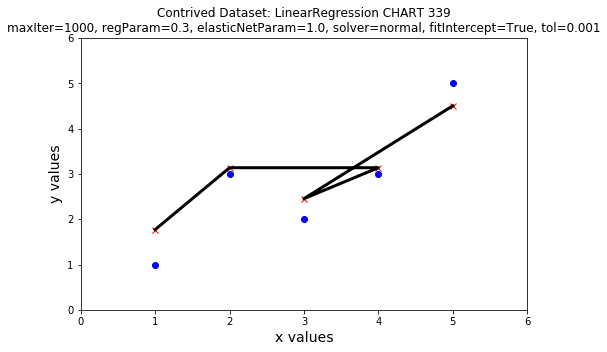

--------------------------------------------------

CHART 340

(1.7706766788163533, 1)
(3.1365914801315165, 2)
(3.1365914801315165, 4)
(2.453634079473935, 3)
(4.50250628144668, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.635455 , RMSE:  0.797154
## Multiple R-squared: 0.682273 ,             Total iterations: 3
Coefficients: [0.6829574006575815]
Intercept: 1.087719278158772
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7706766788163533, 3.1365914801315165, 3.1365914801315165, 2.453634079473935, 4.50250628144668]


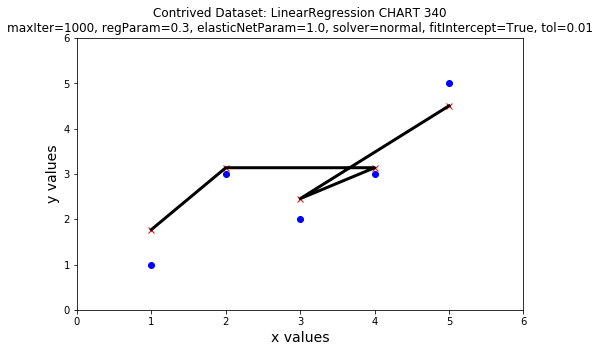

--------------------------------------------------

CHART 341

(1.7706766788163533, 1)
(3.1365914801315165, 2)
(3.1365914801315165, 4)
(2.453634079473935, 3)
(4.50250628144668, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.635455 , RMSE:  0.797154
## Multiple R-squared: 0.682273 ,             Total iterations: 3
Coefficients: [0.6829574006575815]
Intercept: 1.087719278158772
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7706766788163533, 3.1365914801315165, 3.1365914801315165, 2.453634079473935, 4.50250628144668]


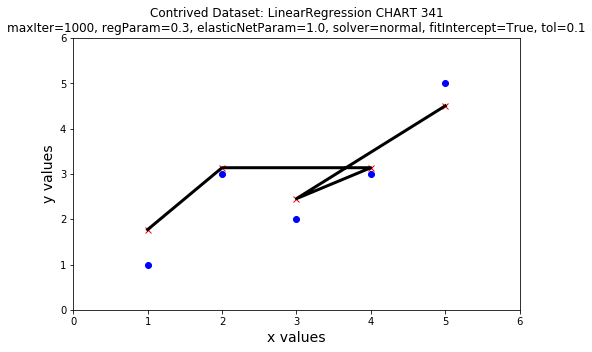

--------------------------------------------------

CHART 342

(1.7706766788163533, 1)
(3.1365914801315165, 2)
(3.1365914801315165, 4)
(2.453634079473935, 3)
(4.50250628144668, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.635455 , RMSE:  0.797154
## Multiple R-squared: 0.682273 ,             Total iterations: 3
Coefficients: [0.6829574006575815]
Intercept: 1.087719278158772
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.7706766788163533, 3.1365914801315165, 3.1365914801315165, 2.453634079473935, 4.50250628144668]


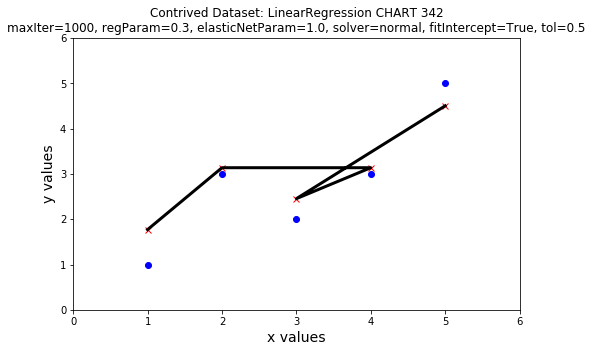

--------------------------------------------------

CHART 343

(1.0002088567872238, 1)
(3.0006265703616712, 2)
(3.0006265703616712, 4)
(2.0004177135744476, 3)
(5.001044283936119, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.599833 , RMSE:  0.774489
## Multiple R-squared: 0.945470 ,             Total iterations: 3
Coefficients: [1.0002088567872238]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0002088567872238, 3.0006265703616712, 3.0006265703616712, 2.0004177135744476, 5.001044283936119]


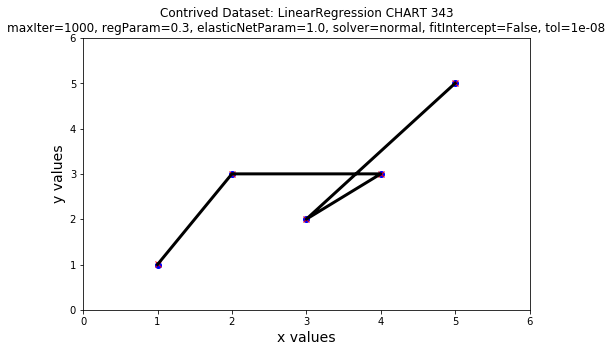

--------------------------------------------------

CHART 344

(1.0002088567872238, 1)
(3.0006265703616712, 2)
(3.0006265703616712, 4)
(2.0004177135744476, 3)
(5.001044283936119, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.599833 , RMSE:  0.774489
## Multiple R-squared: 0.945470 ,             Total iterations: 3
Coefficients: [1.0002088567872238]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0002088567872238, 3.0006265703616712, 3.0006265703616712, 2.0004177135744476, 5.001044283936119]


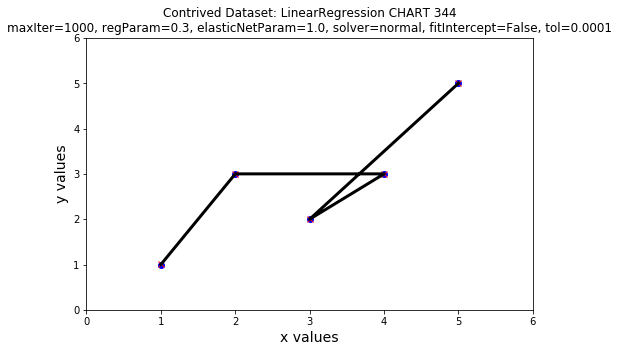

--------------------------------------------------

CHART 345

(1.0002088567872238, 1)
(3.0006265703616712, 2)
(3.0006265703616712, 4)
(2.0004177135744476, 3)
(5.001044283936119, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.599833 , RMSE:  0.774489
## Multiple R-squared: 0.945470 ,             Total iterations: 3
Coefficients: [1.0002088567872238]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0002088567872238, 3.0006265703616712, 3.0006265703616712, 2.0004177135744476, 5.001044283936119]


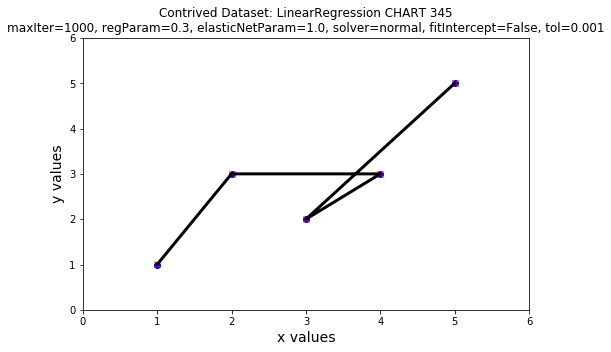

--------------------------------------------------

CHART 346

(1.0002088567872238, 1)
(3.0006265703616712, 2)
(3.0006265703616712, 4)
(2.0004177135744476, 3)
(5.001044283936119, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.599833 , RMSE:  0.774489
## Multiple R-squared: 0.945470 ,             Total iterations: 3
Coefficients: [1.0002088567872238]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0002088567872238, 3.0006265703616712, 3.0006265703616712, 2.0004177135744476, 5.001044283936119]


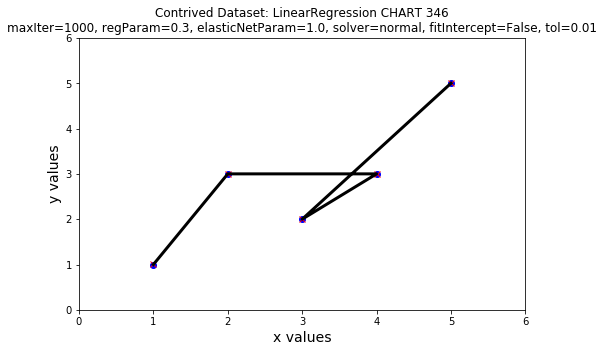

--------------------------------------------------

CHART 347

(1.0002088567872238, 1)
(3.0006265703616712, 2)
(3.0006265703616712, 4)
(2.0004177135744476, 3)
(5.001044283936119, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.599833 , RMSE:  0.774489
## Multiple R-squared: 0.945470 ,             Total iterations: 3
Coefficients: [1.0002088567872238]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0002088567872238, 3.0006265703616712, 3.0006265703616712, 2.0004177135744476, 5.001044283936119]


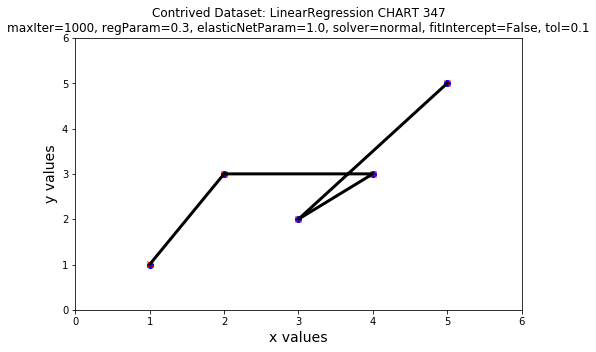

--------------------------------------------------

CHART 348

(1.0002088567872238, 1)
(3.0006265703616712, 2)
(3.0006265703616712, 4)
(2.0004177135744476, 3)
(5.001044283936119, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.599833 , RMSE:  0.774489
## Multiple R-squared: 0.945470 ,             Total iterations: 3
Coefficients: [1.0002088567872238]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.0002088567872238, 3.0006265703616712, 3.0006265703616712, 2.0004177135744476, 5.001044283936119]


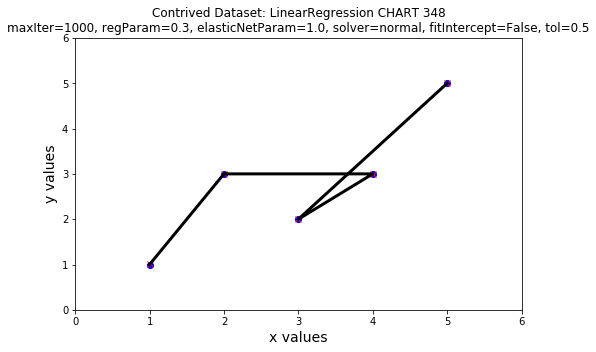

--------------------------------------------------

CHART 349

(1.8187212707990552, 1)
(3.1312531921334386, 2)
(3.1312531921334386, 4)
(2.4749872314662467, 3)
(4.443785113467822, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.657955 , RMSE:  0.811144
## Multiple R-squared: 0.671023 ,             Total iterations: 3
Coefficients: [0.6562659606671916]
Intercept: 1.1624553101318638
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.8187212707990552, 3.1312531921334386, 3.1312531921334386, 2.4749872314662467, 4.443785113467822]


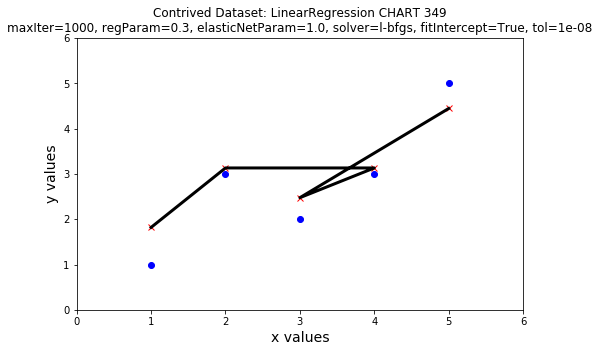

--------------------------------------------------

CHART 350

(1.8187212707990552, 1)
(3.1312531921334386, 2)
(3.1312531921334386, 4)
(2.4749872314662467, 3)
(4.443785113467822, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.657955 , RMSE:  0.811144
## Multiple R-squared: 0.671023 ,             Total iterations: 3
Coefficients: [0.6562659606671916]
Intercept: 1.1624553101318638
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.8187212707990552, 3.1312531921334386, 3.1312531921334386, 2.4749872314662467, 4.443785113467822]


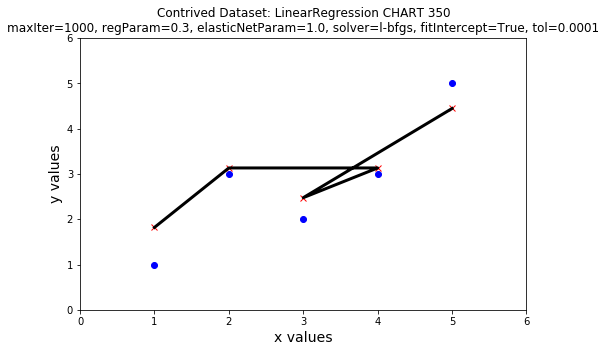

--------------------------------------------------

CHART 351

(1.8187212707990552, 1)
(3.1312531921334386, 2)
(3.1312531921334386, 4)
(2.4749872314662467, 3)
(4.443785113467822, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.657955 , RMSE:  0.811144
## Multiple R-squared: 0.671023 ,             Total iterations: 3
Coefficients: [0.6562659606671916]
Intercept: 1.1624553101318638
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.8187212707990552, 3.1312531921334386, 3.1312531921334386, 2.4749872314662467, 4.443785113467822]


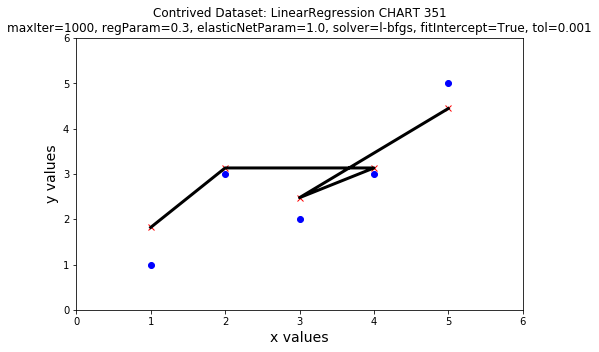

--------------------------------------------------

CHART 352

(1.8187212707990552, 1)
(3.1312531921334386, 2)
(3.1312531921334386, 4)
(2.4749872314662467, 3)
(4.443785113467822, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.657955 , RMSE:  0.811144
## Multiple R-squared: 0.671023 ,             Total iterations: 3
Coefficients: [0.6562659606671916]
Intercept: 1.1624553101318638
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.8187212707990552, 3.1312531921334386, 3.1312531921334386, 2.4749872314662467, 4.443785113467822]


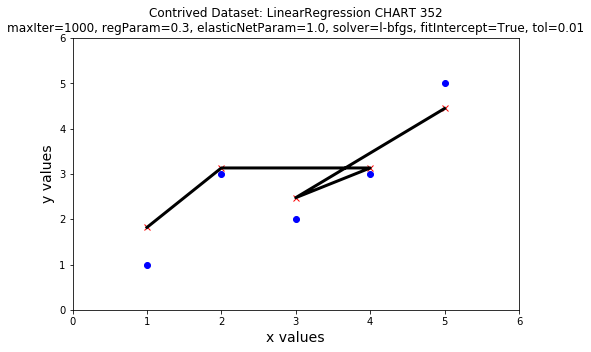

--------------------------------------------------

CHART 353

(1.8187212707990552, 1)
(3.1312531921334386, 2)
(3.1312531921334386, 4)
(2.4749872314662467, 3)
(4.443785113467822, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.657955 , RMSE:  0.811144
## Multiple R-squared: 0.671023 ,             Total iterations: 3
Coefficients: [0.6562659606671916]
Intercept: 1.1624553101318638
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.8187212707990552, 3.1312531921334386, 3.1312531921334386, 2.4749872314662467, 4.443785113467822]


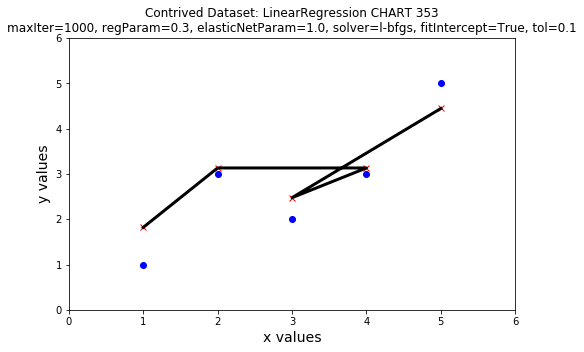

--------------------------------------------------

CHART 354

(1.8187212707990552, 1)
(3.1312531921334386, 2)
(3.1312531921334386, 4)
(2.4749872314662467, 3)
(4.443785113467822, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.657955 , RMSE:  0.811144
## Multiple R-squared: 0.671023 ,             Total iterations: 3
Coefficients: [0.6562659606671916]
Intercept: 1.1624553101318638
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [1.8187212707990552, 3.1312531921334386, 3.1312531921334386, 2.4749872314662467, 4.443785113467822]


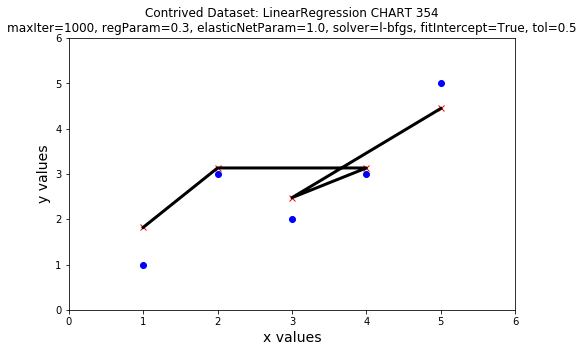

--------------------------------------------------

CHART 355

(0.9953154261223206, 1)
(2.9859462783669617, 2)
(2.9859462783669617, 4)
(1.9906308522446412, 3)
(4.976577130611603, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.603958 , RMSE:  0.777148
## Multiple R-squared: 0.945095 ,             Total iterations: 3
Coefficients: [0.9953154261223206]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9953154261223206, 2.9859462783669617, 2.9859462783669617, 1.9906308522446412, 4.976577130611603]


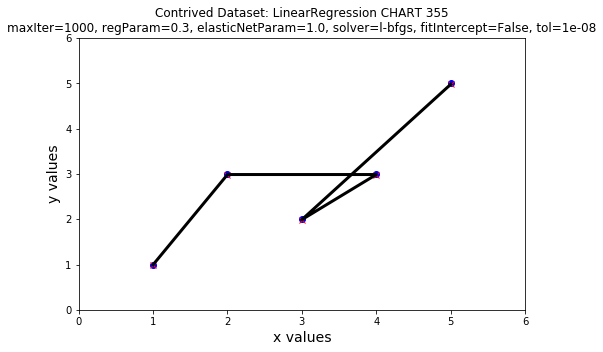

--------------------------------------------------

CHART 356

(0.9953154261223206, 1)
(2.9859462783669617, 2)
(2.9859462783669617, 4)
(1.9906308522446412, 3)
(4.976577130611603, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.603958 , RMSE:  0.777148
## Multiple R-squared: 0.945095 ,             Total iterations: 3
Coefficients: [0.9953154261223206]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9953154261223206, 2.9859462783669617, 2.9859462783669617, 1.9906308522446412, 4.976577130611603]


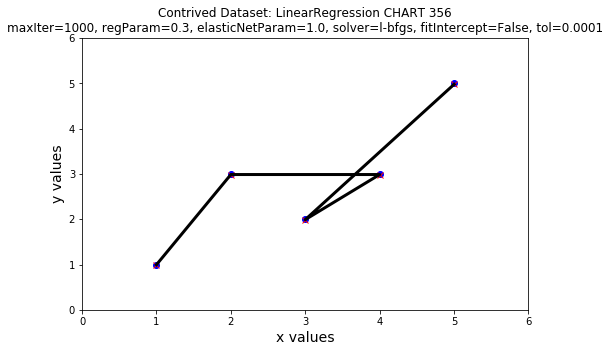

--------------------------------------------------

CHART 357

(0.9953154261223206, 1)
(2.9859462783669617, 2)
(2.9859462783669617, 4)
(1.9906308522446412, 3)
(4.976577130611603, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.603958 , RMSE:  0.777148
## Multiple R-squared: 0.945095 ,             Total iterations: 3
Coefficients: [0.9953154261223206]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9953154261223206, 2.9859462783669617, 2.9859462783669617, 1.9906308522446412, 4.976577130611603]


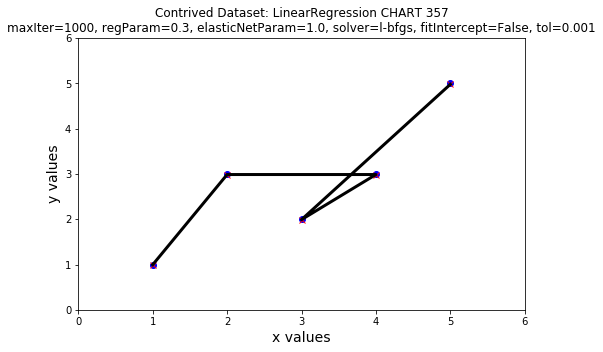

--------------------------------------------------

CHART 358

(0.9953154261223206, 1)
(2.9859462783669617, 2)
(2.9859462783669617, 4)
(1.9906308522446412, 3)
(4.976577130611603, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.603958 , RMSE:  0.777148
## Multiple R-squared: 0.945095 ,             Total iterations: 3
Coefficients: [0.9953154261223206]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9953154261223206, 2.9859462783669617, 2.9859462783669617, 1.9906308522446412, 4.976577130611603]


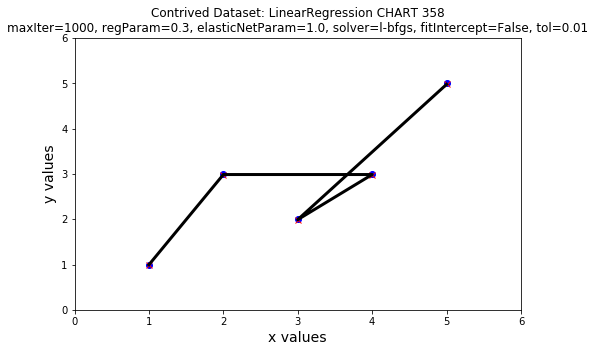

--------------------------------------------------

CHART 359

(0.9953154261223206, 1)
(2.9859462783669617, 2)
(2.9859462783669617, 4)
(1.9906308522446412, 3)
(4.976577130611603, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.603958 , RMSE:  0.777148
## Multiple R-squared: 0.945095 ,             Total iterations: 3
Coefficients: [0.9953154261223206]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9953154261223206, 2.9859462783669617, 2.9859462783669617, 1.9906308522446412, 4.976577130611603]


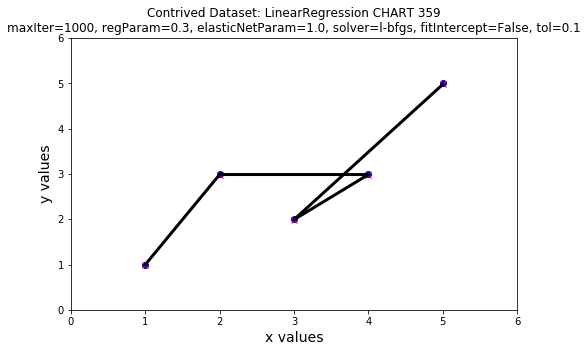

--------------------------------------------------

CHART 360

(0.9953154261223206, 1)
(2.9859462783669617, 2)
(2.9859462783669617, 4)
(1.9906308522446412, 3)
(4.976577130611603, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.603958 , RMSE:  0.777148
## Multiple R-squared: 0.945095 ,             Total iterations: 3
Coefficients: [0.9953154261223206]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9953154261223206, 2.9859462783669617, 2.9859462783669617, 1.9906308522446412, 4.976577130611603]


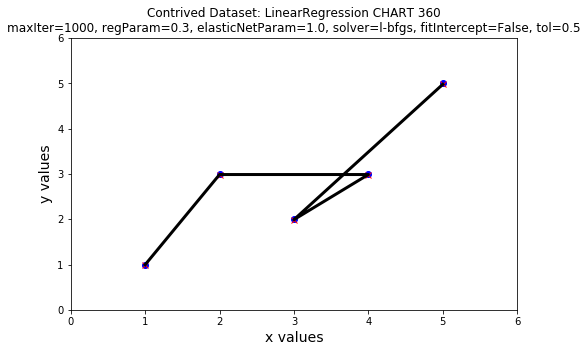

--------------------------------------------------

CHART 361

(2.041440374792338, 1)
(3.1065066250230737, 2)
(3.1065066250230737, 4)
(2.573973499907706, 3)
(4.171572875253809, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.532533   0.296989    1.793   0.170856
##   1.508907   0.978015    1.543   0.220552
## ---
## Mean squared error:  0.795015 , RMSE:  0.891636
## Multiple R-squared: 0.602492 ,             Total iterations: 1
Coefficients: [0.5325331251153678]
Intercept: 1.5089072496769704
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.041440374792338, 3.1065066250230737, 3.1065066250230737, 2.573973499907706, 4.171572875253809]


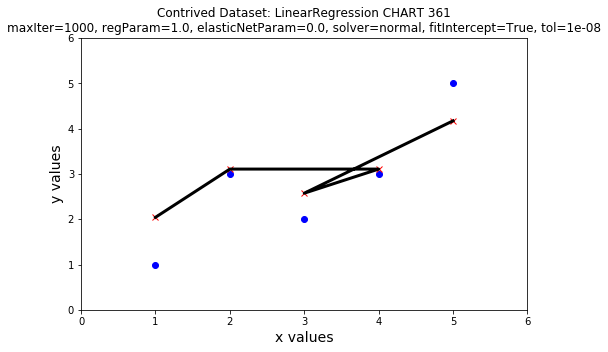

--------------------------------------------------

CHART 362

(2.041440374792338, 1)
(3.1065066250230737, 2)
(3.1065066250230737, 4)
(2.573973499907706, 3)
(4.171572875253809, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.532533   0.296989    1.793   0.170856
##   1.508907   0.978015    1.543   0.220552
## ---
## Mean squared error:  0.795015 , RMSE:  0.891636
## Multiple R-squared: 0.602492 ,             Total iterations: 1
Coefficients: [0.5325331251153678]
Intercept: 1.5089072496769704
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.041440374792338, 3.1065066250230737, 3.1065066250230737, 2.573973499907706, 4.171572875253809]


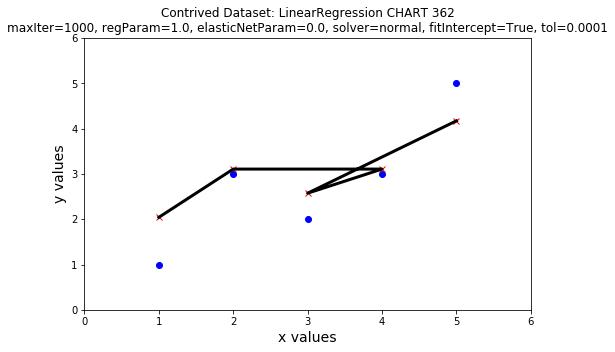

--------------------------------------------------

CHART 363

(2.041440374792338, 1)
(3.1065066250230737, 2)
(3.1065066250230737, 4)
(2.573973499907706, 3)
(4.171572875253809, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.532533   0.296989    1.793   0.170856
##   1.508907   0.978015    1.543   0.220552
## ---
## Mean squared error:  0.795015 , RMSE:  0.891636
## Multiple R-squared: 0.602492 ,             Total iterations: 1
Coefficients: [0.5325331251153678]
Intercept: 1.5089072496769704
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.041440374792338, 3.1065066250230737, 3.1065066250230737, 2.573973499907706, 4.171572875253809]


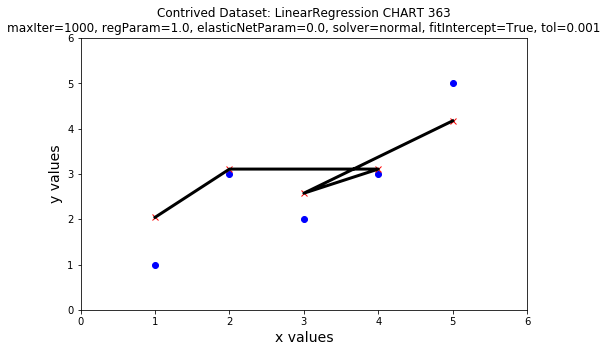

--------------------------------------------------

CHART 364

(2.041440374792338, 1)
(3.1065066250230737, 2)
(3.1065066250230737, 4)
(2.573973499907706, 3)
(4.171572875253809, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.532533   0.296989    1.793   0.170856
##   1.508907   0.978015    1.543   0.220552
## ---
## Mean squared error:  0.795015 , RMSE:  0.891636
## Multiple R-squared: 0.602492 ,             Total iterations: 1
Coefficients: [0.5325331251153678]
Intercept: 1.5089072496769704
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.041440374792338, 3.1065066250230737, 3.1065066250230737, 2.573973499907706, 4.171572875253809]


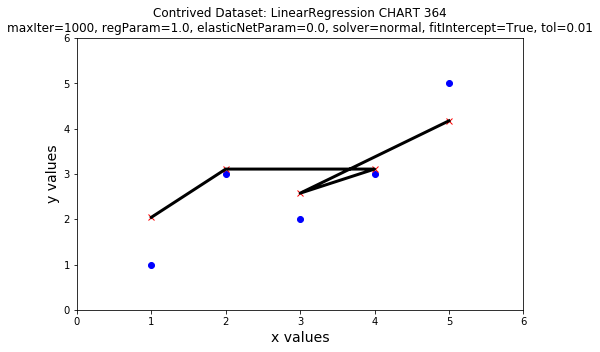

--------------------------------------------------

CHART 365

(2.041440374792338, 1)
(3.1065066250230737, 2)
(3.1065066250230737, 4)
(2.573973499907706, 3)
(4.171572875253809, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.532533   0.296989    1.793   0.170856
##   1.508907   0.978015    1.543   0.220552
## ---
## Mean squared error:  0.795015 , RMSE:  0.891636
## Multiple R-squared: 0.602492 ,             Total iterations: 1
Coefficients: [0.5325331251153678]
Intercept: 1.5089072496769704
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.041440374792338, 3.1065066250230737, 3.1065066250230737, 2.573973499907706, 4.171572875253809]


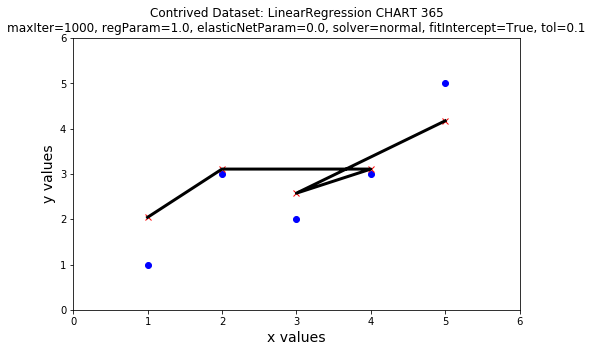

--------------------------------------------------

CHART 366

(2.041440374792338, 1)
(3.1065066250230737, 2)
(3.1065066250230737, 4)
(2.573973499907706, 3)
(4.171572875253809, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.532533   0.296989    1.793   0.170856
##   1.508907   0.978015    1.543   0.220552
## ---
## Mean squared error:  0.795015 , RMSE:  0.891636
## Multiple R-squared: 0.602492 ,             Total iterations: 1
Coefficients: [0.5325331251153678]
Intercept: 1.5089072496769704
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.041440374792338, 3.1065066250230737, 3.1065066250230737, 2.573973499907706, 4.171572875253809]


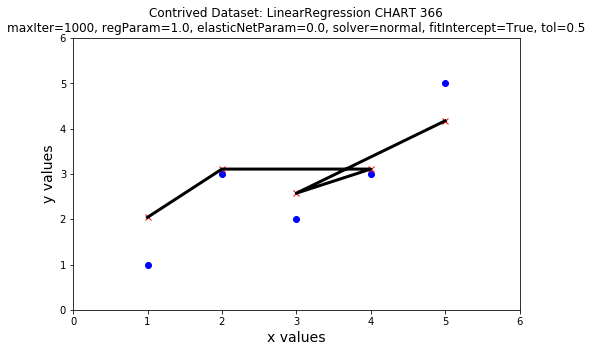

--------------------------------------------------

CHART 367

(0.9221257488160046, 1)
(2.766377246448014, 2)
(2.766377246448014, 4)
(1.8442514976320092, 3)
(4.610628744080023, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.922126   0.128881    7.155   0.002019
## ---
## Mean squared error:  0.720518 , RMSE:  0.848833
## Multiple R-squared: 0.934498 ,             Total iterations: 1
Coefficients: [0.9221257488160046]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9221257488160046, 2.766377246448014, 2.766377246448014, 1.8442514976320092, 4.610628744080023]


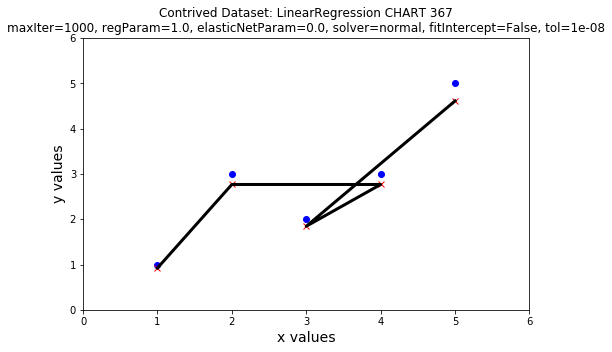

--------------------------------------------------

CHART 368

(0.9221257488160046, 1)
(2.766377246448014, 2)
(2.766377246448014, 4)
(1.8442514976320092, 3)
(4.610628744080023, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.922126   0.128881    7.155   0.002019
## ---
## Mean squared error:  0.720518 , RMSE:  0.848833
## Multiple R-squared: 0.934498 ,             Total iterations: 1
Coefficients: [0.9221257488160046]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9221257488160046, 2.766377246448014, 2.766377246448014, 1.8442514976320092, 4.610628744080023]


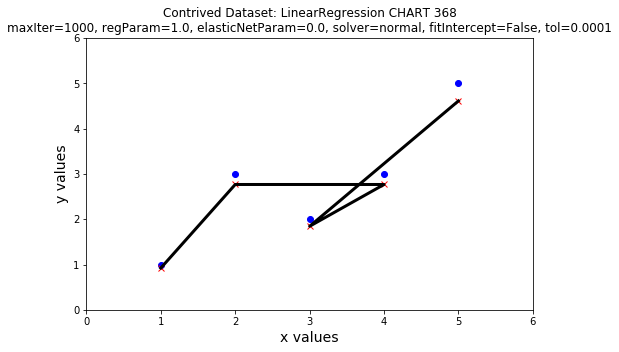

--------------------------------------------------

CHART 369

(0.9221257488160046, 1)
(2.766377246448014, 2)
(2.766377246448014, 4)
(1.8442514976320092, 3)
(4.610628744080023, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.922126   0.128881    7.155   0.002019
## ---
## Mean squared error:  0.720518 , RMSE:  0.848833
## Multiple R-squared: 0.934498 ,             Total iterations: 1
Coefficients: [0.9221257488160046]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9221257488160046, 2.766377246448014, 2.766377246448014, 1.8442514976320092, 4.610628744080023]


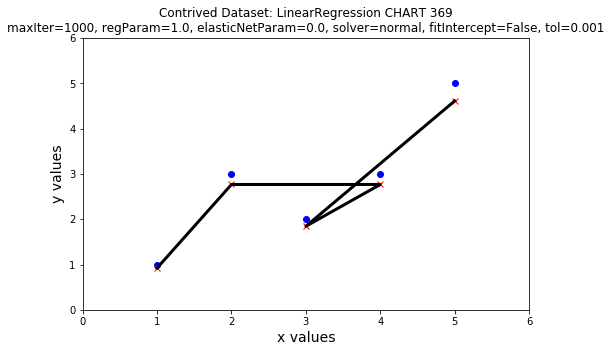

--------------------------------------------------

CHART 370

(0.9221257488160046, 1)
(2.766377246448014, 2)
(2.766377246448014, 4)
(1.8442514976320092, 3)
(4.610628744080023, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.922126   0.128881    7.155   0.002019
## ---
## Mean squared error:  0.720518 , RMSE:  0.848833
## Multiple R-squared: 0.934498 ,             Total iterations: 1
Coefficients: [0.9221257488160046]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9221257488160046, 2.766377246448014, 2.766377246448014, 1.8442514976320092, 4.610628744080023]


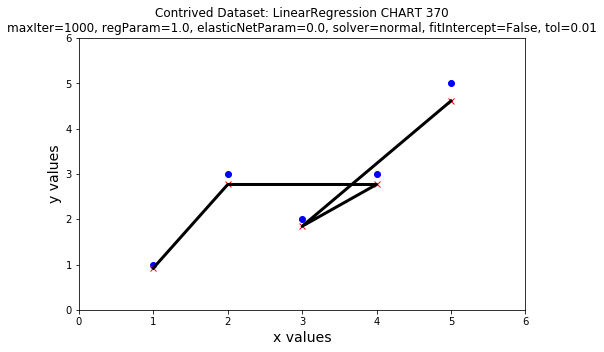

--------------------------------------------------

CHART 371

(0.9221257488160046, 1)
(2.766377246448014, 2)
(2.766377246448014, 4)
(1.8442514976320092, 3)
(4.610628744080023, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.922126   0.128881    7.155   0.002019
## ---
## Mean squared error:  0.720518 , RMSE:  0.848833
## Multiple R-squared: 0.934498 ,             Total iterations: 1
Coefficients: [0.9221257488160046]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9221257488160046, 2.766377246448014, 2.766377246448014, 1.8442514976320092, 4.610628744080023]


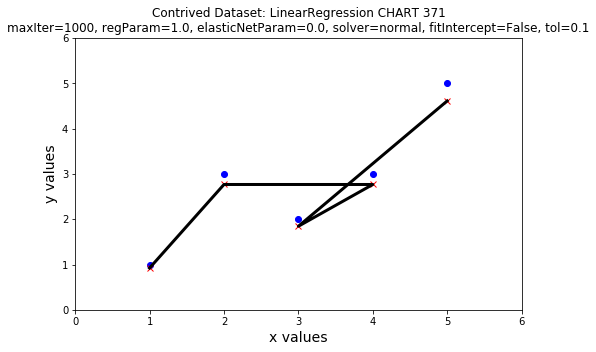

--------------------------------------------------

CHART 372

(0.9221257488160046, 1)
(2.766377246448014, 2)
(2.766377246448014, 4)
(1.8442514976320092, 3)
(4.610628744080023, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
##   0.922126   0.128881    7.155   0.002019
## ---
## Mean squared error:  0.720518 , RMSE:  0.848833
## Multiple R-squared: 0.934498 ,             Total iterations: 1
Coefficients: [0.9221257488160046]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9221257488160046, 2.766377246448014, 2.766377246448014, 1.8442514976320092, 4.610628744080023]


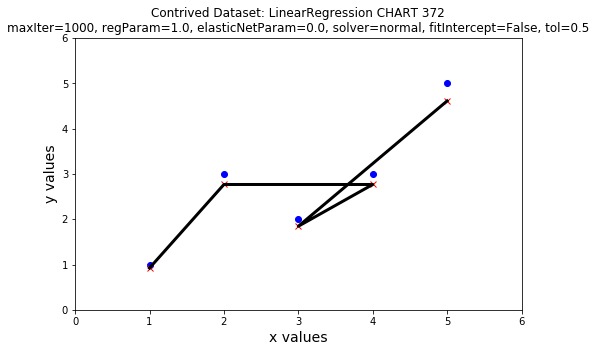

--------------------------------------------------

CHART 373

(2.086121083820051, 1)
(3.1015421017977722, 2)
(3.1015421017977722, 4)
(2.5938315928089115, 3)
(4.116963119775494, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.829002 , RMSE:  0.910495
## Multiple R-squared: 0.585499 ,             Total iterations: 2
Coefficients: [0.5077105089888608]
Intercept: 1.5784105748311898
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.086121083820051, 3.1015421017977722, 3.1015421017977722, 2.5938315928089115, 4.116963119775494]


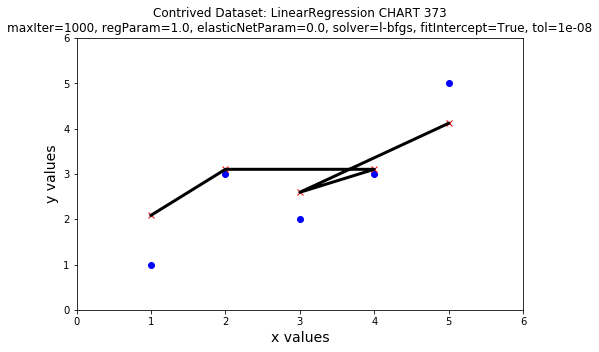

--------------------------------------------------

CHART 374

(2.086121083820051, 1)
(3.1015421017977722, 2)
(3.1015421017977722, 4)
(2.5938315928089115, 3)
(4.116963119775494, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.829002 , RMSE:  0.910495
## Multiple R-squared: 0.585499 ,             Total iterations: 2
Coefficients: [0.5077105089888608]
Intercept: 1.5784105748311898
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.086121083820051, 3.1015421017977722, 3.1015421017977722, 2.5938315928089115, 4.116963119775494]


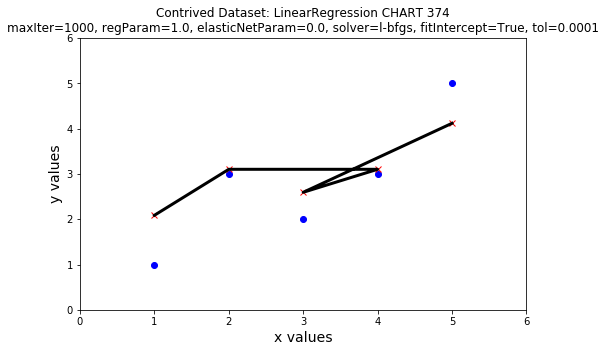

--------------------------------------------------

CHART 375

(2.086121083820051, 1)
(3.1015421017977722, 2)
(3.1015421017977722, 4)
(2.5938315928089115, 3)
(4.116963119775494, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.829002 , RMSE:  0.910495
## Multiple R-squared: 0.585499 ,             Total iterations: 2
Coefficients: [0.5077105089888608]
Intercept: 1.5784105748311898
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.086121083820051, 3.1015421017977722, 3.1015421017977722, 2.5938315928089115, 4.116963119775494]


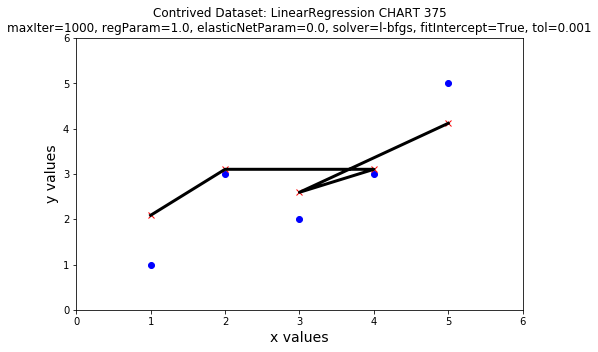

--------------------------------------------------

CHART 376

(2.086121083820051, 1)
(3.1015421017977722, 2)
(3.1015421017977722, 4)
(2.5938315928089115, 3)
(4.116963119775494, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.829002 , RMSE:  0.910495
## Multiple R-squared: 0.585499 ,             Total iterations: 2
Coefficients: [0.5077105089888608]
Intercept: 1.5784105748311898
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.086121083820051, 3.1015421017977722, 3.1015421017977722, 2.5938315928089115, 4.116963119775494]


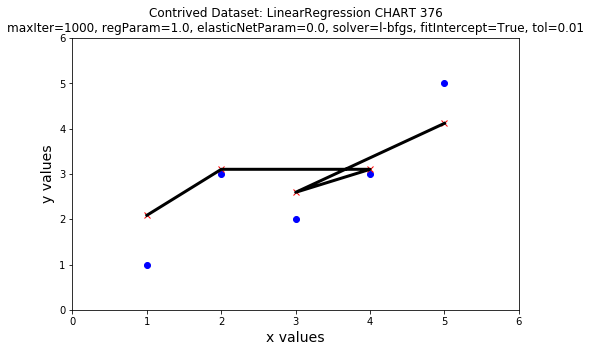

--------------------------------------------------

CHART 377

(2.086121083820051, 1)
(3.1015421017977722, 2)
(3.1015421017977722, 4)
(2.5938315928089115, 3)
(4.116963119775494, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.829002 , RMSE:  0.910495
## Multiple R-squared: 0.585499 ,             Total iterations: 2
Coefficients: [0.5077105089888608]
Intercept: 1.5784105748311898
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.086121083820051, 3.1015421017977722, 3.1015421017977722, 2.5938315928089115, 4.116963119775494]


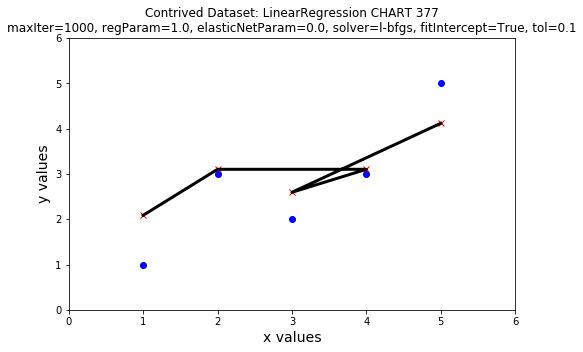

--------------------------------------------------

CHART 378

(2.086121083820051, 1)
(3.1015421017977722, 2)
(3.1015421017977722, 4)
(2.5938315928089115, 3)
(4.116963119775494, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.829002 , RMSE:  0.910495
## Multiple R-squared: 0.585499 ,             Total iterations: 2
Coefficients: [0.5077105089888608]
Intercept: 1.5784105748311898
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.086121083820051, 3.1015421017977722, 3.1015421017977722, 2.5938315928089115, 4.116963119775494]


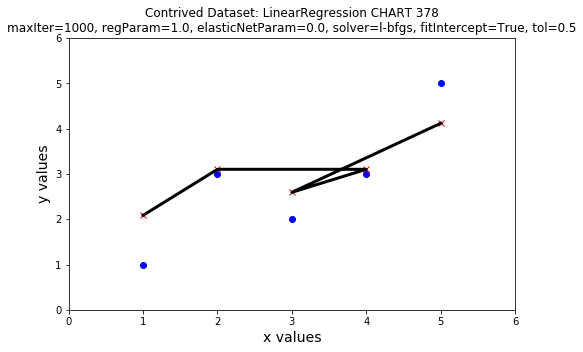

--------------------------------------------------

CHART 379

(0.909802029340964, 1)
(2.729406088022892, 2)
(2.729406088022892, 4)
(1.819604058681928, 3)
(4.54901014670482, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.750261 , RMSE:  0.866176
## Multiple R-squared: 0.931794 ,             Total iterations: 3
Coefficients: [0.909802029340964]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.909802029340964, 2.729406088022892, 2.729406088022892, 1.819604058681928, 4.54901014670482]


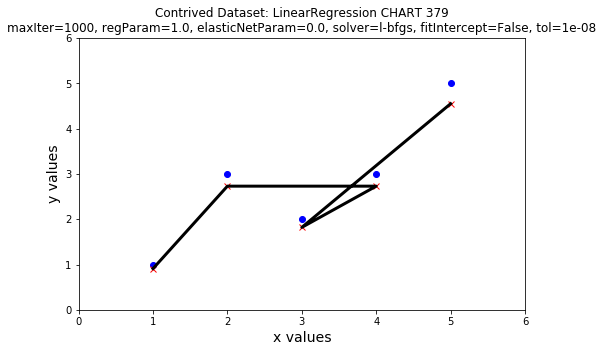

--------------------------------------------------

CHART 380

(0.909802029340964, 1)
(2.729406088022892, 2)
(2.729406088022892, 4)
(1.819604058681928, 3)
(4.54901014670482, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.750261 , RMSE:  0.866176
## Multiple R-squared: 0.931794 ,             Total iterations: 3
Coefficients: [0.909802029340964]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.909802029340964, 2.729406088022892, 2.729406088022892, 1.819604058681928, 4.54901014670482]


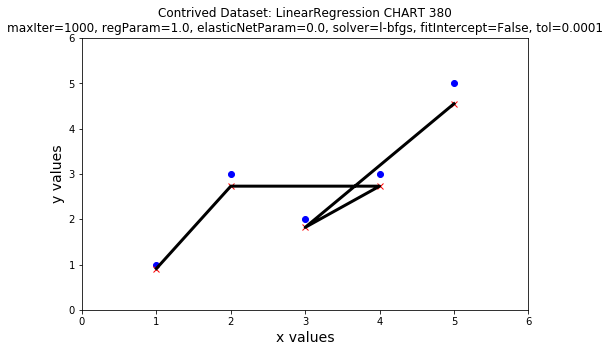

--------------------------------------------------

CHART 381

(0.909802029340964, 1)
(2.729406088022892, 2)
(2.729406088022892, 4)
(1.819604058681928, 3)
(4.54901014670482, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.750261 , RMSE:  0.866176
## Multiple R-squared: 0.931794 ,             Total iterations: 3
Coefficients: [0.909802029340964]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.909802029340964, 2.729406088022892, 2.729406088022892, 1.819604058681928, 4.54901014670482]


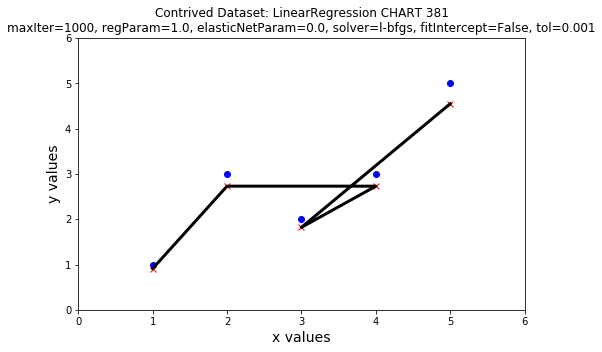

--------------------------------------------------

CHART 382

(0.909802029340964, 1)
(2.729406088022892, 2)
(2.729406088022892, 4)
(1.819604058681928, 3)
(4.54901014670482, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.750261 , RMSE:  0.866176
## Multiple R-squared: 0.931794 ,             Total iterations: 3
Coefficients: [0.909802029340964]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.909802029340964, 2.729406088022892, 2.729406088022892, 1.819604058681928, 4.54901014670482]


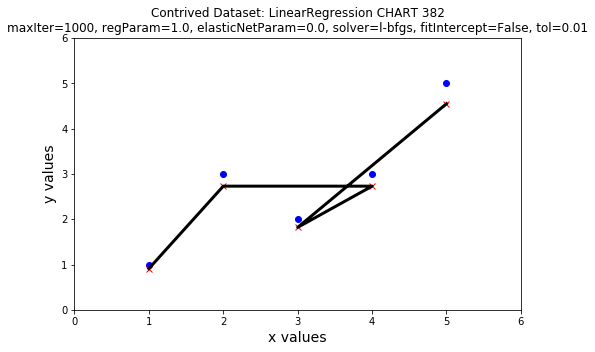

--------------------------------------------------

CHART 383

(0.909802029340964, 1)
(2.729406088022892, 2)
(2.729406088022892, 4)
(1.819604058681928, 3)
(4.54901014670482, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.750261 , RMSE:  0.866176
## Multiple R-squared: 0.931794 ,             Total iterations: 3
Coefficients: [0.909802029340964]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.909802029340964, 2.729406088022892, 2.729406088022892, 1.819604058681928, 4.54901014670482]


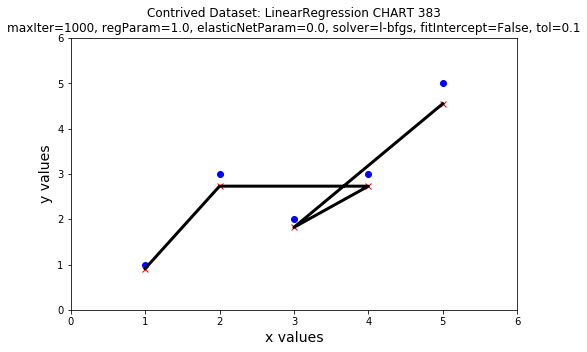

--------------------------------------------------

CHART 384

(0.909802029340964, 1)
(2.729406088022892, 2)
(2.729406088022892, 4)
(1.819604058681928, 3)
(4.54901014670482, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.750261 , RMSE:  0.866176
## Multiple R-squared: 0.931794 ,             Total iterations: 3
Coefficients: [0.909802029340964]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.909802029340964, 2.729406088022892, 2.729406088022892, 1.819604058681928, 4.54901014670482]


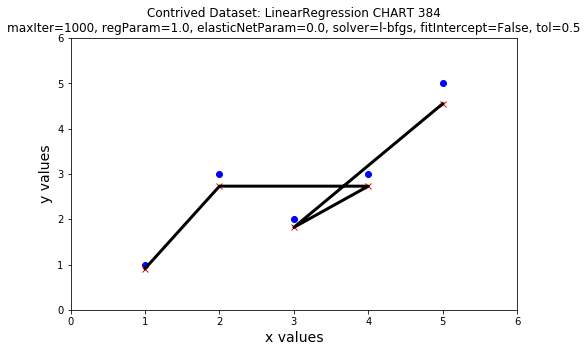

--------------------------------------------------

CHART 385

(2.2922605656184807, 1)
(3.07863771493128, 2)
(3.07863771493128, 4)
(2.6854491402748804, 3)
(3.8650148642440794, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.013888 , RMSE:  1.006920
## Multiple R-squared: 0.493056 ,             Total iterations: 3
Coefficients: [0.3931885746563997]
Intercept: 1.8990719909620808
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.2922605656184807, 3.07863771493128, 3.07863771493128, 2.6854491402748804, 3.8650148642440794]


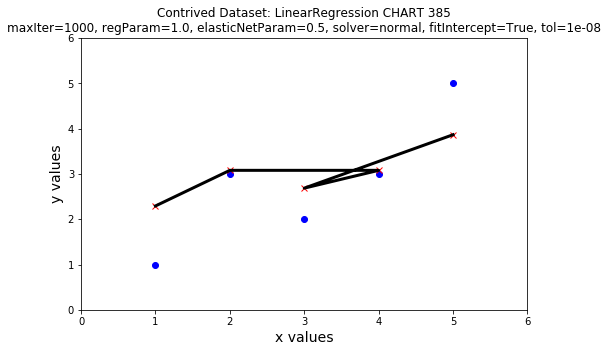

--------------------------------------------------

CHART 386

(2.2922605656184807, 1)
(3.07863771493128, 2)
(3.07863771493128, 4)
(2.6854491402748804, 3)
(3.8650148642440794, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.013888 , RMSE:  1.006920
## Multiple R-squared: 0.493056 ,             Total iterations: 3
Coefficients: [0.3931885746563997]
Intercept: 1.8990719909620808
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.2922605656184807, 3.07863771493128, 3.07863771493128, 2.6854491402748804, 3.8650148642440794]


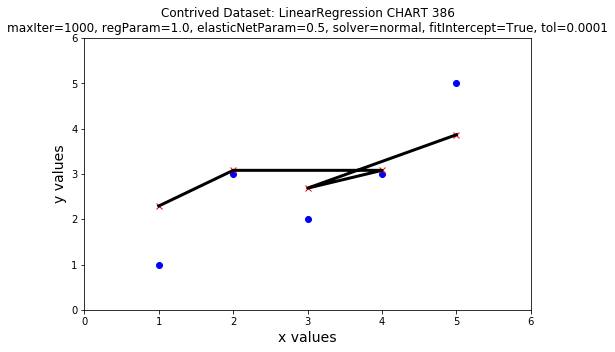

--------------------------------------------------

CHART 387

(2.2922605656184807, 1)
(3.07863771493128, 2)
(3.07863771493128, 4)
(2.6854491402748804, 3)
(3.8650148642440794, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.013888 , RMSE:  1.006920
## Multiple R-squared: 0.493056 ,             Total iterations: 3
Coefficients: [0.3931885746563997]
Intercept: 1.8990719909620808
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.2922605656184807, 3.07863771493128, 3.07863771493128, 2.6854491402748804, 3.8650148642440794]


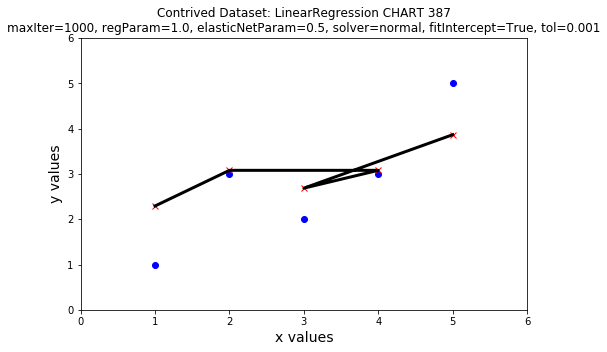

--------------------------------------------------

CHART 388

(2.2922605656184807, 1)
(3.07863771493128, 2)
(3.07863771493128, 4)
(2.6854491402748804, 3)
(3.8650148642440794, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.013888 , RMSE:  1.006920
## Multiple R-squared: 0.493056 ,             Total iterations: 3
Coefficients: [0.3931885746563997]
Intercept: 1.8990719909620808
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.2922605656184807, 3.07863771493128, 3.07863771493128, 2.6854491402748804, 3.8650148642440794]


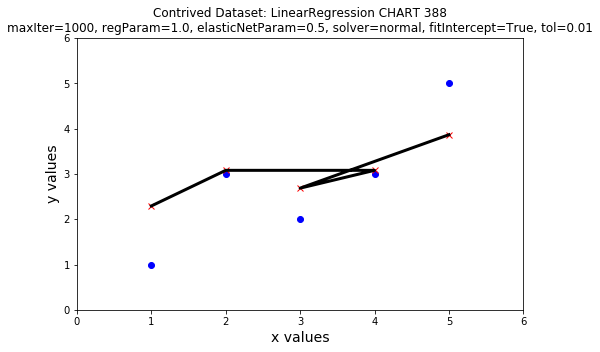

--------------------------------------------------

CHART 389

(2.2922605656184807, 1)
(3.07863771493128, 2)
(3.07863771493128, 4)
(2.6854491402748804, 3)
(3.8650148642440794, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.013888 , RMSE:  1.006920
## Multiple R-squared: 0.493056 ,             Total iterations: 3
Coefficients: [0.3931885746563997]
Intercept: 1.8990719909620808
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.2922605656184807, 3.07863771493128, 3.07863771493128, 2.6854491402748804, 3.8650148642440794]


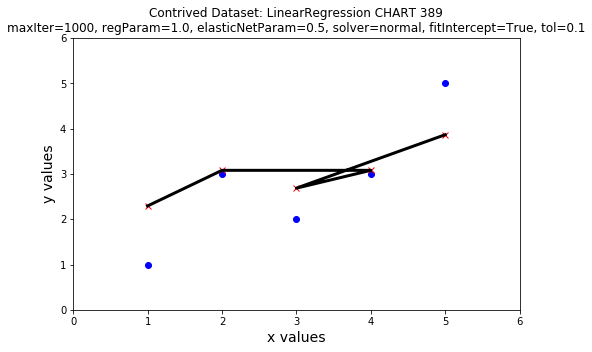

--------------------------------------------------

CHART 390

(2.2922605656184807, 1)
(3.07863771493128, 2)
(3.07863771493128, 4)
(2.6854491402748804, 3)
(3.8650148642440794, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.013888 , RMSE:  1.006920
## Multiple R-squared: 0.493056 ,             Total iterations: 3
Coefficients: [0.3931885746563997]
Intercept: 1.8990719909620808
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.2922605656184807, 3.07863771493128, 3.07863771493128, 2.6854491402748804, 3.8650148642440794]


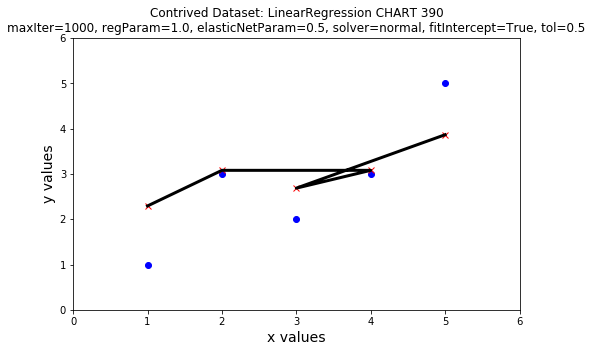

--------------------------------------------------

CHART 391

(0.9133675480637019, 1)
(2.7401026441911056, 2)
(2.7401026441911056, 4)
(1.8267350961274038, 3)
(4.566837740318509, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.741356 , RMSE:  0.861020
## Multiple R-squared: 0.932604 ,             Total iterations: 3
Coefficients: [0.9133675480637019]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9133675480637019, 2.7401026441911056, 2.7401026441911056, 1.8267350961274038, 4.566837740318509]


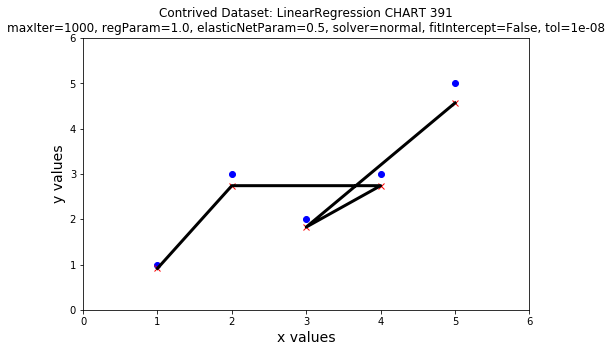

--------------------------------------------------

CHART 392

(0.9133675480637019, 1)
(2.7401026441911056, 2)
(2.7401026441911056, 4)
(1.8267350961274038, 3)
(4.566837740318509, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.741356 , RMSE:  0.861020
## Multiple R-squared: 0.932604 ,             Total iterations: 3
Coefficients: [0.9133675480637019]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9133675480637019, 2.7401026441911056, 2.7401026441911056, 1.8267350961274038, 4.566837740318509]


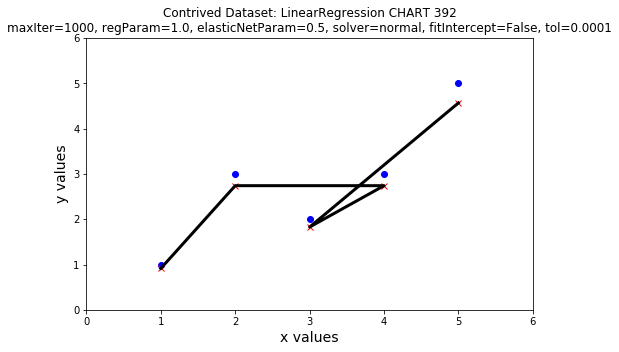

--------------------------------------------------

CHART 393

(0.9133675480637019, 1)
(2.7401026441911056, 2)
(2.7401026441911056, 4)
(1.8267350961274038, 3)
(4.566837740318509, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.741356 , RMSE:  0.861020
## Multiple R-squared: 0.932604 ,             Total iterations: 3
Coefficients: [0.9133675480637019]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9133675480637019, 2.7401026441911056, 2.7401026441911056, 1.8267350961274038, 4.566837740318509]


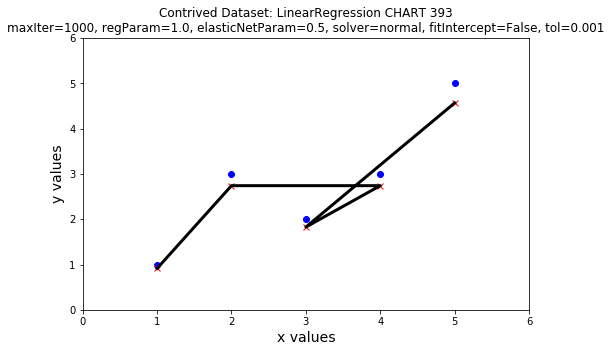

--------------------------------------------------

CHART 394

(0.9133675480637019, 1)
(2.7401026441911056, 2)
(2.7401026441911056, 4)
(1.8267350961274038, 3)
(4.566837740318509, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.741356 , RMSE:  0.861020
## Multiple R-squared: 0.932604 ,             Total iterations: 3
Coefficients: [0.9133675480637019]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9133675480637019, 2.7401026441911056, 2.7401026441911056, 1.8267350961274038, 4.566837740318509]


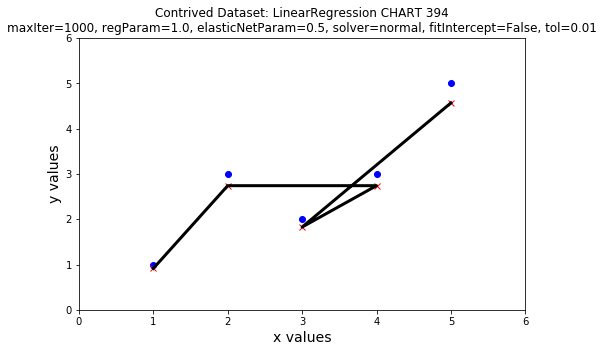

--------------------------------------------------

CHART 395

(0.9133675480637019, 1)
(2.7401026441911056, 2)
(2.7401026441911056, 4)
(1.8267350961274038, 3)
(4.566837740318509, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.741356 , RMSE:  0.861020
## Multiple R-squared: 0.932604 ,             Total iterations: 3
Coefficients: [0.9133675480637019]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9133675480637019, 2.7401026441911056, 2.7401026441911056, 1.8267350961274038, 4.566837740318509]


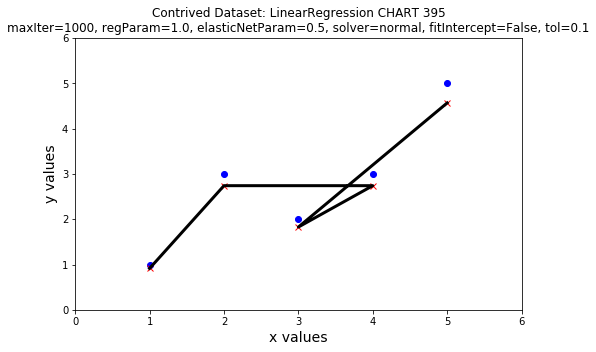

--------------------------------------------------

CHART 396

(0.9133675480637019, 1)
(2.7401026441911056, 2)
(2.7401026441911056, 4)
(1.8267350961274038, 3)
(4.566837740318509, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.741356 , RMSE:  0.861020
## Multiple R-squared: 0.932604 ,             Total iterations: 3
Coefficients: [0.9133675480637019]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9133675480637019, 2.7401026441911056, 2.7401026441911056, 1.8267350961274038, 4.566837740318509]


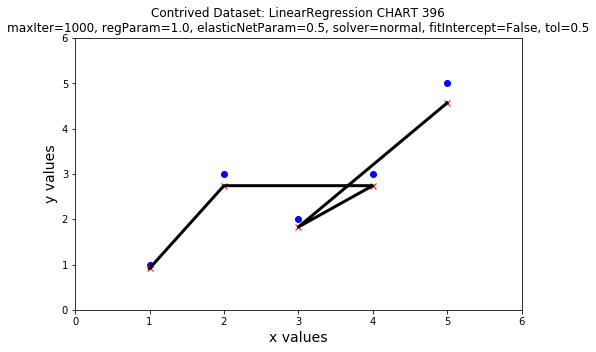

--------------------------------------------------

CHART 397

(2.3708174493991225, 1)
(3.0699091722889866, 2)
(3.0699091722889866, 4)
(2.7203633108440544, 3)
(3.7690008951788507, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.096494 , RMSE:  1.047136
## Multiple R-squared: 0.451753 ,             Total iterations: 3
Coefficients: [0.3495458614449321]
Intercept: 2.0212715879541903
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.3708174493991225, 3.0699091722889866, 3.0699091722889866, 2.7203633108440544, 3.7690008951788507]


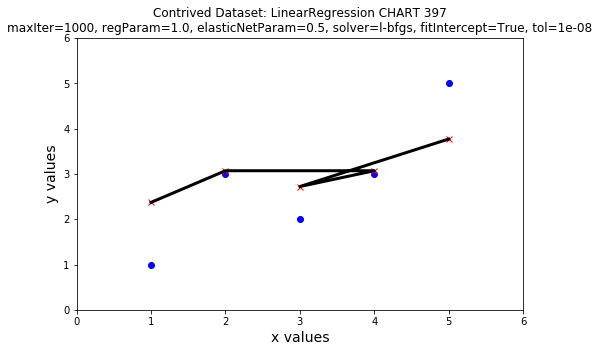

--------------------------------------------------

CHART 398

(2.3708174493991225, 1)
(3.0699091722889866, 2)
(3.0699091722889866, 4)
(2.7203633108440544, 3)
(3.7690008951788507, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.096494 , RMSE:  1.047136
## Multiple R-squared: 0.451753 ,             Total iterations: 3
Coefficients: [0.3495458614449321]
Intercept: 2.0212715879541903
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.3708174493991225, 3.0699091722889866, 3.0699091722889866, 2.7203633108440544, 3.7690008951788507]


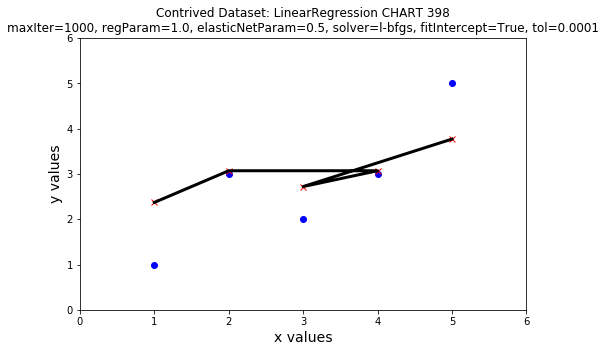

--------------------------------------------------

CHART 399

(2.3708174493991225, 1)
(3.0699091722889866, 2)
(3.0699091722889866, 4)
(2.7203633108440544, 3)
(3.7690008951788507, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.096494 , RMSE:  1.047136
## Multiple R-squared: 0.451753 ,             Total iterations: 3
Coefficients: [0.3495458614449321]
Intercept: 2.0212715879541903
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.3708174493991225, 3.0699091722889866, 3.0699091722889866, 2.7203633108440544, 3.7690008951788507]


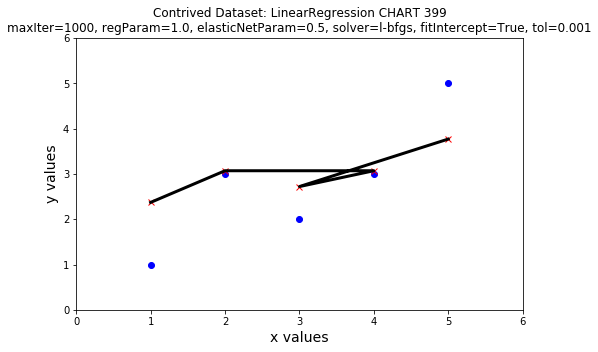

--------------------------------------------------

CHART 400

(2.3708174493991225, 1)
(3.0699091722889866, 2)
(3.0699091722889866, 4)
(2.7203633108440544, 3)
(3.7690008951788507, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.096494 , RMSE:  1.047136
## Multiple R-squared: 0.451753 ,             Total iterations: 3
Coefficients: [0.3495458614449321]
Intercept: 2.0212715879541903
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.3708174493991225, 3.0699091722889866, 3.0699091722889866, 2.7203633108440544, 3.7690008951788507]


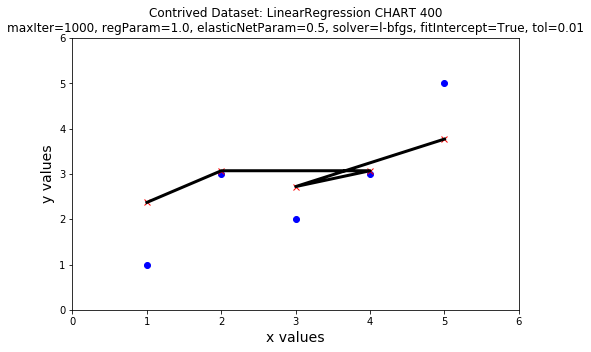

--------------------------------------------------

CHART 401

(2.3708174493991225, 1)
(3.0699091722889866, 2)
(3.0699091722889866, 4)
(2.7203633108440544, 3)
(3.7690008951788507, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.096494 , RMSE:  1.047136
## Multiple R-squared: 0.451753 ,             Total iterations: 3
Coefficients: [0.3495458614449321]
Intercept: 2.0212715879541903
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.3708174493991225, 3.0699091722889866, 3.0699091722889866, 2.7203633108440544, 3.7690008951788507]


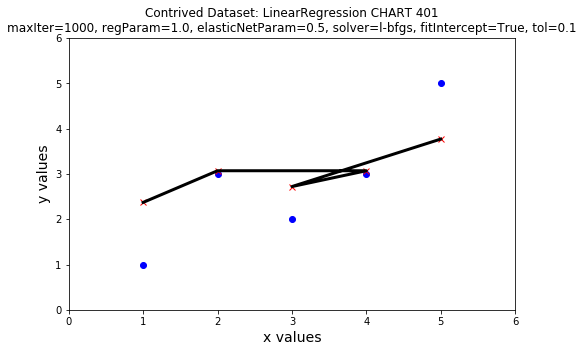

--------------------------------------------------

CHART 402

(2.3708174493991225, 1)
(3.0699091722889866, 2)
(3.0699091722889866, 4)
(2.7203633108440544, 3)
(3.7690008951788507, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.096494 , RMSE:  1.047136
## Multiple R-squared: 0.451753 ,             Total iterations: 3
Coefficients: [0.3495458614449321]
Intercept: 2.0212715879541903
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.3708174493991225, 3.0699091722889866, 3.0699091722889866, 2.7203633108440544, 3.7690008951788507]


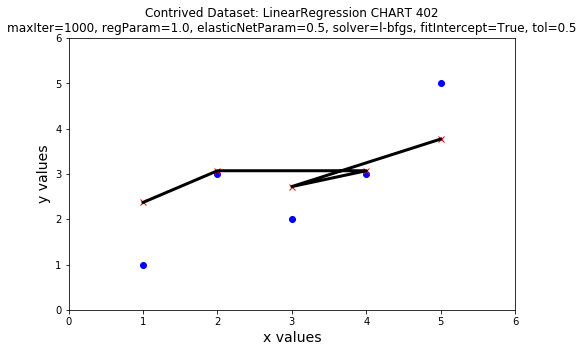

--------------------------------------------------

CHART 403

(0.8992471784719908, 1)
(2.697741535415972, 2)
(2.697741535415972, 4)
(1.7984943569439815, 3)
(4.4962358923599535, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.778053 , RMSE:  0.882073
## Multiple R-squared: 0.929268 ,             Total iterations: 3
Coefficients: [0.8992471784719908]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.8992471784719908, 2.697741535415972, 2.697741535415972, 1.7984943569439815, 4.4962358923599535]


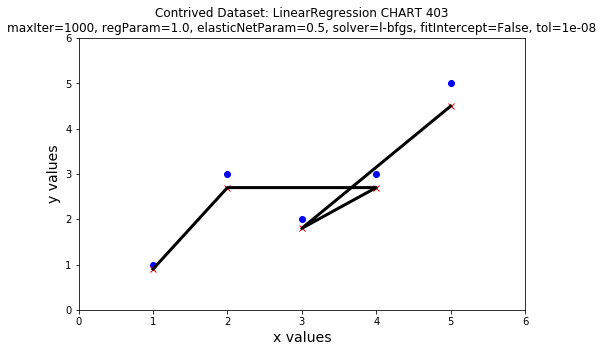

--------------------------------------------------

CHART 404

(0.8992471784719908, 1)
(2.697741535415972, 2)
(2.697741535415972, 4)
(1.7984943569439815, 3)
(4.4962358923599535, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.778053 , RMSE:  0.882073
## Multiple R-squared: 0.929268 ,             Total iterations: 3
Coefficients: [0.8992471784719908]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.8992471784719908, 2.697741535415972, 2.697741535415972, 1.7984943569439815, 4.4962358923599535]


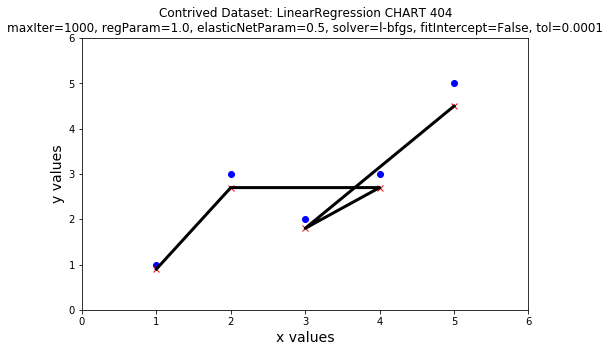

--------------------------------------------------

CHART 405

(0.8992471784719908, 1)
(2.697741535415972, 2)
(2.697741535415972, 4)
(1.7984943569439815, 3)
(4.4962358923599535, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.778053 , RMSE:  0.882073
## Multiple R-squared: 0.929268 ,             Total iterations: 3
Coefficients: [0.8992471784719908]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.8992471784719908, 2.697741535415972, 2.697741535415972, 1.7984943569439815, 4.4962358923599535]


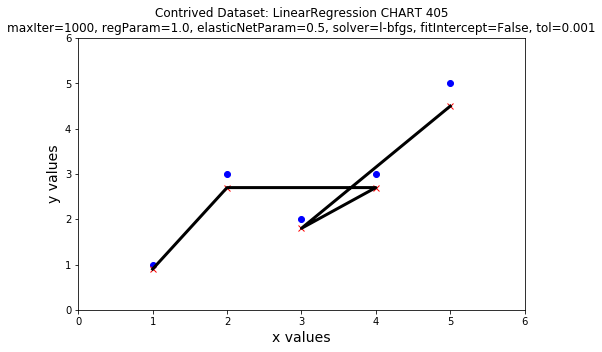

--------------------------------------------------

CHART 406

(0.8992471784719908, 1)
(2.697741535415972, 2)
(2.697741535415972, 4)
(1.7984943569439815, 3)
(4.4962358923599535, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.778053 , RMSE:  0.882073
## Multiple R-squared: 0.929268 ,             Total iterations: 3
Coefficients: [0.8992471784719908]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.8992471784719908, 2.697741535415972, 2.697741535415972, 1.7984943569439815, 4.4962358923599535]


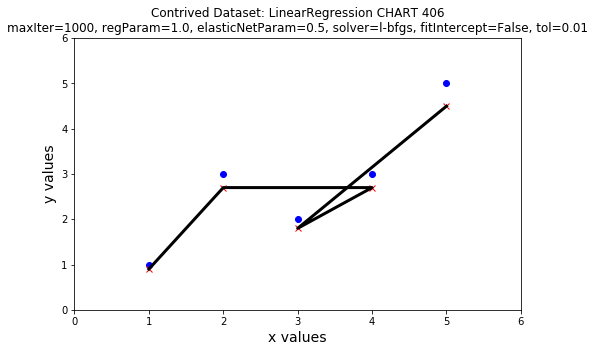

--------------------------------------------------

CHART 407

(0.8992471784719908, 1)
(2.697741535415972, 2)
(2.697741535415972, 4)
(1.7984943569439815, 3)
(4.4962358923599535, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.778053 , RMSE:  0.882073
## Multiple R-squared: 0.929268 ,             Total iterations: 3
Coefficients: [0.8992471784719908]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.8992471784719908, 2.697741535415972, 2.697741535415972, 1.7984943569439815, 4.4962358923599535]


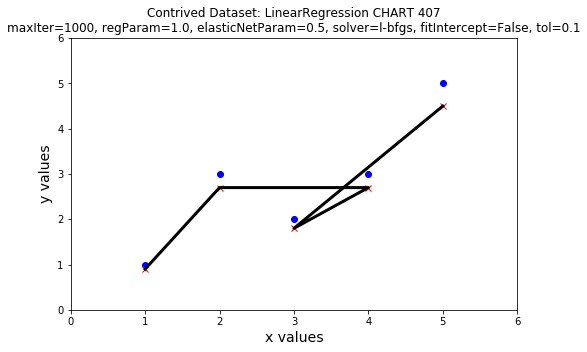

--------------------------------------------------

CHART 408

(0.8992471784719908, 1)
(2.697741535415972, 2)
(2.697741535415972, 4)
(1.7984943569439815, 3)
(4.4962358923599535, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.778053 , RMSE:  0.882073
## Multiple R-squared: 0.929268 ,             Total iterations: 3
Coefficients: [0.8992471784719908]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.8992471784719908, 2.697741535415972, 2.697741535415972, 1.7984943569439815, 4.4962358923599535]


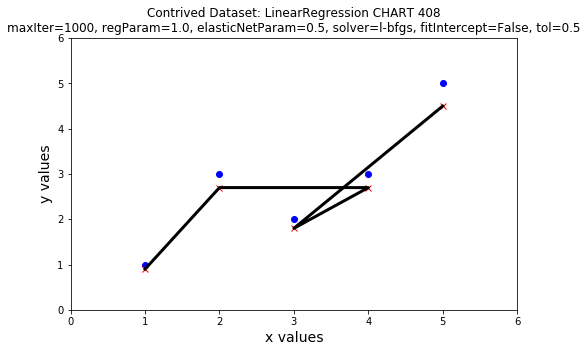

--------------------------------------------------

CHART 409

(2.7204374142363013, 1)
(3.0310625095293, 2)
(3.0310625095293, 4)
(2.8757499618828004, 3)
(3.3416876048222988, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.545455 , RMSE:  1.243163
## Multiple R-squared: 0.227273 ,             Total iterations: 3
Coefficients: [0.1553125476464994]
Intercept: 2.5651248665898017
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.7204374142363013, 3.0310625095293, 3.0310625095293, 2.8757499618828004, 3.3416876048222988]


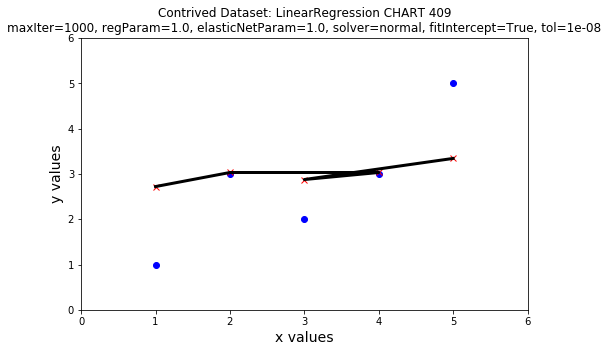

--------------------------------------------------

CHART 410

(2.7204374142363013, 1)
(3.0310625095293, 2)
(3.0310625095293, 4)
(2.8757499618828004, 3)
(3.3416876048222988, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.545455 , RMSE:  1.243163
## Multiple R-squared: 0.227273 ,             Total iterations: 3
Coefficients: [0.1553125476464994]
Intercept: 2.5651248665898017
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.7204374142363013, 3.0310625095293, 3.0310625095293, 2.8757499618828004, 3.3416876048222988]


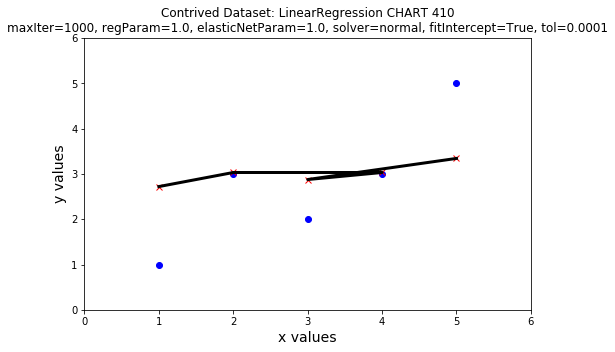

--------------------------------------------------

CHART 411

(2.7204374142363013, 1)
(3.0310625095293, 2)
(3.0310625095293, 4)
(2.8757499618828004, 3)
(3.3416876048222988, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.545455 , RMSE:  1.243163
## Multiple R-squared: 0.227273 ,             Total iterations: 3
Coefficients: [0.1553125476464994]
Intercept: 2.5651248665898017
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.7204374142363013, 3.0310625095293, 3.0310625095293, 2.8757499618828004, 3.3416876048222988]


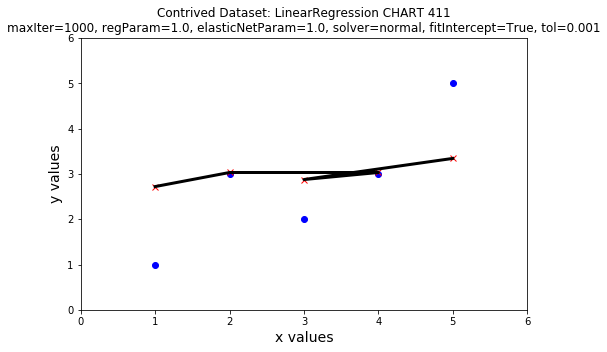

--------------------------------------------------

CHART 412

(2.7204374142363013, 1)
(3.0310625095293, 2)
(3.0310625095293, 4)
(2.8757499618828004, 3)
(3.3416876048222988, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.545455 , RMSE:  1.243163
## Multiple R-squared: 0.227273 ,             Total iterations: 3
Coefficients: [0.1553125476464994]
Intercept: 2.5651248665898017
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.7204374142363013, 3.0310625095293, 3.0310625095293, 2.8757499618828004, 3.3416876048222988]


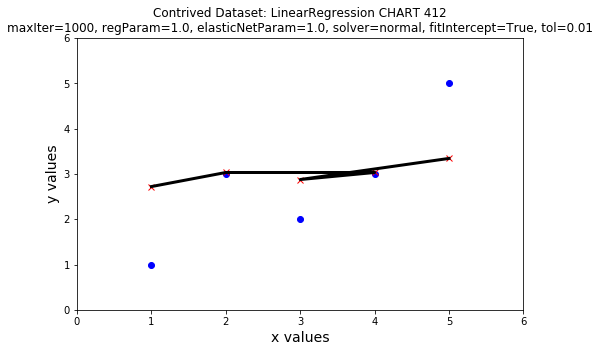

--------------------------------------------------

CHART 413

(2.7204374142363013, 1)
(3.0310625095293, 2)
(3.0310625095293, 4)
(2.8757499618828004, 3)
(3.3416876048222988, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.545455 , RMSE:  1.243163
## Multiple R-squared: 0.227273 ,             Total iterations: 3
Coefficients: [0.1553125476464994]
Intercept: 2.5651248665898017
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.7204374142363013, 3.0310625095293, 3.0310625095293, 2.8757499618828004, 3.3416876048222988]


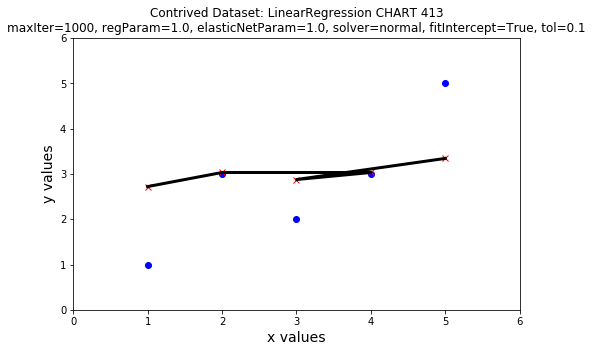

--------------------------------------------------

CHART 414

(3.0, 1)
(3.0, 2)
(3.0, 4)
(3.0, 3)
(3.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  2.000000 , RMSE:  1.414214
## Multiple R-squared: -0.000000 ,             Total iterations: 1
Coefficients: [0.0]
Intercept: 3.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [3.0, 3.0, 3.0, 3.0, 3.0]


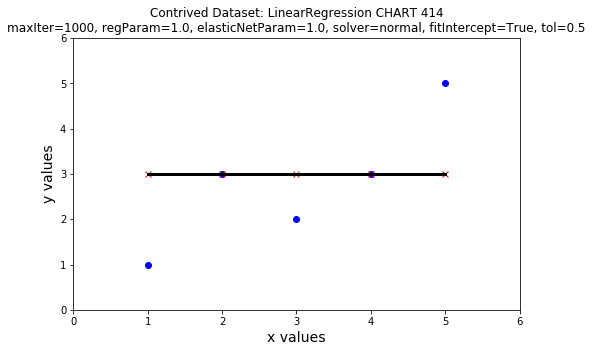

--------------------------------------------------

CHART 415

(0.9034739670685246, 1)
(2.7104219012055735, 2)
(2.7104219012055735, 4)
(1.8069479341370491, 3)
(4.517369835342623, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.766667 , RMSE:  0.875595
## Multiple R-squared: 0.930303 ,             Total iterations: 3
Coefficients: [0.9034739670685246]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9034739670685246, 2.7104219012055735, 2.7104219012055735, 1.8069479341370491, 4.517369835342623]


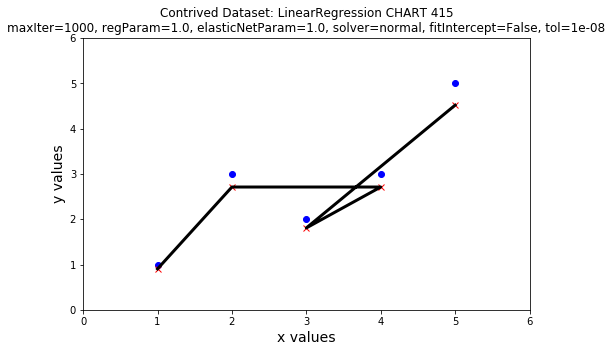

--------------------------------------------------

CHART 416

(0.9034739670685246, 1)
(2.7104219012055735, 2)
(2.7104219012055735, 4)
(1.8069479341370491, 3)
(4.517369835342623, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.766667 , RMSE:  0.875595
## Multiple R-squared: 0.930303 ,             Total iterations: 3
Coefficients: [0.9034739670685246]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9034739670685246, 2.7104219012055735, 2.7104219012055735, 1.8069479341370491, 4.517369835342623]


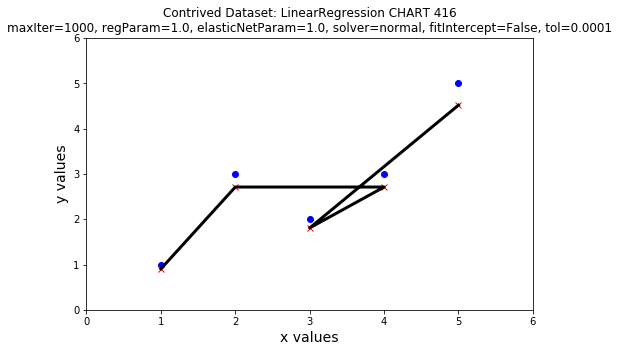

--------------------------------------------------

CHART 417

(0.9034739670685246, 1)
(2.7104219012055735, 2)
(2.7104219012055735, 4)
(1.8069479341370491, 3)
(4.517369835342623, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.766667 , RMSE:  0.875595
## Multiple R-squared: 0.930303 ,             Total iterations: 3
Coefficients: [0.9034739670685246]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9034739670685246, 2.7104219012055735, 2.7104219012055735, 1.8069479341370491, 4.517369835342623]


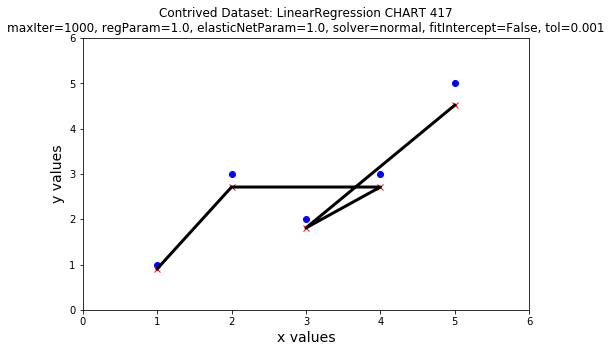

--------------------------------------------------

CHART 418

(0.9034739670685246, 1)
(2.7104219012055735, 2)
(2.7104219012055735, 4)
(1.8069479341370491, 3)
(4.517369835342623, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.766667 , RMSE:  0.875595
## Multiple R-squared: 0.930303 ,             Total iterations: 3
Coefficients: [0.9034739670685246]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9034739670685246, 2.7104219012055735, 2.7104219012055735, 1.8069479341370491, 4.517369835342623]


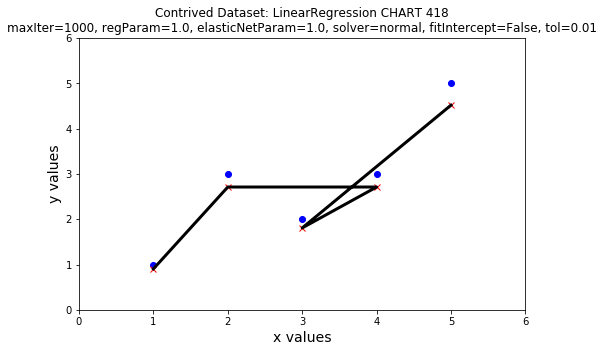

--------------------------------------------------

CHART 419

(0.9034739670685246, 1)
(2.7104219012055735, 2)
(2.7104219012055735, 4)
(1.8069479341370491, 3)
(4.517369835342623, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.766667 , RMSE:  0.875595
## Multiple R-squared: 0.930303 ,             Total iterations: 3
Coefficients: [0.9034739670685246]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9034739670685246, 2.7104219012055735, 2.7104219012055735, 1.8069479341370491, 4.517369835342623]


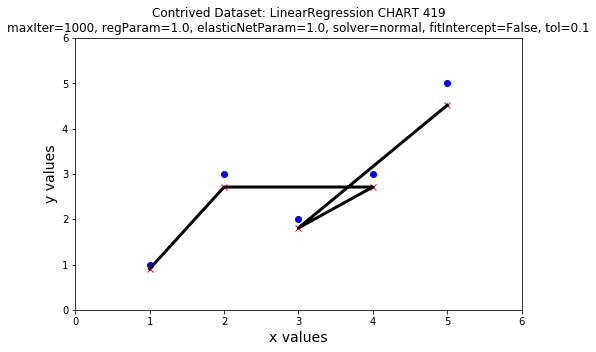

--------------------------------------------------

CHART 420

(0.9034739670685246, 1)
(2.7104219012055735, 2)
(2.7104219012055735, 4)
(1.8069479341370491, 3)
(4.517369835342623, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.766667 , RMSE:  0.875595
## Multiple R-squared: 0.930303 ,             Total iterations: 3
Coefficients: [0.9034739670685246]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.9034739670685246, 2.7104219012055735, 2.7104219012055735, 1.8069479341370491, 4.517369835342623]


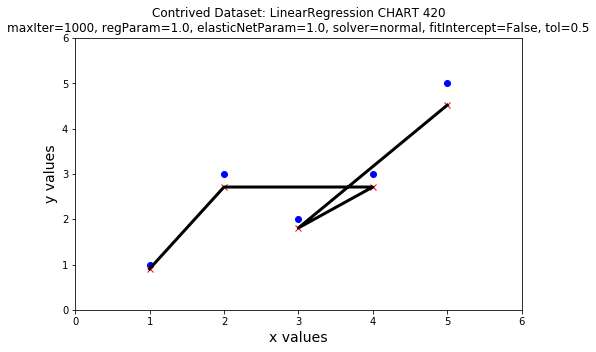

--------------------------------------------------

CHART 421

(2.880586054178664, 1)
(3.0132682162023707, 2)
(3.0132682162023707, 4)
(2.9469271351905175, 3)
(3.1459503782260776, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.795455 , RMSE:  1.339946
## Multiple R-squared: 0.102273 ,             Total iterations: 3
Coefficients: [0.06634108101185338]
Intercept: 2.8142449731668107
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.880586054178664, 3.0132682162023707, 3.0132682162023707, 2.9469271351905175, 3.1459503782260776]


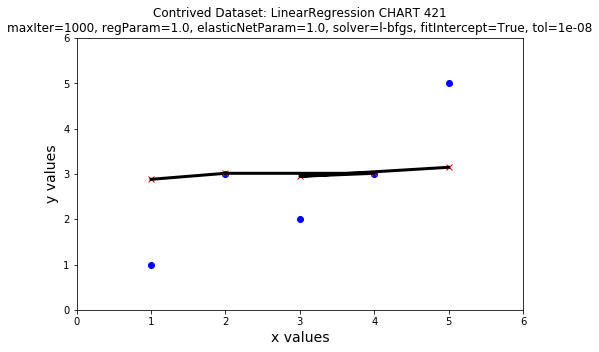

--------------------------------------------------

CHART 422

(2.880586054178664, 1)
(3.0132682162023707, 2)
(3.0132682162023707, 4)
(2.9469271351905175, 3)
(3.1459503782260776, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.795455 , RMSE:  1.339946
## Multiple R-squared: 0.102273 ,             Total iterations: 3
Coefficients: [0.06634108101185338]
Intercept: 2.8142449731668107
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.880586054178664, 3.0132682162023707, 3.0132682162023707, 2.9469271351905175, 3.1459503782260776]


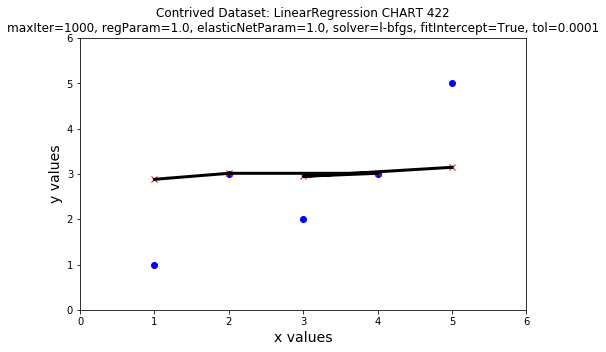

--------------------------------------------------

CHART 423

(2.880586054178664, 1)
(3.0132682162023707, 2)
(3.0132682162023707, 4)
(2.9469271351905175, 3)
(3.1459503782260776, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.795455 , RMSE:  1.339946
## Multiple R-squared: 0.102273 ,             Total iterations: 3
Coefficients: [0.06634108101185338]
Intercept: 2.8142449731668107
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.880586054178664, 3.0132682162023707, 3.0132682162023707, 2.9469271351905175, 3.1459503782260776]


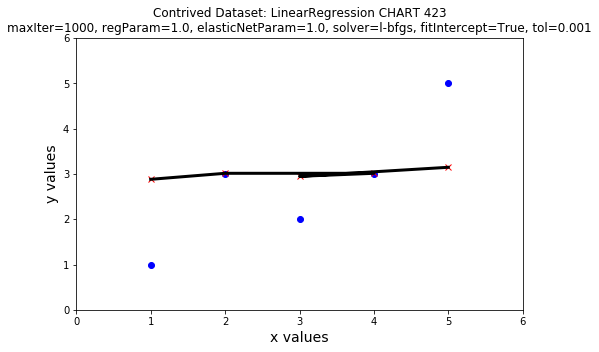

--------------------------------------------------

CHART 424

(2.880586054178664, 1)
(3.0132682162023707, 2)
(3.0132682162023707, 4)
(2.9469271351905175, 3)
(3.1459503782260776, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.795455 , RMSE:  1.339946
## Multiple R-squared: 0.102273 ,             Total iterations: 3
Coefficients: [0.06634108101185338]
Intercept: 2.8142449731668107
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.880586054178664, 3.0132682162023707, 3.0132682162023707, 2.9469271351905175, 3.1459503782260776]


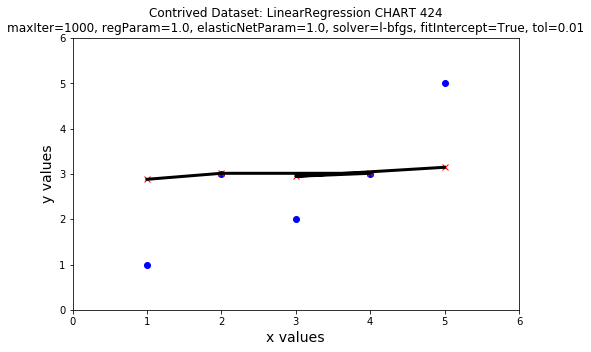

--------------------------------------------------

CHART 425

(2.880586054178664, 1)
(3.0132682162023707, 2)
(3.0132682162023707, 4)
(2.9469271351905175, 3)
(3.1459503782260776, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  1.795455 , RMSE:  1.339946
## Multiple R-squared: 0.102273 ,             Total iterations: 3
Coefficients: [0.06634108101185338]
Intercept: 2.8142449731668107
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [2.880586054178664, 3.0132682162023707, 3.0132682162023707, 2.9469271351905175, 3.1459503782260776]


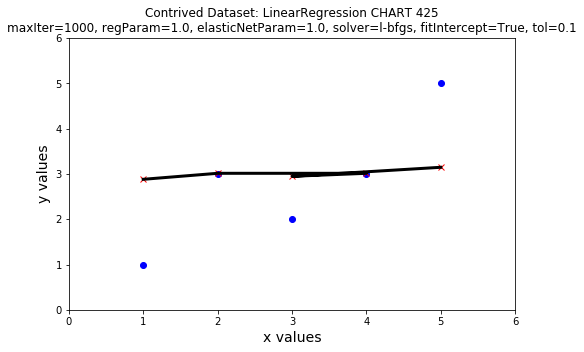

--------------------------------------------------

CHART 426

(3.0, 1)
(3.0, 2)
(3.0, 4)
(3.0, 3)
(3.0, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  2.000000 , RMSE:  1.414214
## Multiple R-squared: -0.000000 ,             Total iterations: 1
Coefficients: [0.0]
Intercept: 3.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [3.0, 3.0, 3.0, 3.0, 3.0]


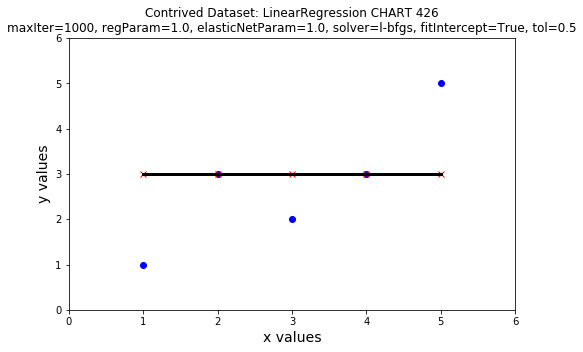

--------------------------------------------------

CHART 427

(0.887162531518839, 1)
(2.661487594556517, 2)
(2.661487594556517, 4)
(1.774325063037678, 3)
(4.4358126575941945, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.812500 , RMSE:  0.901388
## Multiple R-squared: 0.926136 ,             Total iterations: 3
Coefficients: [0.887162531518839]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.887162531518839, 2.661487594556517, 2.661487594556517, 1.774325063037678, 4.4358126575941945]


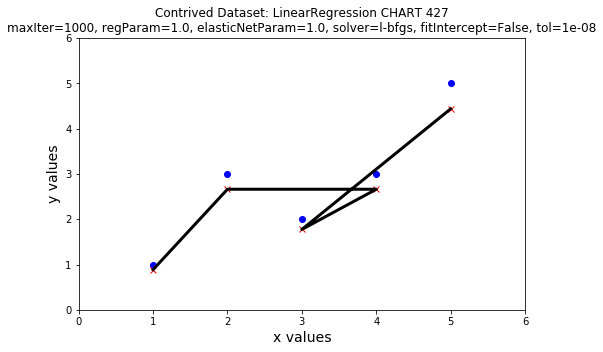

--------------------------------------------------

CHART 428

(0.887162531518839, 1)
(2.661487594556517, 2)
(2.661487594556517, 4)
(1.774325063037678, 3)
(4.4358126575941945, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.812500 , RMSE:  0.901388
## Multiple R-squared: 0.926136 ,             Total iterations: 3
Coefficients: [0.887162531518839]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.887162531518839, 2.661487594556517, 2.661487594556517, 1.774325063037678, 4.4358126575941945]


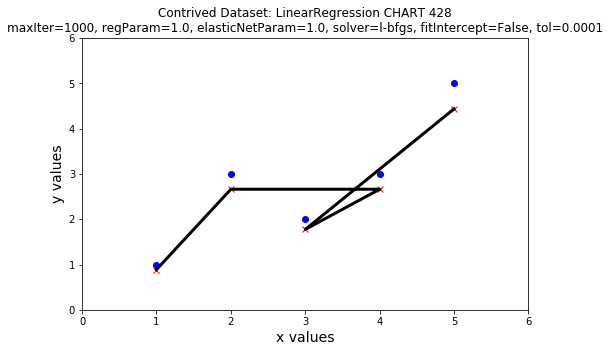

--------------------------------------------------

CHART 429

(0.887162531518839, 1)
(2.661487594556517, 2)
(2.661487594556517, 4)
(1.774325063037678, 3)
(4.4358126575941945, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.812500 , RMSE:  0.901388
## Multiple R-squared: 0.926136 ,             Total iterations: 3
Coefficients: [0.887162531518839]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.887162531518839, 2.661487594556517, 2.661487594556517, 1.774325063037678, 4.4358126575941945]


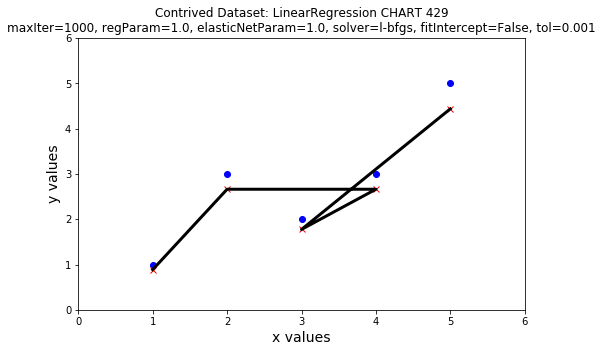

--------------------------------------------------

CHART 430

(0.887162531518839, 1)
(2.661487594556517, 2)
(2.661487594556517, 4)
(1.774325063037678, 3)
(4.4358126575941945, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.812500 , RMSE:  0.901388
## Multiple R-squared: 0.926136 ,             Total iterations: 3
Coefficients: [0.887162531518839]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.887162531518839, 2.661487594556517, 2.661487594556517, 1.774325063037678, 4.4358126575941945]


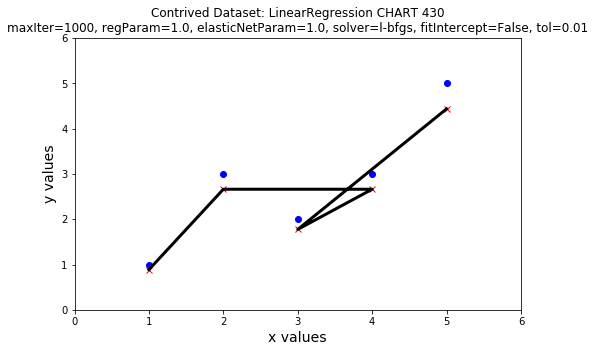

--------------------------------------------------

CHART 431

(0.887162531518839, 1)
(2.661487594556517, 2)
(2.661487594556517, 4)
(1.774325063037678, 3)
(4.4358126575941945, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.812500 , RMSE:  0.901388
## Multiple R-squared: 0.926136 ,             Total iterations: 3
Coefficients: [0.887162531518839]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.887162531518839, 2.661487594556517, 2.661487594556517, 1.774325063037678, 4.4358126575941945]


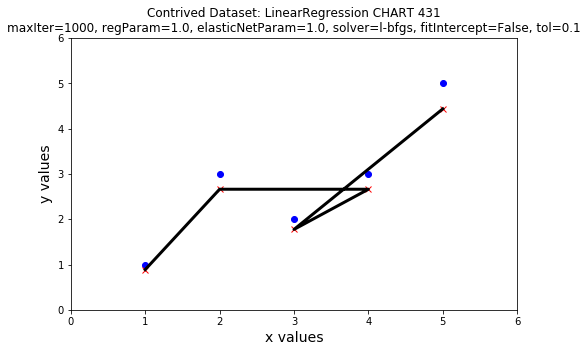

--------------------------------------------------

CHART 432

(0.887162531518839, 1)
(2.661487594556517, 2)
(2.661487594556517, 4)
(1.774325063037678, 3)
(4.4358126575941945, 5)
Note: the last rows are the information for Intercept
## -------------------------------------------------
##   Estimate   |   Std.Error | t Values  |  P-value
No p-Values available for this model
## ---
## Mean squared error:  0.812500 , RMSE:  0.901388
## Multiple R-squared: 0.926136 ,             Total iterations: 3
Coefficients: [0.887162531518839]
Intercept: 0.0
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1, 2, 4, 3, 5]
y_preds =  [0.887162531518839, 2.661487594556517, 2.661487594556517, 1.774325063037678, 4.4358126575941945]


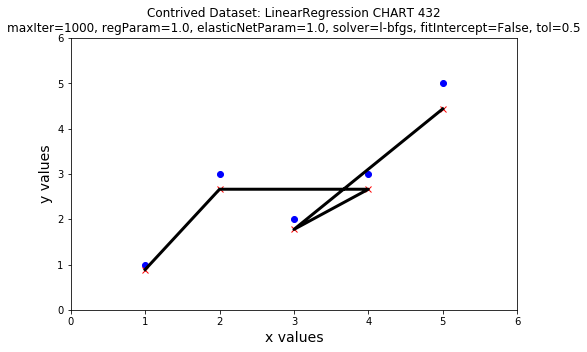

In [6]:

# Convert our data lists into a Spark DataFrame
# with column names 'label' and 'features'.
# (Note: label values are the values we are trying to predict based on the features)
df = spark.createDataFrame(
         dataset2,
        ["label", "features"])   # Label column must be numeric, features must be Spark Vectors


# Let's split our data into training data and testing data
#trainTest = df.randomSplit([0.5, 0.5])
#trainingDF = trainTest[0]
#testDF = trainTest[1]

counter = 1
for i in (10, 1000):
    for r in (0.0, 0.3, 1.0):
        for e in (0.0, 0.5, 1.0):
            for s in (["normal","l-bfgs"]):
                for f in (True, False):
                    for t in (0.00000001, 0.0001, 0.001, 0.01, 0.1, 0.5):

                        # Now create our linear regression model
                        #lir = LinearRegression(featuresCol='features', labelCol='label', maxIter=10, regParam=0.3, elasticNetParam=0.8)
                        lir = LinearRegression(maxIter=i, regParam=r, elasticNetParam=e, solver=s, fitIntercept=f, tol=t)
                                        
                        # Train the model using our training data
                        model = lir.fit(df)   # (trainingDF)

                        # Now see if we can predict values in our test data.
                        # Generate predictions using our linear regression model for all features in our test dataframe:
                        #fullPredictions = model.transform(testDF).cache()
                        fullPredictions = model.transform(df).cache()

                        # Extract the predictions and the "known" correct labels.
                        predictions = fullPredictions.select("prediction").rdd.map(lambda x: x[0])
                        labels = fullPredictions.select("label").rdd.map(lambda x: x[0])

                        # Zip them together
                        predictionAndLabel = predictions.zip(labels).collect()

                        # Print out the predicted and actual values for each point
                        print("--------------------------------------------------\n")
                        print("CHART " + str(counter) + "\n")
                        for prediction in predictionAndLabel:
                            print(prediction)

                        modelsummary(model)
    
                        print("Coefficients: " + str(model.coefficients))
                        print("Intercept: " + str(model.intercept))
  
                        paramStr = "maxIter="+str(i)+", regParam="+str(r)+", elasticNetParam="+str(e)+", solver="+str(s)+", fitIntercept="+str(f)+", tol="+str(t)
    
                        plotPredsAndLabels(predictions, labels, "Contrived Dataset: LinearRegression CHART " + str(counter) + "\n" + paramStr)
    
                        counter += 1
                      
    

In [7]:
# Make a one-off prediction
test0 = spark.createDataFrame([(Vectors.dense(4),)], ["features"])
model.transform(test0).head().prediction

3.548650126075356

### 2. Modelling using Linear Regression with SGD (Stochastic Gradient Descent)

In [8]:

def plotData(valuesAndPreds, the_title):
    x_labels = []
    y_preds = []
    for x in valuesAndPreds.collect():
        x_labels += [x[0]]
        y_preds += [x[1]]


    plt.figure(figsize=(8,5))    
    plt.axis([min(xs)-1, max(xs)+1, min(ys)-1, max(ys)+1])  
    plt.title(the_title)

    # Plot outputs
    plt.scatter(xs, ys, color='blue')
    plt.plot(x_labels, y_preds, 'rx')
    plt.plot(x_labels, y_preds, color='black', linewidth=3)


    print('xs = ', xs)
    print('ys = ', ys)
    print('x_labels = ', x_labels)
    print('y_preds = ' , y_preds)

    plt.xlabel('x values', fontsize=14)
    plt.ylabel('y values', fontsize=14)

    plt.show()

--------------------------------------------------

CHART 1

MSE = 878.7760000000002
RMSE = 29.6441562538049
R-squared = -3.7437403373610536
MAE = 26.919999999999998
Explained variance = 726.6864000000002
values and prections:  [(1.0, 10.3), (2.0, 25.5), (3.0, 36.300000000000004), (4.0, 26.000000000000004), (5.0, 51.5)]
model intercept =  0.0
model weights:  [5.4,4.9]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [10.3, 25.5, 36.300000000000004, 26.000000000000004, 51.5]


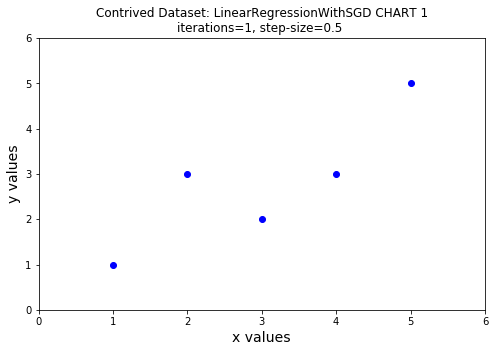

--------------------------------------------------

CHART 2

MSE = 11.682240000000004
RMSE = 3.4179291976282955
R-squared = -0.5765540114526562
MAE = 2.9840000000000004
Explained variance = 10.904256
values and prections:  [(1.0, 2.06), (2.0, 5.1000000000000005), (3.0, 7.260000000000001), (4.0, 5.2), (5.0, 10.3)]
model intercept =  0.0
model weights:  [1.08,0.9800000000000001]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [2.06, 5.1000000000000005, 7.260000000000001, 5.2, 10.3]


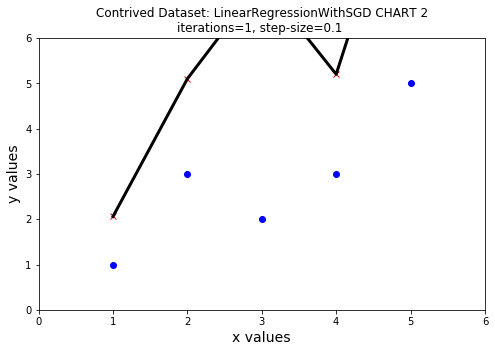

--------------------------------------------------

CHART 3

MSE = 7.178582400000001
RMSE = 2.67928766652631
R-squared = -95.87716464704917
MAE = 2.4015999999999997
Explained variance = 7.76768256
values and prections:  [(1.0, 0.20600000000000002), (2.0, 0.51), (3.0, 0.7260000000000001), (4.0, 0.52), (5.0, 1.03)]
model intercept =  0.0
model weights:  [0.10800000000000001,0.098]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.20600000000000002, 0.51, 0.7260000000000001, 0.52, 1.03]


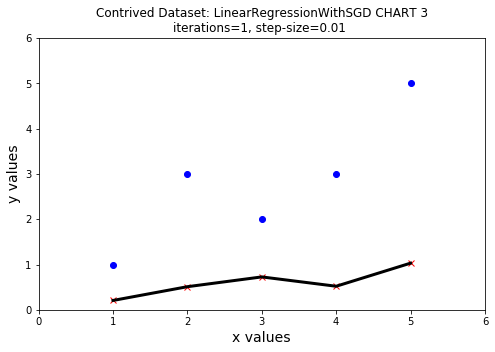

--------------------------------------------------

CHART 4

MSE = 10.578961824
RMSE = 3.2525316023061177
R-squared = -14275.632478558658
MAE = 2.94016
Explained variance = 10.6445408256
values and prections:  [(1.0, 0.0206), (2.0, 0.051000000000000004), (3.0, 0.0726), (4.0, 0.052000000000000005), (5.0, 0.10300000000000001)]
model intercept =  0.0
model weights:  [0.0108,0.009800000000000001]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.0206, 0.051000000000000004, 0.0726, 0.052000000000000005, 0.10300000000000001]


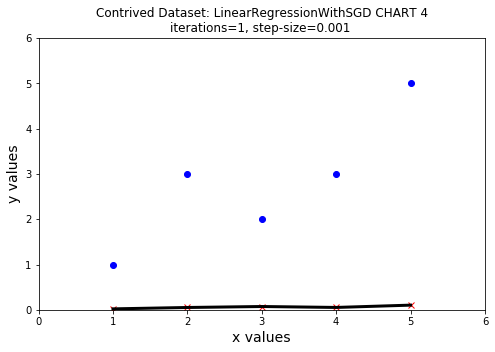

--------------------------------------------------

CHART 5

MSE = 10.95750721824
RMSE = 3.3102125639058286
R-squared = -1478748.1063732386
MAE = 2.994016
Explained variance = 10.964131808255999
values and prections:  [(1.0, 0.00206), (2.0, 0.005100000000000001), (3.0, 0.007260000000000002), (4.0, 0.0052000000000000015), (5.0, 0.010300000000000002)]
model intercept =  0.0
model weights:  [0.0010800000000000002,0.0009800000000000002]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.00206, 0.005100000000000001, 0.007260000000000002, 0.0052000000000000015, 0.010300000000000002]


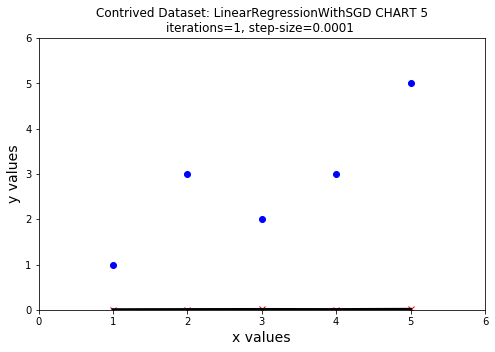

--------------------------------------------------

CHART 6

MSE = 10.999995746400433
RMSE = 3.3166241491010755
R-squared = -148448306317535.3
MAE = 2.9999994016
Explained variance = 10.999996409600358
values and prections:  [(1.0, 2.0600000000000002e-07), (2.0, 5.1e-07), (3.0, 7.260000000000001e-07), (4.0, 5.200000000000001e-07), (5.0, 1.03e-06)]
model intercept =  0.0
model weights:  [1.0800000000000001e-07,9.8e-08]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [2.0600000000000002e-07, 5.1e-07, 7.260000000000001e-07, 5.200000000000001e-07, 1.03e-06]


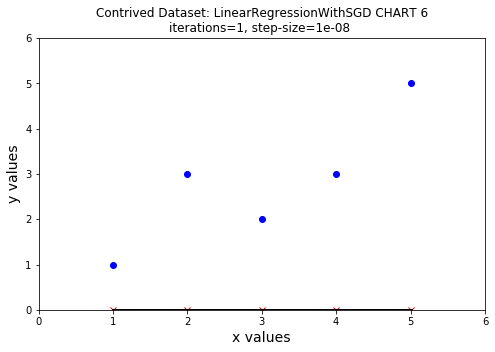

--------------------------------------------------

CHART 7

MSE = 2503226856764.8066
RMSE = 1582158.922727046
R-squared = -4.832890180388077
MAE = 1440162.510241693
Explained variance = 2074068055907.6543
values and prections:  [(1.0, -496008.8458377805), (2.0, -1231352.828033805), (3.0, -1744700.2469928782), (4.0, -1248691.4011550979), (5.0, -2480044.229188903)]
model intercept =  0.0
model weights:  [-256673.70947953672,-239335.13635824382]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [-496008.8458377805, -1231352.828033805, -1744700.2469928782, -1248691.4011550979, -2480044.229188903]


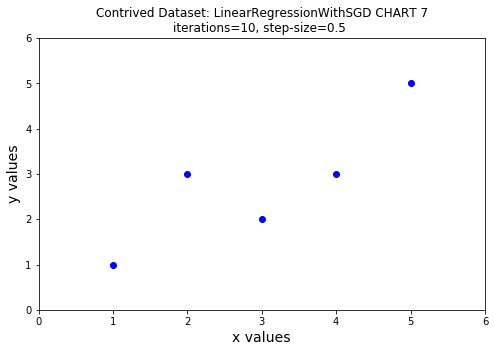

--------------------------------------------------

CHART 8

MSE = 0.5031320816004952
RMSE = 0.709318039810419
R-squared = 0.7200401330197641
MAE = 0.5011461806572479
Explained variance = 2.0031280568469514
values and prections:  [(1.0, 1.0094202388817526), (2.0, 2.439789231113971), (3.0, 3.6167322021765447), (4.0, 2.607311963294792), (5.0, 5.047101194408763)]
model intercept =  0.0
model weights:  [0.5884714855312869,0.4209487533504657]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [1.0094202388817526, 2.439789231113971, 3.6167322021765447, 2.607311963294792, 5.047101194408763]


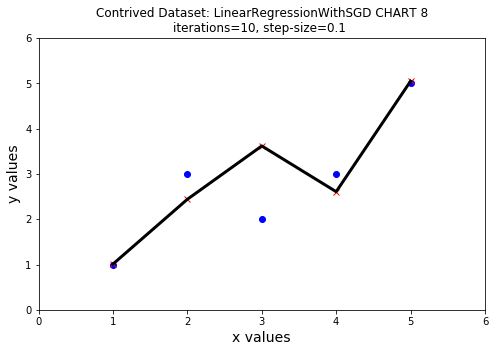

--------------------------------------------------

CHART 9

MSE = 1.72279654413578
RMSE = 1.3125534442969475
R-squared = -1.1855055222456188
MAE = 1.0483087043771349
Explained variance = 3.0989511396728675
values and prections:  [(1.0, 0.6717056817522729), (2.0, 1.6605401116743135), (3.0, 2.369693978839324), (4.0, 1.6979882970870512), (5.0, 3.3585284087613645)]
model intercept =  0.0
model weights:  [0.35457693358250536,0.31712874816976755]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.6717056817522729, 1.6605401116743135, 2.369693978839324, 1.6979882970870512, 3.3585284087613645]


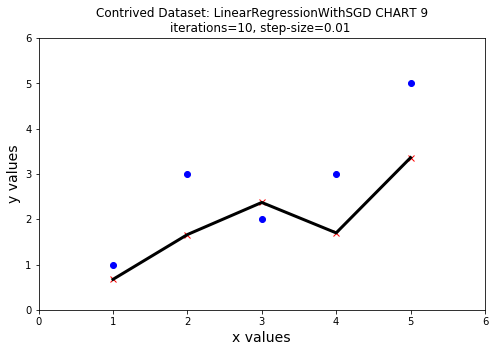

--------------------------------------------------

CHART 10

MSE = 9.057668362175075
RMSE = 3.009596046344937
R-squared = -529.4430328096535
MAE = 2.712742912895153
Explained variance = 9.358974111462876
values and prections:  [(1.0, 0.09888653959076923), (2.0, 0.24478573751883947), (3.0, 0.348533500025776), (4.0, 0.24964696043500673), (5.0, 0.4944326979538462)]
model intercept =  0.0
model weights:  [0.05187388125346825,0.04701265833730099]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.09888653959076923, 0.24478573751883947, 0.348533500025776, 0.24964696043500673, 0.4944326979538462]


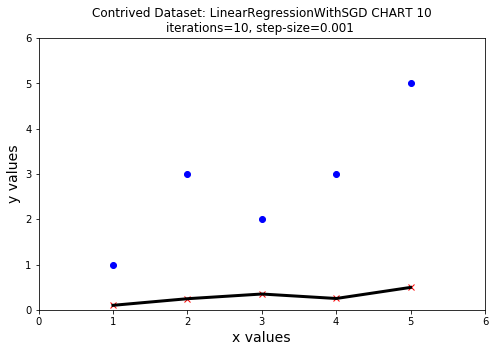

--------------------------------------------------

CHART 11

MSE = 10.903199441123885
RMSE = 3.3019993096794984
R-squared = -282798.76803490135
MAE = 2.9863503860076195
Explained variance = 10.918288628007854
values and prections:  [(1.0, 0.0046988945952927885), (2.0, 0.01163313815807237), (3.0, 0.01656022941368436), (4.0, 0.011861334818391571), (5.0, 0.023494472976463943)]
model intercept =  0.0
model weights:  [0.002463545627805995,0.0022353489674867937]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.0046988945952927885, 0.01163313815807237, 0.01656022941368436, 0.011861334818391571, 0.023494472976463943]


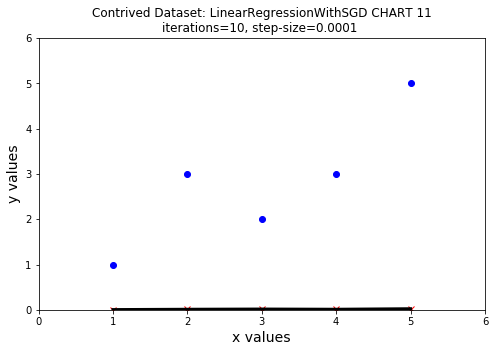

--------------------------------------------------

CHART 12

MSE = 10.999992738652466
RMSE = 3.31662369566589
R-squared = -50939400130919.75
MAE = 2.999998978467388
Explained variance = 10.999993870805373
values and prections:  [(1.0, 3.516639673051399e-07), (2.0, 8.706243848773477e-07), (3.0, 1.239359418953492e-06), (4.0, 8.87695451648352e-07), (5.0, 1.7583198365256997e-06)]
model intercept =  0.0
model weights:  [1.8436751703807211e-07,1.6729645026706783e-07]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [3.516639673051399e-07, 8.706243848773477e-07, 1.239359418953492e-06, 8.87695451648352e-07, 1.7583198365256997e-06]


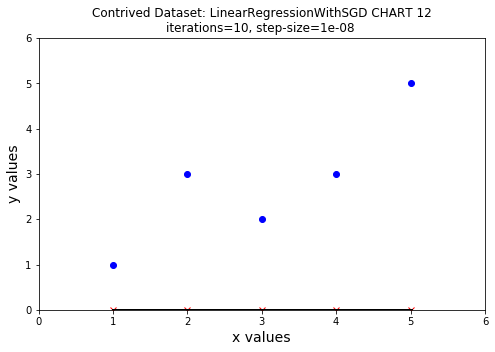

--------------------------------------------------

CHART 13

MSE = 0.3968909721108953
RMSE = 0.6299928349679028
R-squared = 0.7931195532017401
MAE = 0.423063498439178
Explained variance = 2.0032507979645864
values and prections:  [(1.0, 0.9818001663915914), (2.0, 1.9756816758461526), (3.0, 3.9151193225033962), (4.0, 2.933319156111805), (5.0, 4.9090008319579574)]
model intercept =  0.0
model weights:  [0.9697188233286218,0.012081343062969646]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.9818001663915914, 1.9756816758461526, 3.9151193225033962, 2.933319156111805, 4.9090008319579574]


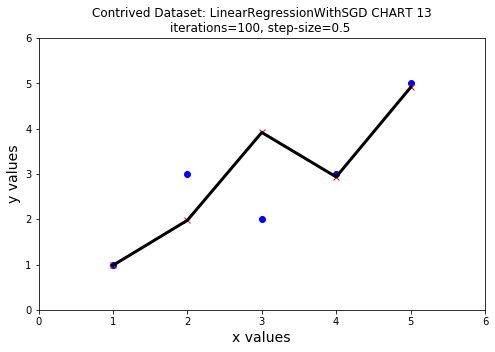

--------------------------------------------------

CHART 14

MSE = 0.44648369909484603
RMSE = 0.6681943572755206
R-squared = 0.7546701282568454
MAE = 0.4557791436054258
Explained variance = 2.0031705990735604
values and prections:  [(1.0, 0.9997796127944866), (2.0, 2.277793781999563), (3.0, 3.7208838947673564), (4.0, 2.7211042819728704), (5.0, 4.998898063972433)]
model intercept =  0.0
model weights:  [0.7215450563838968,0.2782345564105898]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.9997796127944866, 2.277793781999563, 3.7208838947673564, 2.7211042819728704, 4.998898063972433]


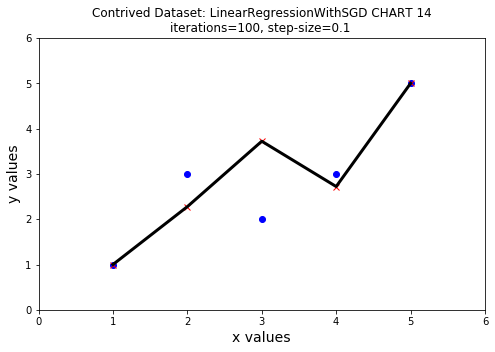

--------------------------------------------------

CHART 15

MSE = 0.5531577879883959
RMSE = 0.7437457818289768
R-squared = 0.6583856252143017
MAE = 0.5117548373639176
Explained variance = 2.0412361716101164
values and prections:  [(1.0, 0.9619533013517383), (2.0, 2.3685406935782796), (3.0, 3.40317911453215), (4.0, 2.4412258131804117), (5.0, 4.809766506758692)]
model intercept =  0.0
model weights:  [0.5173192104769354,0.4446340908748028]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.9619533013517383, 2.3685406935782796, 3.40317911453215, 2.4412258131804117, 4.809766506758692]


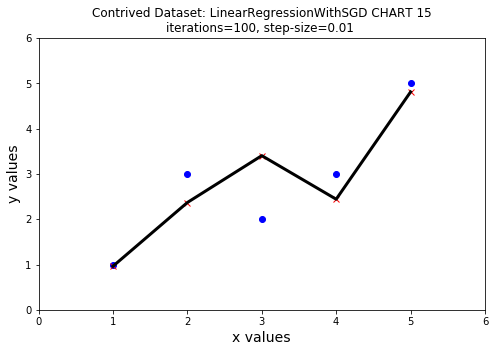

--------------------------------------------------

CHART 16

MSE = 5.4398705102525176
RMSE = 2.332352998637324
R-squared = -29.4868980582139
MAE = 2.071426926845727
Explained variance = 6.290809513261533
values and prections:  [(1.0, 0.31963336066834136), (2.0, 0.7909017655904381), (3.0, 1.12689839841961), (4.0, 0.8072650377512685), (5.0, 1.5981668033417067)]
model intercept =  0.0
model weights:  [0.1679983164145859,0.15163504425375543]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.31963336066834136, 0.7909017655904381, 1.12689839841961, 0.8072650377512685, 1.5981668033417067]


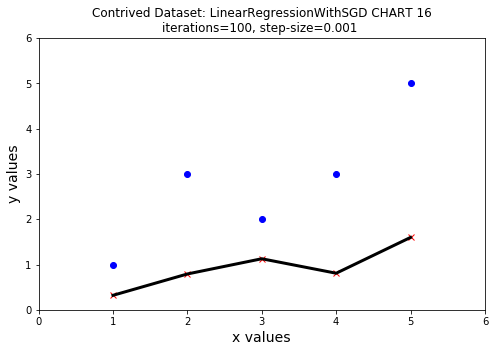

--------------------------------------------------

CHART 17

MSE = 10.903199441123885
RMSE = 3.3019993096794984
R-squared = -282798.76803490135
MAE = 2.9863503860076195
Explained variance = 10.918288628007854
values and prections:  [(1.0, 0.0046988945952927885), (2.0, 0.01163313815807237), (3.0, 0.01656022941368436), (4.0, 0.011861334818391571), (5.0, 0.023494472976463943)]
model intercept =  0.0
model weights:  [0.002463545627805995,0.0022353489674867937]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.0046988945952927885, 0.01163313815807237, 0.01656022941368436, 0.011861334818391571, 0.023494472976463943]


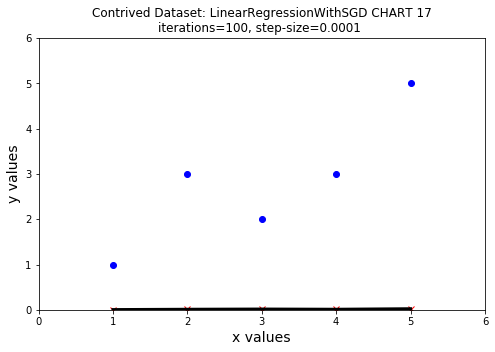

--------------------------------------------------

CHART 18

MSE = 10.999992738652466
RMSE = 3.31662369566589
R-squared = -50939400130919.75
MAE = 2.999998978467388
Explained variance = 10.999993870805373
values and prections:  [(1.0, 3.516639673051399e-07), (2.0, 8.706243848773477e-07), (3.0, 1.239359418953492e-06), (4.0, 8.87695451648352e-07), (5.0, 1.7583198365256997e-06)]
model intercept =  0.0
model weights:  [1.8436751703807211e-07,1.6729645026706783e-07]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [3.516639673051399e-07, 8.706243848773477e-07, 1.239359418953492e-06, 8.87695451648352e-07, 1.7583198365256997e-06]


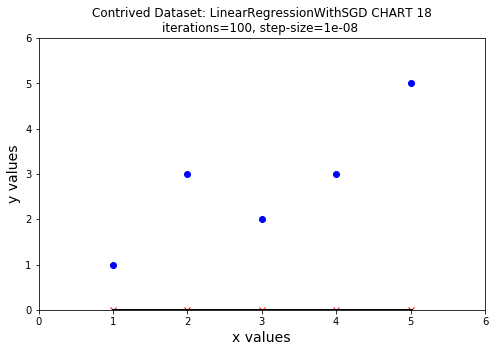

--------------------------------------------------

CHART 19

MSE = 0.3968909721108953
RMSE = 0.6299928349679028
R-squared = 0.7931195532017401
MAE = 0.423063498439178
Explained variance = 2.0032507979645864
values and prections:  [(1.0, 0.9818001663915914), (2.0, 1.9756816758461526), (3.0, 3.9151193225033962), (4.0, 2.933319156111805), (5.0, 4.9090008319579574)]
model intercept =  0.0
model weights:  [0.9697188233286218,0.012081343062969646]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.9818001663915914, 1.9756816758461526, 3.9151193225033962, 2.933319156111805, 4.9090008319579574]


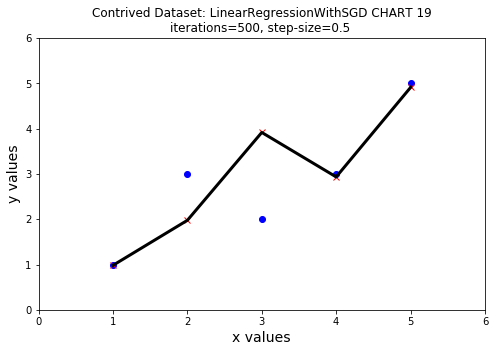

--------------------------------------------------

CHART 20

MSE = 0.44029617806863375
RMSE = 0.6635481731333708
R-squared = 0.7587070574307133
MAE = 0.4526292256390224
Explained variance = 2.003176516647025
values and prections:  [(1.0, 0.9984452628465796), (2.0, 2.2553724424280106), (3.0, 3.7352991346514672), (4.0, 2.736853871804888), (5.0, 4.992226314232898)]
model intercept =  0.0
model weights:  [0.7399633461117283,0.2584819167348513]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.9984452628465796, 2.2553724424280106, 3.7352991346514672, 2.736853871804888, 4.992226314232898]


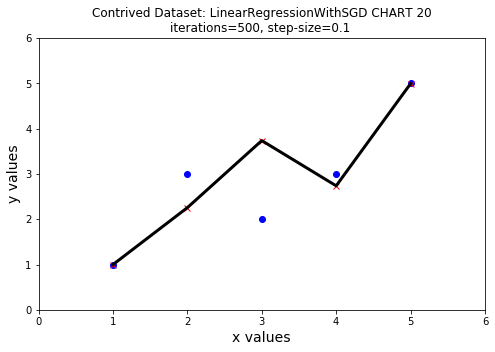

--------------------------------------------------

CHART 21

MSE = 0.5531577879883959
RMSE = 0.7437457818289768
R-squared = 0.6583856252143017
MAE = 0.5117548373639176
Explained variance = 2.0412361716101164
values and prections:  [(1.0, 0.9619533013517383), (2.0, 2.3685406935782796), (3.0, 3.40317911453215), (4.0, 2.4412258131804117), (5.0, 4.809766506758692)]
model intercept =  0.0
model weights:  [0.5173192104769354,0.4446340908748028]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.9619533013517383, 2.3685406935782796, 3.40317911453215, 2.4412258131804117, 4.809766506758692]


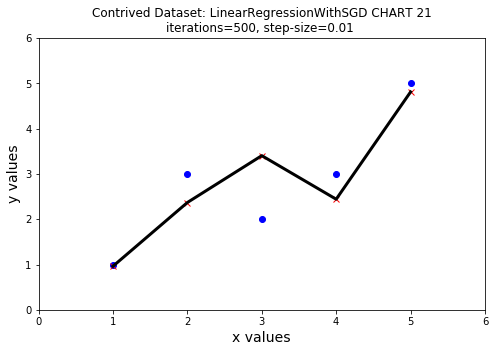

--------------------------------------------------

CHART 22

MSE = 5.420049061380572
RMSE = 2.328099882174425
R-squared = -29.11085817307109
MAE = 2.067350547900752
Explained variance = 6.273938287905539
values and prections:  [(1.0, 0.3210363619610427), (2.0, 0.7943708928414845), (3.0, 1.1318472789247713), (4.0, 0.8108109169637286), (5.0, 1.6051818098052133)]
model intercept =  0.0
model weights:  [0.16873819304164336,0.1522981689193993]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.3210363619610427, 0.7943708928414845, 1.1318472789247713, 0.8108109169637286, 1.6051818098052133]


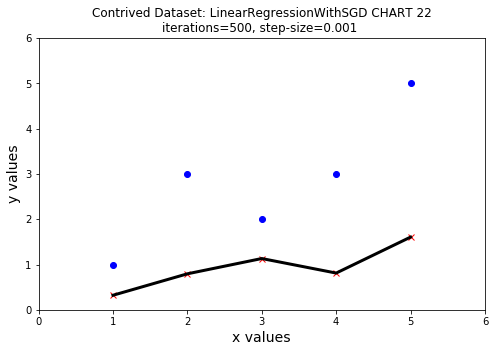

--------------------------------------------------

CHART 23

MSE = 10.903199441123885
RMSE = 3.3019993096794984
R-squared = -282798.76803490135
MAE = 2.9863503860076195
Explained variance = 10.918288628007854
values and prections:  [(1.0, 0.0046988945952927885), (2.0, 0.01163313815807237), (3.0, 0.01656022941368436), (4.0, 0.011861334818391571), (5.0, 0.023494472976463943)]
model intercept =  0.0
model weights:  [0.002463545627805995,0.0022353489674867937]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.0046988945952927885, 0.01163313815807237, 0.01656022941368436, 0.011861334818391571, 0.023494472976463943]


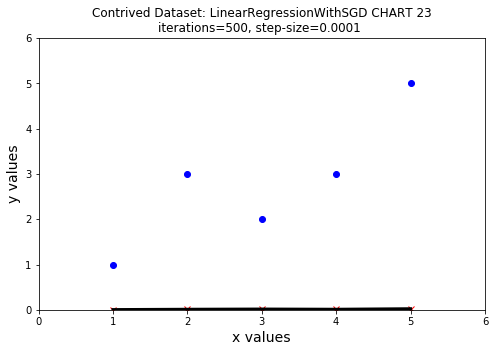

--------------------------------------------------

CHART 24

MSE = 10.999992738652466
RMSE = 3.31662369566589
R-squared = -50939400130919.75
MAE = 2.999998978467388
Explained variance = 10.999993870805373
values and prections:  [(1.0, 3.516639673051399e-07), (2.0, 8.706243848773477e-07), (3.0, 1.239359418953492e-06), (4.0, 8.87695451648352e-07), (5.0, 1.7583198365256997e-06)]
model intercept =  0.0
model weights:  [1.8436751703807211e-07,1.6729645026706783e-07]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [3.516639673051399e-07, 8.706243848773477e-07, 1.239359418953492e-06, 8.87695451648352e-07, 1.7583198365256997e-06]


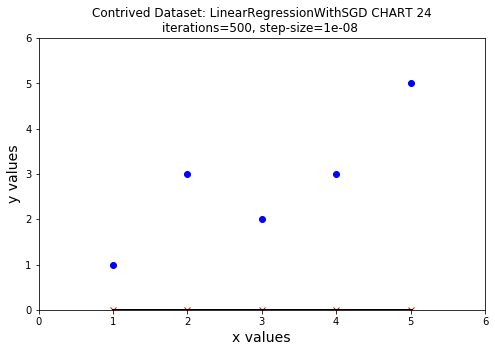

--------------------------------------------------

CHART 25

MSE = 0.3968909721108953
RMSE = 0.6299928349679028
R-squared = 0.7931195532017401
MAE = 0.423063498439178
Explained variance = 2.0032507979645864
values and prections:  [(1.0, 0.9818001663915914), (2.0, 1.9756816758461526), (3.0, 3.9151193225033962), (4.0, 2.933319156111805), (5.0, 4.9090008319579574)]
model intercept =  0.0
model weights:  [0.9697188233286218,0.012081343062969646]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.9818001663915914, 1.9756816758461526, 3.9151193225033962, 2.933319156111805, 4.9090008319579574]


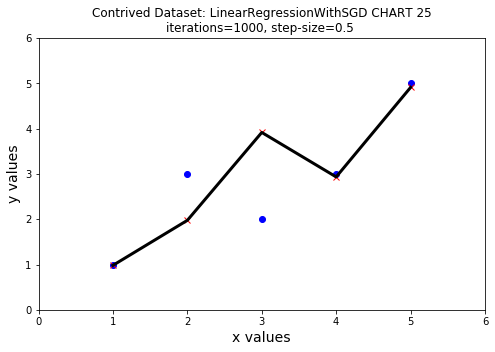

--------------------------------------------------

CHART 26

MSE = 0.44029617806863375
RMSE = 0.6635481731333708
R-squared = 0.7587070574307133
MAE = 0.4526292256390224
Explained variance = 2.003176516647025
values and prections:  [(1.0, 0.9984452628465796), (2.0, 2.2553724424280106), (3.0, 3.7352991346514672), (4.0, 2.736853871804888), (5.0, 4.992226314232898)]
model intercept =  0.0
model weights:  [0.7399633461117283,0.2584819167348513]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.9984452628465796, 2.2553724424280106, 3.7352991346514672, 2.736853871804888, 4.992226314232898]


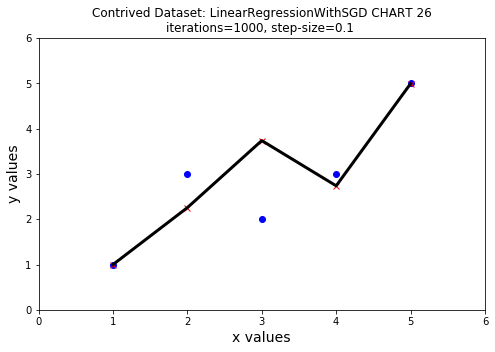

--------------------------------------------------

CHART 27

MSE = 0.5531577879883959
RMSE = 0.7437457818289768
R-squared = 0.6583856252143017
MAE = 0.5117548373639176
Explained variance = 2.0412361716101164
values and prections:  [(1.0, 0.9619533013517383), (2.0, 2.3685406935782796), (3.0, 3.40317911453215), (4.0, 2.4412258131804117), (5.0, 4.809766506758692)]
model intercept =  0.0
model weights:  [0.5173192104769354,0.4446340908748028]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.9619533013517383, 2.3685406935782796, 3.40317911453215, 2.4412258131804117, 4.809766506758692]


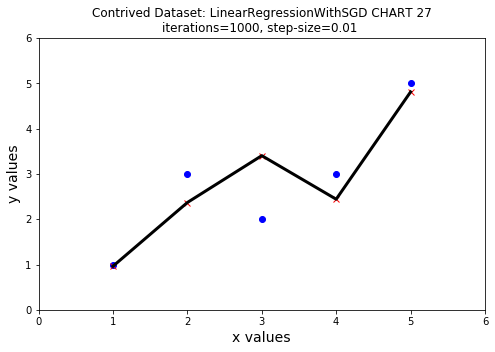

--------------------------------------------------

CHART 28

MSE = 5.420049061380572
RMSE = 2.328099882174425
R-squared = -29.11085817307109
MAE = 2.067350547900752
Explained variance = 6.273938287905539
values and prections:  [(1.0, 0.3210363619610427), (2.0, 0.7943708928414845), (3.0, 1.1318472789247713), (4.0, 0.8108109169637286), (5.0, 1.6051818098052133)]
model intercept =  0.0
model weights:  [0.16873819304164336,0.1522981689193993]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.3210363619610427, 0.7943708928414845, 1.1318472789247713, 0.8108109169637286, 1.6051818098052133]


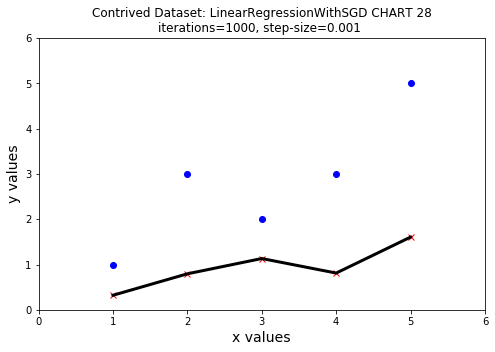

--------------------------------------------------

CHART 29

MSE = 10.903199441123885
RMSE = 3.3019993096794984
R-squared = -282798.76803490135
MAE = 2.9863503860076195
Explained variance = 10.918288628007854
values and prections:  [(1.0, 0.0046988945952927885), (2.0, 0.01163313815807237), (3.0, 0.01656022941368436), (4.0, 0.011861334818391571), (5.0, 0.023494472976463943)]
model intercept =  0.0
model weights:  [0.002463545627805995,0.0022353489674867937]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.0046988945952927885, 0.01163313815807237, 0.01656022941368436, 0.011861334818391571, 0.023494472976463943]


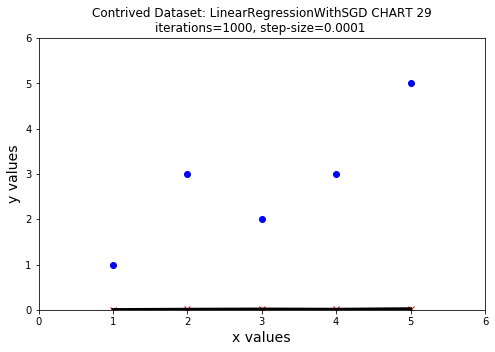

--------------------------------------------------

CHART 30

MSE = 10.999992738652466
RMSE = 3.31662369566589
R-squared = -50939400130919.75
MAE = 2.999998978467388
Explained variance = 10.999993870805373
values and prections:  [(1.0, 3.516639673051399e-07), (2.0, 8.706243848773477e-07), (3.0, 1.239359418953492e-06), (4.0, 8.87695451648352e-07), (5.0, 1.7583198365256997e-06)]
model intercept =  0.0
model weights:  [1.8436751703807211e-07,1.6729645026706783e-07]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [3.516639673051399e-07, 8.706243848773477e-07, 1.239359418953492e-06, 8.87695451648352e-07, 1.7583198365256997e-06]


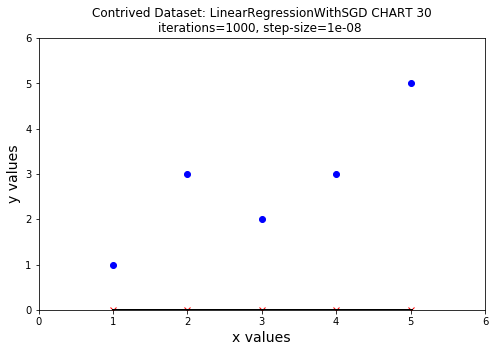

--------------------------------------------------

CHART 31

MSE = 0.3968909721108953
RMSE = 0.6299928349679028
R-squared = 0.7931195532017401
MAE = 0.423063498439178
Explained variance = 2.0032507979645864
values and prections:  [(1.0, 0.9818001663915914), (2.0, 1.9756816758461526), (3.0, 3.9151193225033962), (4.0, 2.933319156111805), (5.0, 4.9090008319579574)]
model intercept =  0.0
model weights:  [0.9697188233286218,0.012081343062969646]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.9818001663915914, 1.9756816758461526, 3.9151193225033962, 2.933319156111805, 4.9090008319579574]


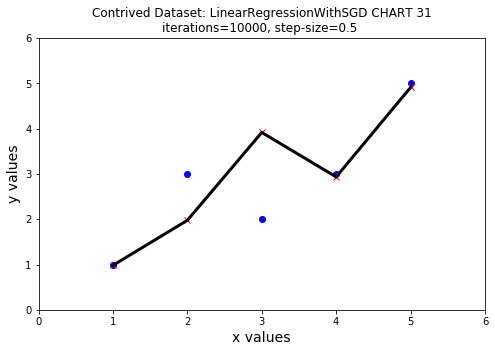

--------------------------------------------------

CHART 32

MSE = 0.44029617806863375
RMSE = 0.6635481731333708
R-squared = 0.7587070574307133
MAE = 0.4526292256390224
Explained variance = 2.003176516647025
values and prections:  [(1.0, 0.9984452628465796), (2.0, 2.2553724424280106), (3.0, 3.7352991346514672), (4.0, 2.736853871804888), (5.0, 4.992226314232898)]
model intercept =  0.0
model weights:  [0.7399633461117283,0.2584819167348513]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.9984452628465796, 2.2553724424280106, 3.7352991346514672, 2.736853871804888, 4.992226314232898]


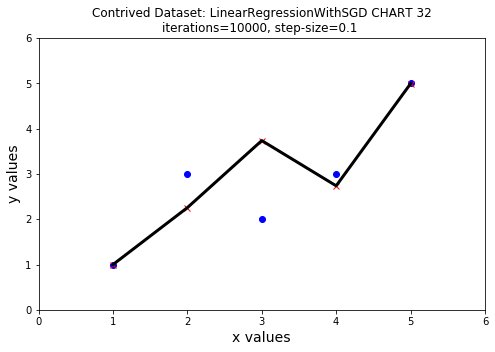

--------------------------------------------------

CHART 33

MSE = 0.5531577879883959
RMSE = 0.7437457818289768
R-squared = 0.6583856252143017
MAE = 0.5117548373639176
Explained variance = 2.0412361716101164
values and prections:  [(1.0, 0.9619533013517383), (2.0, 2.3685406935782796), (3.0, 3.40317911453215), (4.0, 2.4412258131804117), (5.0, 4.809766506758692)]
model intercept =  0.0
model weights:  [0.5173192104769354,0.4446340908748028]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.9619533013517383, 2.3685406935782796, 3.40317911453215, 2.4412258131804117, 4.809766506758692]


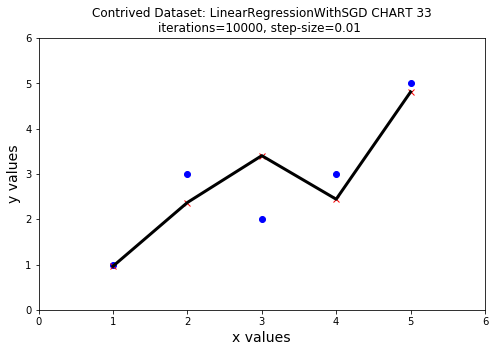

--------------------------------------------------

CHART 34

MSE = 5.420049061380572
RMSE = 2.328099882174425
R-squared = -29.11085817307109
MAE = 2.067350547900752
Explained variance = 6.273938287905539
values and prections:  [(1.0, 0.3210363619610427), (2.0, 0.7943708928414845), (3.0, 1.1318472789247713), (4.0, 0.8108109169637286), (5.0, 1.6051818098052133)]
model intercept =  0.0
model weights:  [0.16873819304164336,0.1522981689193993]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.3210363619610427, 0.7943708928414845, 1.1318472789247713, 0.8108109169637286, 1.6051818098052133]


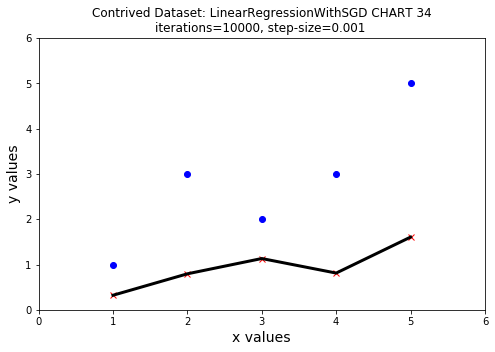

--------------------------------------------------

CHART 35

MSE = 10.903199441123885
RMSE = 3.3019993096794984
R-squared = -282798.76803490135
MAE = 2.9863503860076195
Explained variance = 10.918288628007854
values and prections:  [(1.0, 0.0046988945952927885), (2.0, 0.01163313815807237), (3.0, 0.01656022941368436), (4.0, 0.011861334818391571), (5.0, 0.023494472976463943)]
model intercept =  0.0
model weights:  [0.002463545627805995,0.0022353489674867937]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [0.0046988945952927885, 0.01163313815807237, 0.01656022941368436, 0.011861334818391571, 0.023494472976463943]


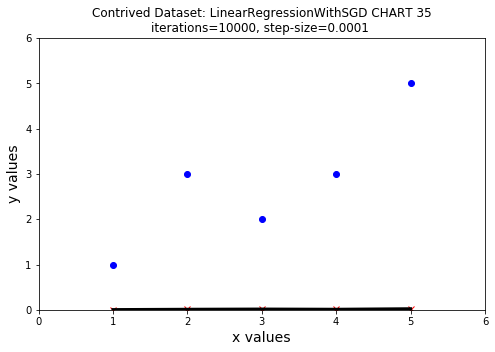

--------------------------------------------------

CHART 36

MSE = 10.999992738652466
RMSE = 3.31662369566589
R-squared = -50939400130919.75
MAE = 2.999998978467388
Explained variance = 10.999993870805373
values and prections:  [(1.0, 3.516639673051399e-07), (2.0, 8.706243848773477e-07), (3.0, 1.239359418953492e-06), (4.0, 8.87695451648352e-07), (5.0, 1.7583198365256997e-06)]
model intercept =  0.0
model weights:  [1.8436751703807211e-07,1.6729645026706783e-07]
xs =  [1, 2, 4, 3, 5]
ys =  [1, 3, 3, 2, 5]
x_labels =  [1.0, 2.0, 3.0, 4.0, 5.0]
y_preds =  [3.516639673051399e-07, 8.706243848773477e-07, 1.239359418953492e-06, 8.87695451648352e-07, 1.7583198365256997e-06]


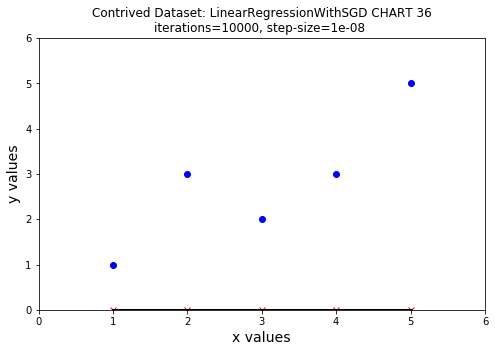

In [9]:

from pyspark.mllib.evaluation import RegressionMetrics

# Load and parse the data from a text file
def parsePoint(line):
    values = [float(x) for x in line.replace(',', ' ').split(' ')]
    return LabeledPoint(values[0], values[1:])
#data = sc.textFile("./lpsa.data")
#parsedData = data.map(parsePoint)



# Convert our data into an RDD of LabeledPoints
counter = 1
dataset3 = []
for d in dataset:
    d3 = LabeledPoint(int(counter), [d[0]] + list(d[1:]))
    dataset3.append(d3)
    counter += 1  

#dataRDD = sc.parallelize([LabeledPoint(1, [1,1]), LabeledPoint(2, [2,3])])
dataRDD = sc.parallelize(dataset3)

counter = 1
for i in (1, 10, 100, 500, 1000, 10000):
    for s in (0.5, 0.1, 0.01, 0.001, 0.0001, 0.00000001):
        # Build the model
        #model = LinearRegressionWithSGD.train(parsedData, iterations=100, step=0.00000001)
        model = LinearRegressionWithSGD.train(dataRDD, iterations=i, step=s)

        # Evaluate the model on training data
        valuesAndPreds = dataRDD.map(lambda p: (p.label, float(model.predict(p.features))))

        # Instantiate metrics object
        metrics = RegressionMetrics(valuesAndPreds)

        # Print header
        print("--------------------------------------------------\n")
        print("CHART " + str(counter) + "\n")
    
        # Squared Error
        print("MSE = %s" % metrics.meanSquaredError)
        print("RMSE = %s" % metrics.rootMeanSquaredError)

        # R-squared
        print("R-squared = %s" % metrics.r2)

        # Mean absolute error
        print("MAE = %s" % metrics.meanAbsoluteError)

        # Explained variance
        print("Explained variance = %s" % metrics.explainedVariance)

        print("values and prections: ", valuesAndPreds.collect())

        print("model intercept = ", model.intercept)
        print("model weights: ", model.weights)

        paramStr = "iterations="+str(i)+", step-size="+str(s)+" "
    
        plotData(valuesAndPreds, "Contrived Dataset: LinearRegressionWithSGD CHART " + str(counter) + "\n" + paramStr)
        
        counter += 1


If you look at the Apache Spark [LinearRegression](https://github.com/apache/spark/blob/v2.3.2/mllib/src/main/scala/org/apache/spark/mllib/regression/LinearRegression.scala "LinearRegression") source code, you will see that it does not actually define any class called <tt>LinearRegression</tt>. In fact, a look at the [Spark documentation](https://spark.apache.org/docs/latest/api/scala/index.html#org.apache.spark.mllib.regression.package "Spark documentation") reveals that there is no <tt>LinearRegression</tt> class defined at all in Spark and the algorithm seems to be implemented in the more general <tt>GeneralizedLinearModel</tt> ([GLM](https://spark.apache.org/docs/latest/api/scala/index.html#org.apache.spark.mllib.regression.GeneralizedLinearAlgorithm "GLM")) class. Upon further investigation a <tt>LinearRegression</tt> class can be found defined in PySpark [here](http://spark.apache.org/docs/2.3.2/api/python/_modules/pyspark/ml/regression.html "here").
    

In [10]:
# Stop the session
spark.stop()

### 3. Summary